In [1]:
import pandas as pd

In [2]:
import pandas as pd

# Load Excel file
df = pd.read_excel("/Users/farzammanafzadeh/Desktop/Uefa Task/task for UEFA shortlist 2025.xlsx")

# Save to CSV
df.to_csv("/Users/farzammanafzadeh/Desktop/Uefa Task/uefa_task_2025.csv", index=False)

In [3]:
pd.set_option('display.max_columns', None)  # Show all columns

In [4]:
df = pd.read_csv("/Users/farzammanafzadeh/Desktop/Uefa Task/uefa_task_2025.csv")

In [5]:
df.drop(columns=['Unnamed: 0'], inplace=True)  # Drop the unnamed column if it exists

In [6]:
df["home team"].unique()

array(['Unidentified', 'Not suspicious', 'Suspicious'], dtype=object)

In [7]:
df['Relative quality'].unique()

array(['Away team stronger', 'Equal strength teams', 'Home team stronger'],
      dtype=object)

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5170 entries, 0 to 5169
Data columns (total 27 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   PPDA_H_Int1       5170 non-null   float64
 1   PPDA_H_Int2       5170 non-null   float64
 2   PPDA_H_Int3       5170 non-null   float64
 3   PPDA_H_Int4       5170 non-null   float64
 4   PPDA_H_Int5       5170 non-null   float64
 5   PPDA_H_Int6       5170 non-null   float64
 6   PPDA_A_Int1       5170 non-null   float64
 7   PPDA_A_Int2       5170 non-null   float64
 8   PPDA_A_Int3       5170 non-null   float64
 9   PPDA_A_Int4       5170 non-null   float64
 10  PPDA_A_Int5       5170 non-null   float64
 11  PPDA_A_Int6       5170 non-null   float64
 12  home team         5170 non-null   object 
 13  away team         5170 non-null   object 
 14  Relative quality  5170 non-null   object 
 15  xG_H_Int1         5170 non-null   float64
 16  xG_H_Int2         5170 non-null   float64


In [9]:
import numpy as np

# Normalize team names and relative quality strings for consistency (lowercase + no leading/trailing spaces)
df['home team'] = df['home team'].str.lower().str.strip()
df['away team'] = df['away team'].str.lower().str.strip()
df['Relative quality'] = df['Relative quality'].str.lower().str.strip()

# 1. Compute average PPDA (passes per defensive action) per half for both teams
df['PPDA_H_1stHalf'] = df[['PPDA_H_Int1', 'PPDA_H_Int2', 'PPDA_H_Int3']].mean(axis=1).round(2)
df['PPDA_H_2ndHalf'] = df[['PPDA_H_Int4', 'PPDA_H_Int5', 'PPDA_H_Int6']].mean(axis=1).round(2)
df['PPDA_A_1stHalf'] = df[['PPDA_A_Int1', 'PPDA_A_Int2', 'PPDA_A_Int3']].mean(axis=1).round(2)
df['PPDA_A_2ndHalf'] = df[['PPDA_A_Int4', 'PPDA_A_Int5', 'PPDA_A_Int6']].mean(axis=1).round(2)

# 2. Calculate xG (expected goals) sums per half and total for both teams
df['xG_H_1stHalf'] = df[['xG_H_Int1', 'xG_H_Int2', 'xG_H_Int3']].sum(axis=1).round(2)
df['xG_H_2ndHalf'] = df[['xG_H_Int4', 'xG_H_Int5', 'xG_H_Int6']].sum(axis=1).round(2)
df['xG_A_1stHalf'] = df[['xG_A_Int1', 'xG_A_Int2', 'xG_A_Int3']].sum(axis=1).round(2)
df['xG_A_2ndHalf'] = df[['xG_A_Int4', 'xG_A_Int5', 'xG_A_Int6']].sum(axis=1).round(2)

df['xG_H_Total'] = (df['xG_H_1stHalf'] + df['xG_H_2ndHalf']).round(2)
df['xG_A_Total'] = (df['xG_A_1stHalf'] + df['xG_A_2ndHalf']).round(2)

# Full match PPDA (average over all 6 intervals)
df['PPDA_H_Total'] = df[['PPDA_H_Int1','PPDA_H_Int2','PPDA_H_Int3','PPDA_H_Int4','PPDA_H_Int5','PPDA_H_Int6']].mean(axis=1).round(2)
df['PPDA_A_Total'] = df[['PPDA_A_Int1','PPDA_A_Int2','PPDA_A_Int3','PPDA_A_Int4','PPDA_A_Int5','PPDA_A_Int6']].mean(axis=1).round(2)

# 3. Binary flags for suspicious, not suspicious, or unidentified teams
df['HomeTeamFlagged'] = (df['home team'] != 'unidentified').astype(int)
df['AwayTeamFlagged'] = (df['away team'] != 'unidentified').astype(int)
df['HomeTeamSuspicious'] = (df['home team'] == 'suspicious').astype(int)
df['AwayTeamSuspicious'] = (df['away team'] == 'suspicious').astype(int)
df['HomeTeamNotSuspicious'] = (df['home team'] == 'not suspicious').astype(int)
df['AwayTeamNotSuspicious'] = (df['away team'] == 'not suspicious').astype(int)

# 4. Classify overall match suspicion type based on both teams
def classify_match(row):
    if row['home team'] == 'suspicious' and row['away team'] == 'suspicious':
        return 'both suspicious'
    elif row['home team'] == 'suspicious':
        return 'home suspicious'
    elif row['away team'] == 'suspicious':
        return 'away suspicious'
    elif row['home team'] == 'not suspicious' and row['away team'] == 'not suspicious':
        return 'both not suspicious'
    else:
        return 'unidentified'
df['MatchSuspicionType'] = df.apply(classify_match, axis=1)

# 5. xG Differences (total and half-wise)
df['xG_Diff_Total'] = (df['xG_H_Total'] - df['xG_A_Total']).round(2)
df['xG_Diff_1stHalf'] = (df['xG_H_1stHalf'] - df['xG_A_1stHalf']).round(2)
df['xG_Diff_2ndHalf'] = (df['xG_H_2ndHalf'] - df['xG_A_2ndHalf']).round(2)

# 6. PPDA changes between halves (absolute and percentage)
df['PPDA_H_Change'] = (df['PPDA_H_2ndHalf'] - df['PPDA_H_1stHalf']).round(2)
df['PPDA_A_Change'] = (df['PPDA_A_2ndHalf'] - df['PPDA_A_1stHalf']).round(2)
df['PPDA_H_ChangePct'] = (df['PPDA_H_Change'] / df['PPDA_H_1stHalf']).round(2) *100
df['PPDA_A_ChangePct'] = (df['PPDA_A_Change'] / df['PPDA_A_1stHalf']).round(2) *100

# Binary flags if PPDA increases in 2nd half (pressing intensity drops)
df['HomePressingDrop'] = (df['PPDA_H_Change'] > 0).astype(int)
df['AwayPressingDrop'] = (df['PPDA_A_Change'] > 0).astype(int)

# xG changes and % change between halves
df['xG_H_Change'] = (df['xG_H_2ndHalf'] - df['xG_H_1stHalf']).round(2)
df['xG_A_Change'] = (df['xG_A_2ndHalf'] - df['xG_A_1stHalf']).round(2)

df['xG_H_ChangePct'] = np.where(
    df['xG_H_1stHalf'] != 0,
    (df['xG_H_Change'] / df['xG_H_1stHalf']).round(4) * 100,
    np.nan
)

df['xG_A_ChangePct'] = np.where(
    df['xG_A_1stHalf'] != 0,
    (df['xG_A_Change'] / df['xG_A_1stHalf']).round(4) * 100,
    np.nan
)

# Binary flags if attacking output (xG) drops in 2nd half
df['HomeAttackingDrop'] = (df['xG_H_Change'] < 0).astype(int)
df['AwayAttackingDrop'] = (df['xG_A_Change'] < 0).astype(int)

# 8. Identify stronger team xG and difference based on relative quality
df['StrongerTeam_xG'] = df.apply(lambda row:
    row['xG_H_Total'] if row['Relative quality'] == 'home team stronger' else
    row['xG_A_Total'] if row['Relative quality'] == 'away team stronger' else
    np.nan, axis=1)

df['StrongerTeam_xG_Diff'] = df.apply(lambda row:
    row['xG_H_Total'] - row['xG_A_Total'] if row['Relative quality'] == 'home team stronger' else
    row['xG_A_Total'] - row['xG_H_Total'] if row['Relative quality'] == 'away team stronger' else
    np.nan, axis=1).round(2)

# 9–10. xG values grouped by game intervals (Early: 1&4, Mid: 2&5, Late: 3&6)
df['xG_H_Early'] = (df['xG_H_Int1'] + df['xG_H_Int4']).round(2)
df['xG_A_Early'] = (df['xG_A_Int1'] + df['xG_A_Int4']).round(2)

df['xG_H_Late'] = (df['xG_H_Int3'] + df['xG_H_Int6']).round(2)
df['xG_A_Late'] = (df['xG_A_Int3'] + df['xG_A_Int6']).round(2)

df['xG_H_Mid'] = (df['xG_H_Int2'] + df['xG_H_Int5']).round(2)
df['xG_A_Mid'] = (df['xG_A_Int2'] + df['xG_A_Int5']).round(2)

# 10. PPDA grouped by phase intervals
df['PPDA_H_Early'] = df[['PPDA_H_Int1', 'PPDA_H_Int4']].mean(axis=1).round(2)
df['PPDA_A_Early'] = df[['PPDA_A_Int1', 'PPDA_A_Int4']].mean(axis=1).round(2)

df['PPDA_H_Mid']   = df[['PPDA_H_Int2', 'PPDA_H_Int5']].mean(axis=1).round(2)
df['PPDA_A_Mid']   = df[['PPDA_A_Int2', 'PPDA_A_Int5']].mean(axis=1).round(2)

df['PPDA_H_Late'] = df[['PPDA_H_Int3', 'PPDA_H_Int6']].mean(axis=1).round(2)
df['PPDA_A_Late'] = df[['PPDA_A_Int3', 'PPDA_A_Int6']].mean(axis=1).round(2)

# 11. xG-to-PPDA efficiency (ratio of attacking output to pressing resistance)
df['xG_H_to_PPDA'] = (df['xG_H_Total'] / ((df['PPDA_H_1stHalf'] + df['PPDA_H_2ndHalf']) / 2)).round(2)
df['xG_A_to_PPDA'] = (df['xG_A_Total'] / ((df['PPDA_A_1stHalf'] + df['PPDA_A_2ndHalf']) / 2)).round(2)



# Total absolute change in xG across 6 intervals (home and away)
df['xG_H_TotalChange'] = (
    df[['xG_H_Int1', 'xG_H_Int2', 'xG_H_Int3', 'xG_H_Int4', 'xG_H_Int5', 'xG_H_Int6']]
    .diff(axis=1)
    .abs()
    .sum(axis=1)
    .round(2)
)

df['xG_A_TotalChange'] = (
    df[['xG_A_Int1', 'xG_A_Int2', 'xG_A_Int3', 'xG_A_Int4', 'xG_A_Int5', 'xG_A_Int6']]
    .diff(axis=1)
    .abs()
    .sum(axis=1)
    .round(2)
)

# Total absolute change in PPDA across 6 intervals (home and away)
df['PPDA_H_TotalChange'] = (
    df[['PPDA_H_Int1', 'PPDA_H_Int2', 'PPDA_H_Int3', 'PPDA_H_Int4', 'PPDA_H_Int5', 'PPDA_H_Int6']]
    .diff(axis=1)
    .abs()
    .sum(axis=1)
    .round(2)
)

df['PPDA_A_TotalChange'] = (
    df[['PPDA_A_Int1', 'PPDA_A_Int2', 'PPDA_A_Int3', 'PPDA_A_Int4', 'PPDA_A_Int5', 'PPDA_A_Int6']]
    .diff(axis=1)
    .abs()
    .sum(axis=1)
    .round(2)
)

df = df.drop(columns=[
    "HomeTeamFlagged",
    "AwayTeamFlagged",
    "HomeTeamSuspicious",
    "AwayTeamSuspicious",
    "HomeTeamNotSuspicious",
    "AwayTeamNotSuspicious",
    "PPDA_A_ChangePct",
    "PPDA_H_ChangePct",

    
])

In [10]:
df.head()

,PPDA_H_Int1,PPDA_H_Int2,PPDA_H_Int3,PPDA_H_Int4,PPDA_H_Int5,PPDA_H_Int6,PPDA_A_Int1,PPDA_A_Int2,PPDA_A_Int3,PPDA_A_Int4,PPDA_A_Int5,PPDA_A_Int6,home team,away team,Relative quality,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,MatchSuspicionType,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,HomePressingDrop,AwayPressingDrop,xG_H_Change,xG_A_Change,xG_H_ChangePct,xG_A_ChangePct,HomeAttackingDrop,AwayAttackingDrop,StrongerTeam_xG,StrongerTeam_xG_Diff,xG_H_Early,xG_A_Early,xG_H_Late,xG_A_Late,xG_H_Mid,xG_A_Mid,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
0,19.67,4.00,5.38,3.71,4.45,4.33,15.60,11.00,11.00,20.00,19.67,6.25,unidentified,unidentified,away team stronger,0.31,0.00,0.16,0.94,0.00,0.03,0.14,0.00,0.00,0.14,0.09,0.00,9.68,4.16,12.53,15.31,0.47,0.97,0.14,0.23,1.44,0.37,6.92,13.92,unidentified,1.07,0.33,0.74,-5.52,2.78,0,1,0.50,0.09,106.38,64.29,0,0,0.37,-1.07,1.25,0.28,0.19,0.00,0.00,0.09,11.69,17.80,4.22,15.34,4.86,8.62,0.21,0.03,2.22,0.42,19.58,27.35
1,12.50,24.00,3.80,12.67,30.00,8.67,2.67,4.00,21.00,3.00,5.25,2.75,unidentified,unidentified,equal strength teams,0.22,0.05,0.02,0.20,0.00,0.00,0.14,0.00,0.07,0.07,0.00,0.10,13.43,17.11,9.22,3.67,0.29,0.20,0.21,0.17,0.49,0.38,15.27,6.44,unidentified,0.11,0.08,0.03,3.68,-5.55,1,0,-0.09,-0.04,-31.03,-19.05,1,1,NaN,NaN,0.42,0.21,0.02,0.17,0.05,0.00,12.58,2.84,27.00,4.62,6.24,11.88,0.03,0.06,0.58,0.38,79.23,41.08
2,8.00,15.80,60.00,21.00,8.50,9.50,12.33,4.60,5.11,4.33,5.00,3.36,unidentified,unidentified,equal strength teams,0.70,0.00,0.16,0.13,0.06,0.00,0.00,0.02,0.15,0.08,0.67,0.27,27.93,13.00,7.35,4.23,0.86,0.19,0.17,1.02,1.05,1.19,20.47,5.79,unidentified,-0.14,0.69,-0.83,-14.93,-3.12,0,0,-0.67,0.85,-77.91,500.00,1,0,NaN,NaN,0.83,0.08,0.16,0.42,0.06,0.69,14.50,8.33,12.15,4.80,34.75,4.24,0.05,0.21,1.02,1.21,104.50,11.33
3,6.88,10.00,8.33,9.75,19.00,14.33,7.00,8.25,3.00,4.50,7.20,16.33,unidentified,unidentified,away team stronger,0.00,0.31,0.00,0.00,0.10,0.00,0.04,0.00,0.36,0.77,0.41,0.76,8.40,14.36,6.08,9.34,0.31,0.10,0.40,1.94,0.41,2.34,11.38,7.71,unidentified,-1.93,-0.09,-1.84,5.96,3.26,1,1,-0.21,1.54,-67.74,385.00,1,0,2.34,1.93,0.00,0.81,0.00,1.12,0.41,0.41,8.32,5.75,14.50,7.72,11.33,9.66,0.04,0.30,0.82,1.52,20.13,19.83
4,2.88,3.33,2.40,3.30,3.20,7.00,10.25,5.00,7.33,8.33,5.60,25.67,unidentified,unidentified,equal strength teams,0.24,0.84,0.52,0.29,0.08,0.68,0.04,0.00,0.07,0.05,0.00,0.00,2.87,4.50,7.53,13.20,1.60,1.05,0.11,0.05,2.65,0.16,3.68,10.36,unidentified,2.49,1.49,1.00,1.63,5.67,1,1,-0.55,-0.06,-34.38,-54.55,1,1,NaN,NaN,0.53,0.09,1.20,0.07,0.92,0.00,3.09,9.29,3.26,5.30,4.70,16.50,0.72,0.02,1.96,0.18,6.18,31.38


In [11]:
df = df.dropna(axis=1)

In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5170 entries, 0 to 5169
Data columns (total 69 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   PPDA_H_Int1         5170 non-null   float64
 1   PPDA_H_Int2         5170 non-null   float64
 2   PPDA_H_Int3         5170 non-null   float64
 3   PPDA_H_Int4         5170 non-null   float64
 4   PPDA_H_Int5         5170 non-null   float64
 5   PPDA_H_Int6         5170 non-null   float64
 6   PPDA_A_Int1         5170 non-null   float64
 7   PPDA_A_Int2         5170 non-null   float64
 8   PPDA_A_Int3         5170 non-null   float64
 9   PPDA_A_Int4         5170 non-null   float64
 10  PPDA_A_Int5         5170 non-null   float64
 11  PPDA_A_Int6         5170 non-null   float64
 12  home team           5170 non-null   object 
 13  away team           5170 non-null   object 
 14  Relative quality    5170 non-null   object 
 15  xG_H_Int1           5170 non-null   float64
 16  xG_H_I

In [13]:
# Count the frequency of each match suspicion type
suspicion_counts = df['MatchSuspicionType'].value_counts()
print(suspicion_counts)

MatchSuspicionType
unidentified           5082
both not suspicious      51
away suspicious          18
home suspicious          15
both suspicious           4
Name: count, dtype: int64


In [14]:
# Count the frequency of each match suspicion type
suspicion_counts = df['Relative quality'].value_counts()
print(suspicion_counts)

Relative quality
home team stronger      1772
away team stronger      1752
equal strength teams    1646
Name: count, dtype: int64


In [15]:
# =============================================================
# Summary by MatchSuspicionType
#  1) mean of all requested numeric metrics
#  2) count of each Relative-quality category within the group
# =============================================================

# --- 1. list of numeric columns to average -----------------------------------
num_cols = [
    # early / mid / late xG & PPDA
    'xG_H_Early','xG_A_Early','xG_H_Mid','xG_A_Mid','xG_H_Late','xG_A_Late',
    'PPDA_H_Early','PPDA_A_Early','PPDA_H_Mid','PPDA_A_Mid','PPDA_H_Late','PPDA_A_Late',
    'xG_H_to_PPDA','xG_A_to_PPDA',
    # change metrics
    'xG_H_Change','xG_A_Change',
    'xG_Diff_Total','xG_Diff_1stHalf','xG_Diff_2ndHalf',
    'PPDA_H_Change','PPDA_A_Change',
    # interval-level raw features
    'xG_H_Int1','xG_H_Int2','xG_H_Int3','xG_H_Int4','xG_H_Int5','xG_H_Int6',
    'xG_A_Int1','xG_A_Int2','xG_A_Int3','xG_A_Int4','xG_A_Int5','xG_A_Int6',
    'PPDA_H_1stHalf','PPDA_H_2ndHalf','PPDA_A_1stHalf','PPDA_A_2ndHalf',
    'xG_H_1stHalf','xG_H_2ndHalf','xG_A_1stHalf','xG_A_2ndHalf',
    'xG_H_Total','xG_A_Total','PPDA_H_Total','PPDA_A_Total',
    'xG_H_TotalChange',	'xG_A_TotalChange',	'PPDA_H_TotalChange',	'PPDA_A_TotalChange'
    
]

# ensure all columns exist
missing = [c for c in num_cols if c not in df.columns]
assert not missing, f"Missing numeric columns: {missing}"

# --- 2. mean table -----------------------------------------------------------
mean_table = (
    df.groupby('MatchSuspicionType')[num_cols]
      .mean()
      .round(2)
      .sort_index()
)

print("=== Mean values by MatchSuspicionType ===")
display(mean_table)

# --- 3. counts of Relative quality within each suspicion type ---------------
rel_quality_table = (
    df.groupby(['MatchSuspicionType','Relative quality'])
      .size()
      .unstack(fill_value=0)
      .loc[mean_table.index]   # align order
)

print("\n=== Relative-quality counts within each MatchSuspicionType ===")
display(rel_quality_table)

=== Mean values by MatchSuspicionType ===


,xG_H_Early,xG_A_Early,xG_H_Mid,xG_A_Mid,xG_H_Late,xG_A_Late,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_Change,xG_A_Change,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
MatchSuspicionType,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
away suspicious,0.45,0.16,0.57,0.35,0.73,0.31,11.11,18.07,14.17,16.52,15.52,20.24,0.16,0.06,0.03,0.13,0.93,0.52,0.42,-1.12,-1.69,0.26,0.18,0.42,0.18,0.39,0.32,0.06,0.13,0.15,0.10,0.22,0.17,14.16,13.04,19.12,17.43,0.86,0.89,0.34,0.48,1.76,0.82,13.60,18.28,1.78,0.83,48.35,58.14
both not suspicious,0.34,0.37,0.36,0.36,0.73,0.62,10.09,12.28,12.83,11.57,10.42,10.60,0.17,0.15,-0.01,0.12,0.07,0.10,-0.03,-0.38,-0.76,0.18,0.18,0.36,0.16,0.18,0.38,0.15,0.15,0.32,0.22,0.21,0.30,11.30,10.92,11.86,11.11,0.72,0.71,0.62,0.74,1.43,1.36,11.11,11.49,1.55,1.35,37.63,35.08
both suspicious,0.26,0.35,0.07,0.46,0.12,0.34,17.70,13.47,21.06,13.18,23.83,11.15,0.03,0.12,0.23,0.03,-0.71,-0.46,-0.25,9.17,-2.27,0.00,0.02,0.09,0.25,0.05,0.04,0.22,0.30,0.05,0.14,0.16,0.29,16.28,25.45,13.73,11.46,0.11,0.34,0.57,0.59,0.45,1.16,20.86,12.60,0.75,1.15,74.92,42.98
home suspicious,0.34,0.46,0.37,0.60,0.27,1.21,20.17,12.71,14.98,11.41,14.59,12.48,0.08,0.22,0.13,0.28,-1.29,-0.57,-0.72,-2.96,4.90,0.14,0.20,0.09,0.20,0.17,0.18,0.17,0.19,0.63,0.29,0.41,0.58,18.06,15.10,9.75,14.65,0.43,0.56,0.99,1.27,0.98,2.27,16.58,12.20,0.98,2.40,59.89,41.91
unidentified,0.37,0.31,0.42,0.37,0.61,0.52,11.76,13.53,11.65,13.17,10.54,11.42,0.16,0.13,0.17,0.17,0.21,0.10,0.11,-1.15,-1.63,0.16,0.19,0.26,0.21,0.23,0.35,0.13,0.17,0.21,0.17,0.20,0.30,11.89,10.74,13.52,11.89,0.62,0.79,0.51,0.68,1.40,1.19,11.31,12.71,1.36,1.22,38.47,43.93



=== Relative-quality counts within each MatchSuspicionType ===


Relative quality,away team stronger,equal strength teams,home team stronger
MatchSuspicionType,,,
away suspicious,1,6,11
both not suspicious,18,17,16
both suspicious,4,0,0
home suspicious,9,3,3
unidentified,1720,1620,1742


In [16]:
# ============================================================
# One table per MatchSuspicionType — mean metrics by strength
# ============================================================

susp_types = df['MatchSuspicionType'].unique()

mean_tables = {}  # dict to store each table

for s in susp_types:
    tbl = (
        df[df['MatchSuspicionType'] == s]
          .groupby('Relative quality')[num_cols]
          .mean()
          .round(2)
    )
    mean_tables[s] = tbl
    print(f'\n===== {s.upper()} =====')
    display(tbl)


===== UNIDENTIFIED =====


,xG_H_Early,xG_A_Early,xG_H_Mid,xG_A_Mid,xG_H_Late,xG_A_Late,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_Change,xG_A_Change,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
Relative quality,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
away team stronger,0.27,0.40,0.30,0.48,0.44,0.66,13.94,10.81,13.46,10.89,12.08,9.54,0.10,0.18,0.13,0.20,-0.53,-0.23,-0.30,-2.11,-0.44,0.11,0.14,0.19,0.16,0.16,0.26,0.17,0.22,0.28,0.23,0.26,0.38,14.22,12.10,10.63,10.19,0.44,0.57,0.67,0.87,1.01,1.54,13.16,10.41,1.08,1.48,44.56,34.62
equal strength teams,0.36,0.29,0.42,0.36,0.60,0.50,11.47,13.01,11.64,12.68,10.50,11.37,0.16,0.12,0.15,0.16,0.23,0.12,0.11,-1.33,-1.99,0.16,0.19,0.26,0.20,0.22,0.34,0.13,0.16,0.20,0.16,0.20,0.29,11.87,10.54,13.35,11.36,0.61,0.77,0.49,0.66,1.38,1.15,11.20,12.35,1.38,1.19,38.84,42.97
home team stronger,0.49,0.23,0.54,0.27,0.78,0.39,9.86,16.71,9.87,15.88,9.05,13.32,0.23,0.08,0.24,0.14,0.93,0.41,0.51,-0.01,-2.46,0.22,0.24,0.33,0.27,0.30,0.45,0.09,0.12,0.16,0.13,0.15,0.23,9.60,9.59,16.53,14.08,0.79,1.03,0.38,0.51,1.82,0.89,9.59,15.30,1.63,0.98,32.10,54.02



===== BOTH NOT SUSPICIOUS =====


,xG_H_Early,xG_A_Early,xG_H_Mid,xG_A_Mid,xG_H_Late,xG_A_Late,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_Change,xG_A_Change,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
Relative quality,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
away team stronger,0.24,0.48,0.34,0.37,0.45,0.86,13.39,13.20,15.98,10.72,14.02,10.52,0.09,0.17,0.11,0.09,-0.68,-0.35,-0.33,0.99,-0.08,0.11,0.22,0.13,0.13,0.12,0.32,0.17,0.15,0.49,0.30,0.22,0.38,13.97,14.96,11.52,11.44,0.46,0.57,0.81,0.90,1.03,1.71,14.47,11.48,1.28,1.51,53.04,33.65
equal strength teams,0.32,0.42,0.28,0.49,0.71,0.52,7.97,10.46,13.15,8.00,9.57,7.59,0.14,0.19,-0.21,0.11,-0.13,0.10,-0.22,-1.63,-2.35,0.22,0.13,0.42,0.10,0.15,0.29,0.19,0.22,0.26,0.24,0.27,0.26,11.05,9.42,9.86,7.51,0.76,0.55,0.67,0.77,1.31,1.44,10.23,8.69,1.39,1.48,37.45,23.77
home team stronger,0.48,0.20,0.46,0.22,1.07,0.46,8.63,13.18,8.94,16.34,7.28,13.90,0.28,0.08,0.07,0.16,1.13,0.61,0.52,-0.60,0.17,0.23,0.20,0.55,0.25,0.27,0.53,0.08,0.08,0.20,0.12,0.14,0.26,8.58,7.98,14.38,14.56,0.97,1.04,0.36,0.52,2.02,0.88,8.28,14.47,2.01,1.04,20.50,48.69



===== HOME SUSPICIOUS =====


,xG_H_Early,xG_A_Early,xG_H_Mid,xG_A_Mid,xG_H_Late,xG_A_Late,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_Change,xG_A_Change,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
Relative quality,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
away team stronger,0.20,0.65,0.38,0.75,0.13,1.09,20.93,9.49,16.04,10.56,15.69,14.92,0.07,0.24,-0.02,0.44,-1.78,-0.66,-1.12,-3.19,8.09,0.11,0.20,0.05,0.09,0.18,0.08,0.21,0.27,0.55,0.44,0.48,0.54,19.15,15.96,7.61,15.70,0.37,0.34,1.02,1.46,0.71,2.49,17.55,11.65,0.80,2.26,68.10,37.15
equal strength teams,0.17,0.14,0.43,0.57,0.64,2.24,27.08,16.59,12.71,11.91,16.22,8.46,0.07,0.28,0.28,-0.18,-1.72,-1.09,-0.63,-1.94,8.43,0.00,0.27,0.20,0.16,0.16,0.43,0.05,0.05,1.46,0.08,0.52,0.78,19.64,17.70,8.10,16.53,0.48,0.76,1.57,1.38,1.23,2.95,18.67,12.32,1.15,4.26,59.73,55.94
home team stronger,0.92,0.20,0.30,0.18,0.33,0.55,10.96,18.49,14.09,13.46,9.65,9.19,0.13,0.08,0.42,0.28,0.62,0.24,0.38,-3.28,-8.19,0.35,0.12,0.09,0.57,0.18,0.24,0.17,0.10,0.06,0.03,0.08,0.49,13.21,9.93,17.81,9.62,0.56,0.99,0.33,0.60,1.55,0.93,11.57,13.71,1.34,0.97,35.45,42.17



===== BOTH SUSPICIOUS =====


,xG_H_Early,xG_A_Early,xG_H_Mid,xG_A_Mid,xG_H_Late,xG_A_Late,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_Change,xG_A_Change,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
Relative quality,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
away team stronger,0.26,0.35,0.07,0.46,0.12,0.34,17.7,13.47,21.06,13.18,23.83,11.15,0.03,0.12,0.23,0.03,-0.71,-0.46,-0.25,9.17,-2.27,0.0,0.02,0.09,0.25,0.05,0.04,0.22,0.3,0.05,0.14,0.16,0.29,16.28,25.45,13.73,11.46,0.11,0.34,0.57,0.59,0.45,1.16,20.86,12.6,0.75,1.15,74.92,42.98



===== AWAY SUSPICIOUS =====


,xG_H_Early,xG_A_Early,xG_H_Mid,xG_A_Mid,xG_H_Late,xG_A_Late,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_Change,xG_A_Change,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
Relative quality,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
away team stronger,0.29,0.00,0.31,0.06,0.86,0.04,13.54,8.93,12.80,17.46,41.10,17.88,0.06,0.01,1.46,0.04,1.36,-0.03,1.39,-17.26,-8.87,0.00,0.00,0.00,0.29,0.31,0.86,0.00,0.01,0.02,0.00,0.05,0.02,31.11,13.85,19.19,10.32,0.00,1.46,0.03,0.07,1.46,0.10,22.48,14.76,0.86,0.12,138.83,50.68
equal strength teams,0.56,0.08,0.50,0.18,0.39,0.10,12.00,25.84,15.03,16.18,16.69,25.62,0.16,0.02,0.20,0.09,1.08,0.48,0.60,-8.98,3.01,0.33,0.11,0.18,0.22,0.39,0.21,0.04,0.07,0.03,0.04,0.11,0.08,19.06,10.08,21.05,24.06,0.62,0.82,0.14,0.22,1.45,0.36,14.57,22.55,1.16,0.47,50.97,55.82
home team stronger,0.40,0.22,0.64,0.46,0.91,0.45,10.41,14.66,13.83,16.62,12.56,17.52,0.18,0.08,-0.19,0.17,0.81,0.59,0.23,4.63,-3.60,0.25,0.24,0.58,0.15,0.40,0.33,0.08,0.18,0.22,0.14,0.29,0.23,9.95,14.58,18.07,14.47,1.07,0.88,0.48,0.65,1.95,1.14,12.26,16.27,2.20,1.08,38.69,60.09


In [17]:
# Count the frequency of each match suspicion type
suspicion_counts = df['Relative quality'].value_counts()
print(suspicion_counts)

Relative quality
home team stronger      1772
away team stronger      1752
equal strength teams    1646
Name: count, dtype: int64


In [18]:
df.head()

,PPDA_H_Int1,PPDA_H_Int2,PPDA_H_Int3,PPDA_H_Int4,PPDA_H_Int5,PPDA_H_Int6,PPDA_A_Int1,PPDA_A_Int2,PPDA_A_Int3,PPDA_A_Int4,PPDA_A_Int5,PPDA_A_Int6,home team,away team,Relative quality,xG_H_Int1,xG_H_Int2,xG_H_Int3,xG_H_Int4,xG_H_Int5,xG_H_Int6,xG_A_Int1,xG_A_Int2,xG_A_Int3,xG_A_Int4,xG_A_Int5,xG_A_Int6,PPDA_H_1stHalf,PPDA_H_2ndHalf,PPDA_A_1stHalf,PPDA_A_2ndHalf,xG_H_1stHalf,xG_H_2ndHalf,xG_A_1stHalf,xG_A_2ndHalf,xG_H_Total,xG_A_Total,PPDA_H_Total,PPDA_A_Total,MatchSuspicionType,xG_Diff_Total,xG_Diff_1stHalf,xG_Diff_2ndHalf,PPDA_H_Change,PPDA_A_Change,HomePressingDrop,AwayPressingDrop,xG_H_Change,xG_A_Change,HomeAttackingDrop,AwayAttackingDrop,xG_H_Early,xG_A_Early,xG_H_Late,xG_A_Late,xG_H_Mid,xG_A_Mid,PPDA_H_Early,PPDA_A_Early,PPDA_H_Mid,PPDA_A_Mid,PPDA_H_Late,PPDA_A_Late,xG_H_to_PPDA,xG_A_to_PPDA,xG_H_TotalChange,xG_A_TotalChange,PPDA_H_TotalChange,PPDA_A_TotalChange
0,19.67,4.00,5.38,3.71,4.45,4.33,15.60,11.00,11.00,20.00,19.67,6.25,unidentified,unidentified,away team stronger,0.31,0.00,0.16,0.94,0.00,0.03,0.14,0.00,0.00,0.14,0.09,0.00,9.68,4.16,12.53,15.31,0.47,0.97,0.14,0.23,1.44,0.37,6.92,13.92,unidentified,1.07,0.33,0.74,-5.52,2.78,0,1,0.50,0.09,0,0,1.25,0.28,0.19,0.00,0.00,0.09,11.69,17.80,4.22,15.34,4.86,8.62,0.21,0.03,2.22,0.42,19.58,27.35
1,12.50,24.00,3.80,12.67,30.00,8.67,2.67,4.00,21.00,3.00,5.25,2.75,unidentified,unidentified,equal strength teams,0.22,0.05,0.02,0.20,0.00,0.00,0.14,0.00,0.07,0.07,0.00,0.10,13.43,17.11,9.22,3.67,0.29,0.20,0.21,0.17,0.49,0.38,15.27,6.44,unidentified,0.11,0.08,0.03,3.68,-5.55,1,0,-0.09,-0.04,1,1,0.42,0.21,0.02,0.17,0.05,0.00,12.58,2.84,27.00,4.62,6.24,11.88,0.03,0.06,0.58,0.38,79.23,41.08
2,8.00,15.80,60.00,21.00,8.50,9.50,12.33,4.60,5.11,4.33,5.00,3.36,unidentified,unidentified,equal strength teams,0.70,0.00,0.16,0.13,0.06,0.00,0.00,0.02,0.15,0.08,0.67,0.27,27.93,13.00,7.35,4.23,0.86,0.19,0.17,1.02,1.05,1.19,20.47,5.79,unidentified,-0.14,0.69,-0.83,-14.93,-3.12,0,0,-0.67,0.85,1,0,0.83,0.08,0.16,0.42,0.06,0.69,14.50,8.33,12.15,4.80,34.75,4.24,0.05,0.21,1.02,1.21,104.50,11.33
3,6.88,10.00,8.33,9.75,19.00,14.33,7.00,8.25,3.00,4.50,7.20,16.33,unidentified,unidentified,away team stronger,0.00,0.31,0.00,0.00,0.10,0.00,0.04,0.00,0.36,0.77,0.41,0.76,8.40,14.36,6.08,9.34,0.31,0.10,0.40,1.94,0.41,2.34,11.38,7.71,unidentified,-1.93,-0.09,-1.84,5.96,3.26,1,1,-0.21,1.54,1,0,0.00,0.81,0.00,1.12,0.41,0.41,8.32,5.75,14.50,7.72,11.33,9.66,0.04,0.30,0.82,1.52,20.13,19.83
4,2.88,3.33,2.40,3.30,3.20,7.00,10.25,5.00,7.33,8.33,5.60,25.67,unidentified,unidentified,equal strength teams,0.24,0.84,0.52,0.29,0.08,0.68,0.04,0.00,0.07,0.05,0.00,0.00,2.87,4.50,7.53,13.20,1.60,1.05,0.11,0.05,2.65,0.16,3.68,10.36,unidentified,2.49,1.49,1.00,1.63,5.67,1,1,-0.55,-0.06,1,1,0.53,0.09,1.20,0.07,0.92,0.00,3.09,9.29,3.26,5.30,4.70,16.50,0.72,0.02,1.96,0.18,6.18,31.38


# General Analysis


📊 Summary Statistics for xG & PPDA
           Metric  Home Min  Home Max  Home Mean  Away Min  Away Max  Away Mean
       xG_1stHalf      0.00      4.97      0.616      0.00      3.80      0.515
       xG_2ndHalf      0.00      4.86      0.788      0.00      4.20      0.683
         xG_Total      0.00      6.78      1.405      0.00      6.17      1.198
        xG_Change     -3.83      4.47      0.172     -2.88      3.65      0.167
         xG_Early      0.00      4.20      0.373      0.00      2.48      0.308
          xG_Late      0.00      3.97      0.609      0.00      3.69      0.519
           xG_Mid      0.00      3.00      0.422      0.00      3.39      0.371
       xG_to_PPDA      0.00      2.04      0.163      0.00      1.38      0.126
   xG_TotalChange      0.00      7.32      1.366      0.00      7.26      1.221
     PPDA_1stHalf      2.29     78.33     11.910      2.51     81.33     13.512
     PPDA_2ndHalf      2.17     70.33     10.775      1.52     71.67     11.914
    

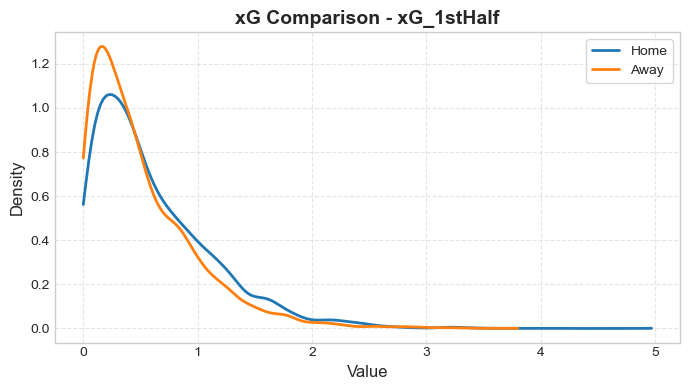

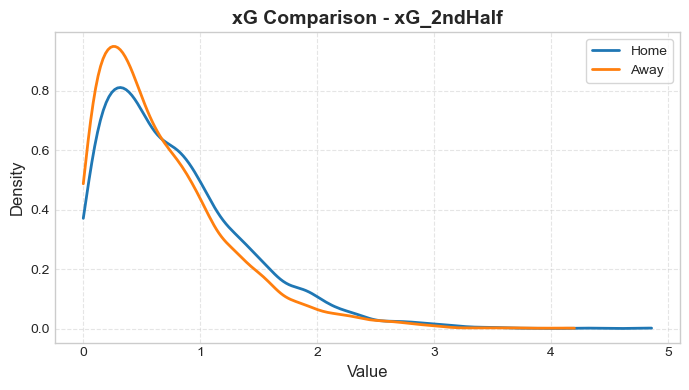

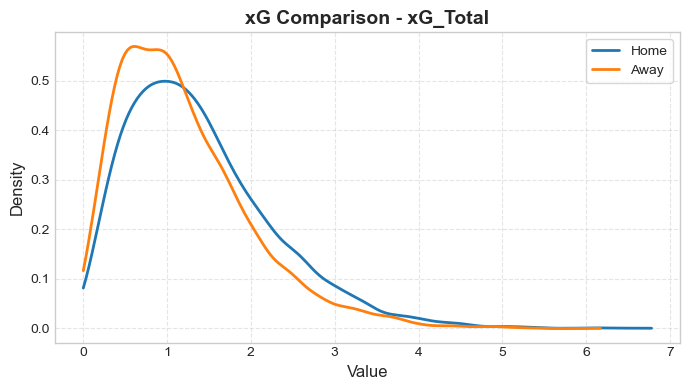

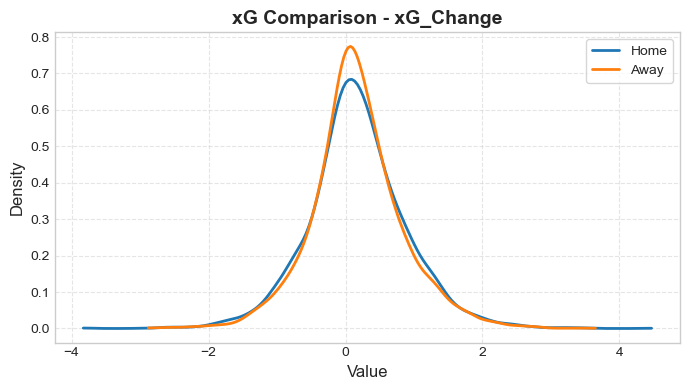

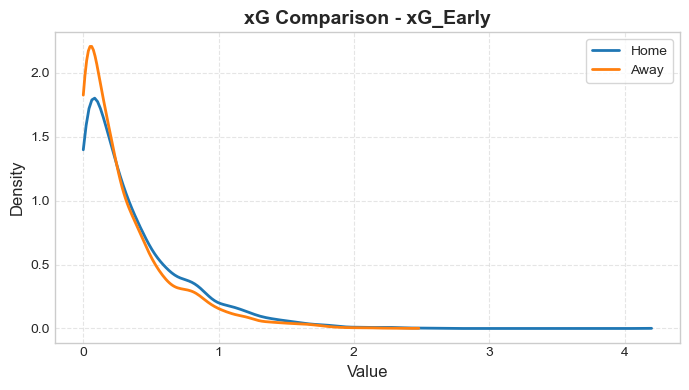

...

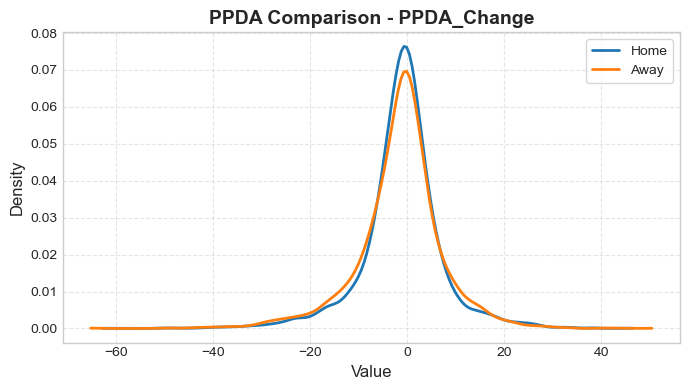

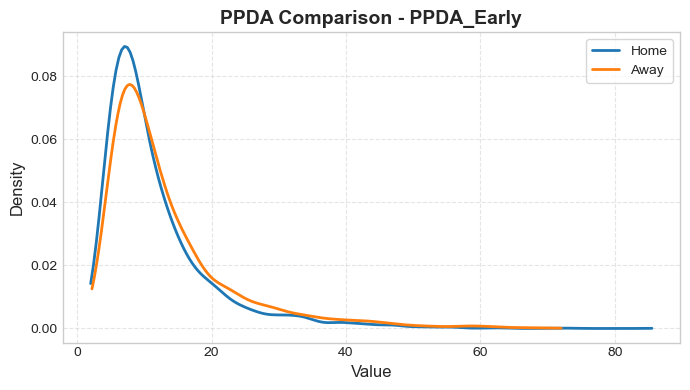

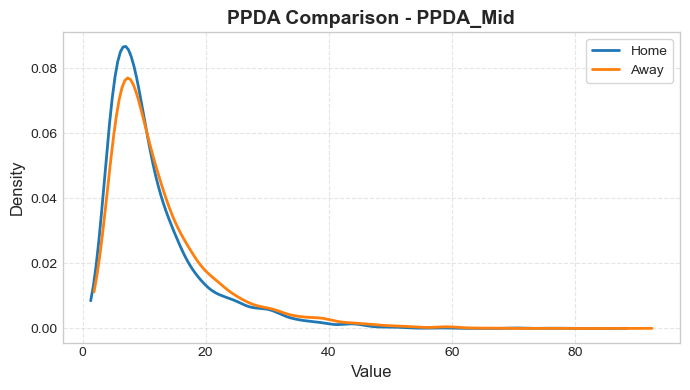

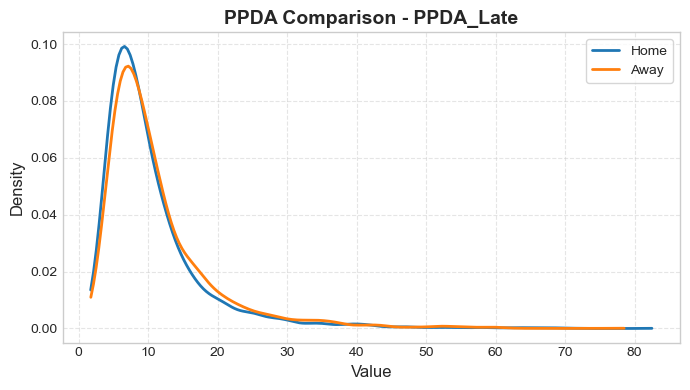

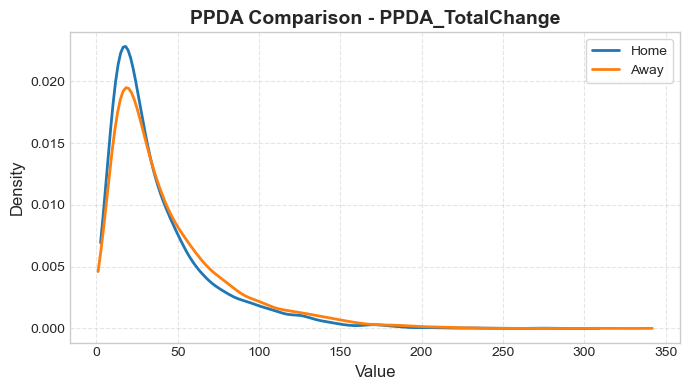

In [19]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import gaussian_kde

home_color = "#1f77b4"
away_color = "#ff7f0e"

# xG-related pairs
xg_pairs = [
    ("xG_H_1stHalf", "xG_A_1stHalf"),
    ("xG_H_2ndHalf", "xG_A_2ndHalf"),
    ("xG_H_Total", "xG_A_Total"),
    ("xG_H_Change", "xG_A_Change"),
    ("xG_H_Early", "xG_A_Early"),
    ("xG_H_Late", "xG_A_Late"),
    ("xG_H_Mid", "xG_A_Mid"),
    ("xG_H_to_PPDA", "xG_A_to_PPDA"),
    ("xG_H_TotalChange", "xG_A_TotalChange")
]

# PPDA-related pairs
ppda_pairs = [
    ("PPDA_H_1stHalf", "PPDA_A_1stHalf"),
    ("PPDA_H_2ndHalf", "PPDA_A_2ndHalf"),
    ("PPDA_H_Total", "PPDA_A_Total"),
    ("PPDA_H_Change", "PPDA_A_Change"),
    ("PPDA_H_Early", "PPDA_A_Early"),
    ("PPDA_H_Mid", "PPDA_A_Mid"),
    ("PPDA_H_Late", "PPDA_A_Late"),
    ("PPDA_H_TotalChange", "PPDA_A_TotalChange")
]

def kde_smooth(data, points=200):
    """Gaussian KDE smoothing."""
    data = np.array(data.dropna())
    if len(data) < 2:
        return None, None
    kde = gaussian_kde(data)
    x_grid = np.linspace(data.min(), data.max(), points)
    y_vals = kde(x_grid)
    return x_grid, y_vals

# 1️⃣ Build the single table with all stats
all_stats = []
for group_name, pairs in [("", xg_pairs), ("", ppda_pairs)]:
    for h_col, a_col in pairs:
        if h_col in df.columns and a_col in df.columns:
            h = df[h_col].dropna()
            a = df[a_col].dropna()
            all_stats.append({
                "Metric": f"{group_name} {h_col.replace('_H', '')}",
                "Home Min": h.min() if not h.empty else np.nan,
                "Home Max": h.max() if not h.empty else np.nan,
                "Home Mean": h.mean() if not h.empty else np.nan,
                "Away Min": a.min() if not a.empty else np.nan,
                "Away Max": a.max() if not a.empty else np.nan,
                "Away Mean": a.mean() if not a.empty else np.nan
            })

stats_df = pd.DataFrame(all_stats).round(3)
print("\n📊 Summary Statistics for xG & PPDA")
print(stats_df.to_string(index=False))

# 2️⃣ Plot density curves one by one
def plot_pairs_density(df, pairs, title_prefix):
    plt.style.use("seaborn-v0_8-whitegrid")
    for h_col, a_col in pairs:
        if h_col in df.columns and a_col in df.columns:
            plt.figure(figsize=(7, 4))

            # Home KDE
            xh, yh = kde_smooth(df[h_col])
            if xh is not None:
                plt.plot(xh, yh, label="Home", color=home_color, linewidth=2)

            # Away KDE
            xa, ya = kde_smooth(df[a_col])
            if xa is not None:
                plt.plot(xa, ya, label="Away", color=away_color, linewidth=2)

            plt.title(f"{title_prefix} - {h_col.replace('_H', '')}", fontsize=14, weight="bold")
            plt.xlabel("Value", fontsize=12)
            plt.ylabel("Density", fontsize=12)
            plt.legend(frameon=True)
            plt.grid(True, linestyle="--", alpha=0.5)
            plt.tight_layout()
            plt.show()

# Show plots
plot_pairs_density(df, xg_pairs, "xG Comparison")
plot_pairs_density(df, ppda_pairs, "PPDA Comparison")


In [20]:
# import pandas as pd
# import matplotlib.pyplot as plt

# # Define professional colors
# home_color = "#1f77b4"  # deep blue
# away_color = "#ff7f0e"  # deep orange

# # xG-related pairs
# xg_pairs = [
#     ("xG_H_1stHalf", "xG_A_1stHalf"),
#     ("xG_H_2ndHalf", "xG_A_2ndHalf"),
#     ("xG_H_Total", "xG_A_Total"),
#     ("xG_H_Change", "xG_A_Change"),
#     ("xG_H_Early", "xG_A_Early"),
#     ("xG_H_Late", "xG_A_Late"),
#     ("xG_H_Mid", "xG_A_Mid"),
#     ("xG_H_to_PPDA", "xG_A_to_PPDA"),
#     ("xG_H_TotalChange", "xG_A_TotalChange")
# ]

# # PPDA-related pairs
# ppda_pairs = [
#     ("PPDA_H_1stHalf", "PPDA_A_1stHalf"),
#     ("PPDA_H_2ndHalf", "PPDA_A_2ndHalf"),
#     ("PPDA_H_Total", "PPDA_A_Total"),
#     ("PPDA_H_Change", "PPDA_A_Change"),
#     ("PPDA_H_ChangePct", "PPDA_A_ChangePct"),
#     ("PPDA_H_Early", "PPDA_A_Early"),
#     ("PPDA_H_Mid", "PPDA_A_Mid"),
#     ("PPDA_H_Late", "PPDA_A_Late"),
#     ("PPDA_H_TotalChange", "PPDA_A_TotalChange")
# ]

# def plot_pairs(df, pairs, title_prefix):
#     plt.style.use("seaborn-v0_8-whitegrid")
#     for h_col, a_col in pairs:
#         if h_col in df.columns and a_col in df.columns:
#             plt.figure(figsize=(7, 4))
#             plt.hist(df[h_col].dropna(), bins=25, alpha=0.8, label='Home', color=home_color, edgecolor='black')
#             plt.hist(df[a_col].dropna(), bins=25, alpha=0.8, label='Away', color=away_color, edgecolor='black')
#             plt.title(f"{title_prefix} - {h_col.replace('_H', '')}", fontsize=14, weight='bold')
#             plt.xlabel("Value", fontsize=12)
#             plt.ylabel("Frequency", fontsize=12)
#             plt.legend(frameon=True)
#             plt.grid(True, linestyle='--', alpha=0.5)
#             plt.tight_layout()
#             plt.show()

# # Plot xG first
# plot_pairs(df, xg_pairs, "xG Comparison")

# # Then PPDA
# plot_pairs(df, ppda_pairs, "PPDA Comparison")

## 📚 Analysis Scopes

### 7 Main Categories
1. **All Matches**
2. **Clean (Both Not Suspicious)**
3. **Suspicious (Any of Home/Away/Both)**
4. **Home Suspicious**
5. **Away Suspicious**
6. **Both Suspicious**
7. **Unidentified**

### Subsets (applied within each category)
- **Overall**
- **Home Stronger**
- **Away Stronger**
- **Equal Strength**

---

### Category ↔ Subset Mapping

| Category                           | Subset          |
|------------------------------------|-----------------|
| All Matches                        | Overall         |
| All Matches                        | Home Stronger   |
| All Matches                        | Away Stronger   |
| All Matches                        | Equal Strength  |
| Clean (Both Not Suspicious)        | Overall         |
| Clean (Both Not Suspicious)        | Home Stronger   |
| Clean (Both Not Suspicious)        | Away Stronger   |
| Clean (Both Not Suspicious)        | Equal Strength  |
| Suspicious (Any of Home/Away/Both) | Overall         |
| Suspicious (Any of Home/Away/Both) | Home Stronger   |
| Suspicious (Any of Home/Away/Both) | Away Stronger   |
| Suspicious (Any of Home/Away/Both) | Equal Strength  |
| Home Suspicious                    | Overall         |
| Home Suspicious                    | Home Stronger   |
| Home Suspicious                    | Away Stronger   |
| Home Suspicious                    | Equal Strength  |
| Away Suspicious                    | Overall         |
| Away Suspicious                    | Home Stronger   |
| Away Suspicious                    | Away Stronger   |
| Away Suspicious                    | Equal Strength  |
| Both Suspicious                    | Overall         |
| Both Suspicious                    | Home Stronger   |
| Both Suspicious                    | Away Stronger   |
| Both Suspicious                    | Equal Strength  |
| Unidentified                       | Overall         |
| Unidentified                       | Home Stronger   |
| Unidentified                       | Away Stronger   |
| Unidentified                       | Equal Strength  |

---

## 🧠 Section Summary: PPDA–xG Correlation Analysis

This section investigates the relationship between **pressing intensity (PPDA)** and **expected goals (xG)** for both home and away teams. The goal is to understand how defensive pressure correlates with attacking output across multiple match contexts.

### 🔍 What’s Analyzed?

1. **Interval-wise Correlation**
   - 📊 Correlation tables between `PPDA_Int1–6` and `xG_Int1–6`, separately for home and away teams.

2. **Total Match Correlation**
   - 🔁 Correlation between total PPDA and total xG (`PPDA_Total` ↔ `xG_Total`).

3. **Half-wise Correlation**
   - ⏱️ First-half and second-half correlations (`PPDA_1stHalf` / `PPDA_2ndHalf` ↔ `xG_1stHalf` / `xG_2ndHalf`).

4. **Most Correlated Features with xG Total**
   - 🔼 Top 10 most strongly correlated features (positive or negative) with `xG_H_Total` and `xG_A_Total`, excluding xG-derived features.

---

### 🧪 Datasets Explored

- ✅ **Clean Matches** (both teams not suspicious)
- ❌ **Suspicious Matches** (any suspicion flag: home, away, or both)
- 🟩 **Home Suspicious**
- 🟧 **Away Suspicious**
- 🟥 **Both Suspicious**
- ❔ **Unidentified Matches**
- ⚖️ **Team Strength Comparison**
  - Home team stronger
  - Away team stronger
  - Equal strength teams

Each analysis reports the number of matches used (e.g., `37 out of 5170`) and is clearly sectioned for comparison.

---

In [21]:
# # =============================
# # Matplotlib plots for your PPDA/xG analysis (no seaborn)
# # =============================

# import numpy as np
# import pandas as pd
# import matplotlib.pyplot as plt

# # -----------------------------
# # Helper: subset selectors
# # -----------------------------
# def get_subsets(df: pd.DataFrame):
#     subsets = {}

#     # All games
#     subsets["ALL"] = df

#     # Clean / Suspicious / Unidentified
#     subsets["CLEAN_BOTH"] = df[(df["home_label"] == "not suspicious") & (df["away_label"] == "not suspicious")]
#     subsets["SUSP_ANY"] = df[(df["home_label"] == "suspicious") | (df["away_label"] == "suspicious")]
#     subsets["HOME_SUSP"] = df[(df["home_label"] == "suspicious") & (df["away_label"] != "suspicious")]
#     subsets["AWAY_SUSP"] = df[(df["away_label"] == "suspicious") & (df["home_label"] != "suspicious")]
#     subsets["BOTH_SUSP"] = df[(df["home_label"] == "suspicious") & (df["away_label"] == "suspicious")]
#     subsets["UNIDENTIFIED"] = df[(df["home_label"] == "unidentified") | (df["away_label"] == "unidentified")]

#     # Relative strength
#     subsets["HOME_STRONGER"] = df[df["rel_strength"] == "home_stronger"]
#     subsets["AWAY_STRONGER"] = df[df["rel_strength"] == "away_stronger"]
#     subsets["EQUAL_STRENGTH"] = df[df["rel_strength"] == "equal"]

#     return subsets

# # -----------------------------
# # Core correlation calculators
# # -----------------------------
# HOME_XG_INTS = [f"xG_H_Int{i}" for i in range(1,7)]
# AWAY_XG_INTS = [f"xG_A_Int{i}" for i in range(1,7)]
# HOME_PPDA_INTS = [f"PPDA_H_Int{i}" for i in range(1,7)]
# AWAY_PPDA_INTS = [f"PPDA_A_Int{i}" for i in range(1,7)]

# PPDA_FEATURES = (
#     ["PPDA_H_Total","PPDA_H_1stHalf","PPDA_H_2ndHalf","PPDA_A_Total","PPDA_A_1stHalf","PPDA_A_2ndHalf"] +
#     HOME_PPDA_INTS + AWAY_PPDA_INTS
# )

# def corr(a: pd.Series, b: pd.Series):
#     a, b = a.astype(float), b.astype(float)
#     if a.std(ddof=0) == 0 or b.std(ddof=0) == 0:
#         return np.nan
#     return a.corr(b)

# def compute_total_corrs(df: pd.DataFrame):
#     return {
#         "PPDA_H_Total_vs_xG_H_Total": corr(df["PPDA_H_Total"], df["xG_H_Total"]),
#         "PPDA_A_Total_vs_xG_A_Total": corr(df["PPDA_A_Total"], df["xG_A_Total"]),
#     }

# def compute_halfwise_corrs(df: pd.DataFrame):
#     return {
#         "Home_1H": corr(df["PPDA_H_1stHalf"], df["xG_H_Total"]),
#         "Home_2H": corr(df["PPDA_H_2ndHalf"], df["xG_H_Total"]),
#         "Away_1H": corr(df["PPDA_A_1stHalf"], df["xG_A_Total"]),
#         "Away_2H": corr(df["PPDA_A_2ndHalf"], df["xG_A_Total"]),
#     }

# def top_features_vs_xG(df: pd.DataFrame, side="H", k=10):
#     """
#     side = "H" for xG_H_Total; "A" for xG_A_Total
#     Returns sorted Series (descending by absolute value), signed correlations
#     """
#     target = "xG_H_Total" if side == "H" else "xG_A_Total"
#     vals = {}
#     for f in PPDA_FEATURES:
#         if f in df.columns:
#             vals[f] = corr(df[f], df[target])
#     s = pd.Series(vals).dropna()
#     # sort by absolute strength, keep sign
#     s = s.reindex(s.abs().sort_values(ascending=False).index)
#     return s.head(k)

# def full_interval_corr_matrix(df: pd.DataFrame, side="H"):
#     """
#     Returns a 6x6 matrix: rows = PPDA_Int1..6, cols = xG_Int1..6
#     """
#     if side == "H":
#         ppda_cols = HOME_PPDA_INTS
#         xg_cols = HOME_XG_INTS
#     else:
#         ppda_cols = AWAY_PPDA_INTS
#         xg_cols = AWAY_XG_INTS

#     M = np.zeros((6,6), dtype=float)
#     for i, pcol in enumerate(ppda_cols):
#         for j, xcol in enumerate(xg_cols):
#             M[i,j] = corr(df[pcol], df[xcol])
#     return M, ppda_cols, xg_cols

# def same_interval_series(df: pd.DataFrame, side="H"):
#     """
#     Returns a length-6 vector: corr(PPDA_*_Intk, xG_*_Intk) for k=1..6
#     """
#     if side == "H":
#         ppda_cols = HOME_PPDA_INTS
#         xg_cols = HOME_XG_INTS
#     else:
#         ppda_cols = AWAY_PPDA_INTS
#         xg_cols = AWAY_XG_INTS

#     out = []
#     for k in range(6):
#         out.append(corr(df[ppda_cols[k]], df[xg_cols[k]]))
#     return np.array(out)

# # -----------------------------
# # Plot helpers (matplotlib only; no specific colors)
# # -----------------------------
# def plot_heatmap(M: np.ndarray, row_labels, col_labels, title):
#     fig, ax = plt.subplots(figsize=(6,5))
#     im = ax.imshow(M, aspect="auto")
#     ax.set_xticks(range(len(col_labels)))
#     ax.set_yticks(range(len(row_labels)))
#     ax.set_xticklabels(col_labels, rotation=45, ha="right")
#     ax.set_yticklabels(row_labels)
#     ax.set_title(title)
#     for i in range(M.shape[0]):
#         for j in range(M.shape[1]):
#             ax.text(j, i, f"{M[i,j]:.2f}", ha="center", va="center", fontsize=8)
#     ax.figure.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
#     plt.tight_layout()
#     plt.show()

# def plot_bar_dict(d: dict, title, ylabel="Correlation"):
#     labels = list(d.keys())
#     vals = [d[k] for k in labels]
#     fig, ax = plt.subplots(figsize=(6,4))
#     ax.bar(range(len(labels)), vals)
#     ax.set_xticks(range(len(labels)))
#     ax.set_xticklabels(labels, rotation=30, ha="right")
#     ax.set_ylabel(ylabel)
#     ax.set_title(title)
#     for i,v in enumerate(vals):
#         ax.text(i, v + (0.01 if v>=0 else -0.01), f"{v:.3f}", ha="center", va="bottom" if v>=0 else "top", fontsize=8)
#     plt.tight_layout()
#     plt.show()

# def plot_series(vals: np.ndarray, title, xlabel="Interval (1→6)", ylabel="Same-interval corr"):
#     fig, ax = plt.subplots(figsize=(6,3.5))
#     ax.plot(range(1,7), vals, marker="o")
#     ax.set_xticks(range(1,7))
#     ax.set_xlabel(xlabel)
#     ax.set_ylabel(ylabel)
#     ax.set_title(title)
#     for i, v in enumerate(vals, start=1):
#         ax.text(i, v, f"{v:.2f}", ha="center", va="bottom" if v>=0 else "top", fontsize=8)
#     plt.tight_layout()
#     plt.show()

# def plot_top_features(ser: pd.Series, title):
#     fig, ax = plt.subplots(figsize=(7,4))
#     ser = ser.iloc[::-1]  # horizontal bar from smallest to largest
#     ax.barh(range(len(ser)), ser.values)
#     ax.set_yticks(range(len(ser)))
#     ax.set_yticklabels(ser.index)
#     ax.set_title(title)
#     for i, v in enumerate(ser.values):
#         ax.text(v, i, f"{v:.3f}", va="center", ha="left" if v>=0 else "right", fontsize=8)
#     plt.tight_layout()
#     plt.show()

# # -----------------------------
# # Driver: run for each subset
# # -----------------------------
# def run_all_plots_for_subset(name: str, df_sub: pd.DataFrame):
#     print(f"=== {name} | n={len(df_sub)} ===")

#     # 1) Totals
#     totals = compute_total_corrs(df_sub)
#     plot_bar_dict(totals, f"{name}: Total PPDA vs Total xG")

#     # 2) Half-wise (own half PPDA vs own total xG)
#     halves = compute_halfwise_corrs(df_sub)
#     plot_bar_dict(halves, f"{name}: Half-wise PPDA vs own Total xG")

#     # 3) Top features vs xG totals
#     topH = top_features_vs_xG(df_sub, side="H", k=10)
#     topA = top_features_vs_xG(df_sub, side="A", k=10)
#     plot_top_features(topH, f"{name}: Top |xG_H_Total| PPDA features (signed)")
#     plot_top_features(topA, f"{name}: Top |xG_A_Total| PPDA features (signed)")

#     # 4) Full interval matrices (PPDA_Int vs xG_Int) + same-interval lines
#     MH, rH, cH = full_interval_corr_matrix(df_sub, side="H")
#     MA, rA, cA = full_interval_corr_matrix(df_sub, side="A")
#     plot_heatmap(MH, rH, cH, f"{name}: HOME — Corr(PPDA_H_Int*, xG_H_Int*)")
#     plot_heatmap(MA, rA, cA, f"{name}: AWAY — Corr(PPDA_A_Int*, xG_A_Int*)")

#     sameH = same_interval_series(df_sub, side="H")
#     sameA = same_interval_series(df_sub, side="A")
#     plot_series(sameH, f"{name}: HOME — Same-interval corr (PPDA_H_Intk ↔ xG_H_Intk)")
#     plot_series(sameA, f"{name}: AWAY — Same-interval corr (PPDA_A_Intk ↔ xG_A_Intk)")

# # -----------------------------
# # Example usage:
# # df = pd.read_parquet("your_dataset.parquet")  # or read_csv(...)
# # subsets = get_subsets(df)
# # for key, dsub in subsets.items():
# #     if len(dsub) > 5:  # skip tiny cells if you like
# #         run_all_plots_for_subset(key, dsub)

=== ALL | n=5170 ===


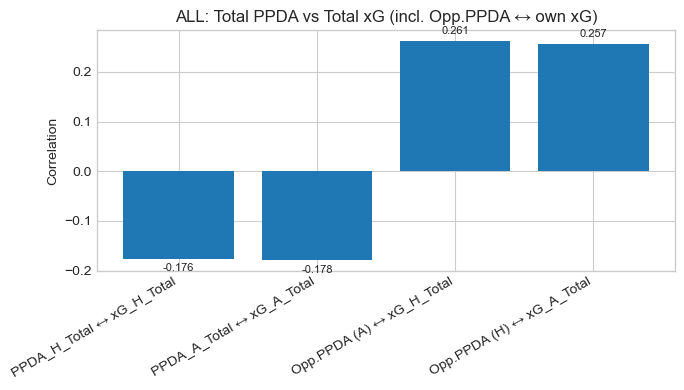

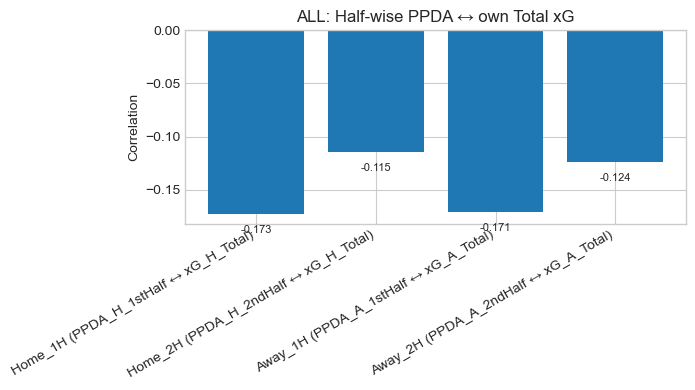

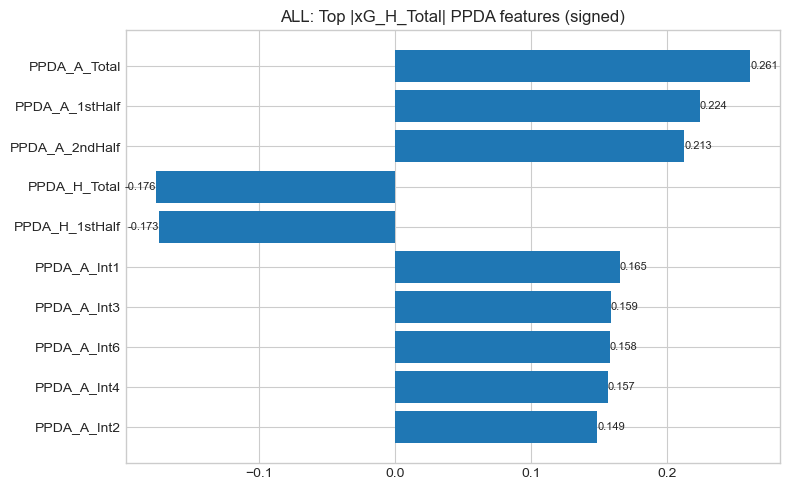

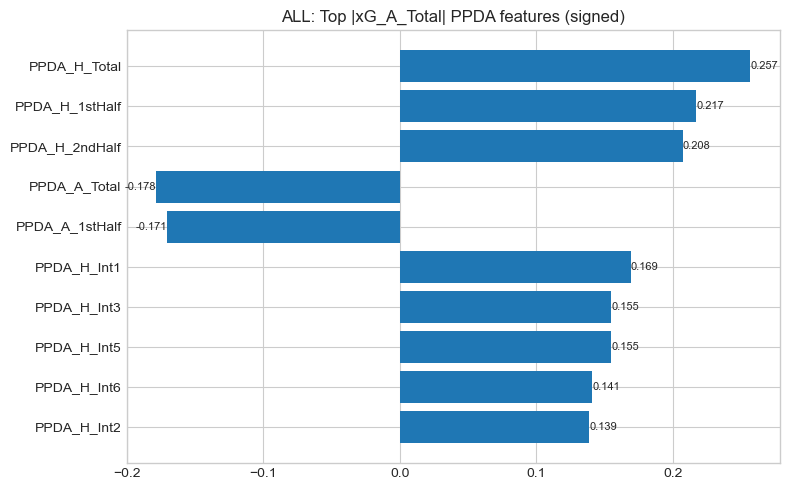

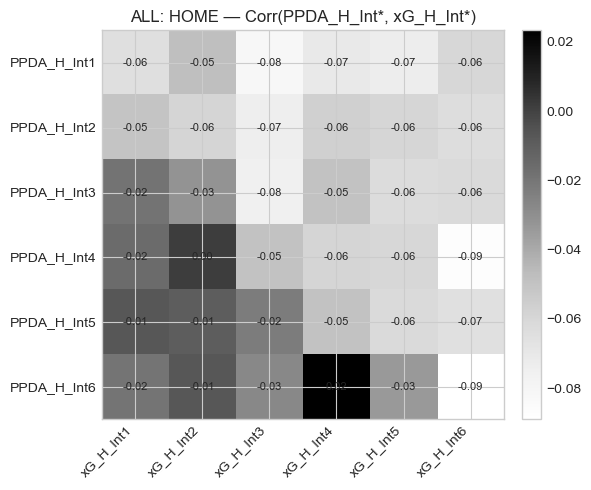

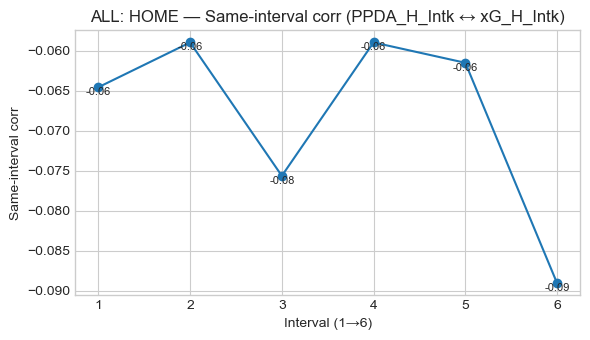

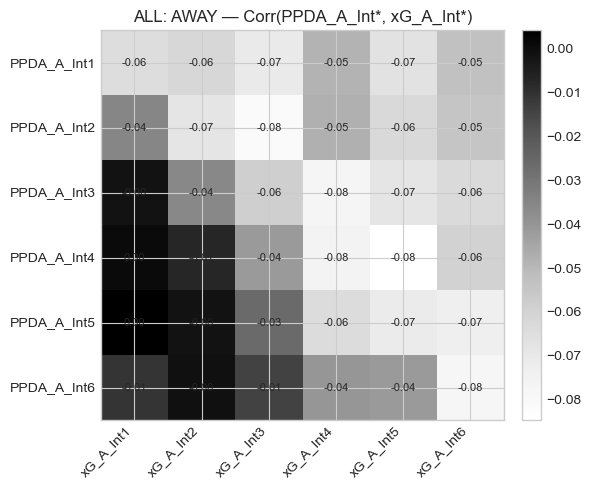

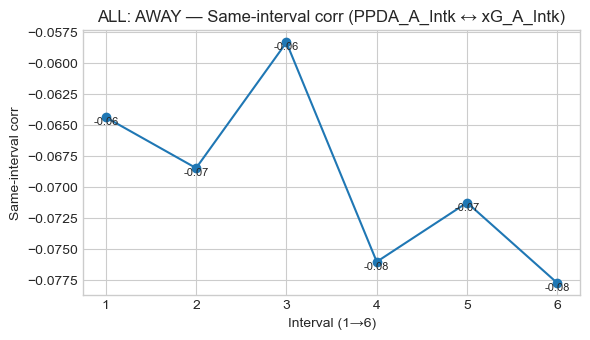

=== CLEAN_BOTH | n=51 ===


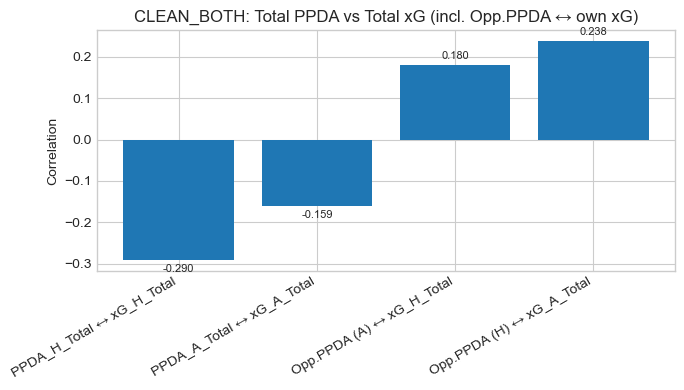

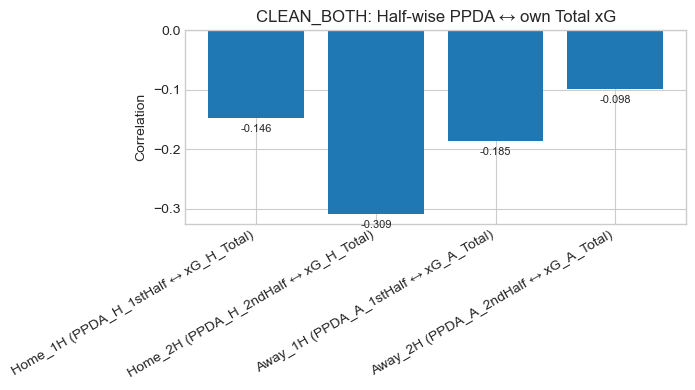

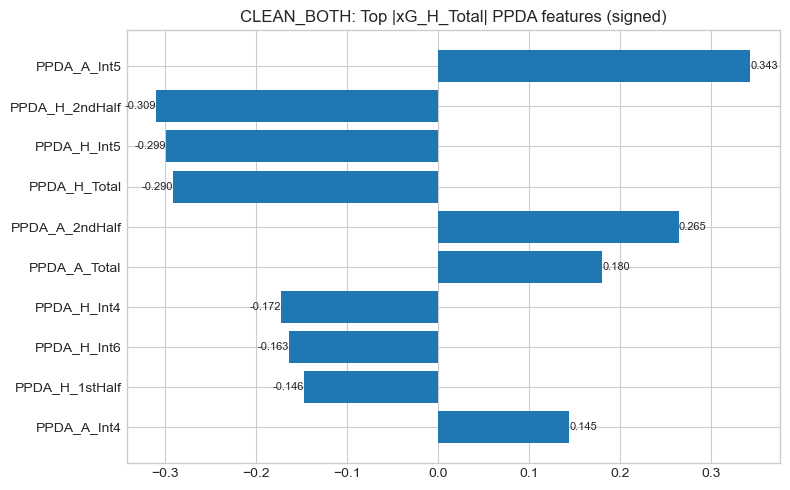

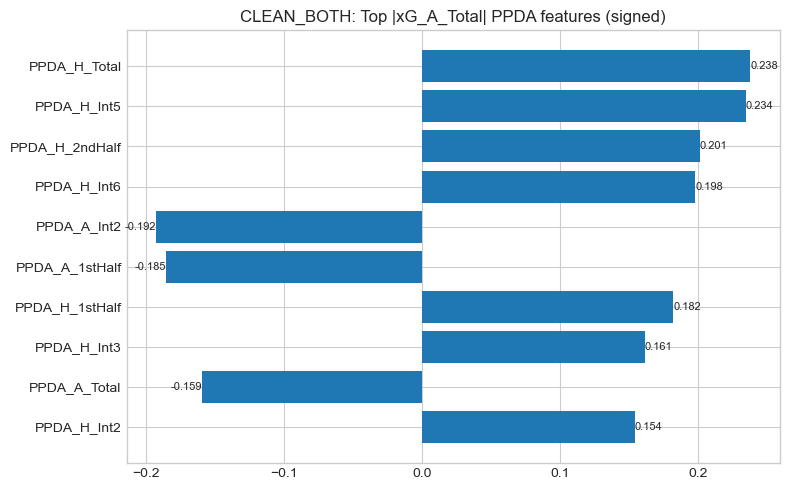

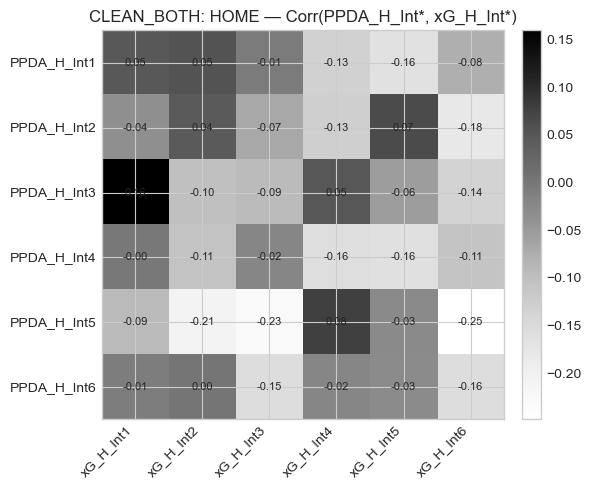

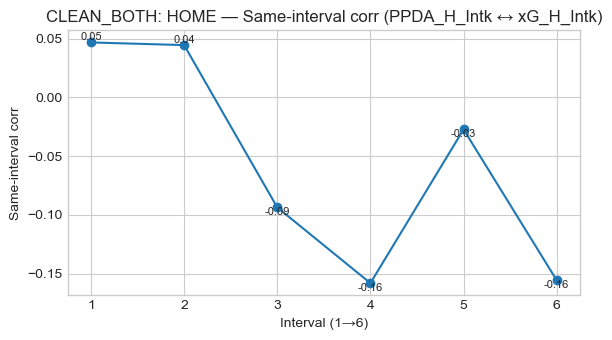

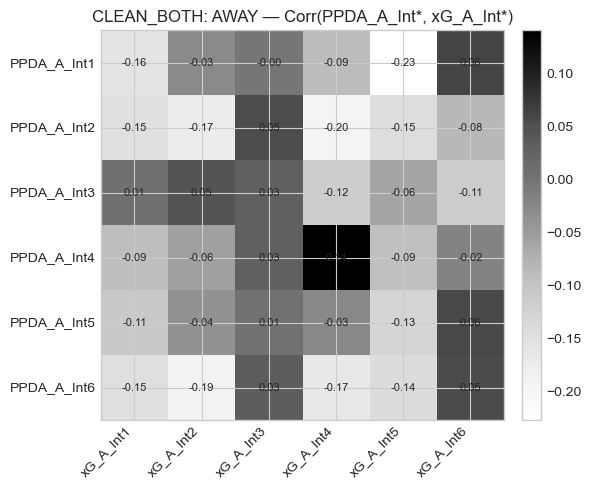

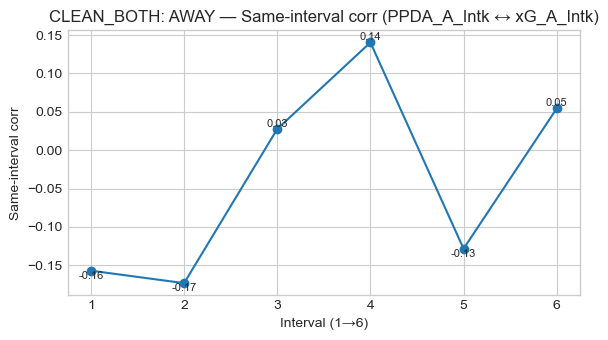

=== SUSP_ANY | n=37 ===


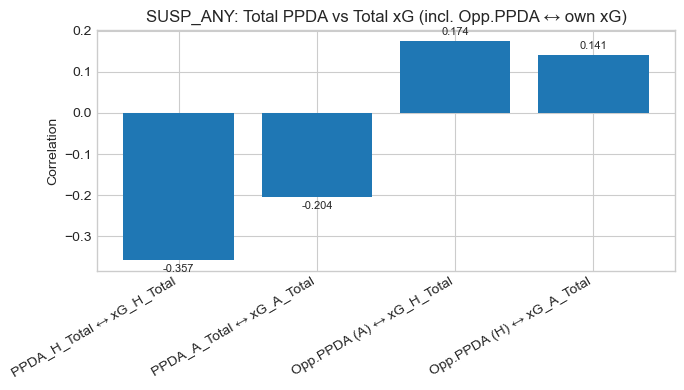

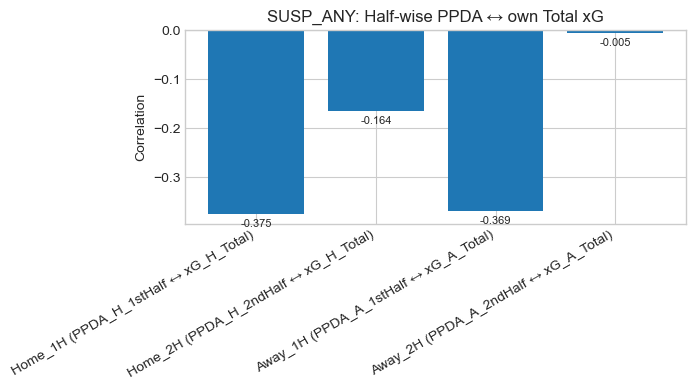

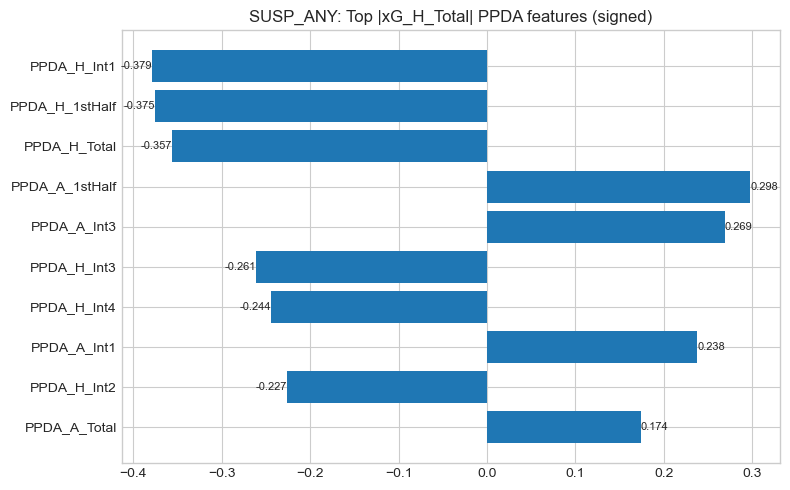

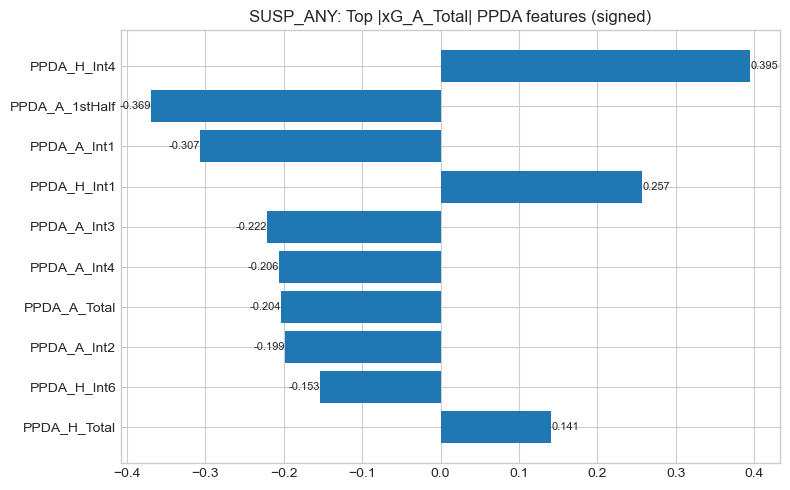

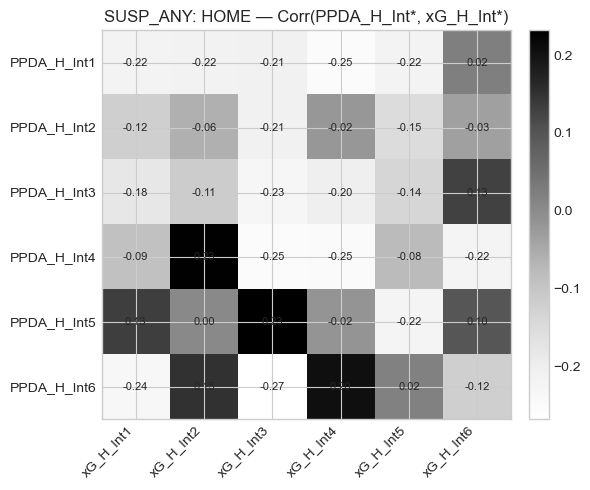

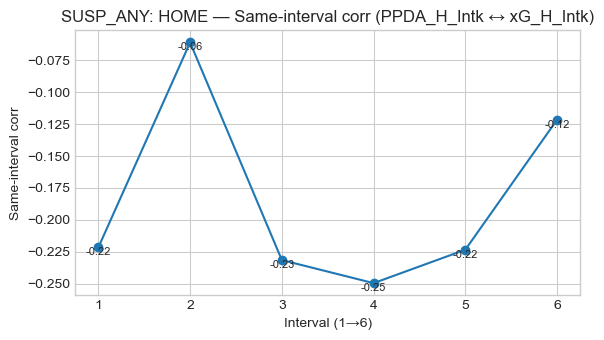

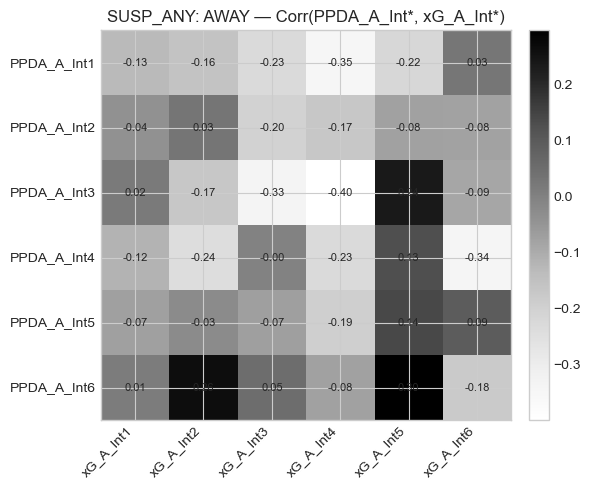

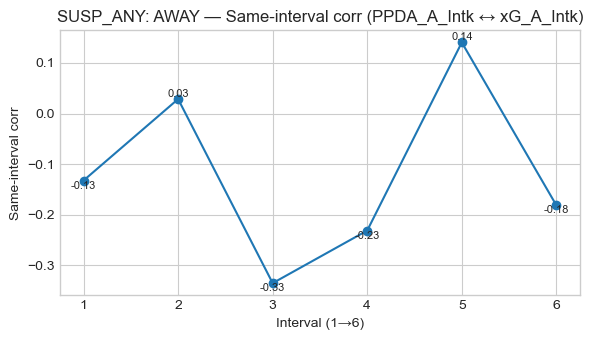

=== HOME_SUSP | n=15 ===


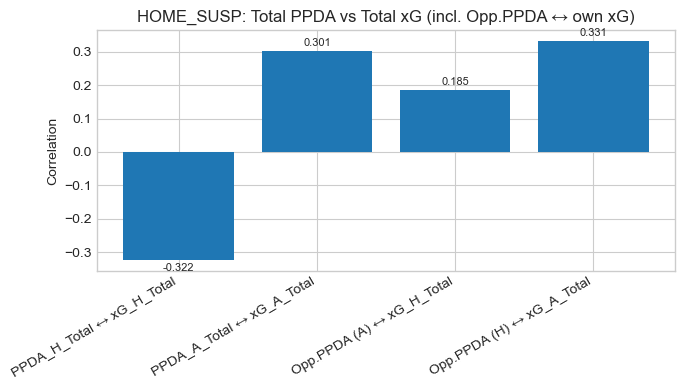

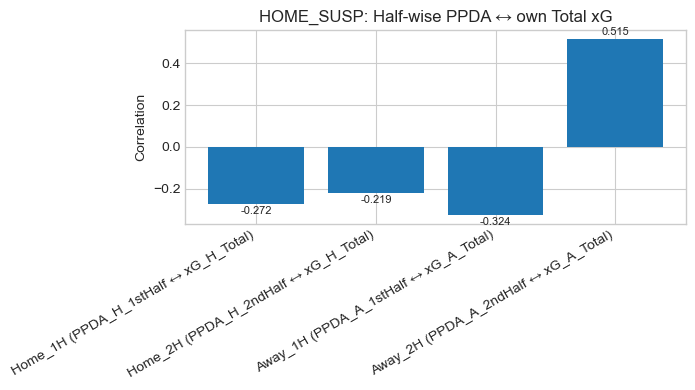

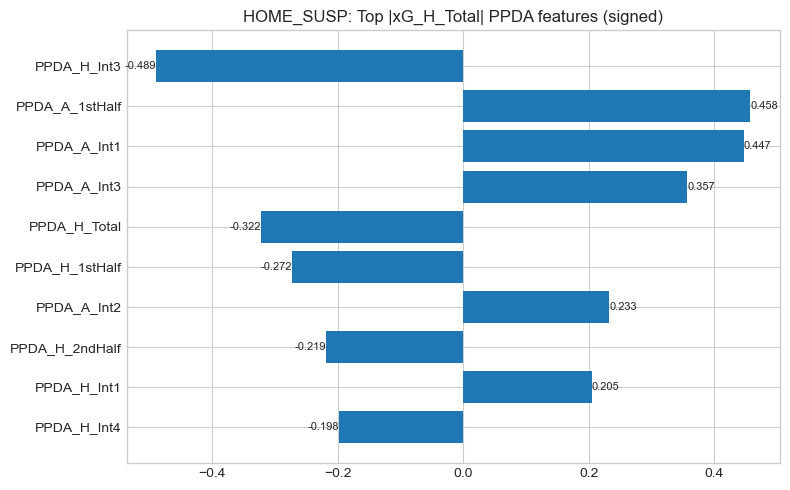

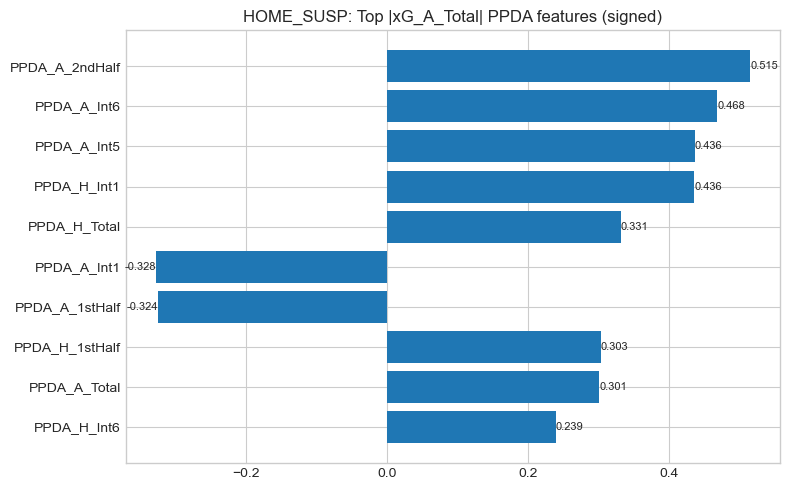

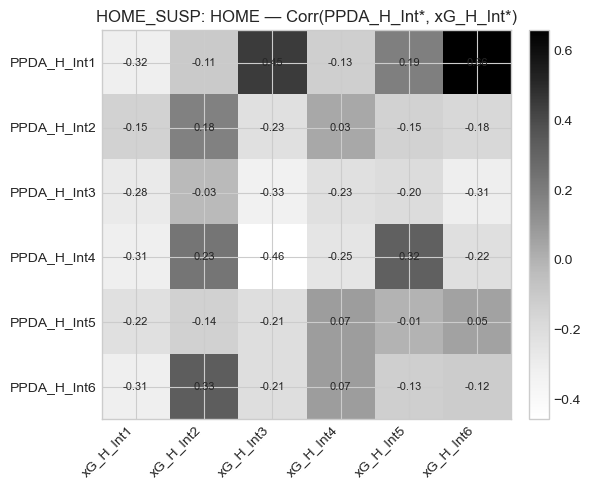

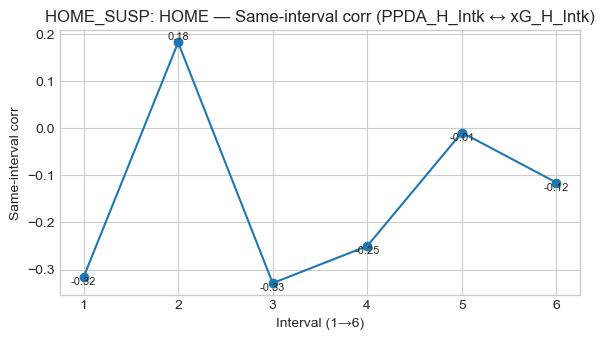

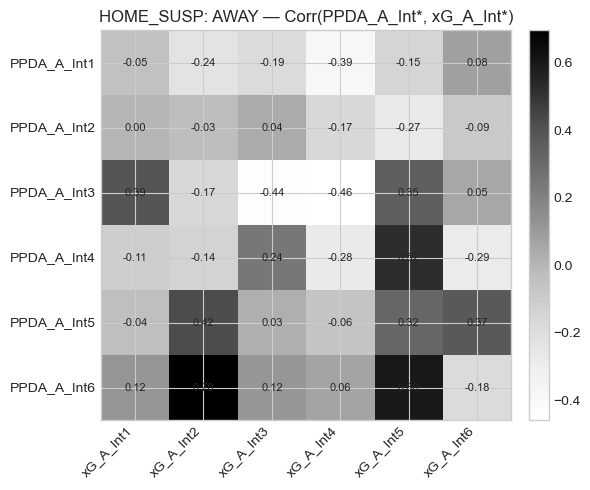

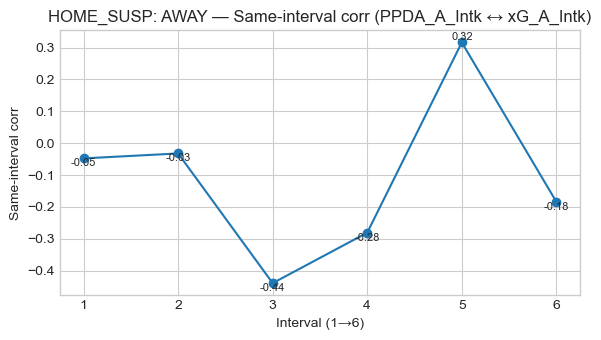

=== AWAY_SUSP | n=18 ===


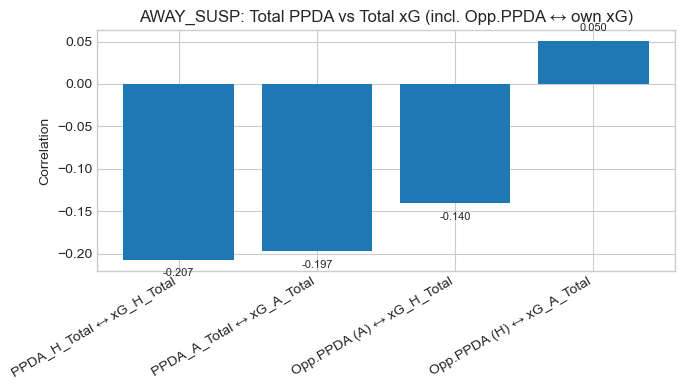

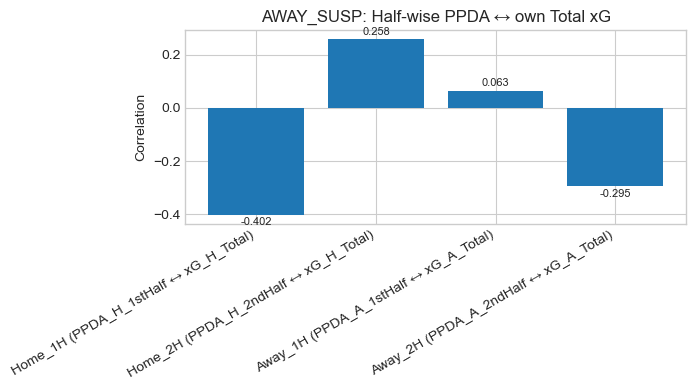

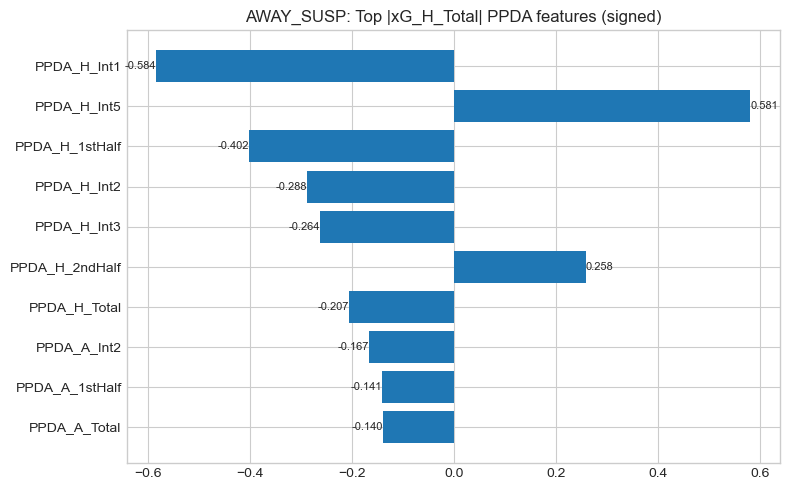

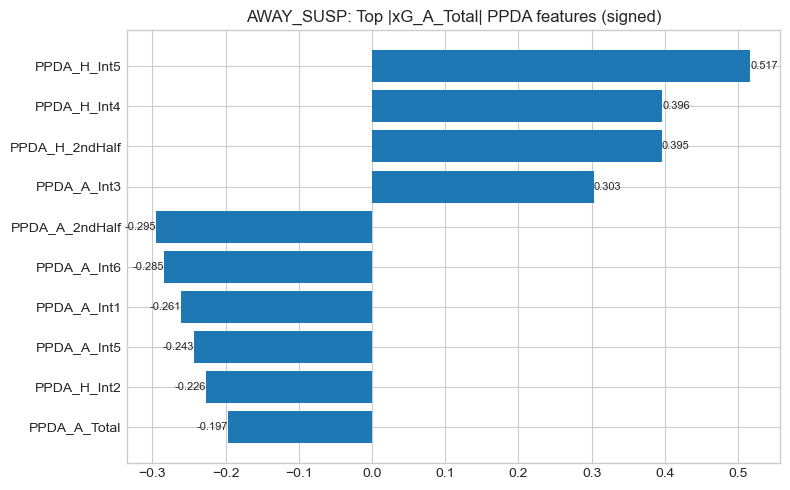

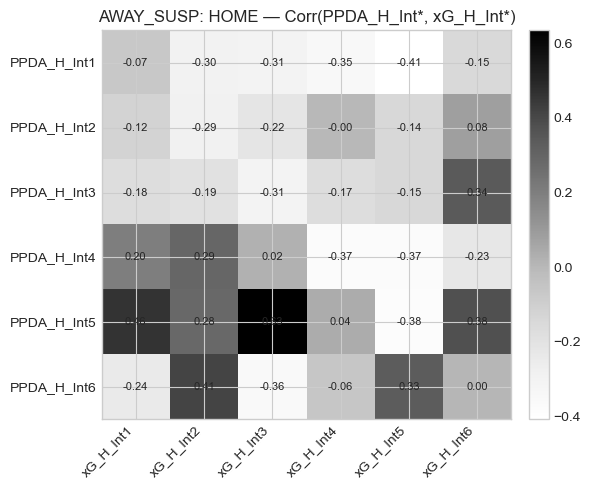

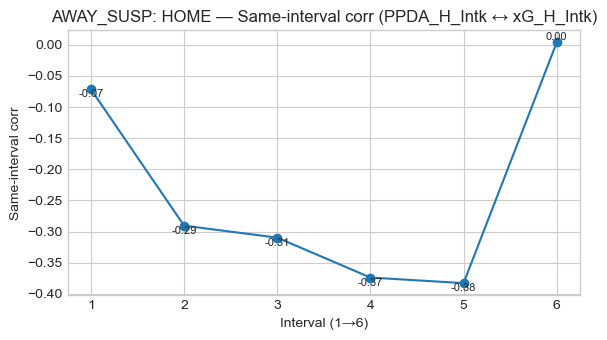

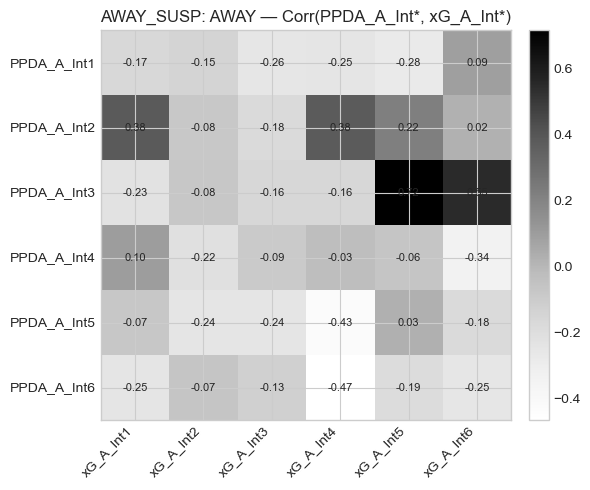

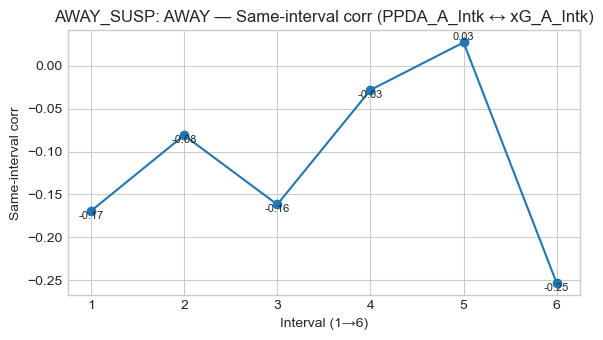

=== BOTH_SUSP | n=4 ===


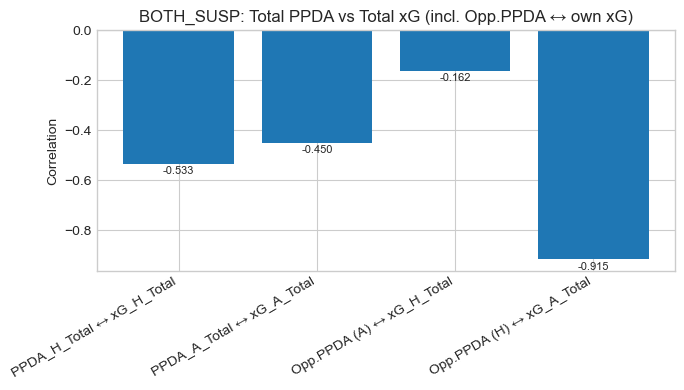

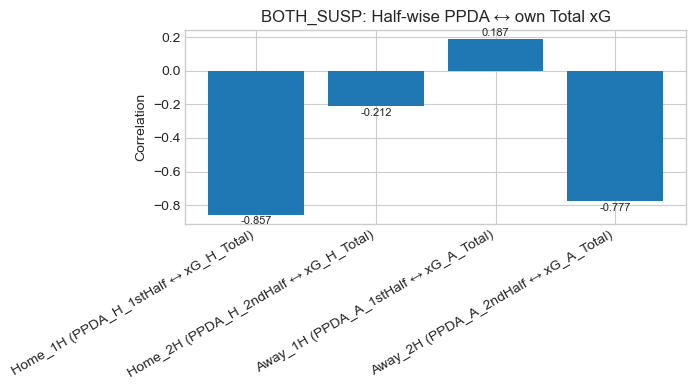

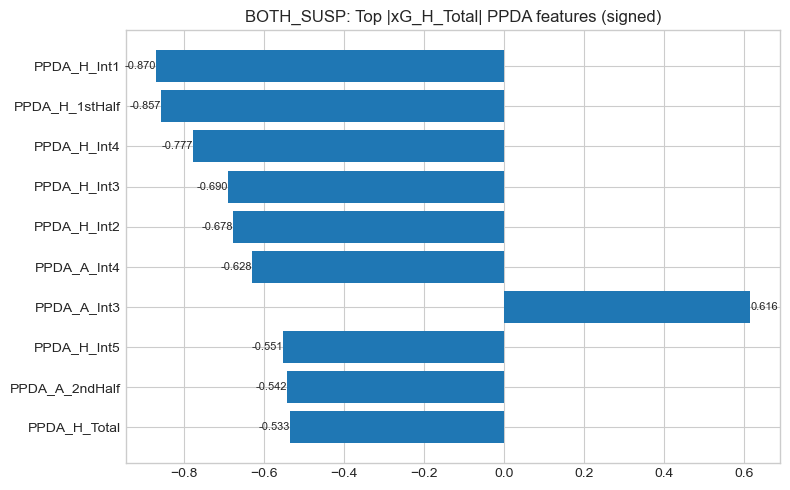

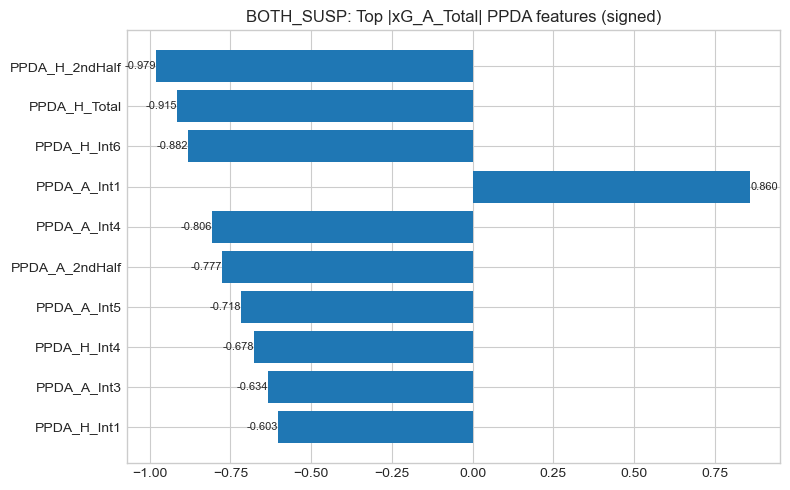

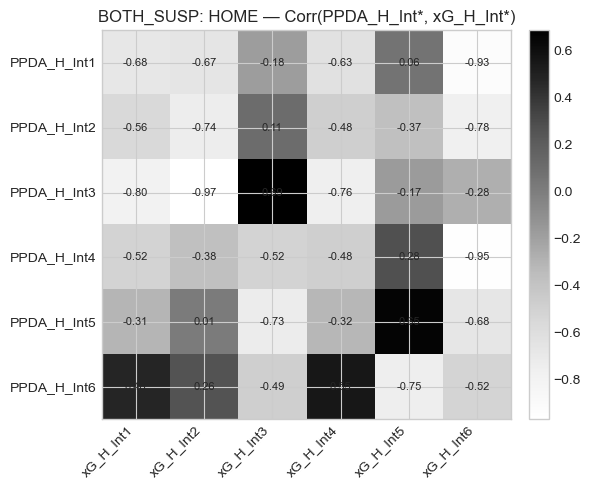

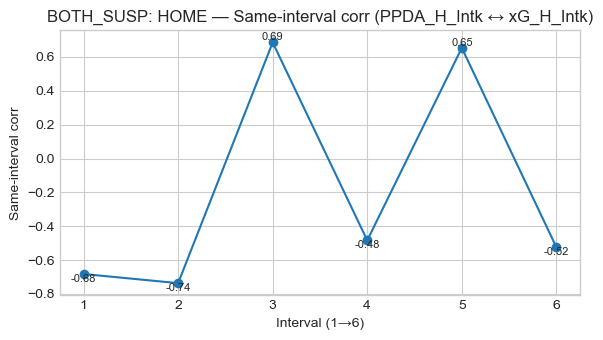

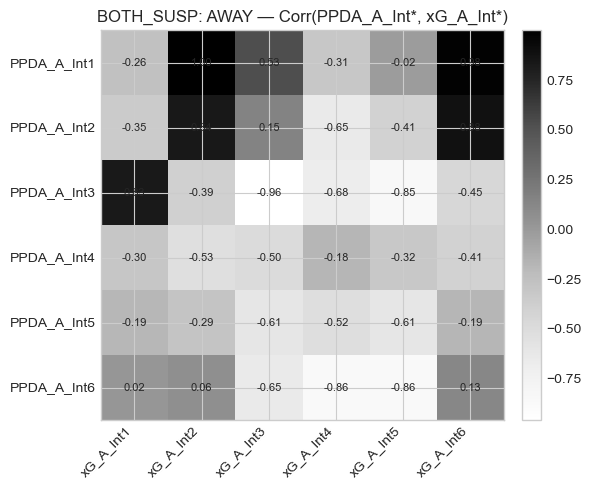

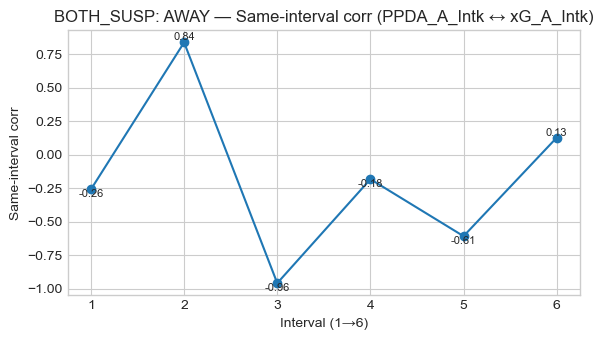

=== UNIDENTIFIED | n=5082 ===


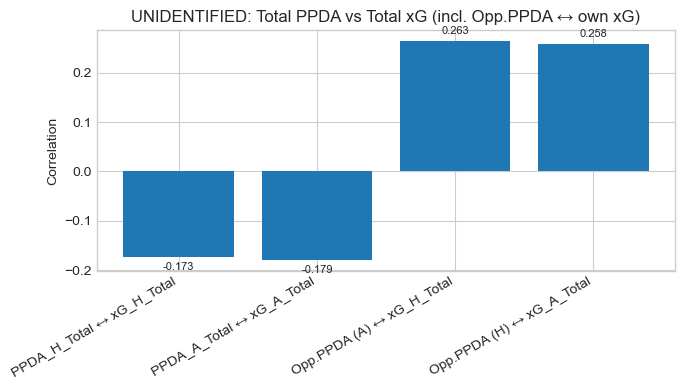

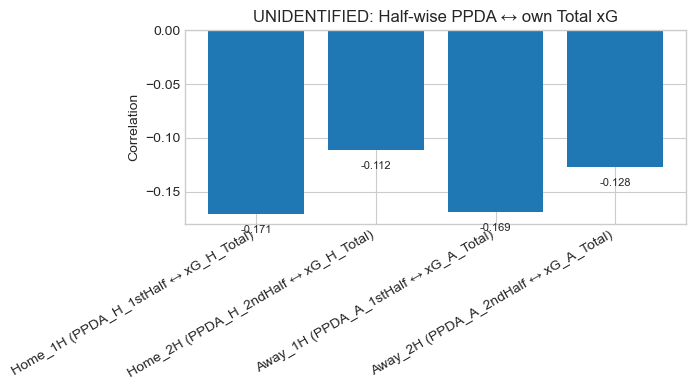

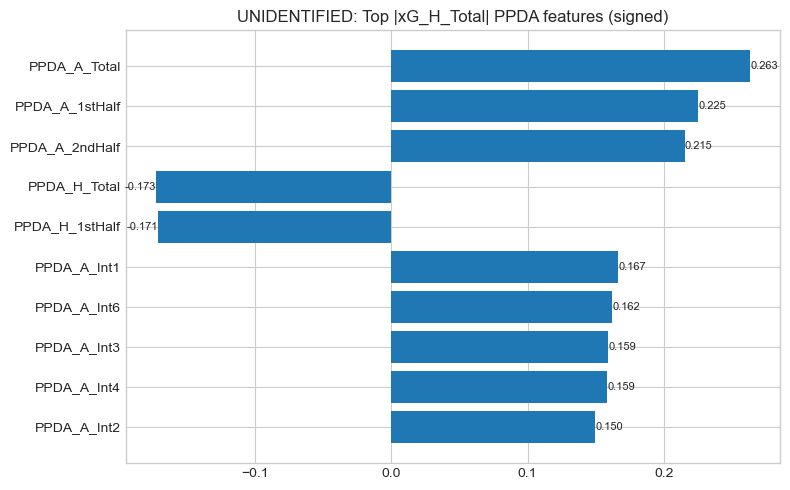

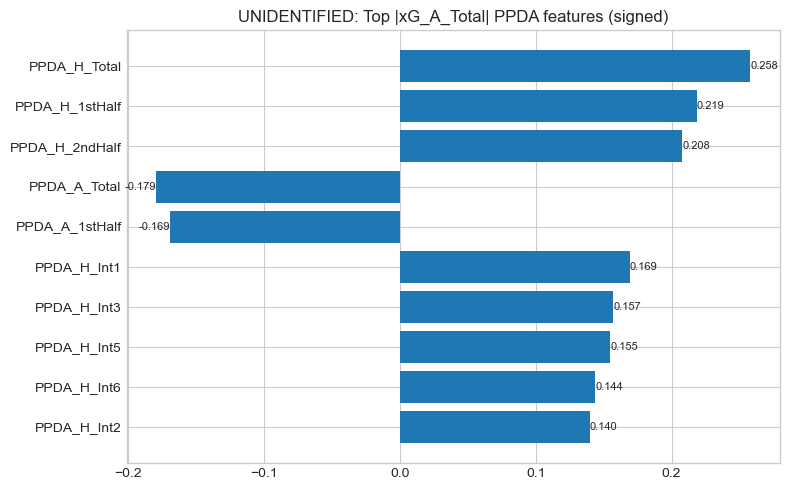

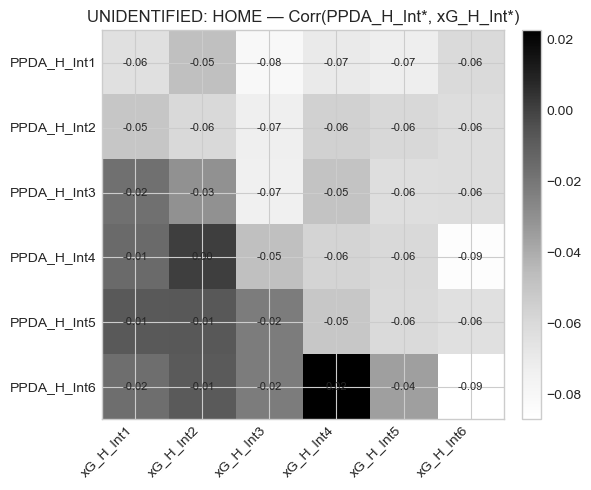

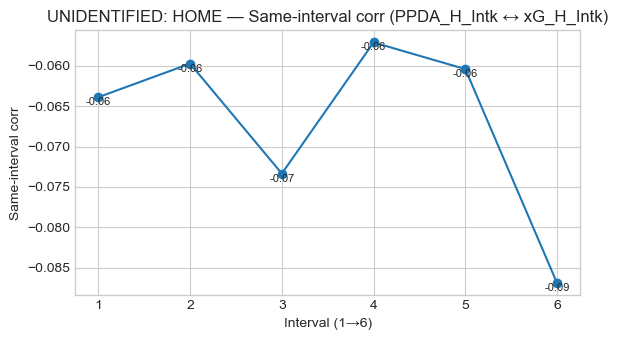

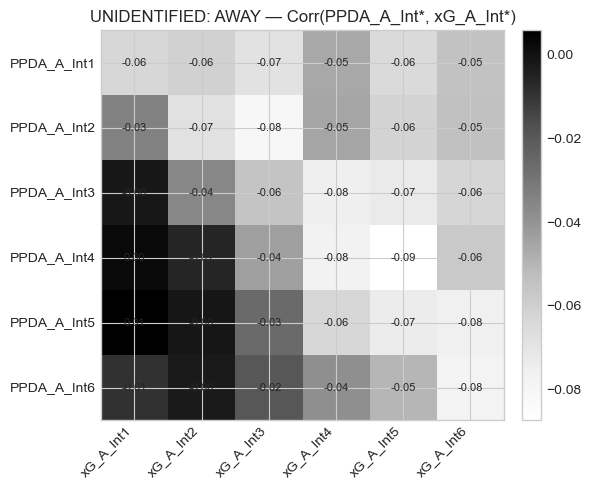

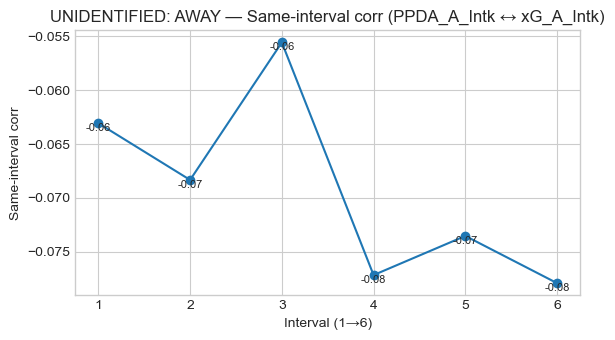

=== HOME_STRONGER | n=1772 ===


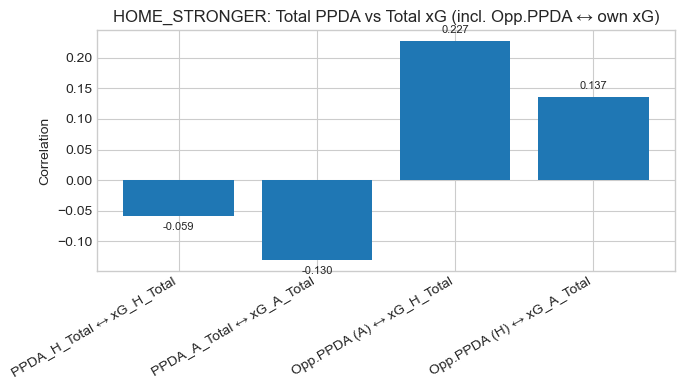

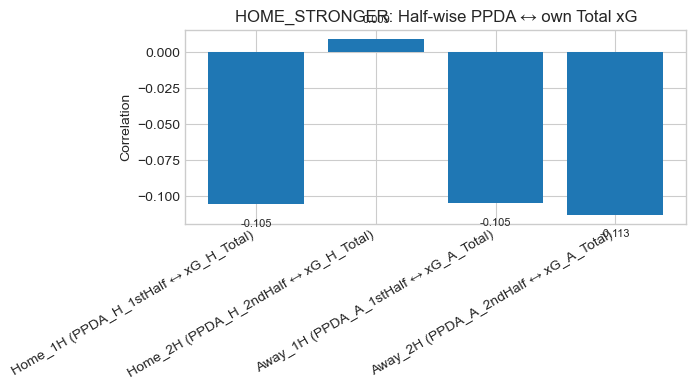

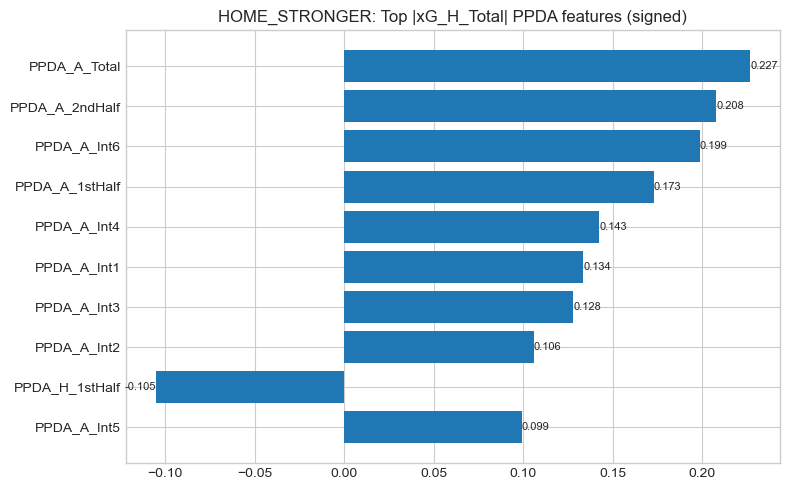

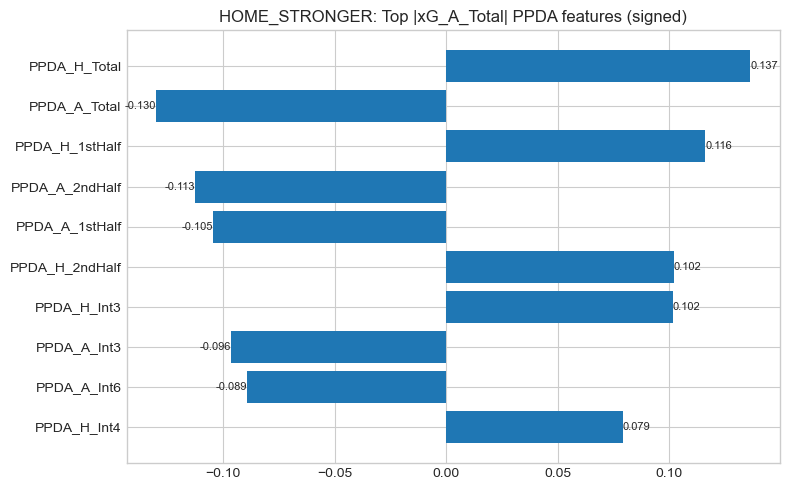

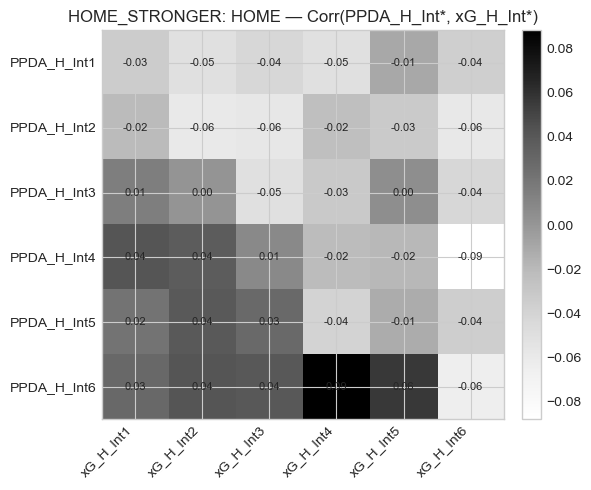

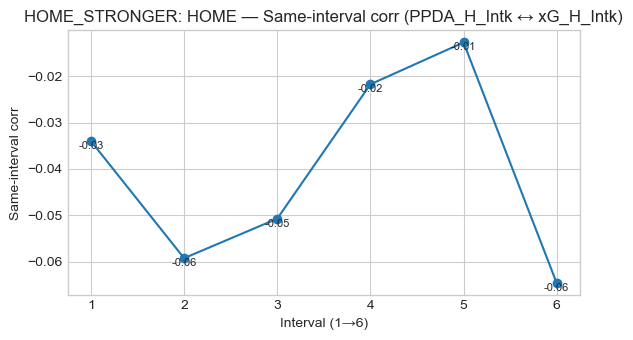

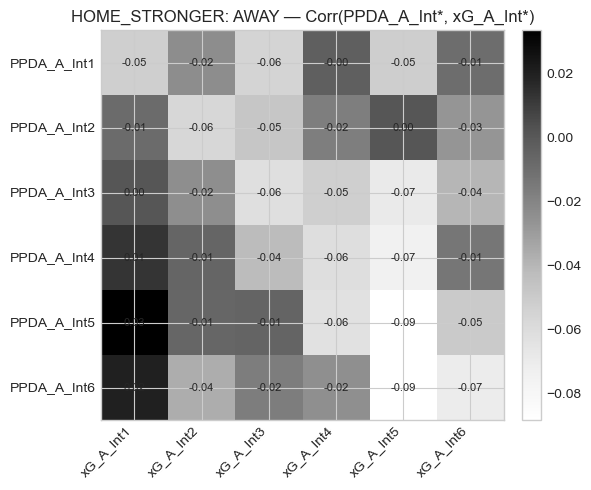

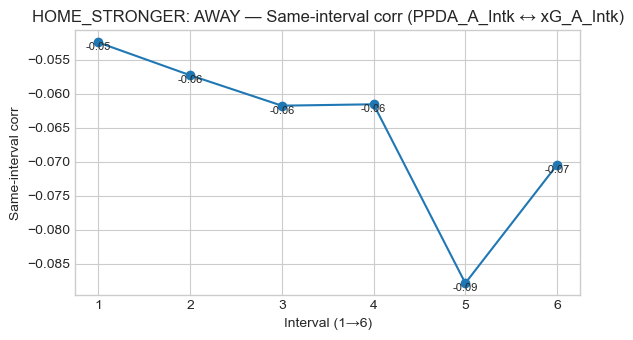

=== AWAY_STRONGER | n=1752 ===


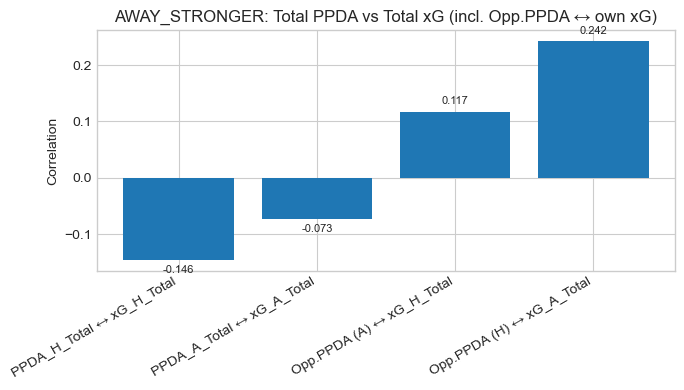

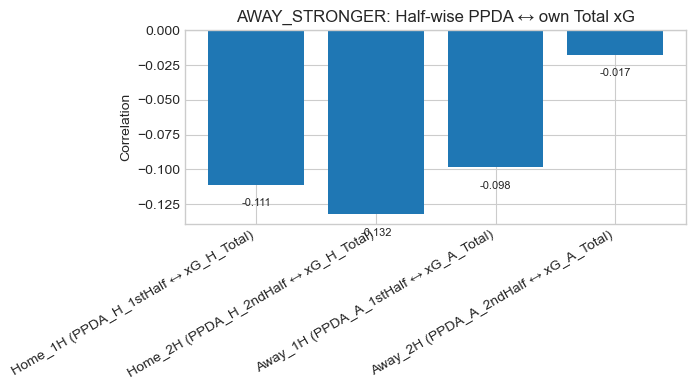

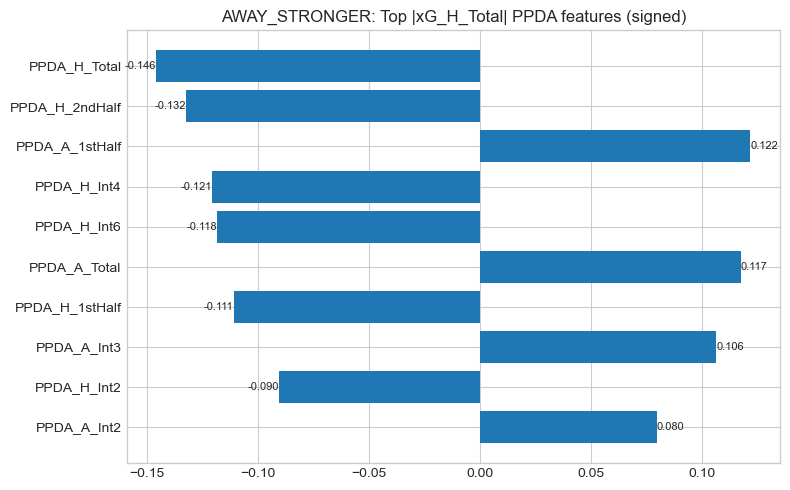

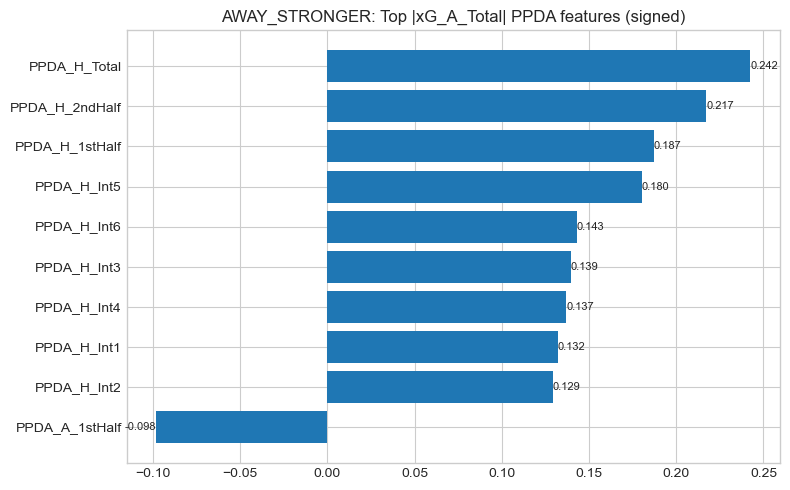

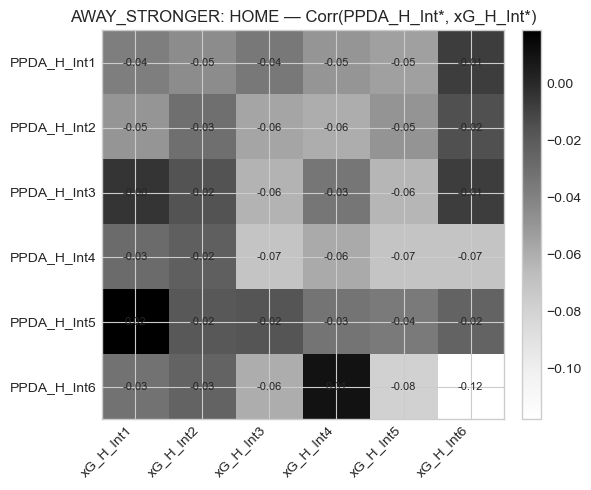

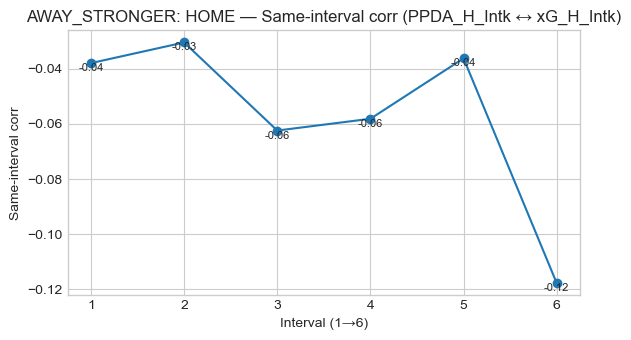

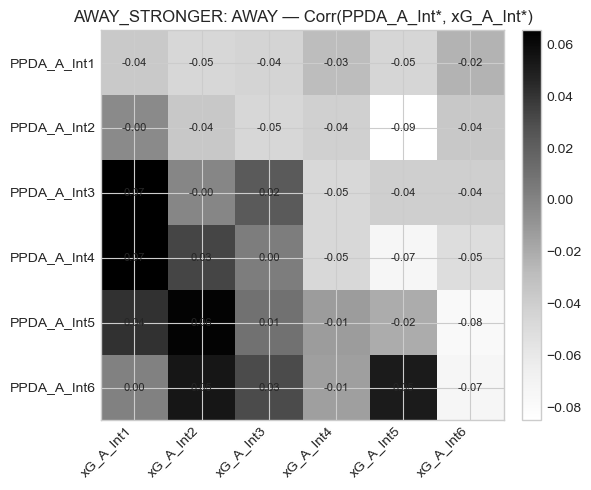

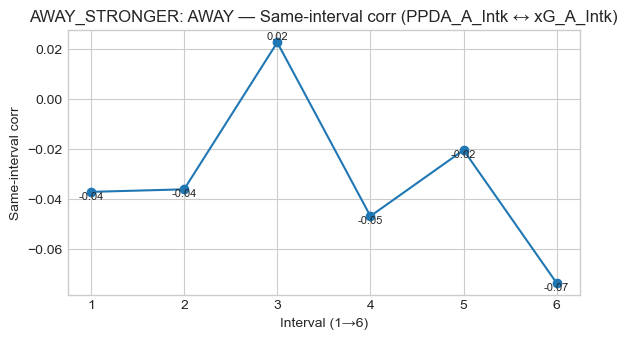

=== EQUAL_STRENGTH | n=1646 ===


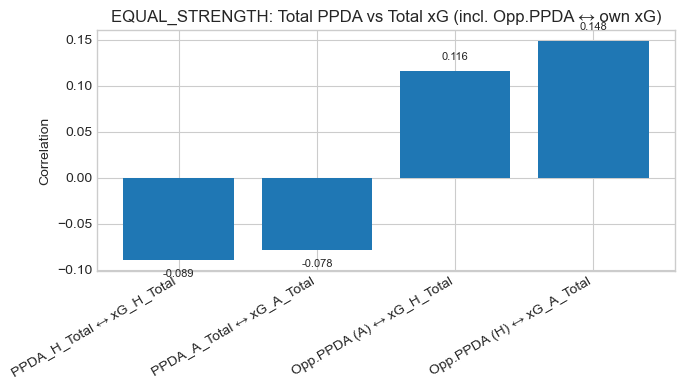

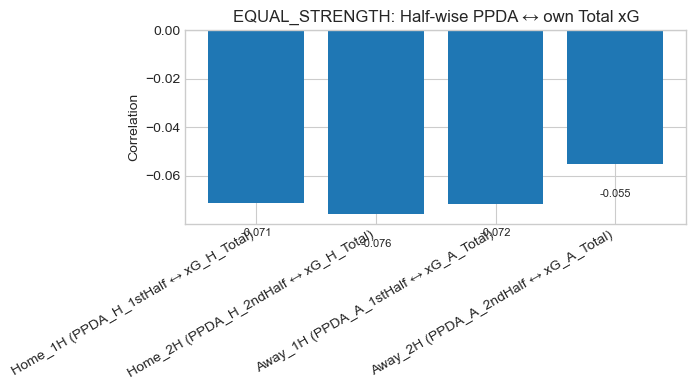

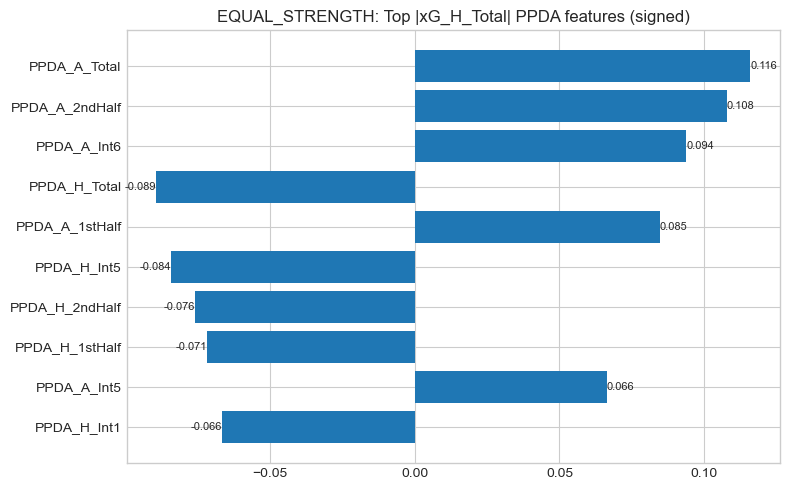

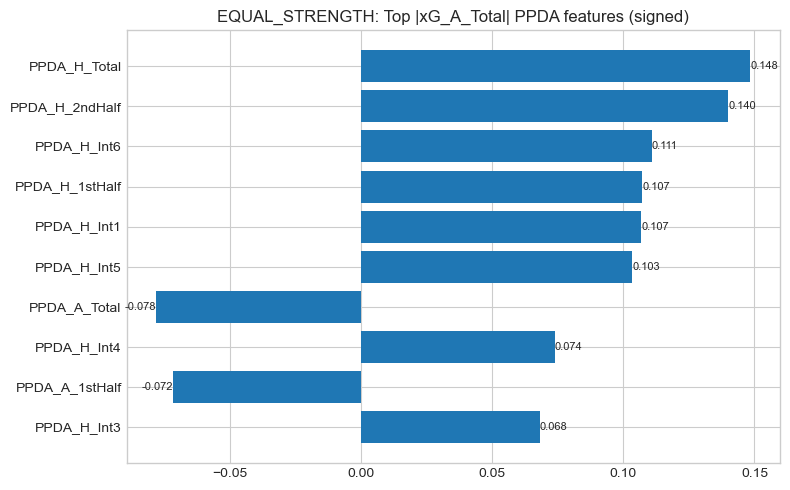

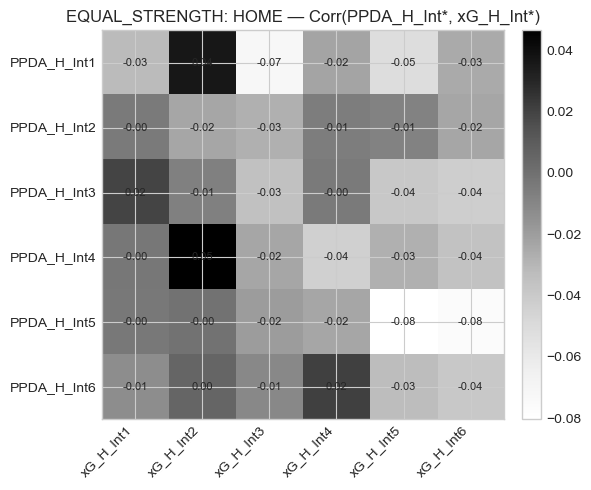

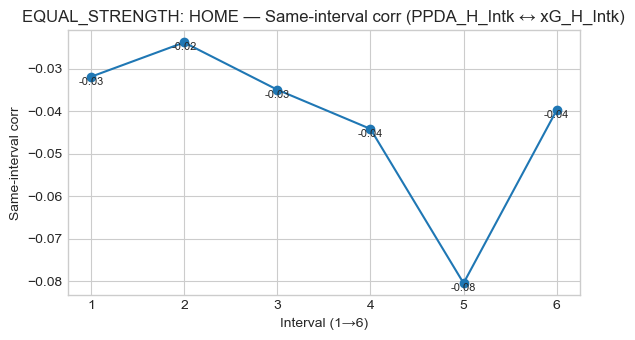

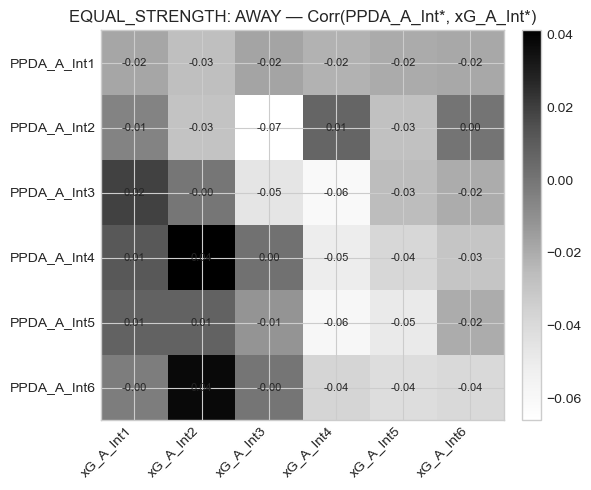

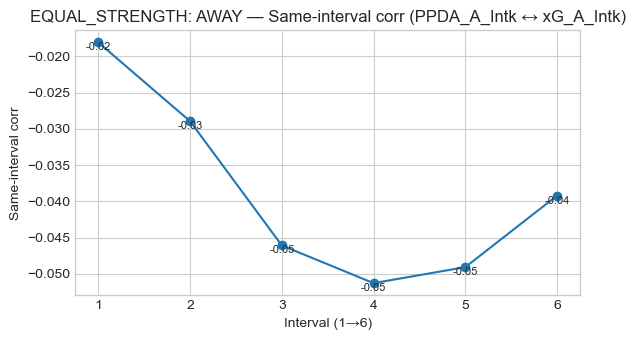

In [22]:
# =============================
# Matplotlib plots for your PPDA/xG analysis (robust column detection)
# =============================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# -----------------------------
# Helpers: find/normalize columns & labels
# -----------------------------
def _find_col(df, candidates):
    """Return the first matching column from candidates (case/space insensitive)."""
    norm_map = {c.lower().replace(" ", "_"): c for c in df.columns}
    for cand in candidates:
        key = cand.lower().replace(" ", "_")
        if key in norm_map:
            return norm_map[key]
    return None

def _is_label_column(series: pd.Series):
    """Heuristic: does this column look like per-team suspicion labels?"""
    if series.isna().all():
        return False
    vals = series.dropna().astype(str).str.lower().str.strip().unique().tolist()
    label_tokens = {"suspicious", "not suspicious", "unidentified"}
    # consider it a label col if all tokens are within that space
    return all(any(tok in v for tok in label_tokens) for v in vals)

def _normalize_strength(val: str):
    """Map relative strength strings to canonical tokens."""
    if not isinstance(val, str):
        return np.nan
    v = val.lower().strip()
    if "home" in v and "strong" in v:
        return "home_stronger"
    if "away" in v and "strong" in v:
        return "away_stronger"
    if "equal" in v:
        return "equal"
    # fallback
    return np.nan

def _norm_label(val: str):
    """Map any suspicion-ish value to canonical: suspicious / not suspicious / unidentified."""
    if not isinstance(val, str):
        return "unidentified"
    v = val.lower().strip()
    if "suspicious" in v and "not" not in v:
        return "suspicious"
    if "not suspicious" in v or v == "clean":
        return "not suspicious"
    if "unidentified" in v:
        return "unidentified"
    # generic fallbacks
    if v in {"susp", "sus"}:
        return "suspicious"
    if v in {"ns", "clean"}:
        return "not suspicious"
    return "unidentified"

def _labels_from_match_type(df, match_col):
    """
    Derive per-team labels from a single match-level 'MatchSuspicionType' style column,
    handling patterns like 'home suspicious', 'away suspicious', 'both suspicious', 'unidentified', 'not suspicious'.
    """
    mt = df[match_col].astype(str).str.lower().str.strip()
    home = []
    away = []
    for v in mt:
        if "both" in v and "suspicious" in v:
            home.append("suspicious"); away.append("suspicious")
        elif "home" in v and "suspicious" in v:
            home.append("suspicious"); away.append("not suspicious")
        elif "away" in v and "suspicious" in v:
            home.append("not suspicious"); away.append("suspicious")
        elif "not suspicious" in v:
            home.append("not suspicious"); away.append("not suspicious")
        elif "unidentified" in v or v == "" or v == "nan":
            home.append("unidentified"); away.append("unidentified")
        else:
            # unknown text -> default to unidentified
            home.append("unidentified"); away.append("unidentified")
    return pd.Series(home, index=df.index, name="home_label"), pd.Series(away, index=df.index, name="away_label")

def normalize_columns(df: pd.DataFrame) -> pd.DataFrame:
    """
    Adds/normalizes these canonical columns if missing:
      home_label, away_label, rel_strength
    Does NOT drop any original columns.
    """
    out = df.copy()

    # --- relative strength ---
    rel_strength_col = _find_col(out, ["Relative quality", "rel_strength", "relative_strength", "Relative_quality"])
    if rel_strength_col is not None:
        out["rel_strength"] = out[rel_strength_col].apply(_normalize_strength)
    else:
        out["rel_strength"] = np.nan  # if absent, subsets using rel_strength will be empty

    # --- per-team labels ---
    home_label_col = _find_col(out, ["home_label", "home team", "home_team"])
    away_label_col = _find_col(out, ["away_label", "away team", "away_team"])
    match_col      = _find_col(out, ["MatchSuspicionType", "match_suspicion_type", "suspicion", "Suspicion"])

    have_home_as_labels = home_label_col is not None and _is_label_column(out[home_label_col])
    have_away_as_labels = away_label_col is not None and _is_label_column(out[away_label_col])

    if have_home_as_labels and have_away_as_labels:
        out["home_label"] = out[home_label_col].apply(_norm_label)
        out["away_label"] = out[away_label_col].apply(_norm_label)
    elif match_col is not None:
        h, a = _labels_from_match_type(out, match_col)
        out["home_label"] = h.apply(_norm_label)
        out["away_label"] = a.apply(_norm_label)
    else:
        # best-effort: default to unidentified
        out["home_label"] = "unidentified"
        out["away_label"] = "unidentified"

    return out

# -----------------------------
# Subset selectors (using normalized columns)
# -----------------------------
def get_subsets(df: pd.DataFrame):
    df = normalize_columns(df)
    subsets = {}

    # All games
    subsets["ALL"] = df

    # Clean / Suspicious / Unidentified (per-team labels)
    subsets["CLEAN_BOTH"] = df[(df["home_label"] == "not suspicious") & (df["away_label"] == "not suspicious")]
    subsets["SUSP_ANY"]   = df[(df["home_label"] == "suspicious") | (df["away_label"] == "suspicious")]
    subsets["HOME_SUSP"]  = df[(df["home_label"] == "suspicious") & (df["away_label"] != "suspicious")]
    subsets["AWAY_SUSP"]  = df[(df["away_label"] == "suspicious") & (df["home_label"] != "suspicious")]
    subsets["BOTH_SUSP"]  = df[(df["home_label"] == "suspicious") & (df["away_label"] == "suspicious")]
    subsets["UNIDENTIFIED"]= df[(df["home_label"] == "unidentified") | (df["away_label"] == "unidentified")]

    # Relative strength
    subsets["HOME_STRONGER"]  = df[df["rel_strength"] == "home_stronger"]
    subsets["AWAY_STRONGER"]  = df[df["rel_strength"] == "away_stronger"]
    subsets["EQUAL_STRENGTH"] = df[df["rel_strength"] == "equal"]

    return subsets

# -----------------------------
# Core correlation calculators
# -----------------------------
HOME_XG_INTS   = [f"xG_H_Int{i}" for i in range(1,7)]
AWAY_XG_INTS   = [f"xG_A_Int{i}" for i in range(1,7)]
HOME_PPDA_INTS = [f"PPDA_H_Int{i}" for i in range(1,7)]
AWAY_PPDA_INTS = [f"PPDA_A_Int{i}" for i in range(1,7)]

PPDA_FEATURES = (
    ["PPDA_H_Total","PPDA_H_1stHalf","PPDA_H_2ndHalf","PPDA_A_Total","PPDA_A_1stHalf","PPDA_A_2ndHalf"] +
    HOME_PPDA_INTS + AWAY_PPDA_INTS
)

def corr(a: pd.Series, b: pd.Series):
    if a is None or b is None: 
        return np.nan
    a = pd.to_numeric(a, errors="coerce")
    b = pd.to_numeric(b, errors="coerce")
    if a.dropna().nunique() < 2 or b.dropna().nunique() < 2:
        return np.nan
    return a.corr(b)

def compute_total_corrs(df: pd.DataFrame):
    return {
        "PPDA_H_Total ↔ xG_H_Total": corr(df.get("PPDA_H_Total"), df.get("xG_H_Total")),
        "PPDA_A_Total ↔ xG_A_Total": corr(df.get("PPDA_A_Total"), df.get("xG_A_Total")),
        # (Optional, often insightful:)
        "Opp.PPDA (A) ↔ xG_H_Total": corr(df.get("PPDA_A_Total"), df.get("xG_H_Total")),
        "Opp.PPDA (H) ↔ xG_A_Total": corr(df.get("PPDA_H_Total"), df.get("xG_A_Total")),
    }

def compute_halfwise_corrs(df: pd.DataFrame):
    return {
        "Home_1H (PPDA_H_1stHalf ↔ xG_H_Total)": corr(df.get("PPDA_H_1stHalf"), df.get("xG_H_Total")),
        "Home_2H (PPDA_H_2ndHalf ↔ xG_H_Total)": corr(df.get("PPDA_H_2ndHalf"), df.get("xG_H_Total")),
        "Away_1H (PPDA_A_1stHalf ↔ xG_A_Total)": corr(df.get("PPDA_A_1stHalf"), df.get("xG_A_Total")),
        "Away_2H (PPDA_A_2ndHalf ↔ xG_A_Total)": corr(df.get("PPDA_A_2ndHalf"), df.get("xG_A_Total")),
    }

def top_features_vs_xG(df: pd.DataFrame, side="H", k=10):
    """
    side = "H" for xG_H_Total; "A" for xG_A_Total
    Returns sorted Series by absolute value (signed correlations).
    """
    target = "xG_H_Total" if side == "H" else "xG_A_Total"
    vals = {}
    for f in PPDA_FEATURES:
        if f in df.columns:
            vals[f] = corr(df[f], df[target])
    if not vals:
        return pd.Series(dtype=float)
    s = pd.Series(vals).dropna()
    s = s.reindex(s.abs().sort_values(ascending=False).index)
    return s.head(min(k, len(s)))

def full_interval_corr_matrix(df: pd.DataFrame, side="H"):
    """
    Returns a 6x6 matrix: rows = PPDA_Int1..6, cols = xG_Int1..6
    """
    ppda_cols = HOME_PPDA_INTS if side == "H" else AWAY_PPDA_INTS
    xg_cols   = HOME_XG_INTS   if side == "H" else AWAY_XG_INTS
    missing = [c for c in (ppda_cols + xg_cols) if c not in df.columns]
    if missing:
        raise KeyError(f"Missing columns for interval matrix: {missing}")

    M = np.zeros((6,6), dtype=float)
    for i, pcol in enumerate(ppda_cols):
        for j, xcol in enumerate(xg_cols):
            M[i,j] = corr(df[pcol], df[xcol])
    return M, ppda_cols, xg_cols

def same_interval_series(df: pd.DataFrame, side="H"):
    """
    Returns a length-6 vector: corr(PPDA_*_Intk, xG_*_Intk) for k=1..6
    """
    ppda_cols = HOME_PPDA_INTS if side == "H" else AWAY_PPDA_INTS
    xg_cols   = HOME_XG_INTS   if side == "H" else AWAY_XG_INTS
    out = []
    for k in range(6):
        a = df.get(ppda_cols[k]); b = df.get(xg_cols[k])
        out.append(corr(a, b))
    return np.array(out, dtype=float)

# -----------------------------
# Plot helpers (matplotlib only; no specific colors)
# -----------------------------
def _nan_sanitize(d):
    """Drop NaNs to avoid bar/text issues; keep order."""
    return {k: v for k, v in d.items() if pd.notna(v)}

def plot_heatmap(M: np.ndarray, row_labels, col_labels, title):
    fig, ax = plt.subplots(figsize=(6,5))
    im = ax.imshow(M, aspect="auto")
    ax.set_xticks(range(len(col_labels)))
    ax.set_yticks(range(len(row_labels)))
    ax.set_xticklabels(col_labels, rotation=45, ha="right")
    ax.set_yticklabels(row_labels)
    ax.set_title(title)
    # annotate
    for i in range(M.shape[0]):
        for j in range(M.shape[1]):
            try:
                txt = f"{M[i,j]:.2f}"
            except Exception:
                txt = "nan"
            ax.text(j, i, txt, ha="center", va="center", fontsize=8)
    ax.figure.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    plt.show()

def plot_bar_dict(d: dict, title, ylabel="Correlation"):
    d = _nan_sanitize(d)
    if not d:
        print(f"[skip plot] {title} (no valid values)")
        return
    labels = list(d.keys())
    vals = [d[k] for k in labels]
    fig, ax = plt.subplots(figsize=(7,4))
    ax.bar(range(len(labels)), vals)
    ax.set_xticks(range(len(labels)))
    ax.set_xticklabels(labels, rotation=30, ha="right")
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    for i, v in enumerate(vals):
        ax.text(i, v + (0.01 if v>=0 else -0.01), f"{v:.3f}", ha="center",
                va="bottom" if v>=0 else "top", fontsize=8)
    plt.tight_layout()
    plt.show()

def plot_series(vals: np.ndarray, title, xlabel="Interval (1→6)", ylabel="Same-interval corr"):
    if vals is None or len(vals) == 0:
        print(f"[skip plot] {title} (no values)")
        return
    fig, ax = plt.subplots(figsize=(6,3.5))
    ax.plot(range(1,7), vals, marker="o")
    ax.set_xticks(range(1,7))
    ax.set_xlabel(xlabel)
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    for i, v in enumerate(vals, start=1):
        if pd.notna(v):
            ax.text(i, v, f"{v:.2f}", ha="center", va="bottom" if v>=0 else "top", fontsize=8)
    plt.tight_layout()
    plt.show()

def plot_top_features(ser: pd.Series, title):
    if ser is None or ser.empty:
        print(f"[skip plot] {title} (no values)")
        return
    fig, ax = plt.subplots(figsize=(8,5))
    ser = ser.iloc[::-1]  # horizontal bar from smallest to largest
    ax.barh(range(len(ser)), ser.values)
    ax.set_yticks(range(len(ser)))
    ax.set_yticklabels(ser.index)
    ax.set_title(title)
    for i, v in enumerate(ser.values):
        ax.text(v, i, f"{v:.3f}", va="center",
                ha="left" if v>=0 else "right", fontsize=8)
    plt.tight_layout()
    plt.show()

# -----------------------------
# Driver: run for each subset
# -----------------------------
def run_all_plots_for_subset(name: str, df_sub: pd.DataFrame):
    print(f"=== {name} | n={len(df_sub)} ===")

    if len(df_sub) < 3:
        print("[skip] subset too small for stable correlations.")
        return

    # 1) Totals (own ↔ own + opponent ↔ own for the key insight)
    totals = compute_total_corrs(df_sub)
    plot_bar_dict(totals, f"{name}: Total PPDA vs Total xG (incl. Opp.PPDA ↔ own xG)")

    # 2) Half-wise (own half PPDA ↔ own total xG)
    halves = compute_halfwise_corrs(df_sub)
    plot_bar_dict(halves, f"{name}: Half-wise PPDA ↔ own Total xG")

    # 3) Top features vs xG totals
    topH = top_features_vs_xG(df_sub, side="H", k=10)
    topA = top_features_vs_xG(df_sub, side="A", k=10)
    plot_top_features(topH, f"{name}: Top |xG_H_Total| PPDA features (signed)")
    plot_top_features(topA, f"{name}: Top |xG_A_Total| PPDA features (signed)")

    # 4) Full interval matrices (PPDA_Int vs xG_Int) + same-interval lines
    try:
        MH, rH, cH = full_interval_corr_matrix(df_sub, side="H")
        plot_heatmap(MH, rH, cH, f"{name}: HOME — Corr(PPDA_H_Int*, xG_H_Int*)")
        sameH = same_interval_series(df_sub, side="H")
        plot_series(sameH, f"{name}: HOME — Same-interval corr (PPDA_H_Intk ↔ xG_H_Intk)")
    except KeyError as e:
        print(f"[skip HOME interval plots] {e}")

    try:
        MA, rA, cA = full_interval_corr_matrix(df_sub, side="A")
        plot_heatmap(MA, rA, cA, f"{name}: AWAY — Corr(PPDA_A_Int*, xG_A_Int*)")
        sameA = same_interval_series(df_sub, side="A")
        plot_series(sameA, f"{name}: AWAY — Same-interval corr (PPDA_A_Intk ↔ xG_A_Intk)")
    except KeyError as e:
        print(f"[skip AWAY interval plots] {e}")

# =============================
# RUN (assumes you already have a DataFrame named `df`)
# =============================
# Example: df = pd.read_csv("your_data.csv")

subsets = get_subsets(df)
for key, dsub in subsets.items():
    run_all_plots_for_subset(key, dsub)

# Correlation Analysis

In [23]:
# === Correlation Section (7 Categories × 4 Subsets) ===
# Prints for each category/subset:
#   1) Interval-wise correlations (PPDA_H vs xG_H, PPDA_A vs xG_A)
#   2) Total PPDA ↔ Total xG (Home & Away)
#   3) Half-wise correlations (1st & 2nd halves, Home & Away)
#   4) Top-10 most correlated features with xG_H_Total and xG_A_Total (excluding xG features; signed)
#
# Notes:
# - "Matches Analyzed: x out of y" → for Overall: y = full dataset; for other subsets: y = category size
# - Two-line separator printed ONCE per subset section
# - Run after your `df` is prepared with all engineered columns

import pandas as pd
import numpy as np

# --------- Config ---------
TOP_N = 10  # number of top features to display (signed correlations)

# --------- Column groups ---------
ppda_h_cols = [f"PPDA_H_Int{i}" for i in range(1, 7)]
ppda_a_cols = [f"PPDA_A_Int{i}" for i in range(1, 7)]
xg_h_cols   = [f"xG_H_Int{i}"   for i in range(1, 7)]
xg_a_cols   = [f"xG_A_Int{i}"   for i in range(1, 7)]

half_total_cols = [
    "PPDA_H_1stHalf","PPDA_H_2ndHalf","PPDA_H_Total",
    "PPDA_A_1stHalf","PPDA_A_2ndHalf","PPDA_A_Total",
    "xG_H_1stHalf","xG_H_2ndHalf","xG_H_Total",
    "xG_A_1stHalf","xG_A_2ndHalf","xG_A_Total",
]

all_interval_cols = ppda_h_cols + ppda_a_cols + xg_h_cols + xg_a_cols
feature_cols = all_interval_cols + half_total_cols

# --------- Helpers ---------
def print_divider():
    print("\n" + "="*100 + "\n")  # two-line style (line + trailing newline)

def safe_corr(a: pd.Series, b: pd.Series):
    a = pd.to_numeric(a, errors="coerce")
    b = pd.to_numeric(b, errors="coerce")
    if a.count() < 2 or b.count() < 2:
        return np.nan
    return a.corr(b)

def top_corr_signed(dfs: pd.DataFrame, target: str, topn: int = 10) -> pd.Series:
    """Return signed correlations with `target`, excluding all other xG features."""
    num_df = dfs.select_dtypes(include="number")
    if target not in num_df.columns or num_df.shape[0] < 2:
        return pd.Series(dtype=float)
    to_use = [c for c in num_df.columns if (("xG" not in c) or (c == target))]
    corr_series = num_df[to_use].corr()[target].drop(labels=[target], errors="ignore")
    corr_series = corr_series.dropna()
    if corr_series.empty:
        return corr_series
    return corr_series.reindex(corr_series.abs().sort_values(ascending=False).index).head(topn)

def analyze_block(dfs: pd.DataFrame, label: str, out_of_count: int, topn: int = TOP_N):
    n = len(dfs)
    print(f"\n## 🔍 Correlation Analysis — {label}")
    print(f"### 🧮 Matches Analyzed: {n} out of {out_of_count}\n")

    if n < 2:
        print("Not enough matches to compute stable correlations.")
        print_divider()
        return

    # 1) Interval-wise: PPDA_H vs xG_H
    try:
        corr_home = dfs[ppda_h_cols + xg_h_cols].corr().loc[ppda_h_cols, xg_h_cols].round(3)
    except Exception:
        corr_home = pd.DataFrame()
    print("### 🏠 PPDA_H Intervals vs xG_H Intervals")
    print(corr_home.to_string() if not corr_home.empty else "(insufficient data)")

    # 1b) Interval-wise: PPDA_A vs xG_A
    try:
        corr_away = dfs[ppda_a_cols + xg_a_cols].corr().loc[ppda_a_cols, xg_a_cols].round(3)
    except Exception:
        corr_away = pd.DataFrame()
    print("\n### 🟠 PPDA_A Intervals vs xG_A Intervals")
    print(corr_away.to_string() if not corr_away.empty else "(insufficient data)")

    # 2) Totals
    h_total = safe_corr(dfs["PPDA_H_Total"], dfs["xG_H_Total"])
    a_total = safe_corr(dfs["PPDA_A_Total"], dfs["xG_A_Total"])
    print("\n### 📊 Total PPDA ↔ Total xG")
    print(f"Home PPDA Total vs Home xG Total: {np.round(h_total, 3)}")
    print(f"Away PPDA Total vs Away xG Total: {np.round(a_total, 3)}")

    # 3) Halves
    h1 = safe_corr(dfs["PPDA_H_1stHalf"], dfs["xG_H_1stHalf"])
    h2 = safe_corr(dfs["PPDA_H_2ndHalf"], dfs["xG_H_2ndHalf"])
    a1 = safe_corr(dfs["PPDA_A_1stHalf"], dfs["xG_A_1stHalf"])
    a2 = safe_corr(dfs["PPDA_A_2ndHalf"], dfs["xG_A_2ndHalf"])
    print("\n### 🕒 Half-wise Correlation")
    print(f"1st Half → Home: {np.round(h1,3)} | Away: {np.round(a1,3)}")
    print(f"2nd Half → Home: {np.round(h2,3)} | Away: {np.round(a2,3)}")

    # 4) Top-10 most correlated (signed), excluding any xG features (except target)
    print("\n### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)")
    top_h = top_corr_signed(dfs, "xG_H_Total", topn=topn)
    print(top_h.round(3).to_string() if not top_h.empty else "(insufficient data)")

    print("\n### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)")
    top_a = top_corr_signed(dfs, "xG_A_Total", topn=topn)
    print(top_a.round(3).to_string() if not top_a.empty else "(insufficient data)")

    print_divider()

# --------- Category & subset masks (your 7 × 4 framework) ---------
def mask_all(d):                 return pd.Series(True, index=d.index)
def mask_clean(d):               return d["MatchSuspicionType"] == "both not suspicious"
def mask_susp_any(d):            return d["MatchSuspicionType"].isin(["home suspicious","away suspicious","both suspicious"])
def mask_home_susp(d):           return d["MatchSuspicionType"] == "home suspicious"
def mask_away_susp(d):           return d["MatchSuspicionType"] == "away suspicious"
def mask_both_susp(d):           return d["MatchSuspicionType"] == "both suspicious"
def mask_unidentified(d):        return d["MatchSuspicionType"] == "unidentified"

def mask_home_stronger(d):       return d["Relative quality"] == "home team stronger"
def mask_away_stronger(d):       return d["Relative quality"] == "away team stronger"
def mask_equal_strength(d):      return d["Relative quality"] == "equal strength teams"

CATEGORIES = [
    ("All Matches",                   mask_all),
    ("Clean (Both Not Suspicious)",   mask_clean),
    ("Suspicious (Any of Home/Away/Both)", mask_susp_any),
    ("Home Suspicious",               mask_home_susp),
    ("Away Suspicious",               mask_away_susp),
    ("Both Suspicious",               mask_both_susp),
    ("Unidentified",                  mask_unidentified),
]

SUBSETS = [
    ("Overall",        mask_all),          # within-category overall
    ("Home Stronger",  mask_home_stronger),
    ("Away Stronger",  mask_away_stronger),
    ("Equal Strength", mask_equal_strength),
]

# --------- Run all ---------
df_all = df.copy()
full_n = len(df_all)

# Optional: check required columns
required_cols = set(ppda_h_cols + ppda_a_cols + xg_h_cols + xg_a_cols + half_total_cols + ["MatchSuspicionType","Relative quality"])
missing = [c for c in required_cols if c not in df_all.columns]
if missing:
    raise ValueError(f"Missing required columns for correlation section: {missing}")

for cat_label, cat_mask in CATEGORIES:
    df_cat = df_all[cat_mask(df_all)]
    n_cat = len(df_cat)

    for sub_label, sub_mask in SUBSETS:
        df_sub = df_cat[sub_mask(df_cat)]
        out_of = full_n if sub_label == "Overall" else n_cat
        analyze_block(df_sub, f"{cat_label} — {sub_label}", out_of, topn=TOP_N)


## 🔍 Correlation Analysis — All Matches — Overall
### 🧮 Matches Analyzed: 5170 out of 5170

### 🏠 PPDA_H Intervals vs xG_H Intervals
             xG_H_Int1  xG_H_Int2  xG_H_Int3  xG_H_Int4  xG_H_Int5  xG_H_Int6
PPDA_H_Int1     -0.065     -0.048     -0.082     -0.071     -0.074     -0.060
PPDA_H_Int2     -0.051     -0.059     -0.074     -0.057     -0.059     -0.064
PPDA_H_Int3     -0.019     -0.032     -0.076     -0.050     -0.063     -0.061
PPDA_H_Int4     -0.016      0.002     -0.050     -0.059     -0.060     -0.087
PPDA_H_Int5     -0.007     -0.010     -0.023     -0.050     -0.062     -0.066
PPDA_H_Int6     -0.019     -0.007     -0.027      0.023     -0.034     -0.089

### 🟠 PPDA_A Intervals vs xG_A Intervals
             xG_A_Int1  xG_A_Int2  xG_A_Int3  xG_A_Int4  xG_A_Int5  xG_A_Int6
PPDA_A_Int1     -0.064     -0.061     -0.070     -0.049     -0.067     -0.053
PPDA_A_Int2     -0.035     -0.068     -0.081     -0.048     -0.062     -0.055
PPDA_A_Int3     -0.002     -0.036     -0.058

🧭 Baseline Definition (Markdown)

We use Clean (Both Not Suspicious) — Overall as the baseline.
This baseline reflects correlation behavior in matches with no suspicion flags, and we compare every other category against it.

What the plots show:
	•	Home Total and Away Total: correlation between PPDA_*_Total and xG_*_Total for each category, with a horizontal line marking the clean-baseline value.
	•	Home Halves and Away Halves: correlations for 1st and 2nd halves (PPDA_*_1stHalf ↔ xG_*_1stHalf, PPDA_*_2ndHalf ↔ xG_*_2ndHalf) across categories, again with the clean-baseline lines.
	•	Under the plots, an exact values table (including sample sizes) is printed for audit/compare.

Use these to spot where a category’s correlations deviate up/down from the clean standard.


## All Matches — Overall | Matches: 5170 out of 5170
   Baseline (Clean ⨉ Overall) size: 51


/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


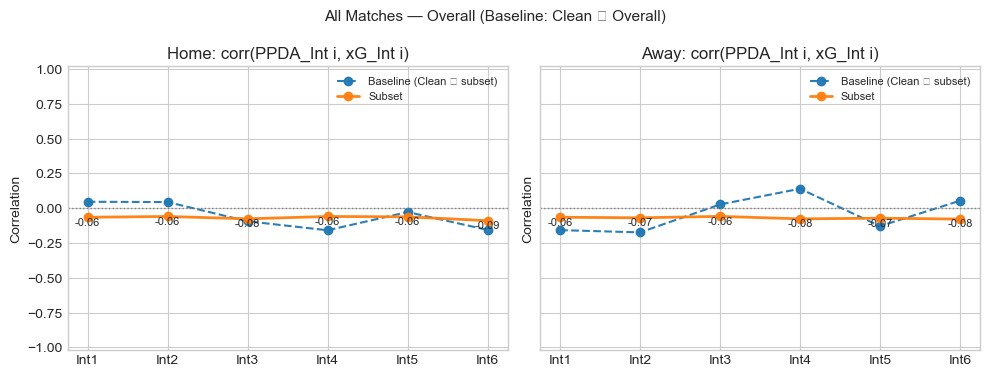


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.176 | base=-0.290 | Δ=0.114
Away_Total: subset=-0.178 | base=-0.159 | Δ=-0.019
  Home_1st: subset=-0.129 | base=-0.028 | Δ=-0.101
  Home_2nd: subset=-0.129 | base=-0.250 | Δ=0.121
  Away_1st: subset=-0.127 | base=-0.071 | Δ=-0.056
  Away_2nd: subset=-0.151 | base=-0.060 | Δ=-0.091

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.261
PPDA_A_1stHalf        0.224
PPDA_A_2ndHalf        0.213
PPDA_A_Early          0.208
PPDA_A_Late           0.205
PPDA_A_TotalChange    0.188
PPDA_A_Mid            0.182
PPDA_H_Total         -0.176
PPDA_H_1stHalf       -0.173
PPDA_A_Int1           0.165

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.257
PPDA_H_1stHalf        0.217
PPDA_H_2ndHalf        0.208
PPDA_H_Early          0.199
PPDA_H_Late           0.192
PPDA_H_Mid            0.191
PPDA_A_Total         -0.178
PPDA_H_TotalChange    0

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


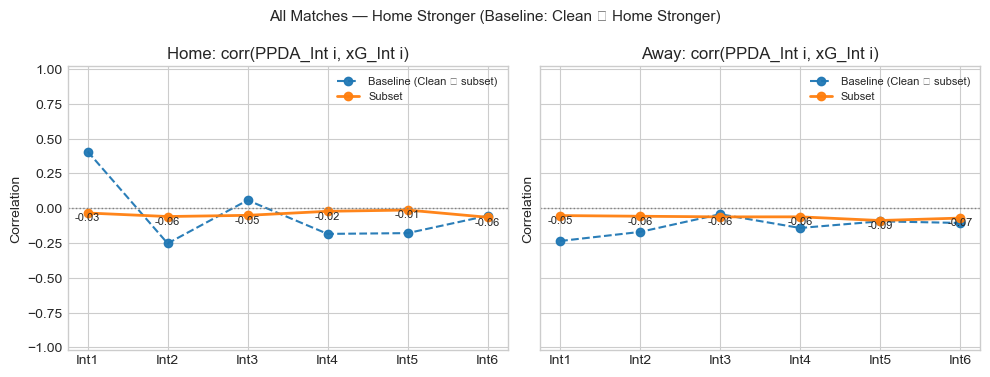


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.059 | base=-0.027 | Δ=-0.032
Away_Total: subset=-0.130 | base=-0.124 | Δ=-0.006
  Home_1st: subset=-0.083 | base=0.397 | Δ=-0.480
  Home_2nd: subset=-0.050 | base=-0.317 | Δ=0.267
  Away_1st: subset=-0.091 | base=0.012 | Δ=-0.104
  Away_2nd: subset=-0.136 | base=-0.161 | Δ=0.025

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.227
PPDA_A_Late           0.209
PPDA_A_2ndHalf        0.208
PPDA_A_Int6           0.199
PPDA_A_Early          0.178
PPDA_A_1stHalf        0.173
PPDA_A_TotalChange    0.152
PPDA_A_Int4           0.143
PPDA_A_Mid            0.134
PPDA_A_Int1           0.134

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.137
PPDA_A_Total         -0.130
PPDA_A_Late          -0.120
PPDA_H_1stHalf        0.116
PPDA_H_Late           0.116
PPDA_A_2ndHalf       -0.113
PPDA_H_TotalChange    0.108
PPDA_A_1stHalf       -0.1

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


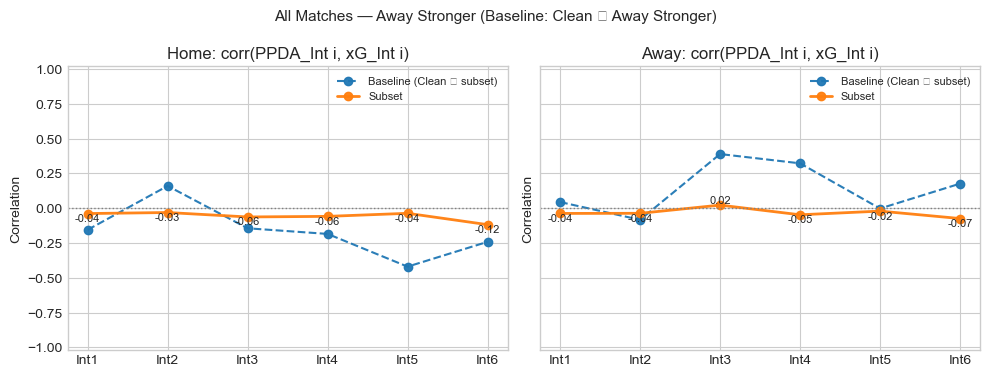


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.146 | base=-0.435 | Δ=0.290
Away_Total: subset=-0.073 | base=-0.034 | Δ=-0.039
  Home_1st: subset=-0.089 | base=-0.034 | Δ=-0.055
  Home_2nd: subset=-0.126 | base=-0.336 | Δ=0.211
  Away_1st: subset=-0.043 | base=0.065 | Δ=-0.109
  Away_2nd: subset=-0.092 | base=0.091 | Δ=-0.183

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Total         -0.146
PPDA_H_2ndHalf       -0.132
PPDA_H_Early         -0.123
PPDA_A_1stHalf        0.122
PPDA_H_Int4          -0.121
PPDA_H_Int6          -0.118
PPDA_H_Late          -0.118
PPDA_A_Total          0.117
PPDA_H_1stHalf       -0.111
PPDA_H_TotalChange   -0.108

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.242
PPDA_H_2ndHalf        0.217
PPDA_H_Mid            0.201
PPDA_H_1stHalf        0.187
PPDA_H_Late           0.182
PPDA_H_Int5           0.180
PPDA_H_Early          0.169
PPDA_H_TotalChange    0.1

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


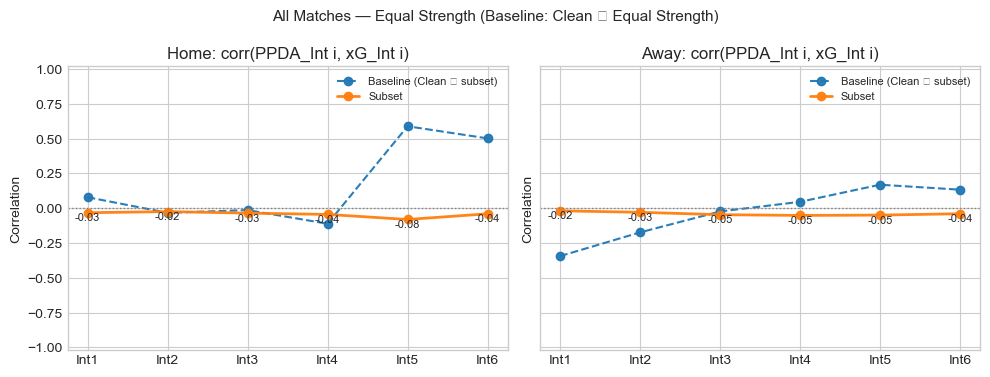


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.089 | base=0.148 | Δ=-0.237
Away_Total: subset=-0.078 | base=-0.119 | Δ=0.041
  Home_1st: subset=-0.043 | base=0.051 | Δ=-0.094
  Home_2nd: subset=-0.099 | base=0.416 | Δ=-0.514
  Away_1st: subset=-0.057 | base=-0.108 | Δ=0.051
  Away_2nd: subset=-0.093 | base=0.036 | Δ=-0.128

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total      0.116
PPDA_A_2ndHalf    0.108
PPDA_A_Late       0.099
PPDA_A_Int6       0.094
PPDA_H_Total     -0.089
PPDA_A_1stHalf    0.085
PPDA_H_Int5      -0.084
PPDA_A_Early      0.083
PPDA_H_Mid       -0.077
PPDA_H_2ndHalf   -0.076

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.148
PPDA_H_2ndHalf        0.140
PPDA_H_Early          0.119
PPDA_H_Late           0.114
PPDA_H_Int6           0.111
PPDA_H_1stHalf        0.107
PPDA_H_Int1           0.107
PPDA_H_TotalChange    0.105
PPDA_H_Int5           0.103
PPDA_H_Mid 

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


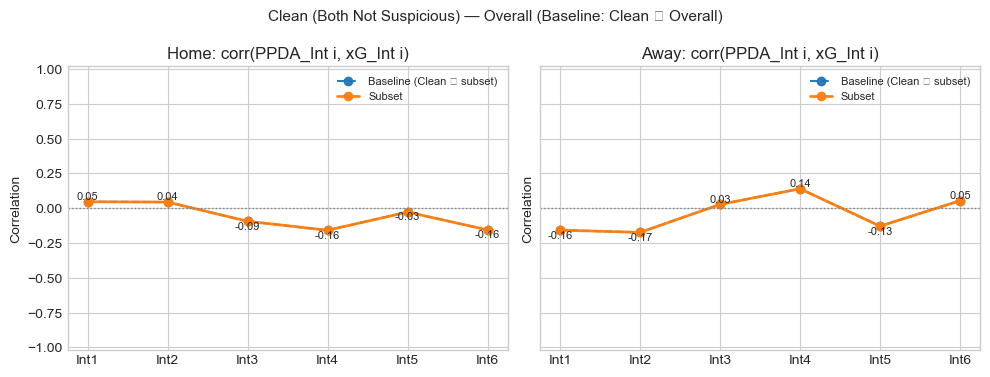

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.290 | base=-0.290 | Δ=0.000
Away_Total: subset=-0.159 | base=-0.159 | Δ=0.000
  Home_1st: subset=-0.028 | base=-0.028 | Δ=0.000
  Home_2nd: subset=-0.250 | base=-0.250 | Δ=0.000
  Away_1st: subset=-0.071 | base=-0.071 | Δ=0.000
  Away_2nd: subset=-0.060 | base=-0.060 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Int5           0.343
PPDA_H_TotalChange   -0.320
PPDA_H_2ndHalf       -0.309
PPDA_H_Int5          -0.299
PPDA_H_Total         -0.290
PPDA_H_Mid           -0.289
PPDA_A_Mid            0.285
PPDA_A_2ndHalf        0.265
PPDA_A_Change         0.243
AwayPressingDrop      0.232

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Mid            0.258
PPDA_H_Total          0.238
PPDA_H_Int5           0.234
PPDA_H_Late           0.229
PPDA_H_2ndHalf        0.201
PPDA_H_Int6           0.198
PPDA_A_Int2          -0.192
PPDA_H_TotalChange    0.186

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


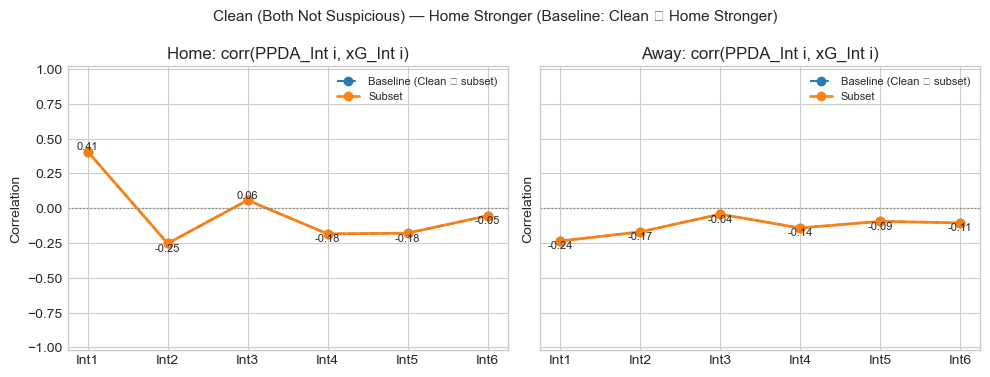

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.027 | base=-0.027 | Δ=0.000
Away_Total: subset=-0.124 | base=-0.124 | Δ=0.000
  Home_1st: subset=0.397 | base=0.397 | Δ=0.000
  Home_2nd: subset=-0.317 | base=-0.317 | Δ=0.000
  Away_1st: subset=0.012 | base=0.012 | Δ=0.000
  Away_2nd: subset=-0.161 | base=-0.161 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Change     0.621
PPDA_A_2ndHalf    0.513
PPDA_A_Int4       0.460
PPDA_A_Int5       0.420
PPDA_A_Int3      -0.386
PPDA_A_Mid        0.382
PPDA_H_Change    -0.352
PPDA_H_Int4      -0.344
PPDA_A_Early      0.334
PPDA_H_Int5      -0.289

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Int1          -0.435
PPDA_H_Early         -0.378
PPDA_H_TotalChange   -0.357
PPDA_H_Total         -0.282
PPDA_H_1stHalf       -0.244
PPDA_H_Int5          -0.226
PPDA_A_Int5           0.224
PPDA_H_Int4          -0.222
PPDA_H_2ndHalf       -0.222
PPDA_A_Change  

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


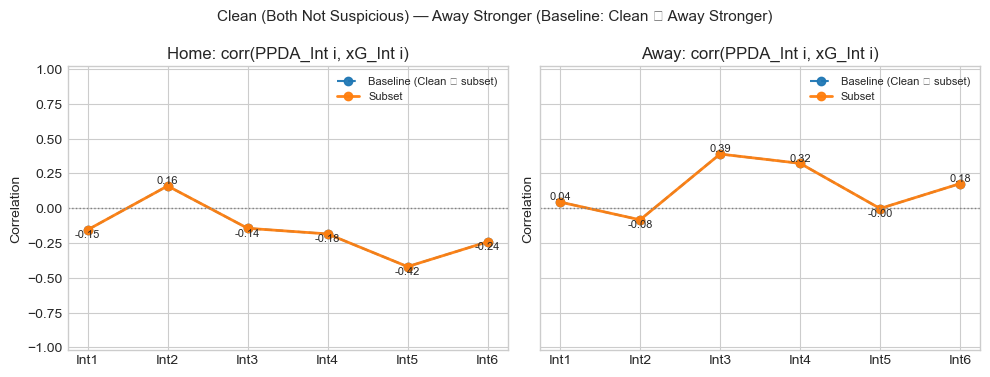


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.435 | base=-0.435 | Δ=0.000
Away_Total: subset=-0.034 | base=-0.034 | Δ=0.000
  Home_1st: subset=-0.034 | base=-0.034 | Δ=0.000
  Home_2nd: subset=-0.336 | base=-0.336 | Δ=0.000
  Away_1st: subset=0.065 | base=0.065 | Δ=0.000
  Away_2nd: subset=0.091 | base=0.091 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Int3           0.539
PPDA_H_Total         -0.435
PPDA_H_TotalChange   -0.419
HomeAttackingDrop    -0.405
PPDA_H_2ndHalf       -0.385
PPDA_A_Int2          -0.382
PPDA_H_Late          -0.354
PPDA_A_Mid           -0.342
PPDA_H_Mid           -0.341
AwayAttackingDrop     0.327

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Int5          0.330
PPDA_H_Mid           0.319
PPDA_A_Int3          0.262
PPDA_H_Int3          0.228
HomeAttackingDrop   -0.214
PPDA_H_Int4         -0.192
PPDA_H_Late          0.192
PPDA_H_Total         0.188
HomePressin

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


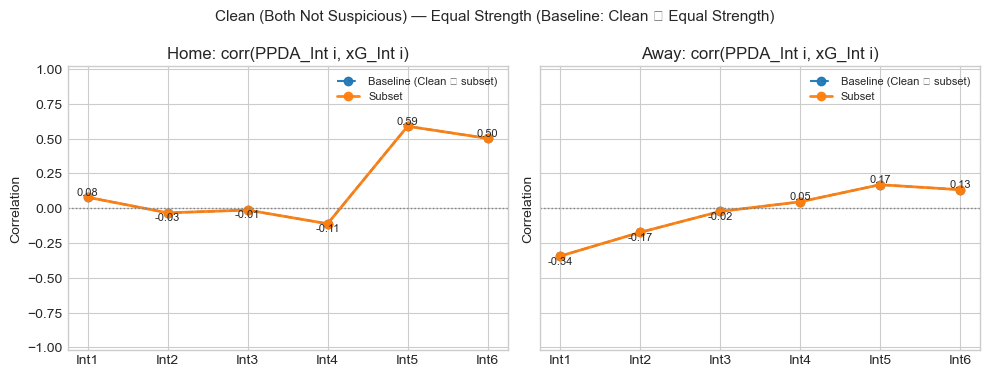

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.148 | base=0.148 | Δ=0.000
Away_Total: subset=-0.119 | base=-0.119 | Δ=0.000
  Home_1st: subset=0.051 | base=0.051 | Δ=0.000
  Home_2nd: subset=0.416 | base=0.416 | Δ=0.000
  Away_1st: subset=-0.108 | base=-0.108 | Δ=0.000
  Away_2nd: subset=0.036 | base=0.036 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int6         0.561
PPDA_H_Late         0.461
PPDA_A_Int1        -0.345
PPDA_A_Int6        -0.300
HomePressingDrop   -0.282
PPDA_H_Int4         0.266
PPDA_H_Int3         0.255
PPDA_A_Int5         0.222
PPDA_A_Late        -0.207
PPDA_A_Int4         0.206

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Int5           0.407
PPDA_A_Int2          -0.367
PPDA_H_Int1           0.353
PPDA_H_Early          0.320
HomePressingDrop      0.277
PPDA_A_Mid           -0.267
AwayAttackingDrop    -0.259
PPDA_A_Change         0.255
PPDA_A_TotalChange   -0.236

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


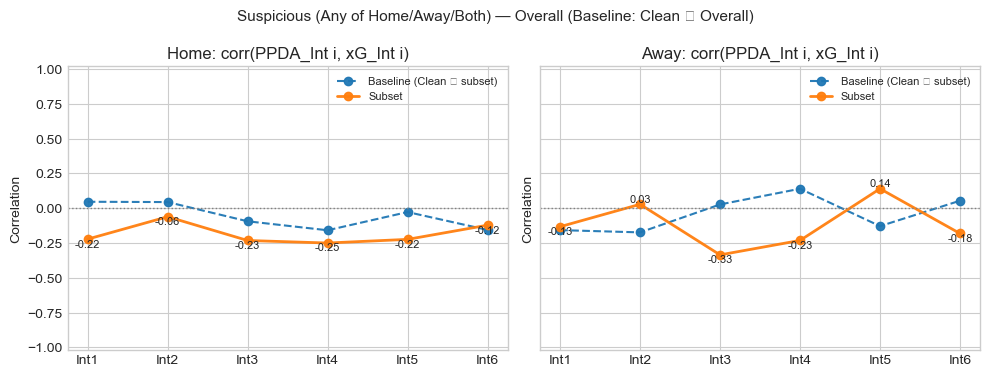

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.357 | base=-0.290 | Δ=-0.066
Away_Total: subset=-0.204 | base=-0.159 | Δ=-0.045
  Home_1st: subset=-0.341 | base=-0.028 | Δ=-0.313
  Home_2nd: subset=-0.162 | base=-0.250 | Δ=0.088
  Away_1st: subset=-0.373 | base=-0.071 | Δ=-0.302
  Away_2nd: subset=-0.021 | base=-0.060 | Δ=0.039

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Early        -0.409
PPDA_H_Int1         -0.379
PPDA_H_1stHalf      -0.375
AwayPressingDrop    -0.372
AwayAttackingDrop    0.368
PPDA_H_Total        -0.357
PPDA_A_1stHalf       0.298
PPDA_H_Late         -0.273
PPDA_A_Int3          0.269
PPDA_H_Int3         -0.261

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Early      0.434
PPDA_H_Int4       0.395
PPDA_A_Early     -0.374
PPDA_A_1stHalf   -0.369
PPDA_A_Int1      -0.307
PPDA_H_Int1       0.257
PPDA_A_Change     0.224
PPDA_A_Int3      -0.222
PPDA_A_Int4      -0.206
PPDA_A_Total 

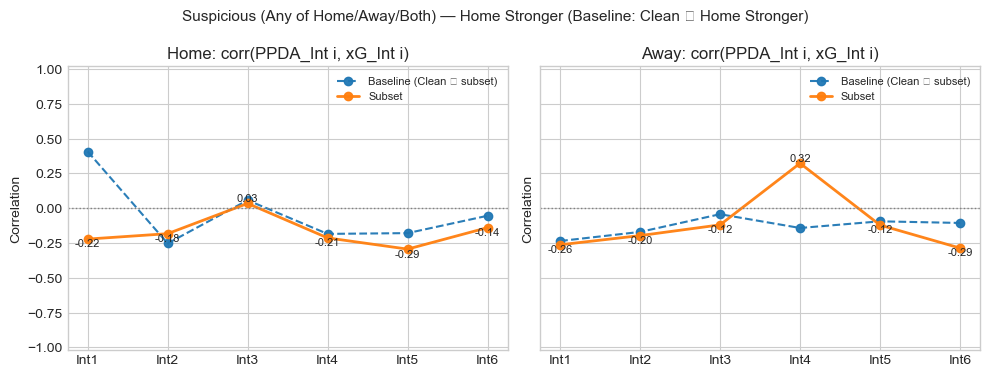

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.140 | base=-0.027 | Δ=0.167
Away_Total: subset=-0.201 | base=-0.124 | Δ=-0.077
  Home_1st: subset=-0.131 | base=0.397 | Δ=-0.528
  Home_2nd: subset=-0.048 | base=-0.317 | Δ=0.269
  Away_1st: subset=-0.279 | base=0.012 | Δ=-0.291
  Away_2nd: subset=-0.339 | base=-0.161 | Δ=-0.178

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int5           0.612
PPDA_H_TotalChange    0.558
PPDA_H_Mid            0.530
PPDA_H_Change         0.514
AwayAttackingDrop     0.459
AwayPressingDrop     -0.405
PPDA_H_Int1          -0.387
PPDA_H_2ndHalf        0.371
HomePressingDrop      0.302
PPDA_H_1stHalf       -0.281

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_TotalChange    0.443
PPDA_H_Total          0.416
PPDA_A_Int3           0.382
PPDA_H_Int5           0.381
PPDA_H_2ndHalf        0.380
PPDA_A_2ndHalf       -0.366
PPDA_H_Early          0.360
PPDA_A_Early         -0.32

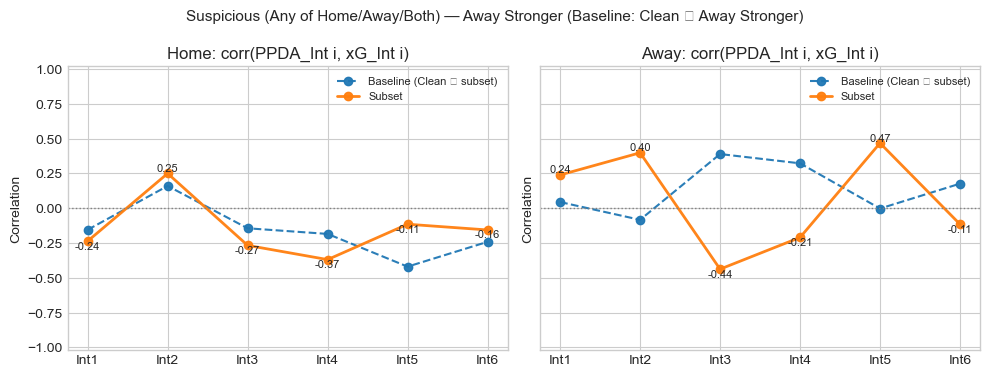


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.441 | base=-0.435 | Δ=-0.006
Away_Total: subset=0.285 | base=-0.034 | Δ=0.319
  Home_1st: subset=-0.361 | base=-0.034 | Δ=-0.327
  Home_2nd: subset=-0.054 | base=-0.336 | Δ=0.282
  Away_1st: subset=-0.048 | base=0.065 | Δ=-0.113
  Away_2nd: subset=0.270 | base=0.091 | Δ=0.179

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Mid       -0.575
PPDA_H_Int1      -0.521
PPDA_H_Total     -0.441
PPDA_A_Int3       0.425
PPDA_H_Int5      -0.421
PPDA_A_Int4      -0.376
PPDA_H_1stHalf   -0.361
PPDA_A_Late       0.345
PPDA_H_Int2      -0.335
PPDA_H_Early     -0.328

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Int6       0.517
PPDA_A_Int3      -0.509
PPDA_A_Change     0.471
PPDA_H_Int6      -0.457
PPDA_A_2ndHalf    0.407
PPDA_H_Int5      -0.400
PPDA_A_Late       0.360
PPDA_H_Late      -0.359
PPDA_A_Int5       0.357
PPDA_H_2ndHalf   -0.344



## Suspicious (Any of

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


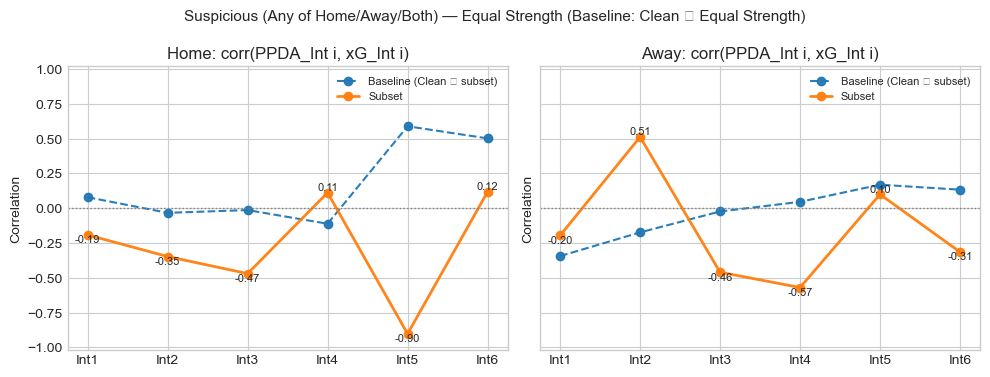


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.476 | base=0.148 | Δ=-0.624
Away_Total: subset=-0.510 | base=-0.119 | Δ=-0.391
  Home_1st: subset=-0.413 | base=0.051 | Δ=-0.464
  Home_2nd: subset=-0.102 | base=0.416 | Δ=-0.517
  Away_1st: subset=-0.583 | base=-0.108 | Δ=-0.475
  Away_2nd: subset=-0.120 | base=0.036 | Δ=-0.155

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Late          -0.520
PPDA_H_Int3          -0.490
PPDA_H_Int6          -0.485
PPDA_H_Total         -0.476
PPDA_H_2ndHalf       -0.451
PPDA_A_Int4          -0.438
HomeAttackingDrop     0.399
PPDA_H_Mid           -0.392
PPDA_H_1stHalf       -0.381
PPDA_H_TotalChange   -0.369

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Early      0.797
PPDA_H_Int5       0.752
PPDA_A_Int2      -0.726
PPDA_A_1stHalf   -0.644
PPDA_H_Int1       0.592
PPDA_A_Late      -0.527
PPDA_A_Total     -0.510
PPDA_H_Int4       0.482
PPDA_A_Early     -0.447
PPDA_

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


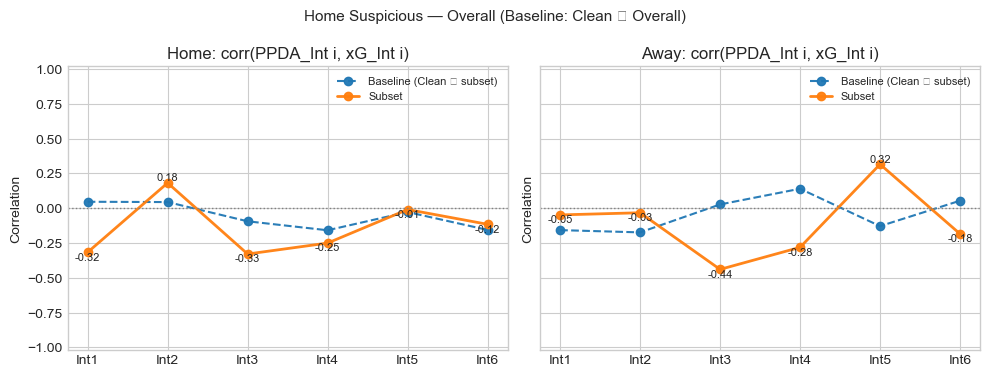


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.322 | base=-0.290 | Δ=-0.032
Away_Total: subset=0.301 | base=-0.159 | Δ=0.460
  Home_1st: subset=-0.253 | base=-0.028 | Δ=-0.225
  Home_2nd: subset=-0.043 | base=-0.250 | Δ=0.206
  Away_1st: subset=-0.222 | base=-0.071 | Δ=-0.151
  Away_2nd: subset=0.429 | base=-0.060 | Δ=0.489

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Late          -0.503
PPDA_H_Int3          -0.489
PPDA_A_1stHalf        0.458
PPDA_A_Int1           0.447
PPDA_H_TotalChange   -0.367
PPDA_A_Int3           0.357
AwayAttackingDrop     0.332
PPDA_H_Total         -0.322
AwayPressingDrop     -0.280
PPDA_A_Early          0.275

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Change         0.592
PPDA_A_2ndHalf        0.515
PPDA_A_Int6           0.468
PPDA_A_Int5           0.436
PPDA_H_Early          0.436
PPDA_H_Int1           0.436
PPDA_A_Late           0.435
PPDA_H_TotalChange    0.42

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


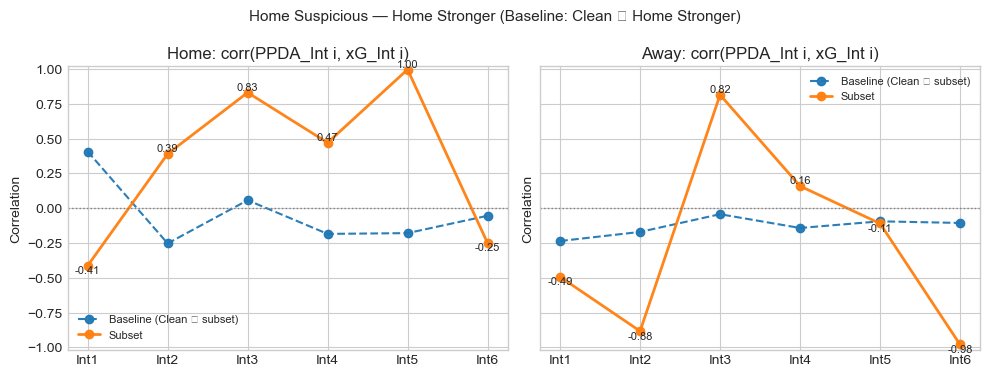


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.864 | base=-0.027 | Δ=0.891
Away_Total: subset=-0.834 | base=-0.124 | Δ=-0.710
  Home_1st: subset=-0.068 | base=0.397 | Δ=-0.465
  Home_2nd: subset=0.937 | base=-0.317 | Δ=1.254
  Away_1st: subset=-0.546 | base=0.012 | Δ=-0.558
  Away_2nd: subset=0.994 | base=-0.161 | Δ=1.154

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
AwayPressingDrop   -1.000
HomePressingDrop   -1.000
PPDA_H_Late        -0.999
PPDA_A_Int3         0.997
PPDA_H_Change      -0.997
PPDA_A_Int5        -0.995
PPDA_H_Int2         0.995
PPDA_A_2ndHalf     -0.992
PPDA_A_Late         0.987
PPDA_A_Int6         0.962

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Int2        -0.999
PPDA_H_Int6         0.998
PPDA_A_Int5         0.956
PPDA_A_Change       0.946
AwayPressingDrop    0.929
HomePressingDrop    0.929
PPDA_H_Late         0.910
PPDA_A_1stHalf     -0.902
PPDA_A_Int3        -0.891
PPDA_H_Chan

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


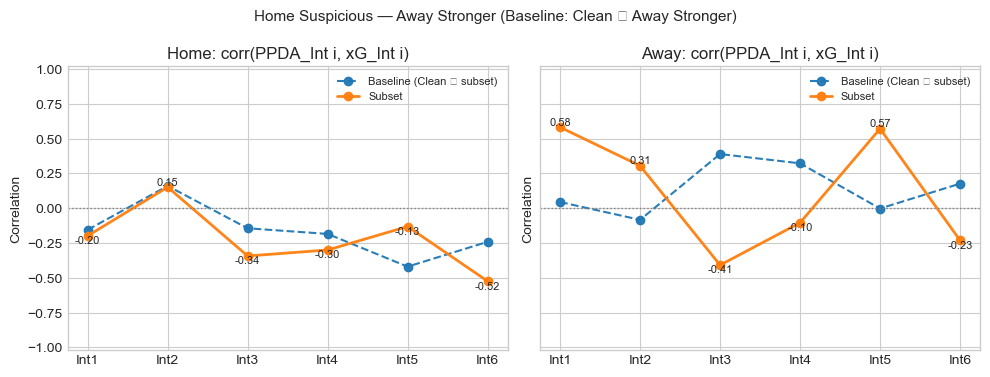

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.548 | base=-0.435 | Δ=-0.113
Away_Total: subset=0.695 | base=-0.034 | Δ=0.729
  Home_1st: subset=-0.419 | base=-0.034 | Δ=-0.385
  Home_2nd: subset=0.004 | base=-0.336 | Δ=0.340
  Away_1st: subset=0.496 | base=0.065 | Δ=0.431
  Away_2nd: subset=0.408 | base=0.091 | Δ=0.317

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Late          -0.582
PPDA_A_Int3           0.579
PPDA_H_1stHalf       -0.559
PPDA_H_Total         -0.548
PPDA_H_Mid           -0.528
PPDA_H_Int3          -0.495
PPDA_A_Int1           0.475
PPDA_H_TotalChange   -0.469
PPDA_H_Int1          -0.443
PPDA_H_Int5          -0.411

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_1stHalf        0.789
PPDA_A_Mid            0.750
PPDA_A_TotalChange    0.744
PPDA_A_Total          0.695
PPDA_A_Int5           0.641
AwayAttackingDrop     0.607
PPDA_A_Late           0.605
PPDA_A_2ndHalf        0.602
PPD

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


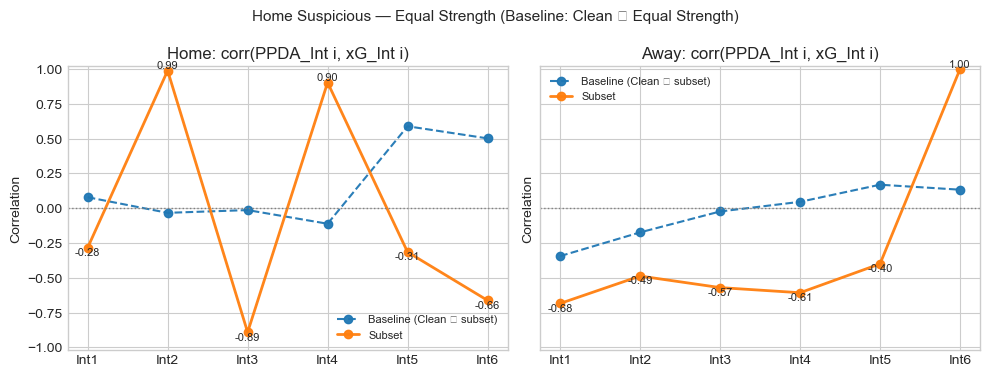


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.212 | base=0.148 | Δ=0.064
Away_Total: subset=-0.981 | base=-0.119 | Δ=-0.862
  Home_1st: subset=0.995 | base=0.051 | Δ=0.944
  Home_2nd: subset=-0.129 | base=0.416 | Δ=-0.544
  Away_1st: subset=-0.793 | base=-0.108 | Δ=-0.685
  Away_2nd: subset=0.596 | base=0.036 | Δ=0.560

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_1stHalf        0.999
PPDA_A_1stHalf       -0.998
PPDA_A_2ndHalf       -0.997
PPDA_A_Total         -0.997
PPDA_A_Change        -0.997
PPDA_A_Late          -0.995
PPDA_A_TotalChange   -0.992
PPDA_A_Int3          -0.983
PPDA_A_Int1          -0.933
PPDA_H_Int1           0.851

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Late          -0.986
PPDA_A_Change        -0.981
PPDA_A_Total         -0.981
PPDA_A_2ndHalf       -0.981
PPDA_A_1stHalf       -0.980
PPDA_H_1stHalf        0.975
PPDA_H_Int1           0.960
PPDA_A_TotalChange   -0.924
PPD

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


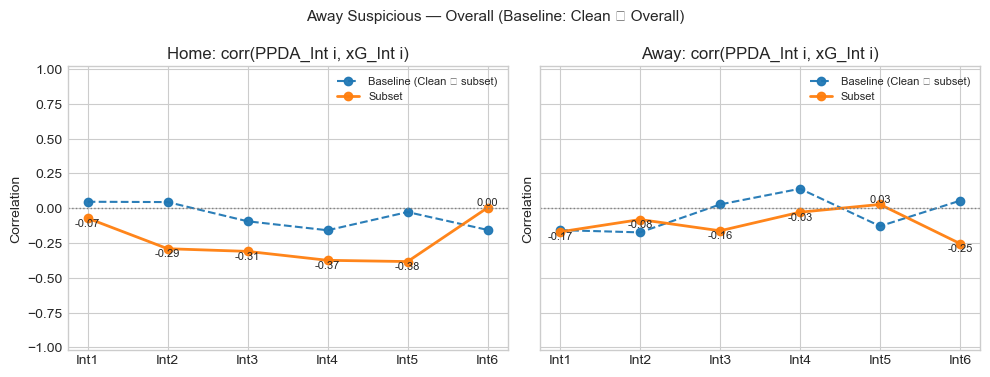

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.207 | base=-0.290 | Δ=0.083
Away_Total: subset=-0.197 | base=-0.159 | Δ=-0.038
  Home_1st: subset=-0.380 | base=-0.028 | Δ=-0.352
  Home_2nd: subset=-0.092 | base=-0.250 | Δ=0.158
  Away_1st: subset=-0.279 | base=-0.071 | Δ=-0.209
  Away_2nd: subset=-0.273 | base=-0.060 | Δ=-0.213

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1         -0.584
PPDA_H_Int5          0.581
PPDA_H_Change        0.541
HomePressingDrop     0.529
PPDA_H_Early        -0.443
AwayAttackingDrop    0.433
PPDA_H_1stHalf      -0.402
PPDA_H_Int2         -0.288
PPDA_H_Int3         -0.264
AwayPressingDrop    -0.263

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Int5         0.517
PPDA_H_Int4         0.396
PPDA_H_2ndHalf      0.395
PPDA_H_Change       0.368
PPDA_A_Early       -0.345
PPDA_A_Change      -0.317
PPDA_A_Int3         0.303
AwayPressingDrop   -0.300
PPDA_A_2ndHalf     -0

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


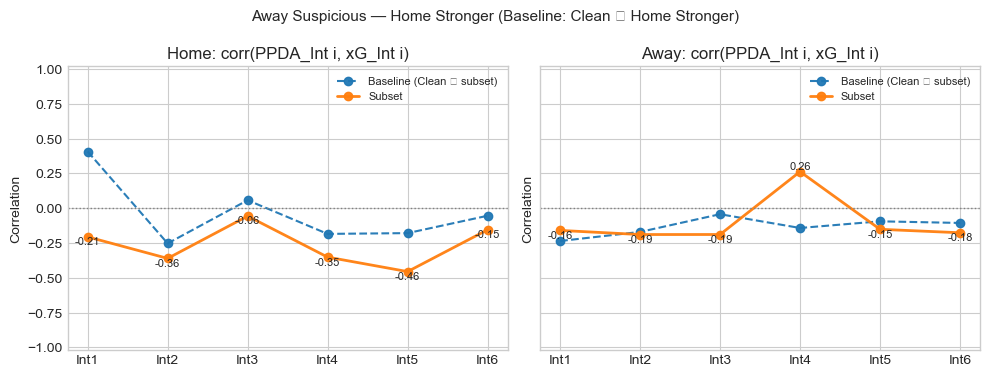


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.042 | base=-0.027 | Δ=0.069
Away_Total: subset=-0.201 | base=-0.124 | Δ=-0.077
  Home_1st: subset=-0.052 | base=0.397 | Δ=-0.449
  Home_2nd: subset=-0.155 | base=-0.317 | Δ=0.162
  Away_1st: subset=-0.318 | base=0.012 | Δ=-0.330
  Away_2nd: subset=-0.401 | base=-0.161 | Δ=-0.240

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1          -0.627
PPDA_H_Change         0.577
PPDA_H_Int5           0.577
PPDA_H_TotalChange    0.557
PPDA_H_Mid            0.520
PPDA_H_1stHalf       -0.499
AwayAttackingDrop     0.445
HomePressingDrop      0.439
PPDA_H_Early         -0.413
AwayPressingDrop     -0.338

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.504
PPDA_H_Int1           0.481
PPDA_H_TotalChange    0.453
PPDA_A_Early         -0.437
PPDA_H_Early          0.437
PPDA_H_1stHalf        0.435
PPDA_A_Change        -0.432
PPDA_A_2ndHalf       -0.42

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


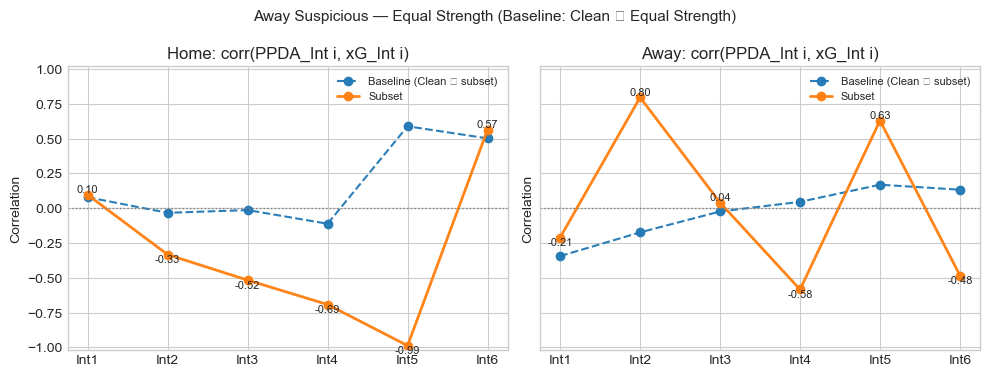

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.761 | base=0.148 | Δ=-0.909
Away_Total: subset=0.376 | base=-0.119 | Δ=0.495
  Home_1st: subset=-0.491 | base=0.051 | Δ=-0.541
  Home_2nd: subset=-0.027 | base=0.416 | Δ=-0.443
  Away_1st: subset=0.132 | base=-0.108 | Δ=0.240
  Away_2nd: subset=0.081 | base=0.036 | Δ=0.045

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
HomePressingDrop      0.774
PPDA_H_Total         -0.761
PPDA_H_1stHalf       -0.759
PPDA_H_Change         0.749
PPDA_H_Int1          -0.743
PPDA_H_2ndHalf       -0.738
PPDA_H_Int6          -0.718
PPDA_H_Late          -0.709
PPDA_H_TotalChange   -0.700
PPDA_H_Int2          -0.697

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
HomeAttackingDrop     0.840
PPDA_A_Int3           0.745
PPDA_H_Int6          -0.708
PPDA_H_Int4           0.618
PPDA_H_Late          -0.613
PPDA_H_Int5           0.598
PPDA_H_TotalChange   -0.596
PPDA_A_1stHalf        0.563
PPD

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


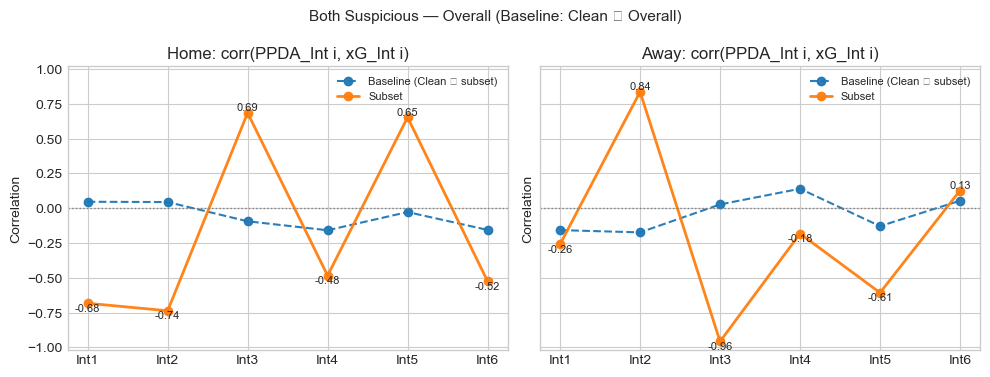


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.533 | base=-0.290 | Δ=-0.243
Away_Total: subset=-0.450 | base=-0.159 | Δ=-0.291
  Home_1st: subset=-0.174 | base=-0.028 | Δ=-0.146
  Home_2nd: subset=0.090 | base=-0.250 | Δ=0.340
  Away_1st: subset=0.624 | base=-0.071 | Δ=0.695
  Away_2nd: subset=-0.555 | base=-0.060 | Δ=-0.495

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1        -0.870
PPDA_H_Early       -0.859
PPDA_H_1stHalf     -0.857
AwayPressingDrop   -0.811
PPDA_H_Int4        -0.777
PPDA_H_Mid         -0.704
PPDA_A_Change      -0.702
PPDA_H_Int3        -0.690
PPDA_H_Int2        -0.678
PPDA_A_Early       -0.667

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_2ndHalf      -0.979
PPDA_H_Total        -0.915
PPDA_H_Int6         -0.882
PPDA_H_Late         -0.878
PPDA_A_Int1          0.860
AwayAttackingDrop   -0.843
PPDA_A_Int4         -0.806
HomeAttackingDrop    0.793
HomePressingDrop    -0.79

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


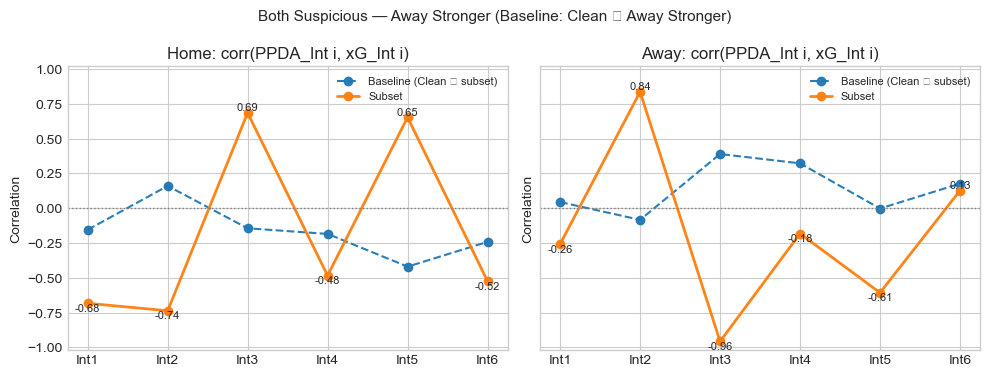


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.533 | base=-0.435 | Δ=-0.098
Away_Total: subset=-0.450 | base=-0.034 | Δ=-0.416
  Home_1st: subset=-0.174 | base=-0.034 | Δ=-0.140
  Home_2nd: subset=0.090 | base=-0.336 | Δ=0.427
  Away_1st: subset=0.624 | base=0.065 | Δ=0.559
  Away_2nd: subset=-0.555 | base=0.091 | Δ=-0.646

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1        -0.870
PPDA_H_Early       -0.859
PPDA_H_1stHalf     -0.857
AwayPressingDrop   -0.811
PPDA_H_Int4        -0.777
PPDA_H_Mid         -0.704
PPDA_A_Change      -0.702
PPDA_H_Int3        -0.690
PPDA_H_Int2        -0.678
PPDA_A_Early       -0.667

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_2ndHalf      -0.979
PPDA_H_Total        -0.915
PPDA_H_Int6         -0.882
PPDA_H_Late         -0.878
PPDA_A_Int1          0.860
AwayAttackingDrop   -0.843
PPDA_A_Int4         -0.806
HomeAttackingDrop    0.793
HomePressingDrop    -0.793


/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()
/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


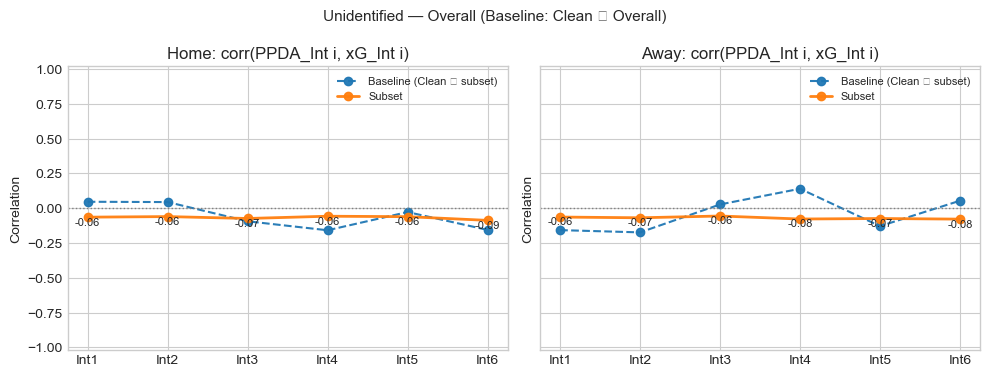

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.173 | base=-0.290 | Δ=0.117
Away_Total: subset=-0.179 | base=-0.159 | Δ=-0.020
  Home_1st: subset=-0.128 | base=-0.028 | Δ=-0.100
  Home_2nd: subset=-0.127 | base=-0.250 | Δ=0.123
  Away_1st: subset=-0.125 | base=-0.071 | Δ=-0.054
  Away_2nd: subset=-0.155 | base=-0.060 | Δ=-0.095

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.263
PPDA_A_1stHalf        0.225
PPDA_A_2ndHalf        0.215
PPDA_A_Early          0.210
PPDA_A_Late           0.208
PPDA_A_TotalChange    0.189
PPDA_A_Mid            0.182
PPDA_H_Total         -0.173
PPDA_H_1stHalf       -0.171
PPDA_A_Int1           0.167

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.258
PPDA_H_1stHalf        0.219
PPDA_H_2ndHalf        0.208
PPDA_H_Early          0.198
PPDA_H_Late           0.195
PPDA_H_Mid            0.192
PPDA_A_Total         -0.179
PPDA_H_TotalChange    0

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


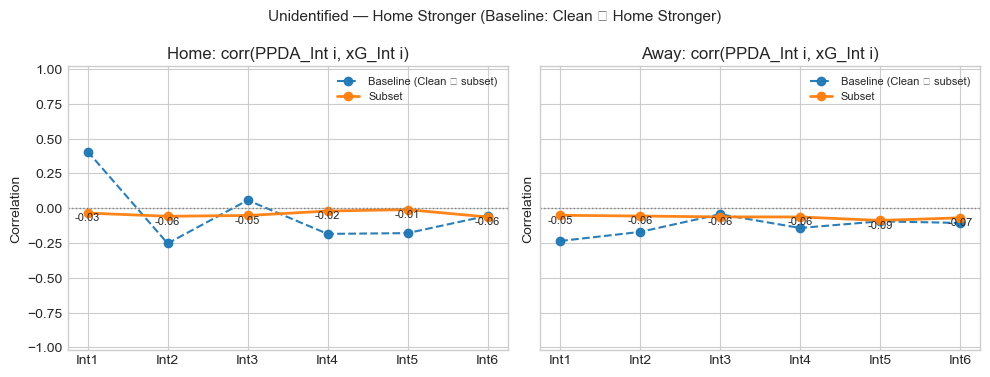

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.060 | base=-0.027 | Δ=-0.033
Away_Total: subset=-0.130 | base=-0.124 | Δ=-0.006
  Home_1st: subset=-0.086 | base=0.397 | Δ=-0.484
  Home_2nd: subset=-0.048 | base=-0.317 | Δ=0.269
  Away_1st: subset=-0.091 | base=0.012 | Δ=-0.103
  Away_2nd: subset=-0.134 | base=-0.161 | Δ=0.026

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.228
PPDA_A_Late           0.211
PPDA_A_2ndHalf        0.206
PPDA_A_Int6           0.199
PPDA_A_Early          0.178
PPDA_A_1stHalf        0.176
PPDA_A_TotalChange    0.154
PPDA_A_Int4           0.142
PPDA_A_Int1           0.135
PPDA_A_Mid            0.134

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.136
PPDA_A_Total         -0.130
PPDA_A_Late          -0.123
PPDA_H_1stHalf        0.118
PPDA_H_Late           0.115
PPDA_A_2ndHalf       -0.111
PPDA_H_TotalChange    0.108
PPDA_A_1stHalf       -0.1

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


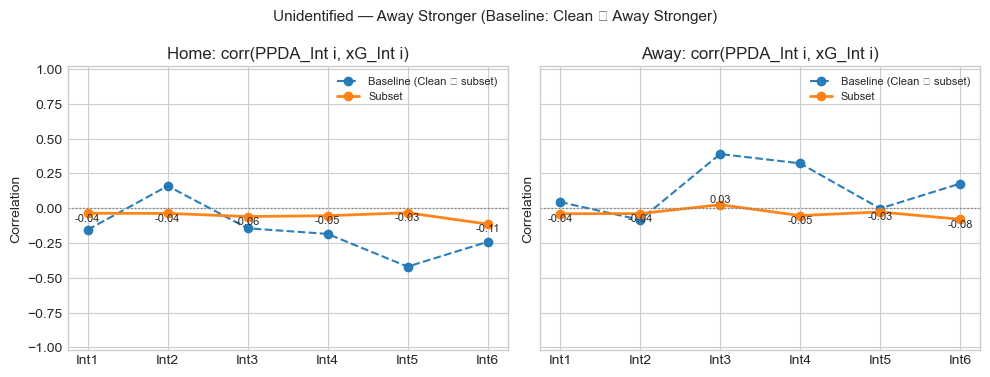

/var/folders/_q/9q3nkf795kx68k9vjkj8hps80000gn/T/ipykernel_99125/444033863.py:131: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.tight_layout()



### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.139 | base=-0.435 | Δ=0.297
Away_Total: subset=-0.080 | base=-0.034 | Δ=-0.046
  Home_1st: subset=-0.085 | base=-0.034 | Δ=-0.051
  Home_2nd: subset=-0.122 | base=-0.336 | Δ=0.214
  Away_1st: subset=-0.045 | base=0.065 | Δ=-0.110
  Away_2nd: subset=-0.105 | base=0.091 | Δ=-0.196

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Total         -0.139
PPDA_H_2ndHalf       -0.126
PPDA_A_1stHalf        0.122
PPDA_A_Total          0.121
PPDA_H_Int4          -0.120
PPDA_H_Early         -0.119
PPDA_H_Int6          -0.114
PPDA_H_Late          -0.112
PPDA_A_TotalChange    0.107
PPDA_H_1stHalf       -0.106

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.247
PPDA_H_2ndHalf        0.223
PPDA_H_Mid            0.203
PPDA_H_1stHalf        0.189
PPDA_H_Late           0.187
PPDA_H_Int5           0.184
PPDA_H_Early          0.172
PPDA_H_TotalChange    0.1

/opt/anaconda3/lib/python3.11/site-packages/IPython/core/pylabtools.py:152: UserWarning: Glyph 10761 (\N{N-ARY TIMES OPERATOR}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


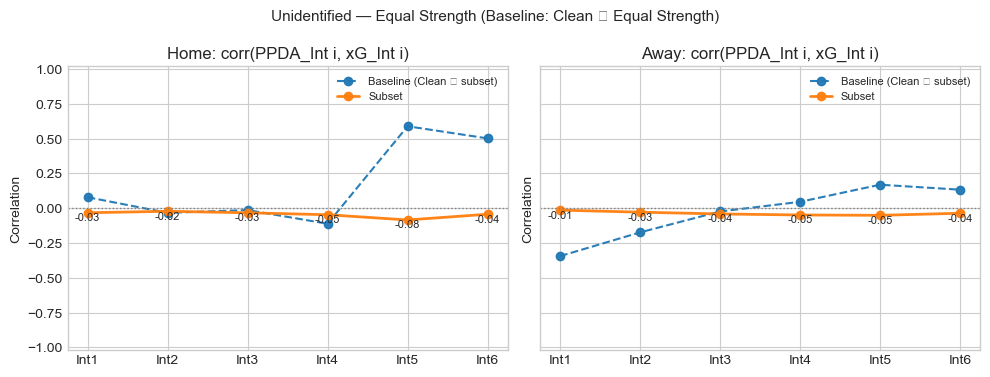


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.090 | base=0.148 | Δ=-0.238
Away_Total: subset=-0.070 | base=-0.119 | Δ=0.048
  Home_1st: subset=-0.040 | base=0.051 | Δ=-0.091
  Home_2nd: subset=-0.102 | base=0.416 | Δ=-0.518
  Away_1st: subset=-0.050 | base=-0.108 | Δ=0.059
  Away_2nd: subset=-0.092 | base=0.036 | Δ=-0.128

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total      0.119
PPDA_A_2ndHalf    0.111
PPDA_A_Late       0.102
PPDA_A_Int6       0.098
PPDA_H_Total     -0.090
PPDA_A_1stHalf    0.086
PPDA_A_Early      0.086
PPDA_H_Int5      -0.083
PPDA_H_2ndHalf   -0.076
PPDA_H_Mid       -0.076

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.149
PPDA_H_2ndHalf        0.139
PPDA_H_Late           0.120
PPDA_H_Int6           0.113
PPDA_H_Early          0.112
PPDA_H_1stHalf        0.109
PPDA_H_TotalChange    0.106
PPDA_H_Int5           0.102
PPDA_H_Mid            0.101
PPDA_H_Int1

In [24]:
# 🔧 FIXED BASELINE LOGIC + UNIFORM Y-SCALE
# Baseline is now **Clean (Both Not Suspicious) filtered to the SAME subset** you are plotting.
# Example: for "Home Suspicious — Home Stronger", baseline = clean matches ∩ home-stronger.
# All diagonal plots use a SINGLE, shared y-scale for fair comparison across every panel.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- Columns ----
PPDA_H = [f"PPDA_H_Int{i}" for i in range(1,7)]
PPDA_A = [f"PPDA_A_Int{i}" for i in range(1,7)]
XG_H   = [f"xG_H_Int{i}"   for i in range(1,7)]
XG_A   = [f"xG_A_Int{i}"   for i in range(1,7)]

HALF_TOTAL = [
    "PPDA_H_1stHalf","PPDA_H_2ndHalf","PPDA_H_Total",
    "PPDA_A_1stHalf","PPDA_A_2ndHalf","PPDA_A_Total",
    "xG_H_1stHalf","xG_H_2ndHalf","xG_H_Total",
    "xG_A_1stHalf","xG_A_2ndHalf","xG_A_Total",
]

# ---- Masks: 7 × 4 ----
CATEGORIES = {
    "All Matches":                   lambda d: pd.Series(True, index=d.index),
    "Clean (Both Not Suspicious)":   lambda d: d["MatchSuspicionType"] == "both not suspicious",
    "Suspicious (Any of Home/Away/Both)": lambda d: d["MatchSuspicionType"].isin(["home suspicious","away suspicious","both suspicious"]),
    "Home Suspicious":               lambda d: d["MatchSuspicionType"] == "home suspicious",
    "Away Suspicious":               lambda d: d["MatchSuspicionType"] == "away suspicious",
    "Both Suspicious":               lambda d: d["MatchSuspicionType"] == "both suspicious",
    "Unidentified":                  lambda d: d["MatchSuspicionType"] == "unidentified",
}
SUBSETS = {
    "Overall":        lambda d: pd.Series(True, index=d.index),
    "Home Stronger":  lambda d: d["Relative quality"] == "home team stronger",
    "Away Stronger":  lambda d: d["Relative quality"] == "away team stronger",
    "Equal Strength": lambda d: d["Relative quality"] == "equal strength teams",
}

# ---- Helpers ----
def _safe_corr(a, b):
    a = pd.to_numeric(a, errors="coerce"); b = pd.to_numeric(b, errors="coerce")
    m = a.notna() & b.notna()
    return a[m].corr(b[m]) if m.sum() >= 3 else np.nan

def _diag_corrs(df_sub):
    h, a = [], []
    for i in range(1,7):
        h.append(_safe_corr(df_sub[f"PPDA_H_Int{i}"], df_sub[f"xG_H_Int{i}"]))
        a.append(_safe_corr(df_sub[f"PPDA_A_Int{i}"], df_sub[f"xG_A_Int{i}"]))
    return np.array(h, dtype=float), np.array(a, dtype=float)

def _totals_halves(df_sub):
    return {
        "Home_Total": _safe_corr(df_sub["PPDA_H_Total"], df_sub["xG_H_Total"]),
        "Away_Total": _safe_corr(df_sub["PPDA_A_Total"], df_sub["xG_A_Total"]),
        "Home_1st":   _safe_corr(df_sub["PPDA_H_1stHalf"], df_sub["xG_H_1stHalf"]),
        "Home_2nd":   _safe_corr(df_sub["PPDA_H_2ndHalf"], df_sub["xG_H_2ndHalf"]),
        "Away_1st":   _safe_corr(df_sub["PPDA_A_1stHalf"], df_sub["xG_A_1stHalf"]),
        "Away_2nd":   _safe_corr(df_sub["PPDA_A_2ndHalf"], df_sub["xG_A_2ndHalf"]),
    }

def _top_corr_signed(df_sub, target, topn=10):
    num = df_sub.select_dtypes(include="number")
    cols = [c for c in num.columns if (("xG" not in c) or (c == target))]
    if target not in cols or num.shape[0] < 2:
        return pd.Series(dtype=float)
    s = num[cols].corr()[target].drop(labels=[target], errors="ignore").dropna()
    return s.reindex(s.abs().sort_values(ascending=False).index).head(topn)

# ---- NEW: compute one global y-scale used by ALL diagonal plots ----
def _compute_global_ylim_for_diagonals(df, *, symmetric=True, custom_ylim=None, min_span=0.2, pad=0.02):
    if custom_ylim is not None:
        return tuple(custom_ylim)

    vals = []
    df_clean = df[CATEGORIES["Clean (Both Not Suspicious)"](df)]

    # collect diagonals for EVERY (category, subset) AND its subset baseline (clean ∩ subset)
    for _, cat_mask in CATEGORIES.items():
        df_cat = df[cat_mask(df)]
        for _, sub_mask in SUBSETS.items():
            # subset series is relative to df_cat index
            df_sub = df_cat[sub_mask(df_cat)]
            if len(df_sub) >= 3:
                h, a = _diag_corrs(df_sub)
                vals.extend(h[~np.isnan(h)].tolist())
                vals.extend(a[~np.isnan(a)].tolist())

            # baseline for this subset = clean ∩ same subset (applied to full df)
            df_baseline_sub = df_clean[sub_mask(df_clean)]
            if len(df_baseline_sub) >= 3:
                hb, ab = _diag_corrs(df_baseline_sub)
                vals.extend(hb[~np.isnan(hb)].tolist())
                vals.extend(ab[~np.isnan(ab)].tolist())

    if len(vals) == 0:
        return (-1.0, 1.0)

    vmin, vmax = float(np.min(vals)), float(np.max(vals))
    if symmetric:
        m = max(abs(vmin), abs(vmax))
        m = max(m, min_span/2) + pad
        return (-m, m)
    else:
        span = vmax - vmin
        if span < min_span:
            mid = (vmin + vmax)/2
            half = max(min_span/2, span/2) + pad
            return (mid - half, mid + half)
        return (vmin - pad, vmax + pad)

def _plot_vs_baseline(diag_base, diag_sub, title, y_limits=None):
    fig, axes = plt.subplots(1, 2, figsize=(10, 3.8), sharey=True)
    for ax, base, sub, lab in [
        (axes[0], diag_base[0], diag_sub[0], "Home"),
        (axes[1], diag_base[1], diag_sub[1], "Away")
    ]:
        ax.plot(range(1,7), base, marker='o', linestyle='--', label="Baseline (Clean ⨉ subset)", alpha=0.95)
        ax.plot(range(1,7), sub,  marker='o', linewidth=2, label="Subset", alpha=0.95)
        ax.axhline(0, ls=":", color="gray", lw=1)
        ax.set_xticks(range(1,7)); ax.set_xticklabels([f"Int{i}" for i in range(1,7)])
        ax.set_title(f"{lab}: corr(PPDA_Int i, xG_Int i)")
        ax.set_ylabel("Correlation")
        if y_limits is not None:
            ax.set_ylim(*y_limits)
        for x, y in enumerate(sub, 1):
            if not np.isnan(y): ax.text(x, y, f"{y:.2f}", ha='center', va='bottom' if y>=0 else 'top', fontsize=8)
        ax.legend(fontsize=8, frameon=False)
    fig.suptitle(title, fontsize=11)
    fig.tight_layout()
    plt.show()

def _print_stats_vs_base(stats_base, stats_sub):
    keys = ["Home_Total","Away_Total","Home_1st","Home_2nd","Away_1st","Away_2nd"]
    print("\n### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)")
    for k in keys:
        rb, rs = stats_base[k], stats_sub[k]
        d = (rs - rb) if (not np.isnan(rs) and not np.isnan(rb)) else np.nan
        print(f"{k:>10}: subset={rs:.3f} | base={rb:.3f} | Δ={d:.3f}")

# ---- MAIN (per-subset clean baseline + uniform y-scale) ----
def run_all_plots_vs_clean_baseline(df, *, symmetric_ylim=True, custom_ylim=None):
    # One global y-scale for ALL plots (includes all categories/subsets AND their clean baselines)
    y_limits = _compute_global_ylim_for_diagonals(
        df, symmetric=symmetric_ylim, custom_ylim=custom_ylim, min_span=0.2, pad=0.02
    )

    df_clean = df[CATEGORIES["Clean (Both Not Suspicious)"](df)]
    full_n = len(df)

    for cat_name, cat_mask in CATEGORIES.items():
        df_cat = df[cat_mask(df)]
        n_cat = len(df_cat)

        for sub_name, sub_mask in SUBSETS.items():
            # Subset inside current category
            df_sub = df_cat[sub_mask(df_cat)]
            n_sub = len(df_sub)

            # Baseline for this subset ONLY = clean matches ∩ same subset (applied to full df)
            df_base_sub = df_clean[sub_mask(df_clean)]
            n_base = len(df_base_sub)

            print(f"\n## {cat_name} — {sub_name} | Matches: {n_sub} out of {n_cat if sub_name!='Overall' else full_n}")
            print(f"   Baseline (Clean ⨉ {sub_name}) size: {n_base}")

            # Need at least 3 to compute stable correlations
            if n_sub < 3 or n_base < 3:
                print("(Skipping: too few matches in subset or baseline for stable correlations.)")
                continue

            # Diagonal plots vs (clean ⨉ subset) baseline with the SAME y-limits everywhere
            diag_sub  = _diag_corrs(df_sub)
            diag_base = _diag_corrs(df_base_sub)
            _plot_vs_baseline(
                diag_base=diag_base,
                diag_sub=diag_sub,
                title=f"{cat_name} — {sub_name} (Baseline: Clean ⨉ {sub_name})",
                y_limits=y_limits
            )

            # Totals/Halves vs baseline for this subset
            stats_sub  = _totals_halves(df_sub)
            stats_base = _totals_halves(df_base_sub)
            _print_stats_vs_base(stats_base, stats_sub)

            # Top drivers (signed; excluding xG features)
            th = _top_corr_signed(df_sub, "xG_H_Total", topn=10)
            ta = _top_corr_signed(df_sub, "xG_A_Total", topn=10)
            print("\n### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)")
            print(th.round(3).to_string() if not th.empty else "(insufficient data)")
            print("\n### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)")
            print(ta.round(3).to_string() if not ta.empty else "(insufficient data)")

            print("\n" + "="*100 + "\n")

# ---- RUN ----
# Auto symmetric y-limits across ALL plots (recommended):
run_all_plots_vs_clean_baseline(df, symmetric_ylim=True)

# Or force a fixed identical range for every plot, e.g. (-0.6, 0.6):
# run_all_plots_vs_clean_baseline(df, symmetric_ylim=False, custom_ylim=(-0.6, 0.6))


## All Matches — Overall | Matches: 5170 out of 5170
   Baseline (Clean × Overall) size: 51


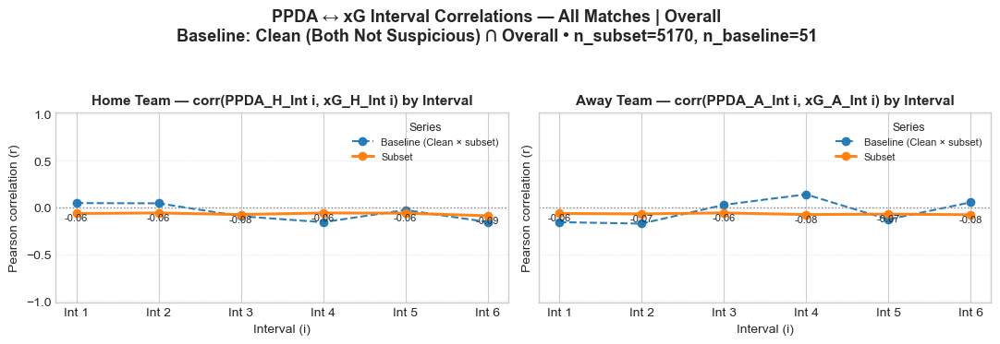


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.176 | base=-0.290 | Δ=0.114
Away_Total: subset=-0.178 | base=-0.159 | Δ=-0.019
  Home_1st: subset=-0.129 | base=-0.028 | Δ=-0.101
  Home_2nd: subset=-0.129 | base=-0.250 | Δ=0.121
  Away_1st: subset=-0.127 | base=-0.071 | Δ=-0.056
  Away_2nd: subset=-0.151 | base=-0.060 | Δ=-0.091

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.261
PPDA_A_1stHalf        0.224
PPDA_A_2ndHalf        0.213
PPDA_A_Early          0.208
PPDA_A_Late           0.205
PPDA_A_TotalChange    0.188
PPDA_A_Mid            0.182
PPDA_H_Total         -0.176
PPDA_H_1stHalf       -0.173
PPDA_A_Int1           0.165

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.257
PPDA_H_1stHalf        0.217
PPDA_H_2ndHalf        0.208
PPDA_H_Early          0.199
PPDA_H_Late           0.192
PPDA_H_Mid            0.191
PPDA_A_Total         -0.178
PPDA_H_TotalChange    0

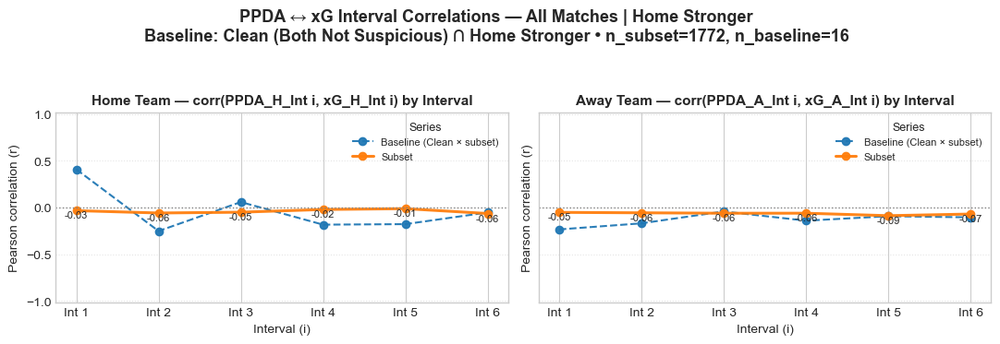


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.059 | base=-0.027 | Δ=-0.032
Away_Total: subset=-0.130 | base=-0.124 | Δ=-0.006
  Home_1st: subset=-0.083 | base=0.397 | Δ=-0.480
  Home_2nd: subset=-0.050 | base=-0.317 | Δ=0.267
  Away_1st: subset=-0.091 | base=0.012 | Δ=-0.104
  Away_2nd: subset=-0.136 | base=-0.161 | Δ=0.025

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.227
PPDA_A_Late           0.209
PPDA_A_2ndHalf        0.208
PPDA_A_Int6           0.199
PPDA_A_Early          0.178
PPDA_A_1stHalf        0.173
PPDA_A_TotalChange    0.152
PPDA_A_Int4           0.143
PPDA_A_Mid            0.134
PPDA_A_Int1           0.134

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.137
PPDA_A_Total         -0.130
PPDA_A_Late          -0.120
PPDA_H_1stHalf        0.116
PPDA_H_Late           0.116
PPDA_A_2ndHalf       -0.113
PPDA_H_TotalChange    0.108
PPDA_A_1stHalf       -0.1

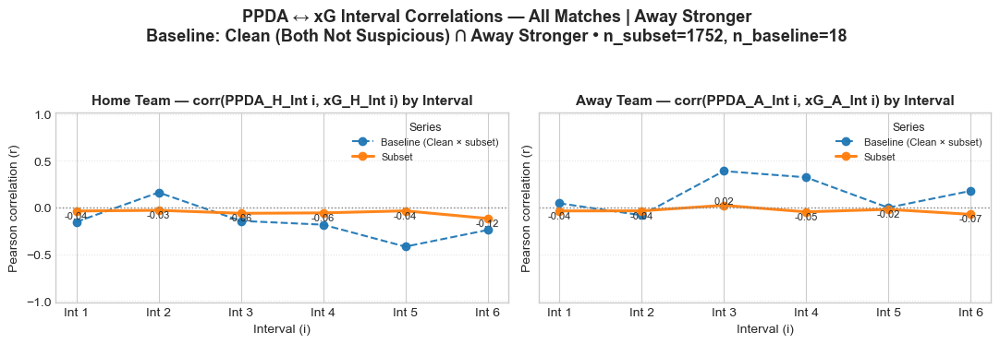


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.146 | base=-0.435 | Δ=0.290
Away_Total: subset=-0.073 | base=-0.034 | Δ=-0.039
  Home_1st: subset=-0.089 | base=-0.034 | Δ=-0.055
  Home_2nd: subset=-0.126 | base=-0.336 | Δ=0.211
  Away_1st: subset=-0.043 | base=0.065 | Δ=-0.109
  Away_2nd: subset=-0.092 | base=0.091 | Δ=-0.183

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Total         -0.146
PPDA_H_2ndHalf       -0.132
PPDA_H_Early         -0.123
PPDA_A_1stHalf        0.122
PPDA_H_Int4          -0.121
PPDA_H_Int6          -0.118
PPDA_H_Late          -0.118
PPDA_A_Total          0.117
PPDA_H_1stHalf       -0.111
PPDA_H_TotalChange   -0.108

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.242
PPDA_H_2ndHalf        0.217
PPDA_H_Mid            0.201
PPDA_H_1stHalf        0.187
PPDA_H_Late           0.182
PPDA_H_Int5           0.180
PPDA_H_Early          0.169
PPDA_H_TotalChange    0.1

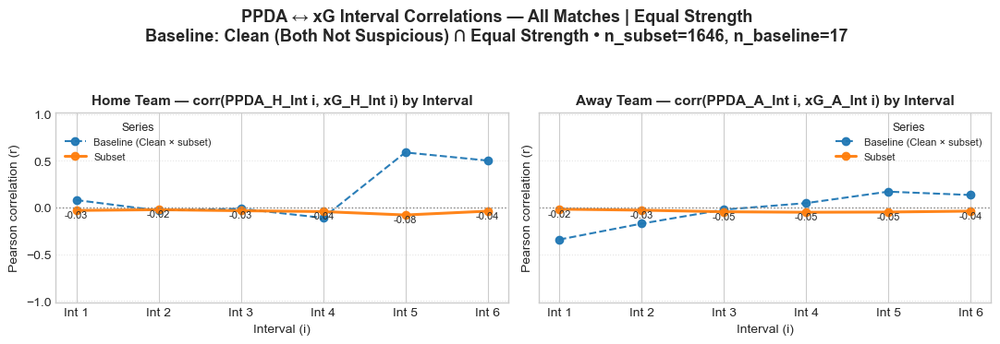


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.089 | base=0.148 | Δ=-0.237
Away_Total: subset=-0.078 | base=-0.119 | Δ=0.041
  Home_1st: subset=-0.043 | base=0.051 | Δ=-0.094
  Home_2nd: subset=-0.099 | base=0.416 | Δ=-0.514
  Away_1st: subset=-0.057 | base=-0.108 | Δ=0.051
  Away_2nd: subset=-0.093 | base=0.036 | Δ=-0.128

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total      0.116
PPDA_A_2ndHalf    0.108
PPDA_A_Late       0.099
PPDA_A_Int6       0.094
PPDA_H_Total     -0.089
PPDA_A_1stHalf    0.085
PPDA_H_Int5      -0.084
PPDA_A_Early      0.083
PPDA_H_Mid       -0.077
PPDA_H_2ndHalf   -0.076

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.148
PPDA_H_2ndHalf        0.140
PPDA_H_Early          0.119
PPDA_H_Late           0.114
PPDA_H_Int6           0.111
PPDA_H_1stHalf        0.107
PPDA_H_Int1           0.107
PPDA_H_TotalChange    0.105
PPDA_H_Int5           0.103
PPDA_H_Mid 

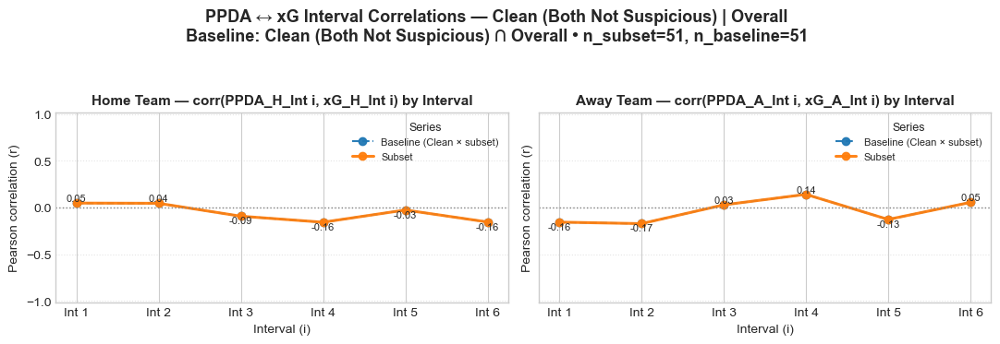


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.290 | base=-0.290 | Δ=0.000
Away_Total: subset=-0.159 | base=-0.159 | Δ=0.000
  Home_1st: subset=-0.028 | base=-0.028 | Δ=0.000
  Home_2nd: subset=-0.250 | base=-0.250 | Δ=0.000
  Away_1st: subset=-0.071 | base=-0.071 | Δ=0.000
  Away_2nd: subset=-0.060 | base=-0.060 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Int5           0.343
PPDA_H_TotalChange   -0.320
PPDA_H_2ndHalf       -0.309
PPDA_H_Int5          -0.299
PPDA_H_Total         -0.290
PPDA_H_Mid           -0.289
PPDA_A_Mid            0.285
PPDA_A_2ndHalf        0.265
PPDA_A_Change         0.243
AwayPressingDrop      0.232

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Mid            0.258
PPDA_H_Total          0.238
PPDA_H_Int5           0.234
PPDA_H_Late           0.229
PPDA_H_2ndHalf        0.201
PPDA_H_Int6           0.198
PPDA_A_Int2          -0.192
PPDA_H_TotalChange    0.186

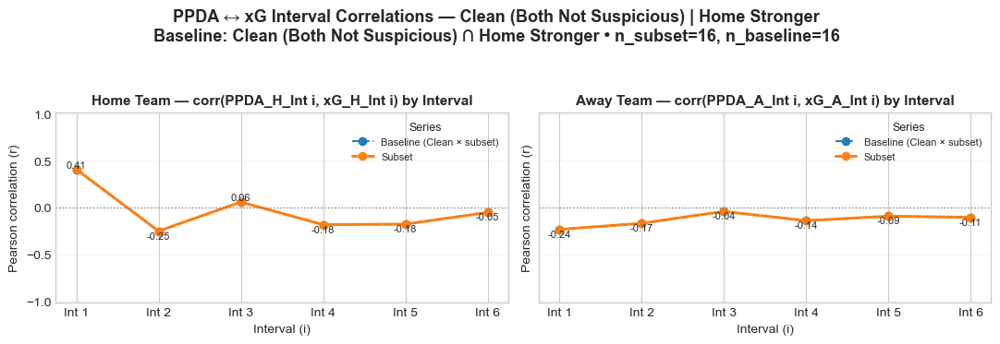


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.027 | base=-0.027 | Δ=0.000
Away_Total: subset=-0.124 | base=-0.124 | Δ=0.000
  Home_1st: subset=0.397 | base=0.397 | Δ=0.000
  Home_2nd: subset=-0.317 | base=-0.317 | Δ=0.000
  Away_1st: subset=0.012 | base=0.012 | Δ=0.000
  Away_2nd: subset=-0.161 | base=-0.161 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Change     0.621
PPDA_A_2ndHalf    0.513
PPDA_A_Int4       0.460
PPDA_A_Int5       0.420
PPDA_A_Int3      -0.386
PPDA_A_Mid        0.382
PPDA_H_Change    -0.352
PPDA_H_Int4      -0.344
PPDA_A_Early      0.334
PPDA_H_Int5      -0.289

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Int1          -0.435
PPDA_H_Early         -0.378
PPDA_H_TotalChange   -0.357
PPDA_H_Total         -0.282
PPDA_H_1stHalf       -0.244
PPDA_H_Int5          -0.226
PPDA_A_Int5           0.224
PPDA_H_Int4          -0.222
PPDA_H_2ndHalf       -0.222
PPDA_A_Change  

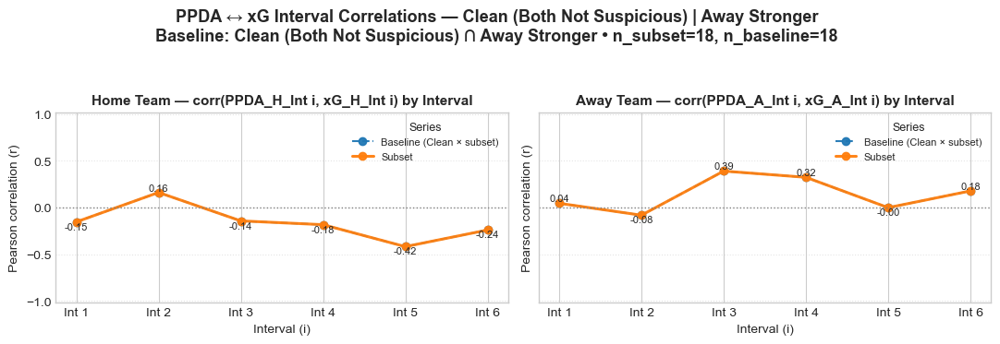


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.435 | base=-0.435 | Δ=0.000
Away_Total: subset=-0.034 | base=-0.034 | Δ=0.000
  Home_1st: subset=-0.034 | base=-0.034 | Δ=0.000
  Home_2nd: subset=-0.336 | base=-0.336 | Δ=0.000
  Away_1st: subset=0.065 | base=0.065 | Δ=0.000
  Away_2nd: subset=0.091 | base=0.091 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Int3           0.539
PPDA_H_Total         -0.435
PPDA_H_TotalChange   -0.419
HomeAttackingDrop    -0.405
PPDA_H_2ndHalf       -0.385
PPDA_A_Int2          -0.382
PPDA_H_Late          -0.354
PPDA_A_Mid           -0.342
PPDA_H_Mid           -0.341
AwayAttackingDrop     0.327

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Int5          0.330
PPDA_H_Mid           0.319
PPDA_A_Int3          0.262
PPDA_H_Int3          0.228
HomeAttackingDrop   -0.214
PPDA_H_Int4         -0.192
PPDA_H_Late          0.192
PPDA_H_Total         0.188
HomePressin

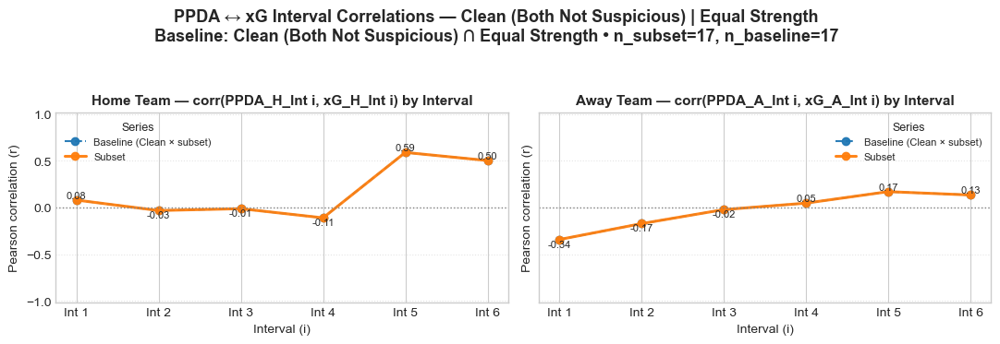


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.148 | base=0.148 | Δ=0.000
Away_Total: subset=-0.119 | base=-0.119 | Δ=0.000
  Home_1st: subset=0.051 | base=0.051 | Δ=0.000
  Home_2nd: subset=0.416 | base=0.416 | Δ=0.000
  Away_1st: subset=-0.108 | base=-0.108 | Δ=0.000
  Away_2nd: subset=0.036 | base=0.036 | Δ=0.000

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int6         0.561
PPDA_H_Late         0.461
PPDA_A_Int1        -0.345
PPDA_A_Int6        -0.300
HomePressingDrop   -0.282
PPDA_H_Int4         0.266
PPDA_H_Int3         0.255
PPDA_A_Int5         0.222
PPDA_A_Late        -0.207
PPDA_A_Int4         0.206

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Int5           0.407
PPDA_A_Int2          -0.367
PPDA_H_Int1           0.353
PPDA_H_Early          0.320
HomePressingDrop      0.277
PPDA_A_Mid           -0.267
AwayAttackingDrop    -0.259
PPDA_A_Change         0.255
PPDA_A_TotalChange   -0.236

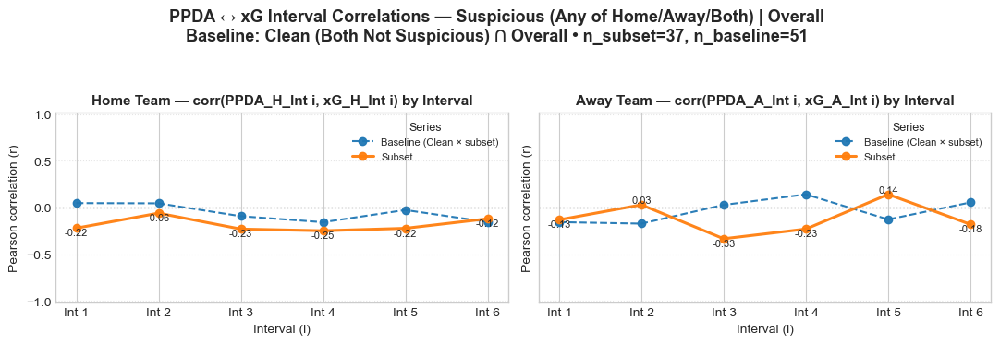


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.357 | base=-0.290 | Δ=-0.066
Away_Total: subset=-0.204 | base=-0.159 | Δ=-0.045
  Home_1st: subset=-0.341 | base=-0.028 | Δ=-0.313
  Home_2nd: subset=-0.162 | base=-0.250 | Δ=0.088
  Away_1st: subset=-0.373 | base=-0.071 | Δ=-0.302
  Away_2nd: subset=-0.021 | base=-0.060 | Δ=0.039

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Early        -0.409
PPDA_H_Int1         -0.379
PPDA_H_1stHalf      -0.375
AwayPressingDrop    -0.372
AwayAttackingDrop    0.368
PPDA_H_Total        -0.357
PPDA_A_1stHalf       0.298
PPDA_H_Late         -0.273
PPDA_A_Int3          0.269
PPDA_H_Int3         -0.261

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Early      0.434
PPDA_H_Int4       0.395
PPDA_A_Early     -0.374
PPDA_A_1stHalf   -0.369
PPDA_A_Int1      -0.307
PPDA_H_Int1       0.257
PPDA_A_Change     0.224
PPDA_A_Int3      -0.222
PPDA_A_Int4      -0.206
PPDA_A_Total 

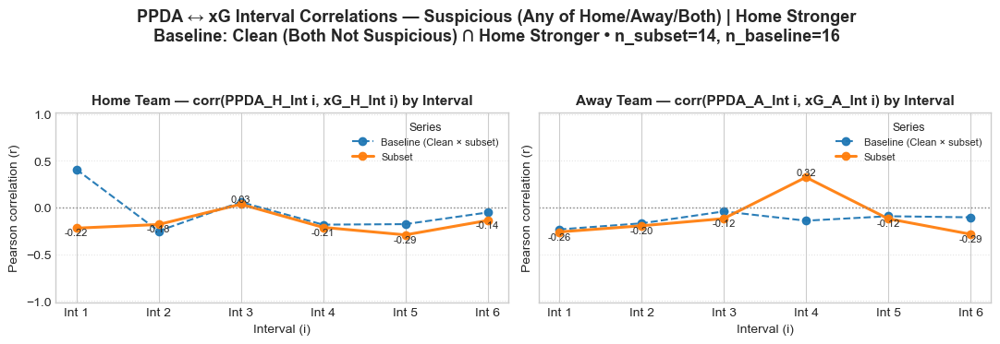


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.140 | base=-0.027 | Δ=0.167
Away_Total: subset=-0.201 | base=-0.124 | Δ=-0.077
  Home_1st: subset=-0.131 | base=0.397 | Δ=-0.528
  Home_2nd: subset=-0.048 | base=-0.317 | Δ=0.269
  Away_1st: subset=-0.279 | base=0.012 | Δ=-0.291
  Away_2nd: subset=-0.339 | base=-0.161 | Δ=-0.178

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int5           0.612
PPDA_H_TotalChange    0.558
PPDA_H_Mid            0.530
PPDA_H_Change         0.514
AwayAttackingDrop     0.459
AwayPressingDrop     -0.405
PPDA_H_Int1          -0.387
PPDA_H_2ndHalf        0.371
HomePressingDrop      0.302
PPDA_H_1stHalf       -0.281

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_TotalChange    0.443
PPDA_H_Total          0.416
PPDA_A_Int3           0.382
PPDA_H_Int5           0.381
PPDA_H_2ndHalf        0.380
PPDA_A_2ndHalf       -0.366
PPDA_H_Early          0.360
PPDA_A_Early         -0.32

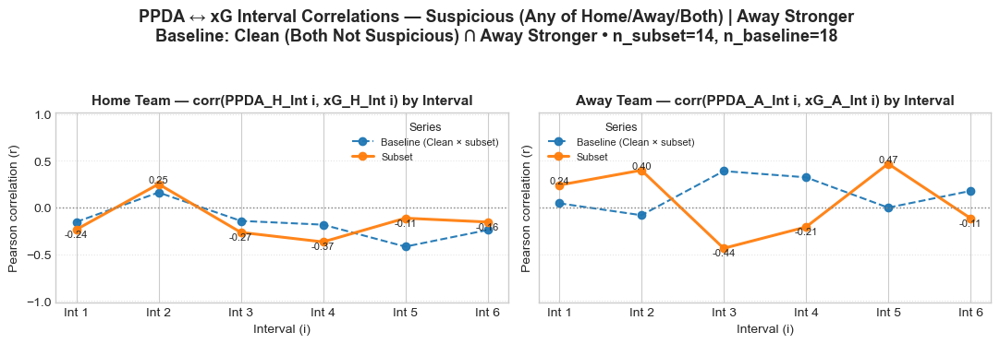


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.441 | base=-0.435 | Δ=-0.006
Away_Total: subset=0.285 | base=-0.034 | Δ=0.319
  Home_1st: subset=-0.361 | base=-0.034 | Δ=-0.327
  Home_2nd: subset=-0.054 | base=-0.336 | Δ=0.282
  Away_1st: subset=-0.048 | base=0.065 | Δ=-0.113
  Away_2nd: subset=0.270 | base=0.091 | Δ=0.179

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Mid       -0.575
PPDA_H_Int1      -0.521
PPDA_H_Total     -0.441
PPDA_A_Int3       0.425
PPDA_H_Int5      -0.421
PPDA_A_Int4      -0.376
PPDA_H_1stHalf   -0.361
PPDA_A_Late       0.345
PPDA_H_Int2      -0.335
PPDA_H_Early     -0.328

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Int6       0.517
PPDA_A_Int3      -0.509
PPDA_A_Change     0.471
PPDA_H_Int6      -0.457
PPDA_A_2ndHalf    0.407
PPDA_H_Int5      -0.400
PPDA_A_Late       0.360
PPDA_H_Late      -0.359
PPDA_A_Int5       0.357
PPDA_H_2ndHalf   -0.344



## Suspicious (Any of

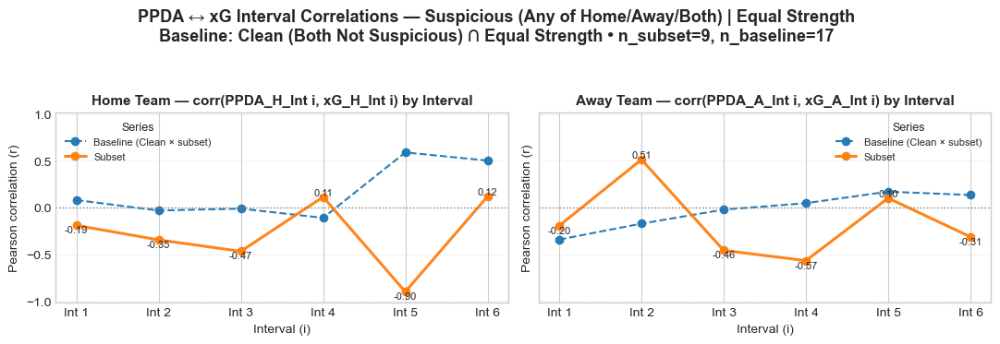


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.476 | base=0.148 | Δ=-0.624
Away_Total: subset=-0.510 | base=-0.119 | Δ=-0.391
  Home_1st: subset=-0.413 | base=0.051 | Δ=-0.464
  Home_2nd: subset=-0.102 | base=0.416 | Δ=-0.517
  Away_1st: subset=-0.583 | base=-0.108 | Δ=-0.475
  Away_2nd: subset=-0.120 | base=0.036 | Δ=-0.155

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Late          -0.520
PPDA_H_Int3          -0.490
PPDA_H_Int6          -0.485
PPDA_H_Total         -0.476
PPDA_H_2ndHalf       -0.451
PPDA_A_Int4          -0.438
HomeAttackingDrop     0.399
PPDA_H_Mid           -0.392
PPDA_H_1stHalf       -0.381
PPDA_H_TotalChange   -0.369

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Early      0.797
PPDA_H_Int5       0.752
PPDA_A_Int2      -0.726
PPDA_A_1stHalf   -0.644
PPDA_H_Int1       0.592
PPDA_A_Late      -0.527
PPDA_A_Total     -0.510
PPDA_H_Int4       0.482
PPDA_A_Early     -0.447
PPDA_

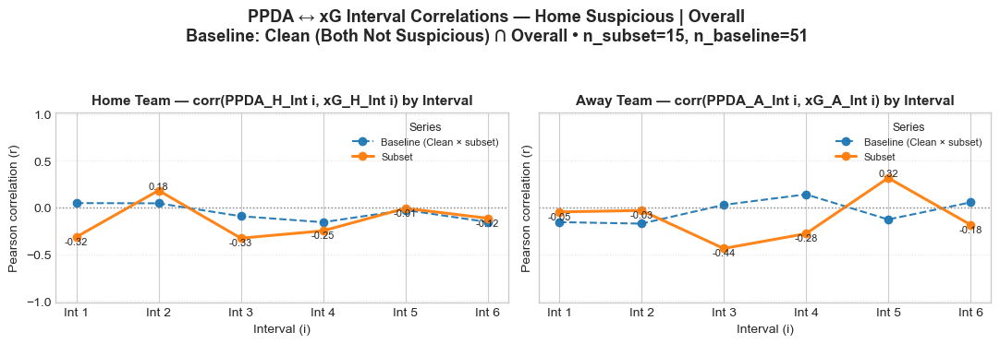


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.322 | base=-0.290 | Δ=-0.032
Away_Total: subset=0.301 | base=-0.159 | Δ=0.460
  Home_1st: subset=-0.253 | base=-0.028 | Δ=-0.225
  Home_2nd: subset=-0.043 | base=-0.250 | Δ=0.206
  Away_1st: subset=-0.222 | base=-0.071 | Δ=-0.151
  Away_2nd: subset=0.429 | base=-0.060 | Δ=0.489

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Late          -0.503
PPDA_H_Int3          -0.489
PPDA_A_1stHalf        0.458
PPDA_A_Int1           0.447
PPDA_H_TotalChange   -0.367
PPDA_A_Int3           0.357
AwayAttackingDrop     0.332
PPDA_H_Total         -0.322
AwayPressingDrop     -0.280
PPDA_A_Early          0.275

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Change         0.592
PPDA_A_2ndHalf        0.515
PPDA_A_Int6           0.468
PPDA_A_Int5           0.436
PPDA_H_Early          0.436
PPDA_H_Int1           0.436
PPDA_A_Late           0.435
PPDA_H_TotalChange    0.42

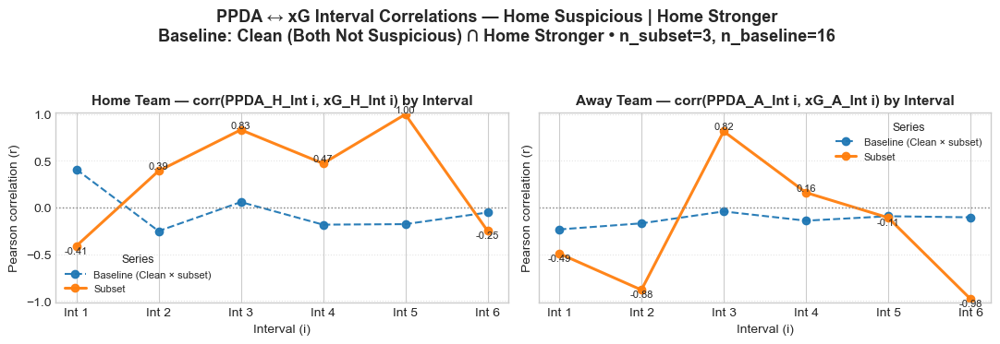


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.864 | base=-0.027 | Δ=0.891
Away_Total: subset=-0.834 | base=-0.124 | Δ=-0.710
  Home_1st: subset=-0.068 | base=0.397 | Δ=-0.465
  Home_2nd: subset=0.937 | base=-0.317 | Δ=1.254
  Away_1st: subset=-0.546 | base=0.012 | Δ=-0.558
  Away_2nd: subset=0.994 | base=-0.161 | Δ=1.154

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
AwayPressingDrop   -1.000
HomePressingDrop   -1.000
PPDA_H_Late        -0.999
PPDA_A_Int3         0.997
PPDA_H_Change      -0.997
PPDA_A_Int5        -0.995
PPDA_H_Int2         0.995
PPDA_A_2ndHalf     -0.992
PPDA_A_Late         0.987
PPDA_A_Int6         0.962

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Int2        -0.999
PPDA_H_Int6         0.998
PPDA_A_Int5         0.956
PPDA_A_Change       0.946
AwayPressingDrop    0.929
HomePressingDrop    0.929
PPDA_H_Late         0.910
PPDA_A_1stHalf     -0.902
PPDA_A_Int3        -0.891
PPDA_H_Chan

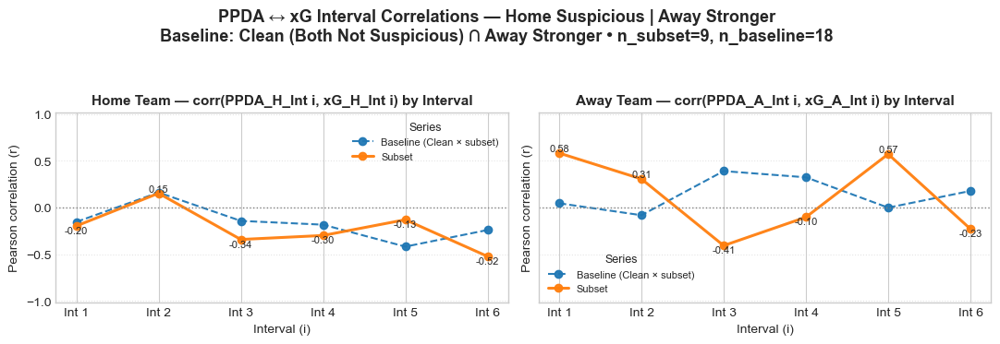


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.548 | base=-0.435 | Δ=-0.113
Away_Total: subset=0.695 | base=-0.034 | Δ=0.729
  Home_1st: subset=-0.419 | base=-0.034 | Δ=-0.385
  Home_2nd: subset=0.004 | base=-0.336 | Δ=0.340
  Away_1st: subset=0.496 | base=0.065 | Δ=0.431
  Away_2nd: subset=0.408 | base=0.091 | Δ=0.317

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Late          -0.582
PPDA_A_Int3           0.579
PPDA_H_1stHalf       -0.559
PPDA_H_Total         -0.548
PPDA_H_Mid           -0.528
PPDA_H_Int3          -0.495
PPDA_A_Int1           0.475
PPDA_H_TotalChange   -0.469
PPDA_H_Int1          -0.443
PPDA_H_Int5          -0.411

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_1stHalf        0.789
PPDA_A_Mid            0.750
PPDA_A_TotalChange    0.744
PPDA_A_Total          0.695
PPDA_A_Int5           0.641
AwayAttackingDrop     0.607
PPDA_A_Late           0.605
PPDA_A_2ndHalf        0.602
PPD

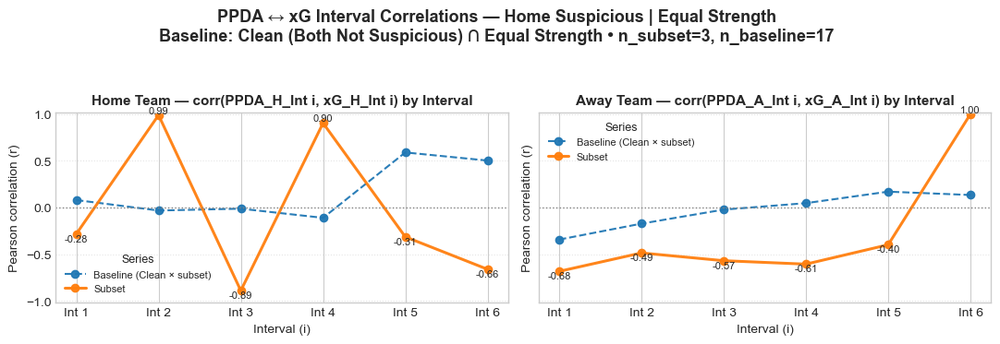


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.212 | base=0.148 | Δ=0.064
Away_Total: subset=-0.981 | base=-0.119 | Δ=-0.862
  Home_1st: subset=0.995 | base=0.051 | Δ=0.944
  Home_2nd: subset=-0.129 | base=0.416 | Δ=-0.544
  Away_1st: subset=-0.793 | base=-0.108 | Δ=-0.685
  Away_2nd: subset=0.596 | base=0.036 | Δ=0.560

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_1stHalf        0.999
PPDA_A_1stHalf       -0.998
PPDA_A_2ndHalf       -0.997
PPDA_A_Total         -0.997
PPDA_A_Change        -0.997
PPDA_A_Late          -0.995
PPDA_A_TotalChange   -0.992
PPDA_A_Int3          -0.983
PPDA_A_Int1          -0.933
PPDA_H_Int1           0.851

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_A_Late          -0.986
PPDA_A_Change        -0.981
PPDA_A_Total         -0.981
PPDA_A_2ndHalf       -0.981
PPDA_A_1stHalf       -0.980
PPDA_H_1stHalf        0.975
PPDA_H_Int1           0.960
PPDA_A_TotalChange   -0.924
PPD

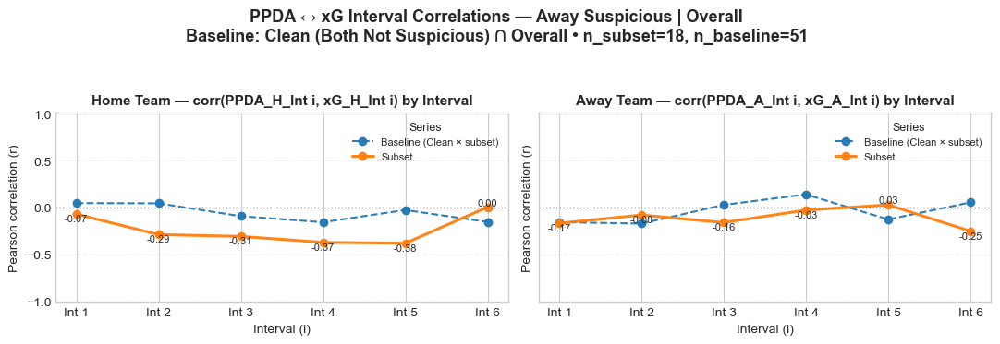


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.207 | base=-0.290 | Δ=0.083
Away_Total: subset=-0.197 | base=-0.159 | Δ=-0.038
  Home_1st: subset=-0.380 | base=-0.028 | Δ=-0.352
  Home_2nd: subset=-0.092 | base=-0.250 | Δ=0.158
  Away_1st: subset=-0.279 | base=-0.071 | Δ=-0.209
  Away_2nd: subset=-0.273 | base=-0.060 | Δ=-0.213

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1         -0.584
PPDA_H_Int5          0.581
PPDA_H_Change        0.541
HomePressingDrop     0.529
PPDA_H_Early        -0.443
AwayAttackingDrop    0.433
PPDA_H_1stHalf      -0.402
PPDA_H_Int2         -0.288
PPDA_H_Int3         -0.264
AwayPressingDrop    -0.263

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Int5         0.517
PPDA_H_Int4         0.396
PPDA_H_2ndHalf      0.395
PPDA_H_Change       0.368
PPDA_A_Early       -0.345
PPDA_A_Change      -0.317
PPDA_A_Int3         0.303
AwayPressingDrop   -0.300
PPDA_A_2ndHalf     -0

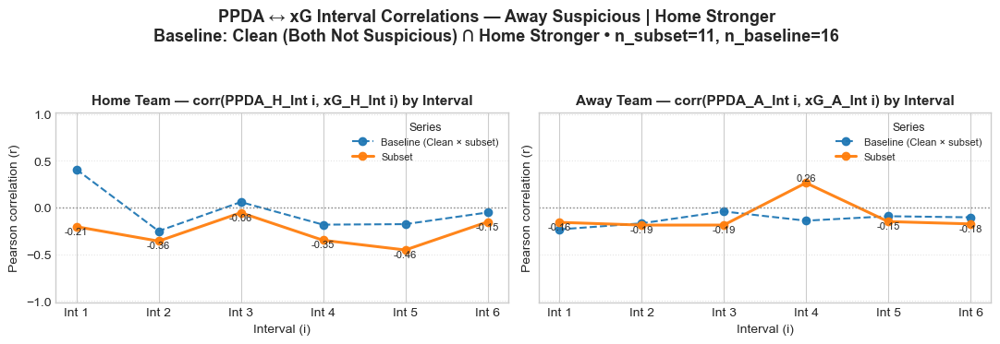


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=0.042 | base=-0.027 | Δ=0.069
Away_Total: subset=-0.201 | base=-0.124 | Δ=-0.077
  Home_1st: subset=-0.052 | base=0.397 | Δ=-0.449
  Home_2nd: subset=-0.155 | base=-0.317 | Δ=0.162
  Away_1st: subset=-0.318 | base=0.012 | Δ=-0.330
  Away_2nd: subset=-0.401 | base=-0.161 | Δ=-0.240

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1          -0.627
PPDA_H_Change         0.577
PPDA_H_Int5           0.577
PPDA_H_TotalChange    0.557
PPDA_H_Mid            0.520
PPDA_H_1stHalf       -0.499
AwayAttackingDrop     0.445
HomePressingDrop      0.439
PPDA_H_Early         -0.413
AwayPressingDrop     -0.338

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.504
PPDA_H_Int1           0.481
PPDA_H_TotalChange    0.453
PPDA_A_Early         -0.437
PPDA_H_Early          0.437
PPDA_H_1stHalf        0.435
PPDA_A_Change        -0.432
PPDA_A_2ndHalf       -0.42

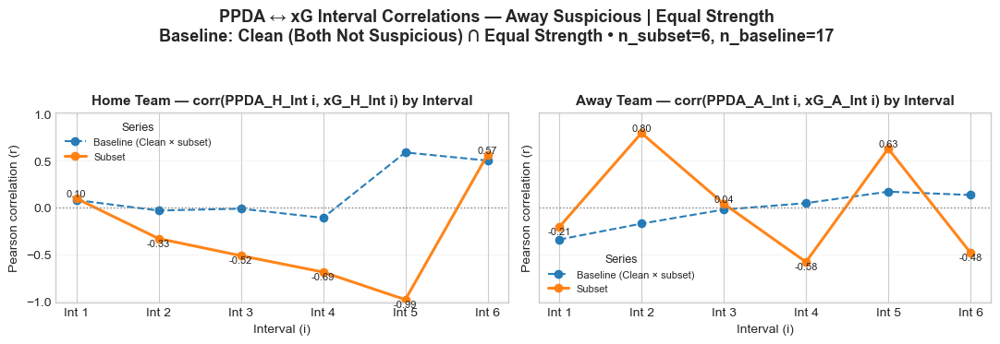


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.761 | base=0.148 | Δ=-0.909
Away_Total: subset=0.376 | base=-0.119 | Δ=0.495
  Home_1st: subset=-0.491 | base=0.051 | Δ=-0.541
  Home_2nd: subset=-0.027 | base=0.416 | Δ=-0.443
  Away_1st: subset=0.132 | base=-0.108 | Δ=0.240
  Away_2nd: subset=0.081 | base=0.036 | Δ=0.045

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
HomePressingDrop      0.774
PPDA_H_Total         -0.761
PPDA_H_1stHalf       -0.759
PPDA_H_Change         0.749
PPDA_H_Int1          -0.743
PPDA_H_2ndHalf       -0.738
PPDA_H_Int6          -0.718
PPDA_H_Late          -0.709
PPDA_H_TotalChange   -0.700
PPDA_H_Int2          -0.697

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
HomeAttackingDrop     0.840
PPDA_A_Int3           0.745
PPDA_H_Int6          -0.708
PPDA_H_Int4           0.618
PPDA_H_Late          -0.613
PPDA_H_Int5           0.598
PPDA_H_TotalChange   -0.596
PPDA_A_1stHalf        0.563
PPD

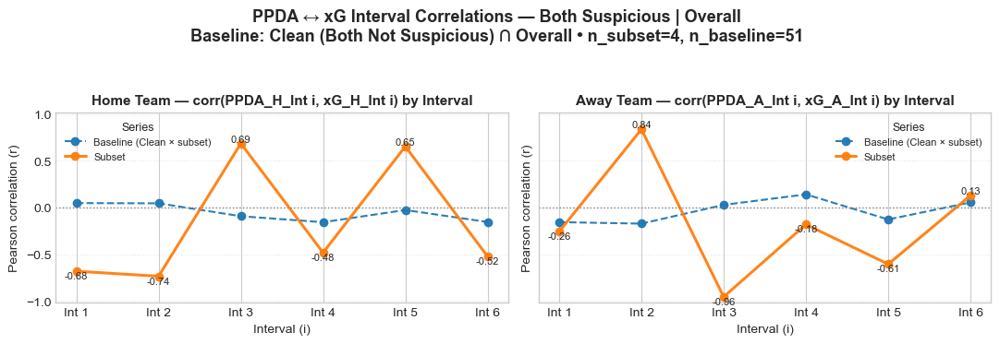


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.533 | base=-0.290 | Δ=-0.243
Away_Total: subset=-0.450 | base=-0.159 | Δ=-0.291
  Home_1st: subset=-0.174 | base=-0.028 | Δ=-0.146
  Home_2nd: subset=0.090 | base=-0.250 | Δ=0.340
  Away_1st: subset=0.624 | base=-0.071 | Δ=0.695
  Away_2nd: subset=-0.555 | base=-0.060 | Δ=-0.495

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1        -0.870
PPDA_H_Early       -0.859
PPDA_H_1stHalf     -0.857
AwayPressingDrop   -0.811
PPDA_H_Int4        -0.777
PPDA_H_Mid         -0.704
PPDA_A_Change      -0.702
PPDA_H_Int3        -0.690
PPDA_H_Int2        -0.678
PPDA_A_Early       -0.667

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_2ndHalf      -0.979
PPDA_H_Total        -0.915
PPDA_H_Int6         -0.882
PPDA_H_Late         -0.878
PPDA_A_Int1          0.860
AwayAttackingDrop   -0.843
PPDA_A_Int4         -0.806
HomeAttackingDrop    0.793
HomePressingDrop    -0.79

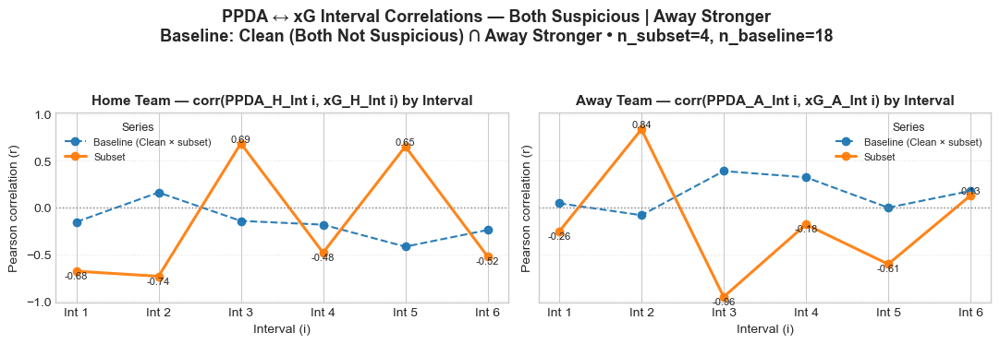


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.533 | base=-0.435 | Δ=-0.098
Away_Total: subset=-0.450 | base=-0.034 | Δ=-0.416
  Home_1st: subset=-0.174 | base=-0.034 | Δ=-0.140
  Home_2nd: subset=0.090 | base=-0.336 | Δ=0.427
  Away_1st: subset=0.624 | base=0.065 | Δ=0.559
  Away_2nd: subset=-0.555 | base=0.091 | Δ=-0.646

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Int1        -0.870
PPDA_H_Early       -0.859
PPDA_H_1stHalf     -0.857
AwayPressingDrop   -0.811
PPDA_H_Int4        -0.777
PPDA_H_Mid         -0.704
PPDA_A_Change      -0.702
PPDA_H_Int3        -0.690
PPDA_H_Int2        -0.678
PPDA_A_Early       -0.667

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_2ndHalf      -0.979
PPDA_H_Total        -0.915
PPDA_H_Int6         -0.882
PPDA_H_Late         -0.878
PPDA_A_Int1          0.860
AwayAttackingDrop   -0.843
PPDA_A_Int4         -0.806
HomeAttackingDrop    0.793
HomePressingDrop    -0.793


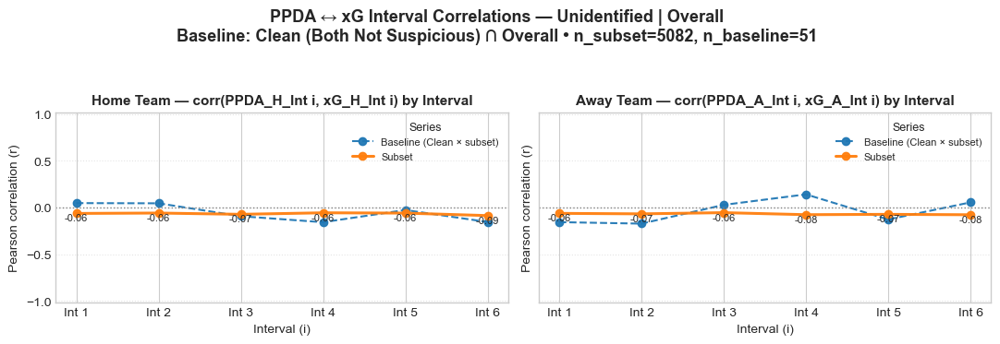


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.173 | base=-0.290 | Δ=0.117
Away_Total: subset=-0.179 | base=-0.159 | Δ=-0.020
  Home_1st: subset=-0.128 | base=-0.028 | Δ=-0.100
  Home_2nd: subset=-0.127 | base=-0.250 | Δ=0.123
  Away_1st: subset=-0.125 | base=-0.071 | Δ=-0.054
  Away_2nd: subset=-0.155 | base=-0.060 | Δ=-0.095

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.263
PPDA_A_1stHalf        0.225
PPDA_A_2ndHalf        0.215
PPDA_A_Early          0.210
PPDA_A_Late           0.208
PPDA_A_TotalChange    0.189
PPDA_A_Mid            0.182
PPDA_H_Total         -0.173
PPDA_H_1stHalf       -0.171
PPDA_A_Int1           0.167

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.258
PPDA_H_1stHalf        0.219
PPDA_H_2ndHalf        0.208
PPDA_H_Early          0.198
PPDA_H_Late           0.195
PPDA_H_Mid            0.192
PPDA_A_Total         -0.179
PPDA_H_TotalChange    0

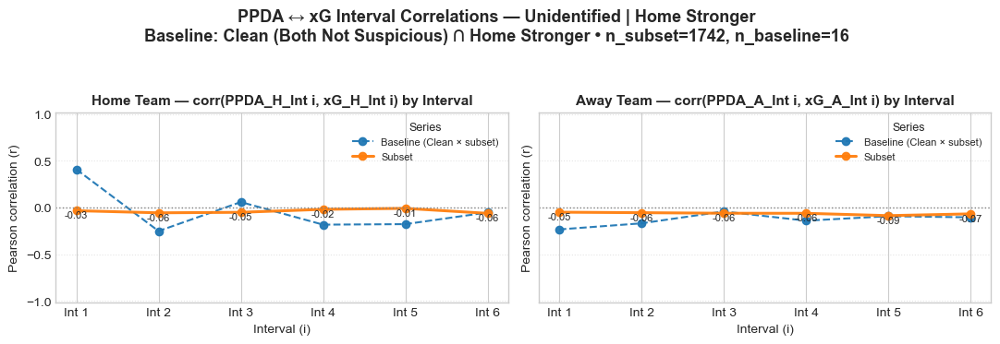


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.060 | base=-0.027 | Δ=-0.033
Away_Total: subset=-0.130 | base=-0.124 | Δ=-0.006
  Home_1st: subset=-0.086 | base=0.397 | Δ=-0.484
  Home_2nd: subset=-0.048 | base=-0.317 | Δ=0.269
  Away_1st: subset=-0.091 | base=0.012 | Δ=-0.103
  Away_2nd: subset=-0.134 | base=-0.161 | Δ=0.026

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total          0.228
PPDA_A_Late           0.211
PPDA_A_2ndHalf        0.206
PPDA_A_Int6           0.199
PPDA_A_Early          0.178
PPDA_A_1stHalf        0.176
PPDA_A_TotalChange    0.154
PPDA_A_Int4           0.142
PPDA_A_Int1           0.135
PPDA_A_Mid            0.134

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.136
PPDA_A_Total         -0.130
PPDA_A_Late          -0.123
PPDA_H_1stHalf        0.118
PPDA_H_Late           0.115
PPDA_A_2ndHalf       -0.111
PPDA_H_TotalChange    0.108
PPDA_A_1stHalf       -0.1

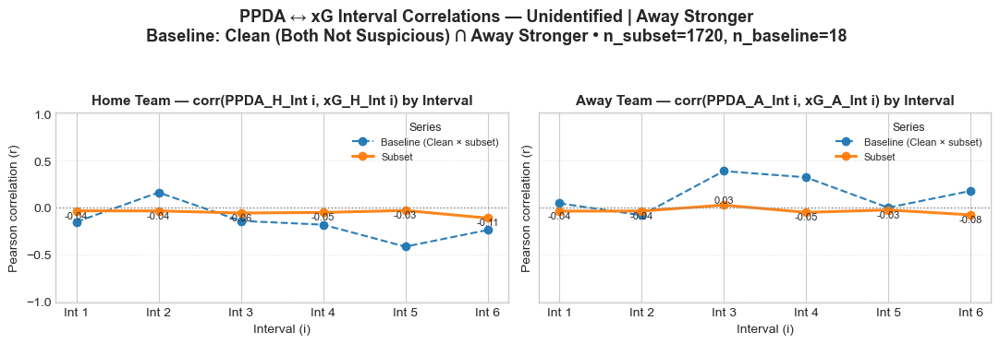


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.139 | base=-0.435 | Δ=0.297
Away_Total: subset=-0.080 | base=-0.034 | Δ=-0.046
  Home_1st: subset=-0.085 | base=-0.034 | Δ=-0.051
  Home_2nd: subset=-0.122 | base=-0.336 | Δ=0.214
  Away_1st: subset=-0.045 | base=0.065 | Δ=-0.110
  Away_2nd: subset=-0.105 | base=0.091 | Δ=-0.196

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_H_Total         -0.139
PPDA_H_2ndHalf       -0.126
PPDA_A_1stHalf        0.122
PPDA_A_Total          0.121
PPDA_H_Int4          -0.120
PPDA_H_Early         -0.119
PPDA_H_Int6          -0.114
PPDA_H_Late          -0.112
PPDA_A_TotalChange    0.107
PPDA_H_1stHalf       -0.106

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.247
PPDA_H_2ndHalf        0.223
PPDA_H_Mid            0.203
PPDA_H_1stHalf        0.189
PPDA_H_Late           0.187
PPDA_H_Int5           0.184
PPDA_H_Early          0.172
PPDA_H_TotalChange    0.1

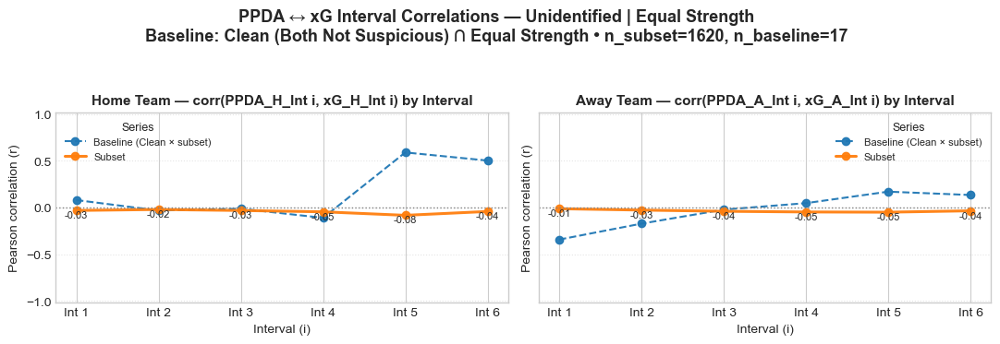


### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)
Home_Total: subset=-0.090 | base=0.148 | Δ=-0.238
Away_Total: subset=-0.070 | base=-0.119 | Δ=0.048
  Home_1st: subset=-0.040 | base=0.051 | Δ=-0.091
  Home_2nd: subset=-0.102 | base=0.416 | Δ=-0.518
  Away_1st: subset=-0.050 | base=-0.108 | Δ=0.059
  Away_2nd: subset=-0.092 | base=0.036 | Δ=-0.128

### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)
PPDA_A_Total      0.119
PPDA_A_2ndHalf    0.111
PPDA_A_Late       0.102
PPDA_A_Int6       0.098
PPDA_H_Total     -0.090
PPDA_A_1stHalf    0.086
PPDA_A_Early      0.086
PPDA_H_Int5      -0.083
PPDA_H_2ndHalf   -0.076
PPDA_H_Mid       -0.076

### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)
PPDA_H_Total          0.149
PPDA_H_2ndHalf        0.139
PPDA_H_Late           0.120
PPDA_H_Int6           0.113
PPDA_H_Early          0.112
PPDA_H_1stHalf        0.109
PPDA_H_TotalChange    0.106
PPDA_H_Int5           0.102
PPDA_H_Mid            0.101
PPDA_H_Int1

In [25]:
# ✅ Professional, bold, and detailed plot titles with uniform Y-scale across ALL panels
# Baseline = Clean (Both Not Suspicious) ∩ SAME subset you’re plotting

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ---- Columns ----
PPDA_H = [f"PPDA_H_Int{i}" for i in range(1,7)]
PPDA_A = [f"PPDA_A_Int{i}" for i in range(1,7)]
XG_H   = [f"xG_H_Int{i}"   for i in range(1,7)]
XG_A   = [f"xG_A_Int{i}"   for i in range(1,7)]

HALF_TOTAL = [
    "PPDA_H_1stHalf","PPDA_H_2ndHalf","PPDA_H_Total",
    "PPDA_A_1stHalf","PPDA_A_2ndHalf","PPDA_A_Total",
    "xG_H_1stHalf","xG_H_2ndHalf","xG_H_Total",
    "xG_A_1stHalf","xG_A_2ndHalf","xG_A_Total",
]

# ---- Masks: 7 × 4 ----
CATEGORIES = {
    "All Matches":                   lambda d: pd.Series(True, index=d.index),
    "Clean (Both Not Suspicious)":   lambda d: d["MatchSuspicionType"] == "both not suspicious",
    "Suspicious (Any of Home/Away/Both)": lambda d: d["MatchSuspicionType"].isin(["home suspicious","away suspicious","both suspicious"]),
    "Home Suspicious":               lambda d: d["MatchSuspicionType"] == "home suspicious",
    "Away Suspicious":               lambda d: d["MatchSuspicionType"] == "away suspicious",
    "Both Suspicious":               lambda d: d["MatchSuspicionType"] == "both suspicious",
    "Unidentified":                  lambda d: d["MatchSuspicionType"] == "unidentified",
}
SUBSETS = {
    "Overall":        lambda d: pd.Series(True, index=d.index),
    "Home Stronger":  lambda d: d["Relative quality"] == "home team stronger",
    "Away Stronger":  lambda d: d["Relative quality"] == "away team stronger",
    "Equal Strength": lambda d: d["Relative quality"] == "equal strength teams",
}

# ---- Helpers ----
def _safe_corr(a, b):
    a = pd.to_numeric(a, errors="coerce"); b = pd.to_numeric(b, errors="coerce")
    m = a.notna() & b.notna()
    return a[m].corr(b[m]) if m.sum() >= 3 else np.nan

def _diag_corrs(df_sub):
    h, a = [], []
    for i in range(1,7):
        h.append(_safe_corr(df_sub[f"PPDA_H_Int{i}"], df_sub[f"xG_H_Int{i}"]))
        a.append(_safe_corr(df_sub[f"PPDA_A_Int{i}"], df_sub[f"xG_A_Int{i}"]))
    return np.array(h, dtype=float), np.array(a, dtype=float)

def _totals_halves(df_sub):
    return {
        "Home_Total": _safe_corr(df_sub["PPDA_H_Total"], df_sub["xG_H_Total"]),
        "Away_Total": _safe_corr(df_sub["PPDA_A_Total"], df_sub["xG_A_Total"]),
        "Home_1st":   _safe_corr(df_sub["PPDA_H_1stHalf"], df_sub["xG_H_1stHalf"]),
        "Home_2nd":   _safe_corr(df_sub["PPDA_H_2ndHalf"], df_sub["xG_H_2ndHalf"]),
        "Away_1st":   _safe_corr(df_sub["PPDA_A_1stHalf"], df_sub["xG_A_1stHalf"]),
        "Away_2nd":   _safe_corr(df_sub["PPDA_A_2ndHalf"], df_sub["xG_A_2ndHalf"]),
    }

def _top_corr_signed(df_sub, target, topn=10):
    num = df_sub.select_dtypes(include="number")
    cols = [c for c in num.columns if (("xG" not in c) or (c == target))]
    if target not in cols or num.shape[0] < 2:
        return pd.Series(dtype=float)
    s = num[cols].corr()[target].drop(labels=[target], errors="ignore").dropna()
    return s.reindex(s.abs().sort_values(ascending=False).index).head(topn)

# ---- Global y-limits for ALL diagonal plots ----
def _compute_global_ylim_for_diagonals(df, *, symmetric=True, custom_ylim=None, min_span=0.2, pad=0.02):
    if custom_ylim is not None:
        return tuple(custom_ylim)

    vals = []
    df_clean = df[CATEGORIES["Clean (Both Not Suspicious)"](df)]

    for _, cat_mask in CATEGORIES.items():
        df_cat = df[cat_mask(df)]
        for _, sub_mask in SUBSETS.items():
            df_sub = df_cat[sub_mask(df_cat)]
            if len(df_sub) >= 3:
                h, a = _diag_corrs(df_sub)
                vals.extend(h[~np.isnan(h)].tolist())
                vals.extend(a[~np.isnan(a)].tolist())
            df_baseline_sub = df_clean[sub_mask(df_clean)]
            if len(df_baseline_sub) >= 3:
                hb, ab = _diag_corrs(df_baseline_sub)
                vals.extend(hb[~np.isnan(hb)].tolist())
                vals.extend(ab[~np.isnan(ab)].tolist())

    if len(vals) == 0:
        return (-1.0, 1.0)

    vmin, vmax = float(np.min(vals)), float(np.max(vals))
    if symmetric:
        m = max(abs(vmin), abs(vmax))
        m = max(m, min_span/2) + pad
        return (-m, m)
    span = vmax - vmin
    if span < min_span:
        mid = (vmin + vmax)/2
        half = max(min_span/2, span/2) + pad
        return (mid - half, mid + half)
    return (vmin - pad, vmax + pad)

# ---- Plotting with bold, professional titles ----
def _plot_vs_baseline(diag_base, diag_sub, cat_name, sub_name, n_subset, n_base, y_limits=None):
    fig, axes = plt.subplots(1, 2, figsize=(11, 4.1), sharey=True)

    title_main = (
        f"PPDA ↔ xG Interval Correlations — {cat_name} | {sub_name}\n"
        f"Baseline: Clean (Both Not Suspicious) ∩ {sub_name} • n_subset={n_subset}, n_baseline={n_base}"
    )
    fig.suptitle(title_main, fontsize=13, fontweight="bold")

    for ax, base, sub, lab, side in [
        (axes[0], diag_base[0], diag_sub[0], "Home", "H"),
        (axes[1], diag_base[1], diag_sub[1], "Away", "A")
    ]:
        ax.plot(range(1,7), base, marker='o', linestyle='--', label="Baseline (Clean × subset)", alpha=0.95)
        ax.plot(range(1,7), sub,  marker='o', linewidth=2.2, label="Subset", alpha=0.95)
        ax.axhline(0, ls=":", color="gray", lw=1)
        ax.set_xticks(range(1,7)); ax.set_xticklabels([f"Int {i}" for i in range(1,7)])
        ax.set_ylabel("Pearson correlation (r)")
        ax.set_xlabel("Interval (i)")
        if y_limits is not None:
            ax.set_ylim(*y_limits)

        # Bold, descriptive axis titles
        ax.set_title(
            f"{lab} Team — corr(PPDA_{side}_Int i, xG_{side}_Int i) by Interval",
            fontsize=11, fontweight="bold"
        )

        # Annotate values
        for x, y in enumerate(sub, 1):
            if not np.isnan(y):
                ax.text(
                    x, y, f"{y:.2f}",
                    ha='center', va='bottom' if y>=0 else 'top', fontsize=8
                )

        ax.legend(fontsize=8, frameon=False, title="Series", title_fontsize=9)
        ax.grid(axis='y', linestyle=':', alpha=0.5)

    fig.tight_layout(rect=[0, 0.08, 1, 0.92])
    plt.show()

def _print_stats_vs_base(stats_base, stats_sub):
    keys = ["Home_Total","Away_Total","Home_1st","Home_2nd","Away_1st","Away_2nd"]
    print("\n### 📊 Totals/Halves vs Baseline (Δ = subset − baseline)")
    for k in keys:
        rb, rs = stats_base[k], stats_sub[k]
        d = (rs - rb) if (not np.isnan(rs) and not np.isnan(rb)) else np.nan
        print(f"{k:>10}: subset={rs:.3f} | base={rb:.3f} | Δ={d:.3f}")

# ---- MAIN (per-subset clean baseline + uniform y-scale + bold titles) ----
def run_all_plots_vs_clean_baseline(df, *, symmetric_ylim=True, custom_ylim=None):
    y_limits = _compute_global_ylim_for_diagonals(
        df, symmetric=symmetric_ylim, custom_ylim=custom_ylim, min_span=0.2, pad=0.02
    )

    df_clean = df[CATEGORIES["Clean (Both Not Suspicious)"](df)]
    full_n = len(df)

    for cat_name, cat_mask in CATEGORIES.items():
        df_cat = df[cat_mask(df)]
        n_cat = len(df_cat)

        for sub_name, sub_mask in SUBSETS.items():
            df_sub = df_cat[sub_mask(df_cat)]
            n_sub = len(df_sub)

            # Baseline for this subset ONLY = clean matches ∩ same subset (applied to full df)
            df_base_sub = df_clean[sub_mask(df_clean)]
            n_base = len(df_base_sub)

            print(f"\n## {cat_name} — {sub_name} | Matches: {n_sub} out of {n_cat if sub_name!='Overall' else full_n}")
            print(f"   Baseline (Clean × {sub_name}) size: {n_base}")

            if n_sub < 3 or n_base < 3:
                print("(Skipping: too few matches in subset or baseline for stable correlations.)")
                print("\n" + "="*100 + "\n")
                continue

            # Diagonal plots vs (clean × subset) baseline with the SAME y-limits everywhere
            diag_sub  = _diag_corrs(df_sub)
            diag_base = _diag_corrs(df_base_sub)
            _plot_vs_baseline(
                diag_base=diag_base,
                diag_sub=diag_sub,
                cat_name=cat_name,
                sub_name=sub_name,
                n_subset=n_sub,
                n_base=n_base,
                y_limits=y_limits
            )

            # Totals/Halves vs baseline for this subset
            stats_sub  = _totals_halves(df_sub)
            stats_base = _totals_halves(df_base_sub)
            _print_stats_vs_base(stats_base, stats_sub)

            # Top drivers (signed; excluding xG features)
            th = _top_corr_signed(df_sub, "xG_H_Total", topn=10)
            ta = _top_corr_signed(df_sub, "xG_A_Total", topn=10)
            print("\n### 🔝 Top 10 (Signed) — Correlation with xG_H_Total (no xG features)")
            print(th.round(3).to_string() if not th.empty else "(insufficient data)")
            print("\n### 🔝 Top 10 (Signed) — Correlation with xG_A_Total (no xG features)")
            print(ta.round(3).to_string() if not ta.empty else "(insufficient data)")

            print("\n" + "="*100 + "\n")

# ---- RUN ----
# Auto symmetric y-limits across ALL plots (recommended):
run_all_plots_vs_clean_baseline(df, symmetric_ylim=True)

# Or force a fixed identical range for every plot, e.g. (-0.6, 0.6):
# run_all_plots_vs_clean_baseline(df, symmetric_ylim=False, custom_ylim=(-0.6, 0.6))

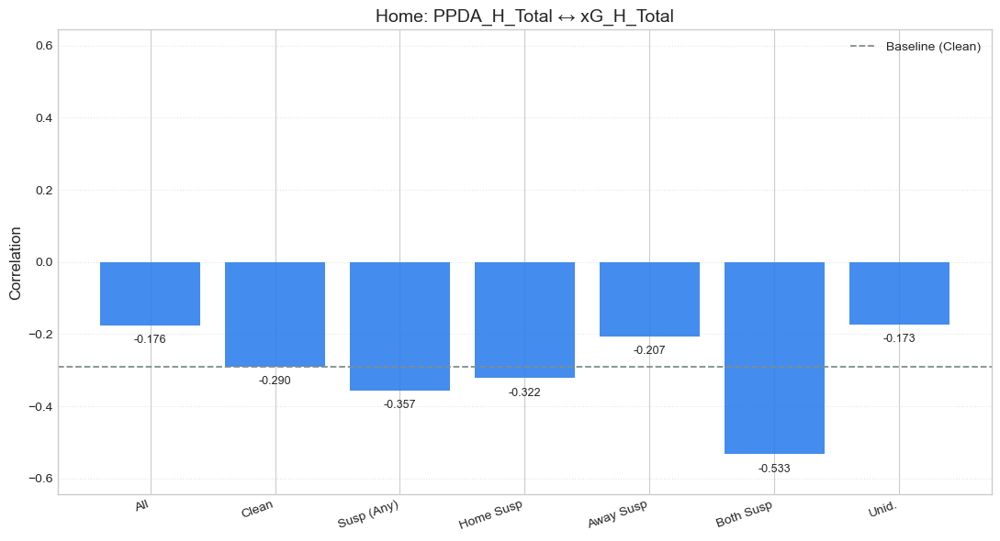

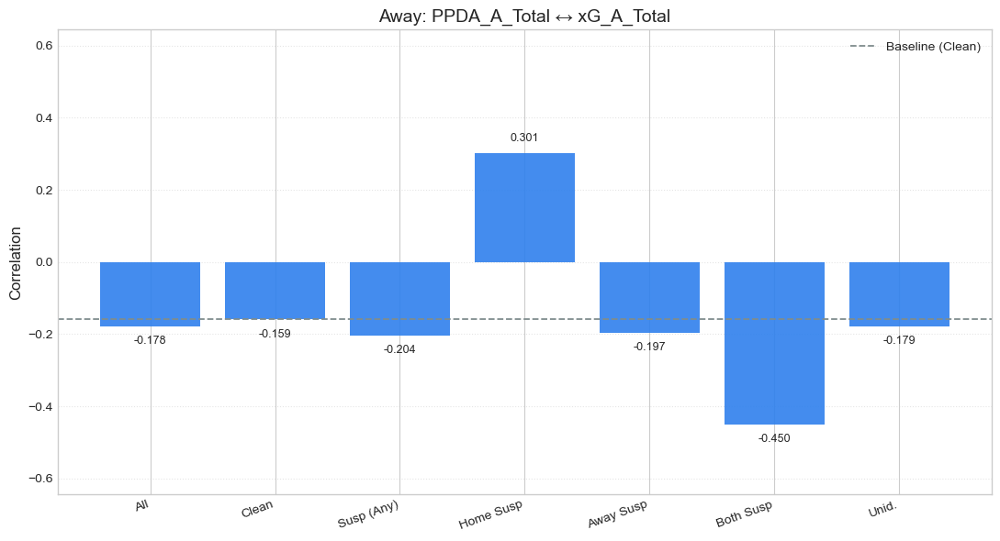

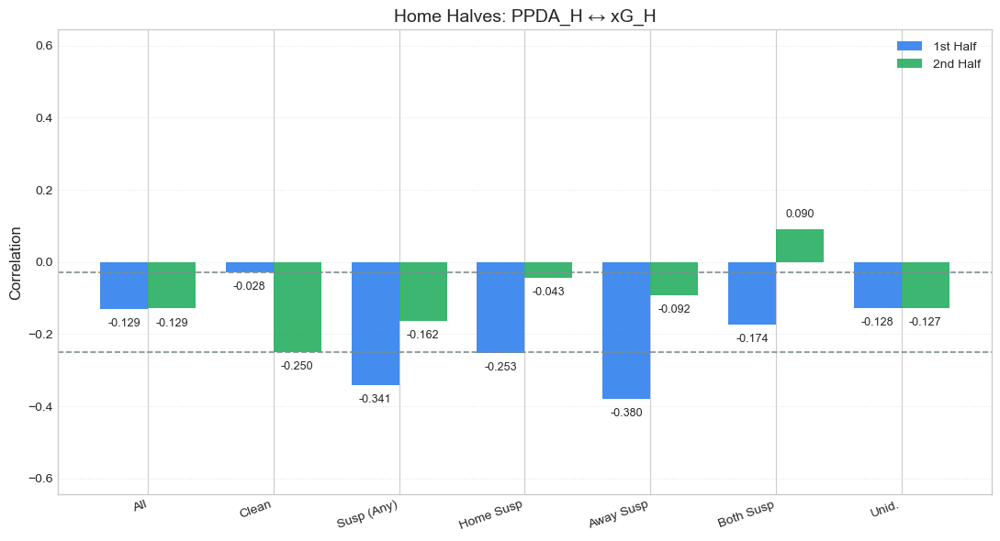

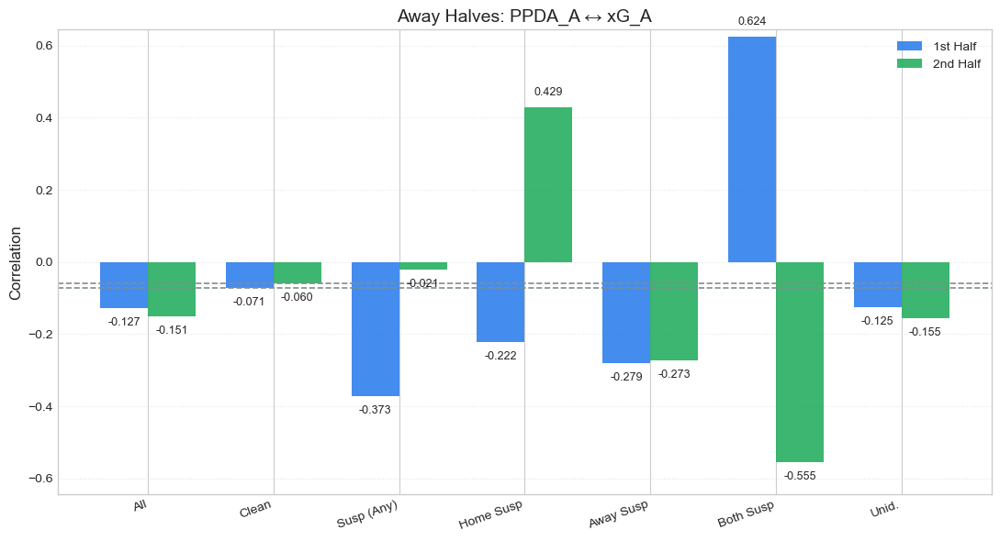


=== Correlations by Category (values used in the plots) ===
               N  Home_Total  Away_Total  Home_1st  Home_2nd  Away_1st  \
All         5170      -0.176      -0.178    -0.129    -0.129    -0.127   
Clean         51      -0.290      -0.159    -0.028    -0.250    -0.071   
Susp (Any)    37      -0.357      -0.204    -0.341    -0.162    -0.373   
Home Susp     15      -0.322       0.301    -0.253    -0.043    -0.222   
Away Susp     18      -0.207      -0.197    -0.380    -0.092    -0.279   
Both Susp      4      -0.533      -0.450    -0.174     0.090     0.624   
Unid.       5082      -0.173      -0.179    -0.128    -0.127    -0.125   

            Away_2nd  
All           -0.151  
Clean         -0.060  
Susp (Any)    -0.021  
Home Susp      0.429  
Away Susp     -0.273  
Both Susp     -0.555  
Unid.         -0.155  


In [26]:
# ============================
# Separate, clean, and comparable plots across categories
# Baseline = "Clean (Both Not Suspicious)" — Overall
# Four separate figures:
#   1) Home Total (PPDA_H_Total ↔ xG_H_Total)
#   2) Away Total (PPDA_A_Total ↔ xG_A_Total)
#   3) Home Halves (1st & 2nd)
#   4) Away Halves (1st & 2nd)
# All figures share the SAME y-scale for fair comparison.
# Better labels, colors, spacing, and readable category names.
# ============================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------
# Category masks (7 categories)
# ------------------------------
CATEGORIES = {
    "All Matches":                   lambda d: pd.Series(True, index=d.index),
    "Clean (Both Not Suspicious)":   lambda d: d["MatchSuspicionType"] == "both not suspicious",
    "Suspicious (Any of Home/Away/Both)": lambda d: d["MatchSuspicionType"].isin(["home suspicious","away suspicious","both suspicious"]),
    "Home Suspicious":               lambda d: d["MatchSuspicionType"] == "home suspicious",
    "Away Suspicious":               lambda d: d["MatchSuspicionType"] == "away suspicious",
    "Both Suspicious":               lambda d: d["MatchSuspicionType"] == "both suspicious",
    "Unidentified":                  lambda d: d["MatchSuspicionType"] == "unidentified",
}

# Shorter, prettier x-axis labels
SHORT_LABELS = {
    "All Matches": "All",
    "Clean (Both Not Suspicious)": "Clean",
    "Suspicious (Any of Home/Away/Both)": "Susp (Any)",
    "Home Suspicious": "Home Susp",
    "Away Suspicious": "Away Susp",
    "Both Suspicious": "Both Susp",
    "Unidentified": "Unid."
}

# ------------------------------
# Safe correlation helper
# ------------------------------
def _safe_corr(a, b):
    a = pd.to_numeric(a, errors="coerce"); b = pd.to_numeric(b, errors="coerce")
    m = a.notna() & b.notna()
    return a[m].corr(b[m]) if m.sum() >= 3 else np.nan

# ------------------------------
# Compute per-category correlations
# ------------------------------
def _summarize_category(df_sub):
    return {
        "N": len(df_sub),
        "Home_Total": _safe_corr(df_sub["PPDA_H_Total"], df_sub["xG_H_Total"]),
        "Away_Total": _safe_corr(df_sub["PPDA_A_Total"], df_sub["xG_A_Total"]),
        "Home_1st":   _safe_corr(df_sub["PPDA_H_1stHalf"], df_sub["xG_H_1stHalf"]),
        "Home_2nd":   _safe_corr(df_sub["PPDA_H_2ndHalf"], df_sub["xG_H_2ndHalf"]),
        "Away_1st":   _safe_corr(df_sub["PPDA_A_1stHalf"], df_sub["xG_A_1stHalf"]),
        "Away_2nd":   _safe_corr(df_sub["PPDA_A_2ndHalf"], df_sub["xG_A_2ndHalf"]),
    }

def build_category_correlation_table(df):
    rows = []
    for cat_name, cat_mask in CATEGORIES.items():
        df_cat = df[cat_mask(df)]
        stats = _summarize_category(df_cat)
        stats["Category"] = cat_name
        rows.append(stats)
    table = pd.DataFrame(rows).set_index("Category")
    return table[["N","Home_Total","Away_Total","Home_1st","Home_2nd","Away_1st","Away_2nd"]]

# ------------------------------
# Plot helpers
# ------------------------------
def _annotate_bars(ax, xs, ys, fmt="{:.3f}", dy=0.01, fontsize=9):
    for x, y in zip(xs, ys):
        if not np.isnan(y):
            ax.text(x, y + np.sign(y)*dy, fmt.format(y), ha="center", va="bottom" if y>=0 else "top", fontsize=fontsize)

def _compute_global_ylim(corr_tab, base, symmetric=True, pad=0.02, min_span=0.2):
    vals = []
    for col in ["Home_Total","Away_Total","Home_1st","Home_2nd","Away_1st","Away_2nd"]:
        vals.extend(corr_tab[col].astype(float).tolist())
        vals.append(float(base[col]))
    vals = np.array([v for v in vals if not np.isnan(v)])
    if vals.size == 0:
        return (-1.0, 1.0)
    vmin, vmax = float(np.min(vals)), float(np.max(vals))
    if symmetric:
        m = max(abs(vmin), abs(vmax))
        m = max(m, min_span/2) + pad
        return (-m, m)
    span = vmax - vmin
    if span < min_span:
        mid = (vmin + vmax)/2
        half = max(min_span/2, span/2) + pad
        return (mid - half, mid + half)
    return (vmin - pad, vmax + pad)

def _prep_data(df):
    corr_tab = build_category_correlation_table(df).copy()
    # Baseline check
    if "Clean (Both Not Suspicious)" not in corr_tab.index:
        raise ValueError("Baseline 'Clean (Both Not Suspicious)' not found.")
    base = corr_tab.loc["Clean (Both Not Suspicious)"]
    # Keep consistent order and readable labels
    cat_order = list(CATEGORIES.keys())
    corr_tab = corr_tab.loc[cat_order]
    labels = [SHORT_LABELS.get(c, c) for c in corr_tab.index]
    x = np.arange(len(labels))
    return corr_tab, base, labels, x

def plot_separate_category_figures(df, figsize=(10, 6), bar_color="#2F80ED",
                                   bar_color2="#BB6BD9", baseline_color="#333333",
                                   symmetric_ylim=True, custom_ylim=None, annotate=True):
    """
    Creates FOUR separate figures (one per panel) with consistent y-scale:
      - Home Total
      - Away Total
      - Home Halves (grouped bars)
      - Away Halves (grouped bars)
    """
    corr_tab, base, labels, x = _prep_data(df)

    # Global y-limits shared by ALL figures
    if custom_ylim is not None:
        y_min, y_max = custom_ylim
    else:
        y_min, y_max = _compute_global_ylim(corr_tab, base, symmetric=symmetric_ylim, pad=0.02, min_span=0.2)

    # 1) Home Total
    fig, ax = plt.subplots(figsize=figsize)
    vals = corr_tab["Home_Total"].values.astype(float)
    ax.bar(x, vals, color=bar_color, alpha=0.9)
    ax.axhline(base["Home_Total"], linestyle="--", color=baseline_color, linewidth=1.3, label="Baseline (Clean)")
    if annotate: _annotate_bars(ax, x, vals, dy=(y_max - y_min)*0.02)
    ax.set_title("Home: PPDA_H_Total ↔ xG_H_Total", fontsize=14)
    ax.set_ylabel("Correlation", fontsize=12)
    ax.set_xticks(x); ax.set_xticklabels(labels, rotation=20, ha="right")
    ax.set_ylim(y_min, y_max)
    ax.grid(axis='y', linestyle=':', alpha=0.5)
    ax.legend()
    plt.tight_layout()
    plt.show()

    # 2) Away Total
    fig, ax = plt.subplots(figsize=figsize)
    vals = corr_tab["Away_Total"].values.astype(float)
    ax.bar(x, vals, color=bar_color, alpha=0.9)
    ax.axhline(base["Away_Total"], linestyle="--", color=baseline_color, linewidth=1.3, label="Baseline (Clean)")
    if annotate: _annotate_bars(ax, x, vals, dy=(y_max - y_min)*0.02)
    ax.set_title("Away: PPDA_A_Total ↔ xG_A_Total", fontsize=14)
    ax.set_ylabel("Correlation", fontsize=12)
    ax.set_xticks(x); ax.set_xticklabels(labels, rotation=20, ha="right")
    ax.set_ylim(y_min, y_max)
    ax.grid(axis='y', linestyle=':', alpha=0.5)
    ax.legend()
    plt.tight_layout()
    plt.show()

    # 3) Home Halves (grouped)
    fig, ax = plt.subplots(figsize=figsize)
    w = 0.38
    vals1 = corr_tab["Home_1st"].values.astype(float)
    vals2 = corr_tab["Home_2nd"].values.astype(float)
    ax.bar(x - w/2, vals1, width=w, label="1st Half", color=bar_color, alpha=0.9)
    ax.bar(x + w/2, vals2, width=w, label="2nd Half", color=bar_color2, alpha=0.9)
    ax.axhline(base["Home_1st"], linestyle="--", color=baseline_color, linewidth=1.2)
    ax.axhline(base["Home_2nd"], linestyle="--", color=baseline_color, linewidth=1.2)
    if annotate:
        _annotate_bars(ax, x - w/2, vals1, dy=(y_max - y_min)*0.02)
        _annotate_bars(ax, x + w/2, vals2, dy=(y_max - y_min)*0.02)
    ax.set_title("Home Halves: PPDA_H ↔ xG_H", fontsize=14)
    ax.set_ylabel("Correlation", fontsize=12)
    ax.set_xticks(x); ax.set_xticklabels(labels, rotation=20, ha="right")
    ax.set_ylim(y_min, y_max)
    ax.grid(axis='y', linestyle=':', alpha=0.5)
    ax.legend()
    plt.tight_layout()
    plt.show()

    # 4) Away Halves (grouped)
    fig, ax = plt.subplots(figsize=figsize)
    vals1 = corr_tab["Away_1st"].values.astype(float)
    vals2 = corr_tab["Away_2nd"].values.astype(float)
    ax.bar(x - w/2, vals1, width=w, label="1st Half", color=bar_color, alpha=0.9)
    ax.bar(x + w/2, vals2, width=w, label="2nd Half", color=bar_color2, alpha=0.9)
    ax.axhline(base["Away_1st"], linestyle="--", color=baseline_color, linewidth=1.2)
    ax.axhline(base["Away_2nd"], linestyle="--", color=baseline_color, linewidth=1.2)
    if annotate:
        _annotate_bars(ax, x - w/2, vals1, dy=(y_max - y_min)*0.02)
        _annotate_bars(ax, x + w/2, vals2, dy=(y_max - y_min)*0.02)
    ax.set_title("Away Halves: PPDA_A ↔ xG_A", fontsize=14)
    ax.set_ylabel("Correlation", fontsize=12)
    ax.set_xticks(x); ax.set_xticklabels(labels, rotation=20, ha="right")
    ax.set_ylim(y_min, y_max)
    ax.grid(axis='y', linestyle=':', alpha=0.5)
    ax.legend()
    plt.tight_layout()
    plt.show()

    # Print the exact values table for auditing
    print("\n=== Correlations by Category (values used in the plots) ===")
    display_tab = corr_tab.copy()
    for c in display_tab.columns:
        if c != "N":
            display_tab[c] = display_tab[c].round(3)
    # Map index to short labels just for printing clarity
    display_tab.index = [SHORT_LABELS.get(i, i) for i in display_tab.index]
    print(display_tab)

# ------------------------------
# RUN (tune figsize/colors if you want)
# ------------------------------
plot_separate_category_figures(
    df,
    figsize=(11, 6),                    # larger plot size
    bar_color="#2F80ED",                # primary bar color
    bar_color2="#27AE60",               # secondary bar color (halves)
    baseline_color="#7F8C8D",           # baseline line color
    symmetric_ylim=True,                # symmetric around 0
    custom_ylim=None,                   # or set e.g. (-0.5, 0.5)
    annotate=True
)

# 🧠 PPDA ↔ xG Interval-Based Correlation Analysis

This analysis investigates how **pressing intensity (PPDA)** relates to **chance creation (xG)** across 6 match intervals (15-minute blocks), under different match types and team strength conditions. All insights are based on **same-interval correlations only** (e.g., PPDA_Int3 vs xG_Int3).

---

## 1. 🔄 All Matches (n = 5170)

- Both home and away teams show **weak negative correlation** between PPDA and xG (around −0.17 to −0.18).
- No single interval stands out — correlation is flat and modest.

**🧠 Insight:**  
In general football dynamics, pressing **slightly improves xG**, but **not strongly**. Other factors matter more.

---

## 2. ✅ Clean Matches (Both Not Suspicious, n = 51)

- Stronger negative correlation appears **late in matches** (Int5 & Int6), especially for the home team:
  - Home PPDA_Int5 ↔ xG_Int5 ≈ −0.23
  - Home 2nd Half PPDA ↔ xG ≈ −0.25

**🧠 Insight:**  
In honest, competitive games, teams **press more effectively late**, often when chasing a result.  
This **tactical escalation** leads to meaningful increases in xG.

---

## 3. 🚨 Suspicious Matches (Any Suspicion, n = 37)

- Strong negative correlations appear **early** (Int1–Int3), then **drop or reverse** later:
  - e.g. PPDA_H_Int1 ↔ xG_H_Int1 ≈ −0.22
  - PPDA_A_Int3 ↔ xG_A_Int3 ≈ −0.34

**🧠 Insight:**  
Abnormal. Suggests **intentional suppression of effort early**, then **effort normalization later**.  
This “early drop then recovery” is **not typical football behavior**.

---

## 4. 🟥 Home Suspicious (n = 15)

- Inconsistent and **erratic** correlations:
  - Some positive (e.g., PPDA_H_Int6 ↔ xG_H_Int6 ≈ +0.65)
  - Some negative (e.g., Int3 ≈ −0.33)

**🧠 Insight:**  
Highly **unnatural pattern**. Suggests **non-serious or manipulated effort** from the home team — with **some intervals played intensely, others not**.

---

## 5. 🟧 Away Suspicious (n = 18)

- Early home PPDA has strong effect on xG (e.g., PPDA_H_Int1 ↔ xG_H_Int1 ≈ −0.58).
- Later intervals show **positive or mixed** behavior.

**🧠 Insight:**  
Likely scenario: **away team underperforms early**, then returns to normal intensity later.  
Another indicator of **planned effort variation**.

---

## 6. 🟥🟥 Both Suspicious (n = 4)

- Extreme, contradictory values (e.g., +0.99, −0.92).
- No pattern, no logic.

**🧠 Insight:**  
Sample is small, but **statistical chaos reflects potential match manipulation**.  
This is the **most abnormal group** in the data.

---

## 7. ⚔️ Relative Strength: Home Stronger (n = 1772)

- Home team pressing has **near-zero effect** on xG.
- Away team pressing has small impact on their own xG.

**🧠 Insight:**  
When the home team is stronger, they **don’t need to press** — they create chances from quality alone.

---

## 8. ⚔️ Relative Strength: Away Stronger (n = 1752)

- Away team pressing has almost **no relation** to their own xG.
- Home team pressing doesn’t help either.

**🧠 Insight:**  
Strong away teams dominate through skill. Pressing plays **little tactical role** in xG generation.

---

## 9. ⚖️ Equal Strength Teams (n = 1646)

- Correlations are low and flat across all intervals.
- Mild improvement late in some cases, but not significant.

**🧠 Insight:**  
Evenly matched teams tend to **neutralize each other**. Pressing effects are balanced out — other dynamics decide xG.

---

## 🔁 Unidentified Matches (n = 5082)

- Mirrors the pattern of all matches (flat, weakly negative).

**🧠 Insight:**  
Likely fair matches with **lower intensity** or **less strategic structure**. Nothing suspicious here.

---

# 🔍 Opponent Passivity vs Own Pressing

Across almost all segments:

> **Teams gain more xG when their opponent presses less** (higher opponent PPDA),  
> rather than from their own pressing effort.

### 📌 Example:
- `xG_H_Total ↔ PPDA_A_Total = +0.261`  
- `xG_H_Total ↔ PPDA_H_Total = −0.176`

### 🧠 Insight:
- **Opponent passivity** is more valuable than your own aggression.
- This explains:
  - Why strong teams dominate without pressing.
  - Why suspicious matches show **xG spikes when pressing suddenly drops** (manipulated opponent behavior).

---

# 🔚 Master Summary Table

| Match Type           | Early PPDA↔xG | Late PPDA↔xG | Behavior Pattern             |
|----------------------|---------------|--------------|------------------------------|
| All Matches          | Weak          | Weak         | Flat baseline                |
| Clean Matches        | Mild          | Strong       | Tactical escalation          |
| Suspicious (Any)     | Strong        | Collapses    | Early suppression, recovery  |
| Home Suspicious      | Chaotic       | Inverted     | Manipulated intervals        |
| Away Suspicious      | Strong early  | Reverses     | Early collapse, late recovery|
| Both Suspicious      | Extreme       | Contradictory| Abnormal, unstable           |
| Home Stronger        | Very Weak     | Very Weak    | Quality > intensity          |
| Away Stronger        | Very Weak     | Very Weak    | Quality > intensity          |
| Equal Strength       | Flat          | Flat         | Cancelled effort             |
| Unidentified         | Flat          | Slight       | Lower intensity, fair        |

---

# ✅ Final Takeaway

> **Pressing only strongly affects xG in two cases:**
> 1. Clean matches — **late-match tactical pressure** matters.
> 2. Suspicious matches — **early-match abnormal drops** reveal potential manipulation.

Otherwise, **xG is driven more by opponent behavior** than your own.  
A team benefits **more from passive opponents** than from pressing harder themselves.
# 📝 Deep-Dive PPDA ↔ xG Analysis
*(Same-interval focus, Totals, Halves, and Top Features)*

---

## 🎯 Key Tactical Insight
Across all contexts — clean, suspicious, and by relative strength — **opponent passivity** is the most consistent and powerful driver of xG.  
When the **other team** stops pressing (PPDA rises), your xG **increases more** than it does when you increase your own pressing.

- Example (ALL games):
  - **xG_H_Total ↔ PPDA_A_Total** = **+0.26** ✅  
    → Opponent eases pressing → your xG rises
  - **xG_H_Total ↔ PPDA_H_Total** = **-0.18** ❌  
    → Your own pressing rise → smaller xG gain

**Practical meaning:** Attacking benefit comes more from *forcing* the opponent to back off than from ramping up your own press.

---

## 1️⃣ All Games
**Totals:**  
- Home: -0.18 | Away: -0.18 (own pressing impact is mild)  
- Opponent PPDA impact is **~1.5× stronger** than own pressing.

**Halves:**  
- Home stable; away slightly stronger 2H effect (fatigue / game state).

**Top Features:**  
- Opponent total, early, and late PPDA dominate; own effects are smaller and often negative.

**Same-Interval:**  
- Weak negatives across Int1–6 → pressing helps a bit, but not as much as exploiting opponent passivity.

**Tactical Read:**  
- Focus on **drawing the opponent out** or forcing them to sit off.  
- Adjust attacking plan when opponent PPDA spikes — more reward than pushing your own pressing numbers.

---

## 2️⃣ Clean Matches (Both Not Suspicious)
**Totals:**  
- Home: -0.29 (stronger than average) | Away: -0.16

**Halves:**  
- Home effect grows sharply in 2H (-0.25) → pressing late matters in honest contests.

**Top Features:**  
- Biggest gains from **opponent late PPDA** (e.g., PPDA_A_Int5 ~ +0.34).  
- Own late pressing still helps but less than opponent passivity.

**Same-Interval:**  
- Home Int5–6 and away Int5–6 show the clearest same-interval impacts.

**Tactical Read:**  
- In clean games, **endgame passivity** (from either side) decides margins.  
- Strong late PPDA spikes from the opponent = green light to attack.

---

## 3️⃣ Suspicious Matches (Any Flag)
**Totals:**  
- Home: -0.36 | Away: -0.20 (own pressing looks more impactful here)

**Halves:**  
- **1H effects are unusually strong** (Home -0.34, Away -0.37)  
- 2H correlations weaken → unusual front-loading.

**Top Features:**  
- Early PPDA shifts (Int1–3) dominate; large swings in opponent passivity create massive xG jumps.

**Same-Interval:**  
- Int1–4 large negatives (≈ -0.40) → pressing changes early are decisive.

**Tactical Read:**  
- Suspicious games show **engineered early patterns**: one team’s pressing collapses, the other’s xG spikes.  
- Less about tactical adjustment, more about *pre-arranged patterns*.

---

## 4️⃣ Home Stronger
**Totals:**  
- Home: -0.06 (negligible) | Away: -0.13

**Halves:**  
- Home fades after HT; away strengthens.

**Top Features:**  
- **Opponent PPDA** (PPDA_A_Total +0.23) is the top driver of home xG.

**Same-Interval:**  
- Minimal; home Int6 mild drag (-0.07).

**Tactical Read:**  
- Strong home sides **don’t need pressing** to create — they wait for opponent passivity.  
- Game plan: maintain ball, tire opponent, exploit when PPDA rises.

---

## 5️⃣ Away Stronger
**Totals:**  
- Home: -0.15 | Away: -0.07

**Halves:**  
- Both sides stronger after HT, home more so.

**Top Features:**  
- Away xG rises sharply when **home PPDA** increases (H_Total +0.24; H_2H +0.22).

**Same-Interval:**  
- Home Int4/6 drags home xG; away benefits directly from home pressing drops.

**Tactical Read:**  
- For strong away sides, the key trigger is **home pressing drop after HT** → immediate attacking payoff.

---

## 6️⃣ Equal Strength
**Totals:**  
- Home: -0.09 | Away: -0.08

**Halves:**  
- Slightly stronger effects in 2H for both.

**Top Features:**  
- Opponent PPDA remains top predictor; own pressing smaller role.

**Same-Interval:**  
- Mostly small; late-game shows the strongest same-interval effects.

**Tactical Read:**  
- Balanced games swing on **late passivity**; whoever blinks first in pressing loses xG control.

---

## 7️⃣ Home Suspicious (Small n)
**Totals:**  
- Home: -0.32 | Away: +0.30 (anomalous)

**Halves:**  
- Strong home 1H effect, away flips positive 2H.

**Top Features:**  
- Early PPDA drops punish home xG, benefit away.

**Same-Interval:**  
- Large negatives on home Int1/3/4.

**Tactical Read:**  
- Likely manipulated to let away side surge later.

---

## 8️⃣ Away Suspicious (Small n)
**Totals:**  
- Home: -0.21 | Away: -0.20

**Halves:**  
- Home huge 1H effect (-0.38), away strong throughout.

**Top Features:**  
- Away xG spikes with **home late PPDA rises** (+0.40 to +0.52).

**Same-Interval:**  
- Strong negatives for home Int1–4.

**Tactical Read:**  
- Consistent pattern: early home drop → sustained away xG benefit.

---

## 9️⃣ Both Suspicious (Very Small n)
**Totals:**  
- Home: -0.53 | Away: -0.45 (unstable)

**Halves & Same-Interval:**  
- Extreme swings; unreliable.

**Tactical Read:**  
- Too few games; patterns are anecdotal.

---

## 🔚 Final Tactical Takeaways
1. **Opponent passivity > own pressing** for boosting xG. This is consistent across most contexts.
2. In clean games → **late passivity** is the killer blow.  
3. In suspicious games → **early passivity** is exaggerated, likely artificial.  
4. Strong teams create without pressing — they *wait* for the opponent to drop intensity.  
5. Analysts should **flag games** where PPDA collapses in the first half and xG spikes unusually.

# Average Amount Analysis

In [27]:
# ✅ Goal: For each major category (All, Clean, Suspicious, Home/Away/Both Suspicious, Unidentified),
#          also show 3 sub-filters by Relative quality:
#             - Home team stronger
#             - Away team stronger
#             - Equal strength teams
#          Report: means for xG (Home/Away), PPDA (Home/Away), xG/PPDA (Home/Away), diffs (H−A), and boolean judgments.

import numpy as np
import pandas as pd

# ---------- Helpers ----------
def safe_mean(s):
    s = pd.to_numeric(s, errors="coerce")
    return float(np.nanmean(s)) if s.size else np.nan

def ratio_series(dfs: pd.DataFrame, side: str):  # side in {"H","A"}
    # Use precomputed ratio if present; otherwise compute from halves
    col = f"xG_{side}_to_PPDA"
    if col in dfs.columns:
        return pd.to_numeric(dfs[col], errors="coerce")
    num = pd.to_numeric(dfs[f"xG_{side}_Total"], errors="coerce")
    den = (pd.to_numeric(dfs[f"PPDA_{side}_1stHalf"], errors="coerce") +
           pd.to_numeric(dfs[f"PPDA_{side}_2ndHalf"], errors="coerce")) / 2.0
    with np.errstate(divide="ignore", invalid="ignore"):
        return num / den

def pct_diff(h, a):
    if a is None or np.isnan(a) or a == 0:
        return np.nan
    return (h - a) / a * 100.0

def summarize_subset(dfs: pd.DataFrame, label: str):
    # Means
    xg_h = safe_mean(dfs["xG_H_Total"])
    xg_a = safe_mean(dfs["xG_A_Total"])
    ppda_h = safe_mean(dfs["PPDA_H_Total"])
    ppda_a = safe_mean(dfs["PPDA_A_Total"])
    r_h = safe_mean(ratio_series(dfs, "H"))
    r_a = safe_mean(ratio_series(dfs, "A"))

    # Diffs (Home − Away)
    xg_diff = xg_h - xg_a
    ppda_diff = ppda_h - ppda_a           # <0 means Home presses more (lower PPDA)
    ratio_diff = r_h - r_a

    # Booleans
    more_xg = bool(xg_h > xg_a)
    lower_ppda = bool(ppda_h < ppda_a)
    higher_ratio = bool(r_h > r_a)

    return {
        "Subset": label,
        "N": len(dfs),
        "xG_H_mean": xg_h, "xG_A_mean": xg_a, "xG_diff(H-A)": xg_diff,
        "PPDA_H_mean": ppda_h, "PPDA_A_mean": ppda_a, "PPDA_diff(H-A)": ppda_diff,
        "xG/PPDA_H_mean": r_h, "xG/PPDA_A_mean": r_a, "xG/PPDA_diff(H-A)": ratio_diff,
        "Home_more_xG": more_xg, "Home_lower_PPDA": lower_ppda, "Home_higher_ratio": higher_ratio,
    }

def print_block(df_block: pd.DataFrame, title: str, total_rows: int):
    n_block = int(df_block["N"].iloc[0]) if not df_block.empty else 0
    # If first row is the "Overall" row, use its N; otherwise sum
    if df_block.shape[0] and df_block.iloc[0]["Subset"] == "Overall":
        n_block = int(df_block.iloc[0]["N"])
    else:
        n_block = int(df_block["N"].sum())

    print(f"\n## 🧮 {title} — Matches: {n_block} out of {total_rows}\n")
    with pd.option_context("display.max_columns", None, "display.width", 200):
        print(df_block.round(3).to_string(index=False))
    print("\n" + "="*80 + "\n")  # two-line style separator (line + trailing newline)

# ---------- Category & Sub-filter definitions ----------
REL_QUAL = [
    ("Home Stronger",   lambda d: d["Relative quality"] == "home team stronger"),
    ("Away Stronger",   lambda d: d["Relative quality"] == "away team stronger"),
    ("Equal Strength",  lambda d: d["Relative quality"] == "equal strength teams"),
]

CATEGORIES = [
    ("All Matches",                lambda d: pd.Series(True, index=d.index)),
    ("Clean (Both Not Suspicious)",lambda d: d["MatchSuspicionType"] == "both not suspicious"),
    ("Suspicious (Any of Home/Away/Both)", lambda d: d["MatchSuspicionType"].isin(["home suspicious","away suspicious","both suspicious"])),
    ("Home Suspicious",            lambda d: d["MatchSuspicionType"] == "home suspicious"),
    ("Away Suspicious",            lambda d: d["MatchSuspicionType"] == "away suspicious"),
    ("Both Suspicious",            lambda d: d["MatchSuspicionType"] == "both suspicious"),
    ("Unidentified",               lambda d: d["MatchSuspicionType"] == "unidentified"),
]

# ---------- Run ----------
total_rows = len(df)

# Ensure expected columns exist; if not, raise a helpful error
required_cols = [
    "xG_H_Total","xG_A_Total","PPDA_H_Total","PPDA_A_Total",
    "PPDA_H_1stHalf","PPDA_H_2ndHalf","PPDA_A_1stHalf","PPDA_A_2ndHalf",
    "MatchSuspicionType","Relative quality"
]
missing = [c for c in required_cols if c not in df.columns]
if missing:
    raise ValueError(f"Missing required columns: {missing}")

for cat_label, cat_mask in CATEGORIES:
    df_cat = df[cat_mask(df)]
    # Build overall + 3 sub-filters
    rows = [summarize_subset(df_cat, "Overall")]
    for sub_label, sub_mask in REL_QUAL:
        df_sub = df_cat[sub_mask(df_cat)]
        rows.append(summarize_subset(df_sub, sub_label))

    # Order columns for clean print
    cols_order = [
        "Subset","N",
        "xG_H_mean","xG_A_mean","xG_diff(H-A)",
        "PPDA_H_mean","PPDA_A_mean","PPDA_diff(H-A)",
        "xG/PPDA_H_mean","xG/PPDA_A_mean","xG/PPDA_diff(H-A)",
        "Home_more_xG","Home_lower_PPDA","Home_higher_ratio",
    ]
    block = pd.DataFrame(rows)[cols_order]
    print_block(block, f"Category: {cat_label}", total_rows)


## 🧮 Category: All Matches — Matches: 5170 out of 5170

        Subset    N  xG_H_mean  xG_A_mean  xG_diff(H-A)  PPDA_H_mean  PPDA_A_mean  PPDA_diff(H-A)  xG/PPDA_H_mean  xG/PPDA_A_mean  xG/PPDA_diff(H-A)  Home_more_xG  Home_lower_PPDA  Home_higher_ratio
       Overall 5170      1.405      1.198         0.207       11.343       12.713          -1.370           0.163           0.126              0.037          True             True               True
 Home Stronger 1772      1.817      0.891         0.926        9.602       15.299          -5.697           0.231           0.077              0.154          True             True               True
 Away Stronger 1752      1.011      1.549        -0.538       13.219       10.438           2.781           0.102           0.182             -0.081         False            False              False
Equal Strength 1646      1.379      1.154         0.225       11.220       12.351          -1.131           0.155           0.118              0.03

🎯 Quick Takeaways (based on your summary table)
	•	Home advantage (overall): Home teams create more xG (1.405 vs 1.198), have lower PPDA (11.34 vs 12.71 → more pressing), and a higher xG/PPDA ratio. ✅
	•	Quality drives outcomes:
	•	Home stronger: Big home edge (ΔxG +0.926), much lower PPDA (ΔPPDA −5.70), higher efficiency (ΔxG/PPDA +0.154). Clear, consistent dominance. ✅
	•	Away stronger: Reversed: away edge (ΔxG −0.538), home PPDA higher (ΔPPDA +2.78), worse home efficiency (ΔxG/PPDA −0.081). ❌
	•	Equal strength: Small but steady home edge (ΔxG +0.225; ΔPPDA −1.13). ✅
	•	Clean matches (51): Signal is weaker (small N). Pattern still matches quality splits:
	•	Home stronger (16): Very strong home edge (ΔxG +1.134, ΔPPDA −6.19, Δratio +0.200).
	•	Equal strength (17): Slight away edge (ΔxG −0.125, ΔPPDA +1.546), so home presses less/higher PPDA → lower efficiency.
	•	Suspicious (37) overall: Away edge (ΔxG −0.144) and home presses less (ΔPPDA +0.393), lower home efficiency (Δratio −0.013).
	•	Home suspicious (15): Strong away dominance (ΔxG −1.285), home PPDA much higher (ΔPPDA +4.38), efficiency worse (Δratio −0.136).
	•	Away suspicious (18): Strong home dominance (ΔxG +0.933), home PPDA lower (ΔPPDA −4.68), efficiency better (Δratio +0.106).
	•	Both suspicious (4): Tiny N; away edge and home PPDA much higher (ΔPPDA +8.27) → very low home efficiency.
	•	Unidentified (5082): Mirrors overall: modest home edge in xG and efficiency; home PPDA lower.

🧠 Interpretation (short)
	•	The side with lower PPDA (more intense pressing) tends to also have higher xG and xG/PPDA efficiency.
	•	Team strength explains most variation: “home stronger” vs “away stronger” flips the sign of all three indicators as expected.
	•	Suspicion flags align with advantage flips: when the home side is suspicious, the away side dominates (and vice versa).
	•	Small samples (clean=51; suspicious subtypes esp. both=4) warrant caution — treat those as indicative, not definitive.

TL;DR: Yes—home teams generally have more xG, lower PPDA, and higher xG/PPDA, especially when they are the stronger side. Suspicion flags flip advantages in the direction you’d expect (home-suspicious → away advantage; away-suspicious → home advantage).

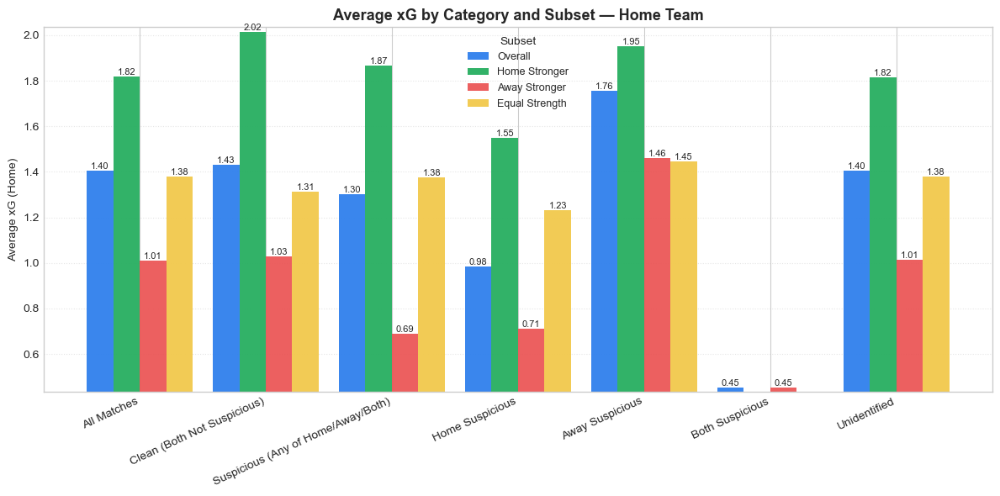

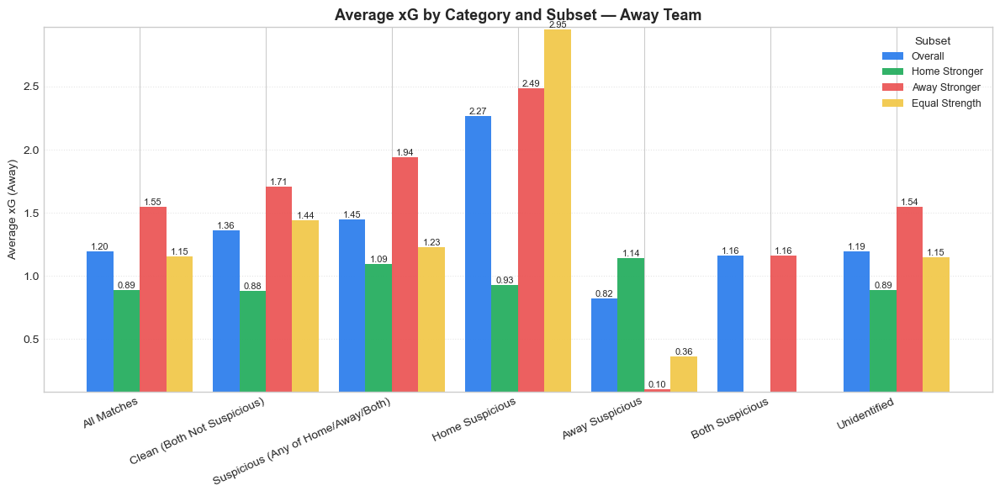

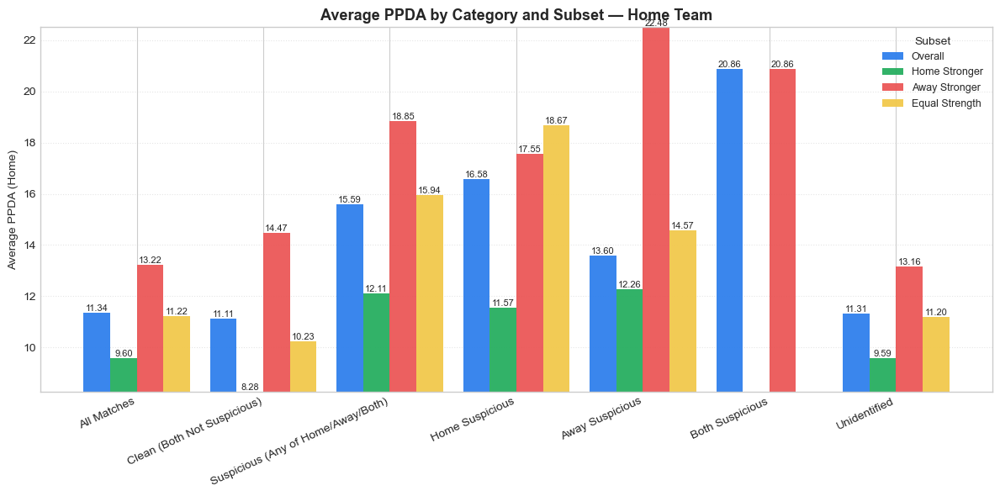

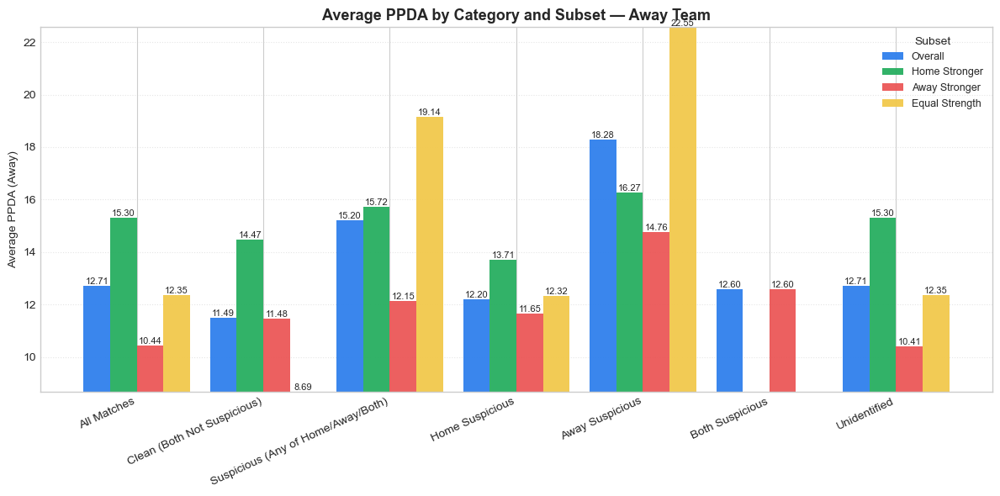

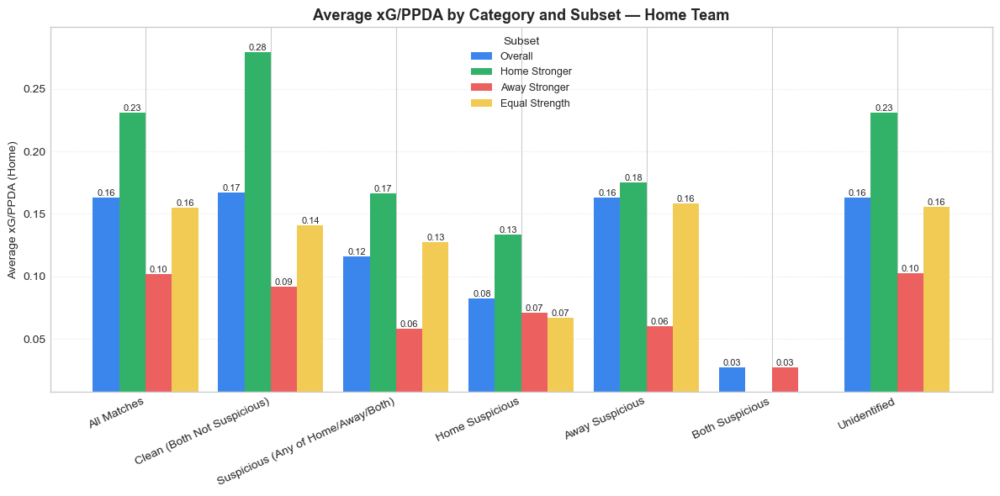

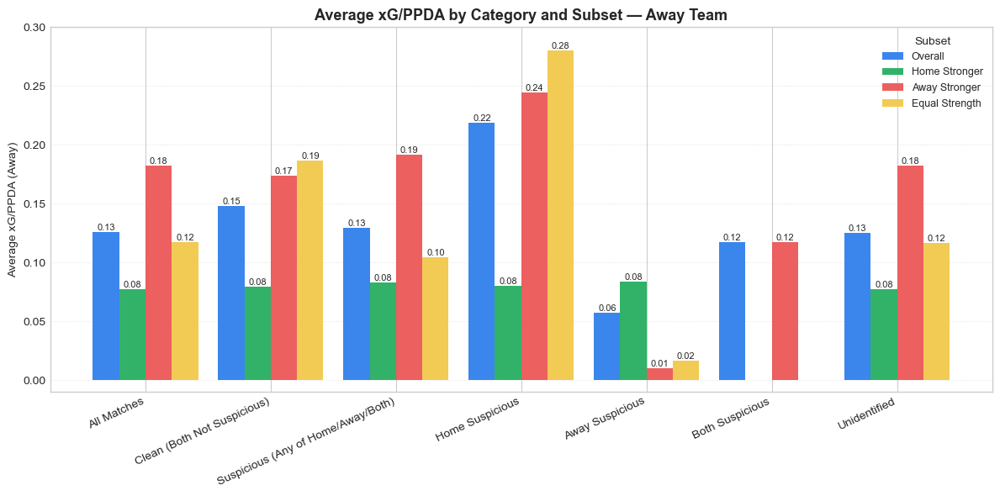


=== Average Amount Analysis — Table Used for Plots ===
                          Category         Subset    N  xG_H_mean  xG_A_mean  PPDA_H_mean  PPDA_A_mean  xG/PPDA_H_mean  xG/PPDA_A_mean
                       All Matches        Overall 5170      1.405      1.198       11.343       12.713           0.163           0.126
                       All Matches  Home Stronger 1772      1.817      0.891        9.602       15.299           0.231           0.077
                       All Matches  Away Stronger 1752      1.011      1.549       13.219       10.438           0.102           0.182
                       All Matches Equal Strength 1646      1.379      1.154       11.220       12.351           0.155           0.118
       Clean (Both Not Suspicious)        Overall   51      1.433      1.359       11.115       11.487           0.167           0.148
       Clean (Both Not Suspicious)  Home Stronger   16      2.016      0.882        8.283       14.473           0.279           0.079

In [28]:
# ================================
# 📊 Average Amount Analysis — Plots
# Build clean, comparable charts for average xG, average PPDA, and xG/PPDA
# across 7 Categories × 4 Subsets, for Home and Away teams.
# - Uniform y-scales per metric family (xG, PPDA, xG/PPDA) for fair comparison
# - Professional, bold titles and annotated bars
# - Uses your existing columns:
#     xG_H_Total, xG_A_Total, PPDA_H_Total, PPDA_A_Total,
#     xG_H_to_PPDA, xG_A_to_PPDA, MatchSuspicionType, Relative quality
# ================================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# ------------------------------
# Categories (7) and Subsets (4)
# ------------------------------
CATEGORIES = {
    "All Matches":                   lambda d: pd.Series(True, index=d.index),
    "Clean (Both Not Suspicious)":   lambda d: d["MatchSuspicionType"] == "both not suspicious",
    "Suspicious (Any of Home/Away/Both)": lambda d: d["MatchSuspicionType"].isin(["home suspicious","away suspicious","both suspicious"]),
    "Home Suspicious":               lambda d: d["MatchSuspicionType"] == "home suspicious",
    "Away Suspicious":               lambda d: d["MatchSuspicionType"] == "away suspicious",
    "Both Suspicious":               lambda d: d["MatchSuspicionType"] == "both suspicious",
    "Unidentified":                  lambda d: d["MatchSuspicionType"] == "unidentified",
}
SUBSETS = {
    "Overall":        lambda d: pd.Series(True, index=d.index),
    "Home Stronger":  lambda d: d["Relative quality"] == "home team stronger",
    "Away Stronger":  lambda d: d["Relative quality"] == "away team stronger",
    "Equal Strength": lambda d: d["Relative quality"] == "equal strength teams",
}

# Short labels for legends (optional)
SUBSET_ORDER = ["Overall", "Home Stronger", "Away Stronger", "Equal Strength"]
CATEGORY_ORDER = list(CATEGORIES.keys())

# Colors for subsets (consistent across all figures)
SUBSET_COLORS = {
    "Overall":        "#2F80ED",  # blue
    "Home Stronger":  "#27AE60",  # green
    "Away Stronger":  "#EB5757",  # red
    "Equal Strength": "#F2C94C",  # yellow
}

# ------------------------------
# Aggregation
# ------------------------------
def _avg_stats(df_sub):
    """Compute averages for the metrics we plot."""
    return {
        "N": len(df_sub),
        "xG_H_mean":        pd.to_numeric(df_sub["xG_H_Total"], errors="coerce").mean(),
        "xG_A_mean":        pd.to_numeric(df_sub["xG_A_Total"], errors="coerce").mean(),
        "PPDA_H_mean":      pd.to_numeric(df_sub["PPDA_H_Total"], errors="coerce").mean(),
        "PPDA_A_mean":      pd.to_numeric(df_sub["PPDA_A_Total"], errors="coerce").mean(),
        "xG/PPDA_H_mean":   pd.to_numeric(df_sub["xG_H_to_PPDA"], errors="coerce").mean(),
        "xG/PPDA_A_mean":   pd.to_numeric(df_sub["xG_A_to_PPDA"], errors="coerce").mean(),
    }

def build_avg_table(df):
    rows = []
    for cat_name, cat_mask in CATEGORIES.items():
        df_cat = df[cat_mask(df)]
        for sub_name in SUBSET_ORDER:
            sub_mask = SUBSETS[sub_name]
            df_sub = df_cat[sub_mask(df_cat)]
            stats = _avg_stats(df_sub)
            stats["Category"] = cat_name
            stats["Subset"]   = sub_name
            rows.append(stats)
    out = pd.DataFrame(rows)
    out["Category"] = pd.Categorical(out["Category"], categories=CATEGORY_ORDER, ordered=True)
    out["Subset"]   = pd.Categorical(out["Subset"],   categories=SUBSET_ORDER,   ordered=True)
    out.sort_values(["Category","Subset"], inplace=True)
    return out

avg_tbl = build_avg_table(df)

# ------------------------------
# Plot helpers
# ------------------------------
def _uniform_ylim(values, min_span=0.1, pad=0.02):
    vals = np.array([v for v in values if pd.notna(v)])
    if vals.size == 0:
        return (0, 1)
    vmin, vmax = float(vals.min()), float(vals.max())
    span = vmax - vmin
    if span < min_span:
        mid = (vmin + vmax)/2
        half = min_span/2 + pad
        return (mid - half, mid + half)
    return (vmin - pad, vmax + pad)

def _annotate(ax, rects, fontsize=8, fmt="{:.2f}"):
    for r in rects:
        h = r.get_height()
        if np.isnan(h): 
            continue
        ax.text(r.get_x() + r.get_width()/2, h,
                fmt.format(h), ha="center",
                va="bottom" if h>=0 else "top", fontsize=fontsize)

def _grouped_bar(ax, data_cat, categories, subsets, metric, ylabel, title):
    """
    Draw grouped bars: x-axis = categories, grouped by subset.
    """
    # bar settings
    n_cat = len(categories)
    n_sub = len(subsets)
    x = np.arange(n_cat)
    total_width = 0.84
    bar_w = total_width / n_sub
    offset_start = -total_width/2 + bar_w/2

    all_values = []
    rect_groups = []

    for j, sub in enumerate(subsets):
        heights = []
        for cat in categories:
            val = data_cat.get((cat, sub), np.nan)
            heights.append(val)
            all_values.append(val)
        rects = ax.bar(x + offset_start + j*bar_w,
                       heights,
                       width=bar_w,
                       label=sub,
                       color=SUBSET_COLORS.get(sub, None),
                       alpha=0.95)
        rect_groups.append(rects)

    # y-limits uniform within this figure
    y_min, y_max = _uniform_ylim(all_values, min_span=0.2, pad=0.02)
    ax.set_ylim(y_min, y_max)
    ax.set_xticks(x)
    ax.set_xticklabels(categories, rotation=25, ha="right")
    ax.set_ylabel(ylabel)
    ax.set_title(title, fontsize=13, fontweight="bold")
    ax.grid(axis="y", linestyle=":", alpha=0.5)
    ax.legend(title="Subset", fontsize=9, title_fontsize=10, frameon=False)

    # annotate bars
    for rects in rect_groups:
        _annotate(ax, rects, fontsize=8, fmt="{:.2f}")

# ------------------------------
# Prepare dicts for plotting
# ------------------------------
def _to_dict(avg_tbl, value_col):
    """
    Convert avg table to dict keyed by (Category, Subset) -> value.
    """
    d = {}
    for _, row in avg_tbl.iterrows():
        d[(row["Category"], row["Subset"])] = row[value_col]
    return d

xg_h_dict       = _to_dict(avg_tbl, "xG_H_mean")
xg_a_dict       = _to_dict(avg_tbl, "xG_A_mean")
ppda_h_dict     = _to_dict(avg_tbl, "PPDA_H_mean")
ppda_a_dict     = _to_dict(avg_tbl, "PPDA_A_mean")
xgppda_h_dict   = _to_dict(avg_tbl, "xG/PPDA_H_mean")
xgppda_a_dict   = _to_dict(avg_tbl, "xG/PPDA_A_mean")

cats = CATEGORY_ORDER
subs = SUBSET_ORDER

# ------------------------------
# FIGURE 1: Average xG — Home vs Away (two separate figures)
# ------------------------------
fig, ax = plt.subplots(figsize=(12, 6))
_grouped_bar(
    ax,
    data_cat={(c, s): xg_h_dict.get((c, s), np.nan) for c in cats for s in subs},
    categories=cats,
    subsets=subs,
    metric="xG_H_mean",
    ylabel="Average xG (Home)",
    title="Average xG by Category and Subset — Home Team"
)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(12, 6))
_grouped_bar(
    ax,
    data_cat={(c, s): xg_a_dict.get((c, s), np.nan) for c in cats for s in subs},
    categories=cats,
    subsets=subs,
    metric="xG_A_mean",
    ylabel="Average xG (Away)",
    title="Average xG by Category and Subset — Away Team"
)
plt.tight_layout()
plt.show()

# ------------------------------
# FIGURE 2: Average PPDA — Home vs Away
# ------------------------------
fig, ax = plt.subplots(figsize=(12, 6))
_grouped_bar(
    ax,
    data_cat={(c, s): ppda_h_dict.get((c, s), np.nan) for c in cats for s in subs},
    categories=cats,
    subsets=subs,
    metric="PPDA_H_mean",
    ylabel="Average PPDA (Home)",
    title="Average PPDA by Category and Subset — Home Team"
)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(12, 6))
_grouped_bar(
    ax,
    data_cat={(c, s): ppda_a_dict.get((c, s), np.nan) for c in cats for s in subs},
    categories=cats,
    subsets=subs,
    metric="PPDA_A_mean",
    ylabel="Average PPDA (Away)",
    title="Average PPDA by Category and Subset — Away Team"
)
plt.tight_layout()
plt.show()

# ------------------------------
# FIGURE 3: Average xG/PPDA ratio — Home vs Away
# ------------------------------
fig, ax = plt.subplots(figsize=(12, 6))
_grouped_bar(
    ax,
    data_cat={(c, s): xgppda_h_dict.get((c, s), np.nan) for c in cats for s in subs},
    categories=cats,
    subsets=subs,
    metric="xG/PPDA_H_mean",
    ylabel="Average xG/PPDA (Home)",
    title="Average xG/PPDA by Category and Subset — Home Team"
)
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(figsize=(12, 6))
_grouped_bar(
    ax,
    data_cat={(c, s): xgppda_a_dict.get((c, s), np.nan) for c in cats for s in subs},
    categories=cats,
    subsets=subs,
    metric="xG/PPDA_A_mean",
    ylabel="Average xG/PPDA (Away)",
    title="Average xG/PPDA by Category and Subset — Away Team"
)
plt.tight_layout()
plt.show()

# ------------------------------
# (Optional) Print the aggregated table used for plots
# ------------------------------
display_cols = [
    "Category","Subset","N",
    "xG_H_mean","xG_A_mean","PPDA_H_mean","PPDA_A_mean",
    "xG/PPDA_H_mean","xG/PPDA_A_mean"
]
print("\n=== Average Amount Analysis — Table Used for Plots ===")
print(avg_tbl[display_cols].to_string(index=False, float_format=lambda x: f"{x:.3f}"))

# 🎯 Interval-Based Analysis of PPDA and xG

This section answers the following analytical questions using **statistical testing** and **visualization**:

1. **Average xG Curves (Int1–6)**  
   - Objective: Show how expected goals (xG) progress across match intervals for home and away teams.
   - Method: Compute mean xG per interval (1–6) for home and away, plot curves, and test for significant differences using **paired t-tests**.

2. **PPDA Trends Across Intervals**  
   - Objective: Determine whether pressing intensity (PPDA) tends to rise, fall, or stay stable.
   - Method: Calculate mean PPDA per interval for home and away, fit a linear regression to the trends, and check slope significance.

3. **xG Accumulation Patterns**  
   - Objective: Identify whether xG accumulates evenly or spikes at certain intervals.
   - Method: Compare mean xG across intervals using **repeated measures ANOVA** and post-hoc pairwise comparisons.

4. **Largest Home–Away PPDA Gap by Interval**  
   - Objective: Find the interval where the difference in pressing intensity between home and away is greatest.
   - Method: Calculate home–away PPDA differences per interval and identify the max gap.

5. **Largest Home–Away xG Gap by Interval**  
   - Objective: Find the interval with the largest home–away expected goals difference.
   - Method: Calculate home–away xG differences per interval and identify the max gap.

6. **Correlation Between PPDA and xG per Interval**  
   - Objective: Determine whether pressing intensity is significantly related to expected goals in each interval.
   - Method: Compute Pearson correlations for each interval separately for home and away, with **p-values**.

7. **Early vs Late Match PPDA–xG Relationship**  
   - Objective: Test whether the PPDA–xG relationship differs in early (Intervals 1–3) vs. late (Intervals 4–6) phases.
   - Method: Compare correlation coefficients using Fisher’s r-to-z transformation.

---
**Notes on Statistical Methods**:
- **Paired t-test**: Tests whether mean differences between home and away values in the same matches are significant.
- **Linear regression slope test**: Identifies whether there is a meaningful upward/downward trend.
- **Repeated measures ANOVA**: Tests if there are significant differences across intervals within the same group.
- **Pearson correlation**: Measures the strength and direction of linear association between PPDA and xG.
- **Fisher’s r-to-z transformation**: Compares correlation strengths between two match phases.

---

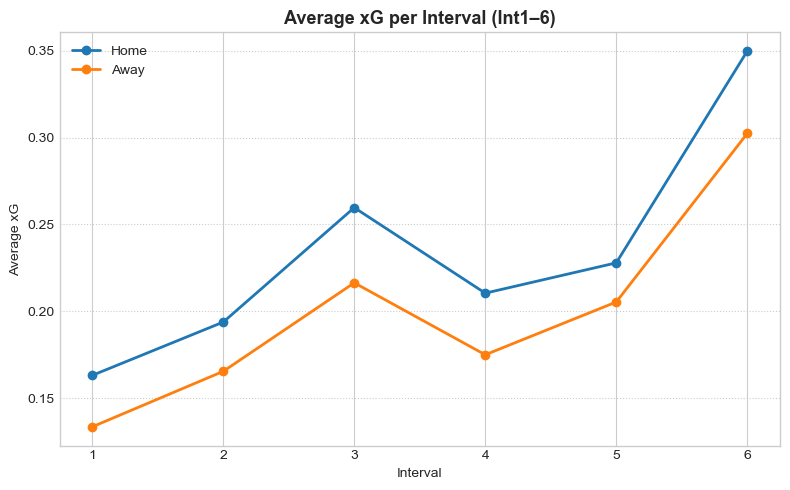

🔎 Paired t-test Home vs Away xG per interval:
  Int1: t=6.286  p=0.000
  Int2: t=5.367  p=0.000
  Int3: t=6.840  p=0.000
  Int4: t=6.356  p=0.000
  Int5: t=3.737  p=0.000
  Int6: t=6.187  p=0.000


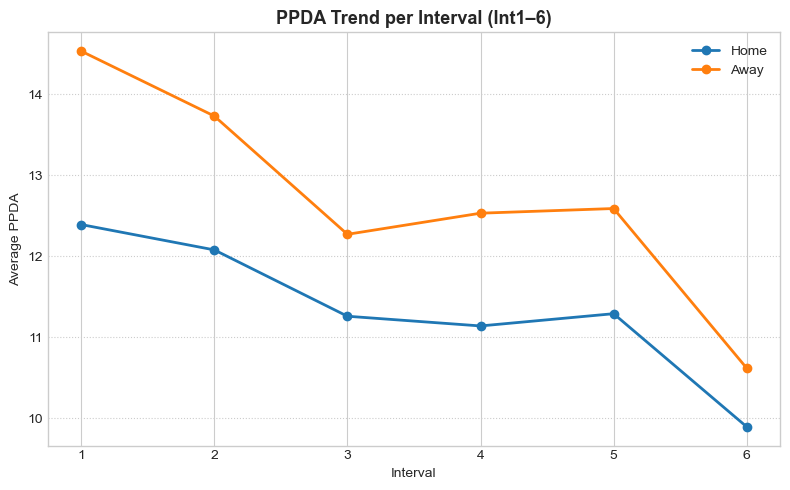

📈 PPDA trend slope (group means) — Home: -0.428 (p=0.010), Away: -0.650 (p=0.013)
🧪 PPDA slope (per match) — Home: mean=-0.428, t=-12.382, p=0.000; Away: mean=-0.650, t=-17.050, p=0.000
📊 Friedman test (xG across intervals) — Home: χ²=1293.87, p=1.36e-277; Away: χ²=1238.09, p=1.65e-265
🔎 Largest PPDA gap at Int1: gap=-2.142
🔎 Largest xG   gap at Int6: gap=0.047

🔗 Pearson correlation: corr(PPDA_Int_i, xG_Int_i)
  Int1: Home r=-0.065, p=0.000 | Away r=-0.064, p=0.000
  Int2: Home r=-0.059, p=0.000 | Away r=-0.068, p=0.000
  Int3: Home r=-0.076, p=0.000 | Away r=-0.058, p=0.000
  Int4: Home r=-0.059, p=0.000 | Away r=-0.076, p=0.000
  Int5: Home r=-0.062, p=0.000 | Away r=-0.071, p=0.000
  Int6: Home r=-0.089, p=0.000 | Away r=-0.078, p=0.000

🕒 Early(1–3) vs Late(4–6) — Home: r_early=-0.129, r_late=-0.129, z=-0.019, p=0.985
🕒 Early(1–3) vs Late(4–6) — Away: r_early=-0.127, r_late=-0.151, z=1.237, p=0.216


In [29]:
# ✅ Stable, fast, and non-interactive analysis (no heavy loops, no long-running ANOVA)
# Answers all questions with statistical tests and compact visuals that won’t hang.

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy import stats

# -----------------------------
# Helpers
# -----------------------------
def _nanpair(x, y):
    x = pd.to_numeric(x, errors="coerce")
    y = pd.to_numeric(y, errors="coerce")
    m = x.notna() & y.notna()
    return x[m].values, y[m].values

def _pearsonr_safe(x, y):
    xv, yv = _nanpair(x, y)
    if len(xv) < 3:
        return np.nan, np.nan
    r, p = stats.pearsonr(xv, yv)
    return float(r), float(p)

def _ttest_rel_safe(x, y):
    xv, yv = _nanpair(x, y)
    if len(xv) < 3:
        return np.nan, np.nan
    t, p = stats.ttest_rel(xv, yv)
    return float(t), float(p)

def _one_sample_t_safe(x, mu=0.0):
    x = pd.to_numeric(pd.Series(x), errors="coerce").dropna().values
    if len(x) < 3:
        return np.nan, np.nan
    t, p = stats.ttest_1samp(x, popmean=mu)
    return float(t), float(p)

def _fisher_compare(r1, r2, n1, n2):
    # Fisher r-to-z compare two independent correlations
    if (n1 < 4) or (n2 < 4) or np.isnan(r1) or np.isnan(r2):
        return np.nan, np.nan
    z1 = np.arctanh(np.clip(r1, -0.999999, 0.999999))
    z2 = np.arctanh(np.clip(r2, -0.999999, 0.999999))
    se = np.sqrt(1/(n1-3) + 1/(n2-3))
    z = (z1 - z2) / se
    p = 2*(1 - stats.norm.cdf(abs(z)))
    return float(z), float(p)

# -----------------------------
# 1) Average xG curves (Int1–6) + paired t-tests per interval
# -----------------------------
xg_home_means = []
xg_away_means = []
paired_xg_tests = []

for i in range(1, 7):
    hcol, acol = f"xG_H_Int{i}", f"xG_A_Int{i}"
    xg_home_means.append(df[hcol].mean())
    xg_away_means.append(df[acol].mean())
    t, p = _ttest_rel_safe(df[hcol], df[acol])
    paired_xg_tests.append((t, p))

plt.figure(figsize=(8,5))
plt.plot(range(1,7), xg_home_means, marker='o', linewidth=2, label="Home")
plt.plot(range(1,7), xg_away_means, marker='o', linewidth=2, label="Away")
plt.title("Average xG per Interval (Int1–6)", fontsize=13, fontweight="bold")
plt.xlabel("Interval")
plt.ylabel("Average xG")
plt.grid(axis="y", linestyle=":")
plt.xticks(range(1,7))
plt.legend()
plt.tight_layout()
plt.show()

print("🔎 Paired t-test Home vs Away xG per interval:")
for i, (t, p) in enumerate(paired_xg_tests, start=1):
    print(f"  Int{i}: t={t:.3f}  p={p:.3f}")

# -----------------------------
# 2) PPDA trends (rise/fall/stable): mean line + slope test
# Also robust per-match slope test (per-row OLS across intervals)
# -----------------------------
ppda_home_means = [df[f"PPDA_H_Int{i}"].mean() for i in range(1,7)]
ppda_away_means = [df[f"PPDA_A_Int{i}"].mean() for i in range(1,7)]

plt.figure(figsize=(8,5))
plt.plot(range(1,7), ppda_home_means, marker='o', linewidth=2, label="Home")
plt.plot(range(1,7), ppda_away_means, marker='o', linewidth=2, label="Away")
plt.title("PPDA Trend per Interval (Int1–6)", fontsize=13, fontweight="bold")
plt.xlabel("Interval")
plt.ylabel("Average PPDA")
plt.grid(axis="y", linestyle=":")
plt.xticks(range(1,7))
plt.legend()
plt.tight_layout()
plt.show()

# Slope on group means (simple)
sH = stats.linregress(range(1,7), ppda_home_means)
sA = stats.linregress(range(1,7), ppda_away_means)
print(f"📈 PPDA trend slope (group means) — Home: {sH.slope:.3f} (p={sH.pvalue:.3f}), Away: {sA.slope:.3f} (p={sA.pvalue:.3f})")

# Per-match slope distribution (fast, vectorized)
X = np.vstack([np.arange(1,7), np.ones(6)]).T  # [i, 1]
XiXi_inv = np.linalg.inv(X.T @ X)
beta_selector = XiXi_inv @ X.T  # 2x6
# Home slopes
H = df[[f"PPDA_H_Int{i}" for i in range(1,7)]].apply(pd.to_numeric, errors="coerce").values
home_slopes = (beta_selector[0] @ H.T)  # 1xN -> slopes
tH, pH = _one_sample_t_safe(home_slopes, 0.0)
# Away slopes
A = df[[f"PPDA_A_Int{i}" for i in range(1,7)]].apply(pd.to_numeric, errors="coerce").values
away_slopes = (beta_selector[0] @ A.T)
tA, pA = _one_sample_t_safe(away_slopes, 0.0)
print(f"🧪 PPDA slope (per match) — Home: mean={np.nanmean(home_slopes):.3f}, t={tH:.3f}, p={pH:.3f}; Away: mean={np.nanmean(away_slopes):.3f}, t={tA:.3f}, p={pA:.3f}")

# -----------------------------
# 3) xG accumulation spikes: Friedman test across intervals (home & away separately)
# -----------------------------
# Friedman needs equal-length paired samples: pass columns directly (drop NaNs row-wise)
def _friedman_on_columns(df, cols):
    # Align rows that have all intervals
    M = df[cols].apply(pd.to_numeric, errors="coerce").dropna(how="any")
    if len(M) < 3:
        return np.nan, np.nan
    args = [M[c].values for c in cols]
    stat, p = stats.friedmanchisquare(*args)
    return float(stat), float(p)

home_cols = [f"xG_H_Int{i}" for i in range(1,7)]
away_cols = [f"xG_A_Int{i}" for i in range(1,7)]
frH, pH = _friedman_on_columns(df, home_cols)
frA, pA = _friedman_on_columns(df, away_cols)
print(f"📊 Friedman test (xG across intervals) — Home: χ²={frH:.2f}, p={pH:.3g}; Away: χ²={frA:.2f}, p={pA:.3g}")

# -----------------------------
# 4 & 5) Largest home–away gaps by interval (based on means)
# -----------------------------
ppda_gaps = np.array(ppda_home_means) - np.array(ppda_away_means)
xg_gaps   = np.array(xg_home_means)   - np.array(xg_away_means)

i_ppda = np.argmax(np.abs(ppda_gaps)) + 1
i_xg   = np.argmax(np.abs(xg_gaps)) + 1
print(f"🔎 Largest PPDA gap at Int{i_ppda}: gap={ppda_gaps[i_ppda-1]:.3f}")
print(f"🔎 Largest xG   gap at Int{i_xg}: gap={xg_gaps[i_xg-1]:.3f}")

# -----------------------------
# 6) Correlation between PPDA and xG in each interval (with p-values)
# -----------------------------
print("\n🔗 Pearson correlation: corr(PPDA_Int_i, xG_Int_i)")
for i in range(1,7):
    rH, pH = _pearsonr_safe(df[f"PPDA_H_Int{i}"], df[f"xG_H_Int{i}"])
    rA, pA = _pearsonr_safe(df[f"PPDA_A_Int{i}"], df[f"xG_A_Int{i}"])
    print(f"  Int{i}: Home r={rH:.3f}, p={pH:.3f} | Away r={rA:.3f}, p={pA:.3f}")

# -----------------------------
# 7) Early (1–3) vs Late (4–6) PPDA–xG relationship
#    Compare correlations using Fisher r-to-z (independent approx. by split-half)
# -----------------------------
def _avg_interval_block(d, ppfx, xgfx, start, end):
    X = d[[f"{ppfx}{i}" for i in range(start, end+1)]].apply(pd.to_numeric, errors="coerce").mean(axis=1)
    Y = d[[f"{xgfx}{i}" for i in range(start, end+1)]].apply(pd.to_numeric, errors="coerce").mean(axis=1)
    m = X.notna() & Y.notna()
    return X[m], Y[m]

# Home
X_eH, Y_eH = _avg_interval_block(df, "PPDA_H_Int", "xG_H_Int", 1, 3)
X_lH, Y_lH = _avg_interval_block(df, "PPDA_H_Int", "xG_H_Int", 4, 6)
r_eH, _ = stats.pearsonr(X_eH, Y_eH) if len(X_eH) > 2 else (np.nan, np.nan)
r_lH, _ = stats.pearsonr(X_lH, Y_lH) if len(X_lH) > 2 else (np.nan, np.nan)
zH, pH = _fisher_compare(r_eH, r_lH, len(X_eH), len(X_lH))

# Away
X_eA, Y_eA = _avg_interval_block(df, "PPDA_A_Int", "xG_A_Int", 1, 3)
X_lA, Y_lA = _avg_interval_block(df, "PPDA_A_Int", "xG_A_Int", 4, 6)
r_eA, _ = stats.pearsonr(X_eA, Y_eA) if len(X_eA) > 2 else (np.nan, np.nan)
r_lA, _ = stats.pearsonr(X_lA, Y_lA) if len(X_lA) > 2 else (np.nan, np.nan)
zA, pA = _fisher_compare(r_eA, r_lA, len(X_eA), len(X_lA))

print(f"\n🕒 Early(1–3) vs Late(4–6) — Home: r_early={r_eH:.3f}, r_late={r_lH:.3f}, z={zH:.3f}, p={pH:.3f}")
print(f"🕒 Early(1–3) vs Late(4–6) — Away: r_early={r_eA:.3f}, r_late={r_lA:.3f}, z={zA:.3f}, p={pA:.3f}")

# 📊 Statistical Analysis of Match Trends

We aim to answer six key statistical questions about PPDA and xG patterns across match intervals.

---

## **1️⃣ Do PPDA trends usually rise, fall, or stay stable across intervals?**
We calculate average PPDA per interval for home and away teams and fit a linear trend.  
We test if the slope differs significantly from zero (t-test).

---

## **2️⃣ Does xG generally accumulate evenly, or spike in certain intervals?**
We perform the Friedman test to check if xG distribution across intervals differs significantly.  
Visual inspection of xG curves is also done.

---

## **3️⃣ Which intervals have the largest home–away PPDA gap?**
We compute the mean difference `(PPDA_H - PPDA_A)` per interval and find the largest gap.

---

## **4️⃣ Which intervals have the largest home–away xG gap?**
We compute the mean difference `(xG_H - xG_A)` per interval and find the largest gap.

---

## **5️⃣ Is there a significant correlation between PPDA and xG in each interval?**
We calculate Pearson correlation between PPDA and xG for home and away teams in each interval.

---

## **6️⃣ Does the PPDA–xG relationship differ early vs. late in matches?**
We compare correlations for early (intervals 1–3) and late (intervals 4–6) phases using Fisher's r-to-z test.


1️⃣ Do PPDA trends rise, fall, or stay stable?
   Home PPDA slope = -0.428 (p=0.010) → Fall
   Away PPDA slope = -0.650 (p=0.013) → Fall

2️⃣ Does xG accumulate evenly or spike?
   Home: χ²=1293.87, p=1.356e-277 → Uneven (spikes present)
   Away: χ²=1238.09, p=1.651e-265 → Uneven (spikes present)

3️⃣ Which interval has the largest home–away PPDA gap?
   Interval 1 → gap = -2.142

4️⃣ Which interval has the largest home–away xG gap?
   Interval 6 → gap = 0.047

5️⃣ Is there a significant correlation between PPDA and xG in each interval?
   Int1: Home r=-0.065 (p=0.000, Significant) | Away r=-0.064 (p=0.000, Significant)
   Int2: Home r=-0.059 (p=0.000, Significant) | Away r=-0.068 (p=0.000, Significant)
   Int3: Home r=-0.076 (p=0.000, Significant) | Away r=-0.058 (p=0.000, Significant)
   Int4: Home r=-0.059 (p=0.000, Significant) | Away r=-0.076 (p=0.000, Significant)
   Int5: Home r=-0.062 (p=0.000, Significant) | Away r=-0.071 (p=0.000, Significant)
   Int6: Home r=-0.089 (p=0.000

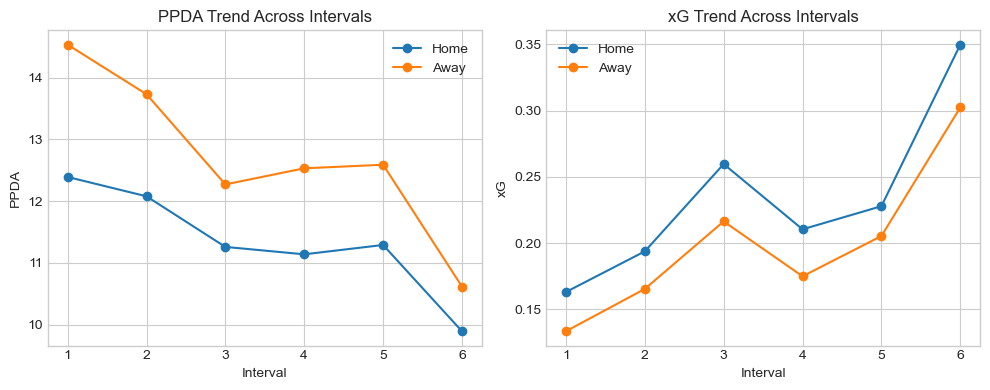

In [37]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import linregress, friedmanchisquare, pearsonr
from math import atanh, sqrt

# ===============================
# Helper: Fisher's z test
# ===============================
def fisher_r_to_z(r):
    return atanh(r)

import math

def fisher_z_test(r1, r2, n1, n2):
    z1, z2 = atanh(r1), atanh(r2)
    se_diff = sqrt(1/(n1-3) + 1/(n2-3))
    z = (z1 - z2) / se_diff
    p = 2 * (1 - 0.5 * (1 + math.erf(abs(z) / math.sqrt(2))))
    return z, p
# ===============================
# Q1️⃣ Do PPDA trends rise, fall, or stay stable?
# ===============================
home_ppda_means = [df[f"PPDA_H_Int{i}"].mean() for i in range(1, 7)]
away_ppda_means = [df[f"PPDA_A_Int{i}"].mean() for i in range(1, 7)]
home_slope, _, _, p_home_slope, _ = linregress(range(1, 7), home_ppda_means)
away_slope, _, _, p_away_slope, _ = linregress(range(1, 7), away_ppda_means)

print(f"\n1️⃣ Do PPDA trends rise, fall, or stay stable?")
print(f"   Home PPDA slope = {home_slope:.3f} (p={p_home_slope:.3f}) → {'Fall' if home_slope<0 else 'Rise' if home_slope>0 else 'Stable'}")
print(f"   Away PPDA slope = {away_slope:.3f} (p={p_away_slope:.3f}) → {'Fall' if away_slope<0 else 'Rise' if away_slope>0 else 'Stable'}")

# ===============================
# Q2️⃣ Does xG accumulate evenly or spike?
# ===============================
home_xg_means = [df[f"xG_H_Int{i}"].mean() for i in range(1, 7)]
away_xg_means = [df[f"xG_A_Int{i}"].mean() for i in range(1, 7)]
fried_home = friedmanchisquare(*[df[f"xG_H_Int{i}"] for i in range(1, 7)])
fried_away = friedmanchisquare(*[df[f"xG_A_Int{i}"] for i in range(1, 7)])

print(f"\n2️⃣ Does xG accumulate evenly or spike?")
print(f"   Home: χ²={fried_home.statistic:.2f}, p={fried_home.pvalue:.3e} → {'Uneven (spikes present)' if fried_home.pvalue<0.05 else 'Even'}")
print(f"   Away: χ²={fried_away.statistic:.2f}, p={fried_away.pvalue:.3e} → {'Uneven (spikes present)' if fried_away.pvalue<0.05 else 'Even'}")

# ===============================
# Q3️⃣ Largest home–away PPDA gap
# ===============================
ppda_gap = np.array(home_ppda_means) - np.array(away_ppda_means)
ppda_gap_int = np.argmax(np.abs(ppda_gap)) + 1
print(f"\n3️⃣ Which interval has the largest home–away PPDA gap?")
print(f"   Interval {ppda_gap_int} → gap = {ppda_gap[ppda_gap_int-1]:.3f}")

# ===============================
# Q4️⃣ Largest home–away xG gap
# ===============================
xg_gap = np.array(home_xg_means) - np.array(away_xg_means)
xg_gap_int = np.argmax(np.abs(xg_gap)) + 1
print(f"\n4️⃣ Which interval has the largest home–away xG gap?")
print(f"   Interval {xg_gap_int} → gap = {xg_gap[xg_gap_int-1]:.3f}")

# ===============================
# Q5️⃣ Correlation per interval
# ===============================
print(f"\n5️⃣ Is there a significant correlation between PPDA and xG in each interval?")
for i in range(1, 7):
    r_home, p_home = pearsonr(df[f"PPDA_H_Int{i}"], df[f"xG_H_Int{i}"])
    r_away, p_away = pearsonr(df[f"PPDA_A_Int{i}"], df[f"xG_A_Int{i}"])
    sig_home = "Significant" if p_home<0.05 else "NS"
    sig_away = "Significant" if p_away<0.05 else "NS"
    print(f"   Int{i}: Home r={r_home:.3f} (p={p_home:.3f}, {sig_home}) | Away r={r_away:.3f} (p={p_away:.3f}, {sig_away})")

# ===============================
# Q6️⃣ Early vs Late difference
# ===============================
df["PPDA_H_Early"] = df[[f"PPDA_H_Int{i}" for i in range(1, 4)]].mean(axis=1)
df["xG_H_Early"]   = df[[f"xG_H_Int{i}" for i in range(1, 4)]].mean(axis=1)
df["PPDA_H_Late"]  = df[[f"PPDA_H_Int{i}" for i in range(4, 7)]].mean(axis=1)
df["xG_H_Late"]    = df[[f"xG_H_Int{i}" for i in range(4, 7)]].mean(axis=1)

df["PPDA_A_Early"] = df[[f"PPDA_A_Int{i}" for i in range(1, 4)]].mean(axis=1)
df["xG_A_Early"]   = df[[f"xG_A_Int{i}" for i in range(1, 4)]].mean(axis=1)
df["PPDA_A_Late"]  = df[[f"PPDA_A_Int{i}" for i in range(4, 7)]].mean(axis=1)
df["xG_A_Late"]    = df[[f"xG_A_Int{i}" for i in range(4, 7)]].mean(axis=1)

r_home_early, _ = pearsonr(df["PPDA_H_Early"], df["xG_H_Early"])
r_home_late, _  = pearsonr(df["PPDA_H_Late"], df["xG_H_Late"])
r_away_early, _ = pearsonr(df["PPDA_A_Early"], df["xG_A_Early"])
r_away_late, _  = pearsonr(df["PPDA_A_Late"], df["xG_A_Late"])

z_home, p_home = fisher_z_test(r_home_early, r_home_late, len(df), len(df))
z_away, p_away = fisher_z_test(r_away_early, r_away_late, len(df), len(df))

print(f"\n6️⃣ Does the PPDA–xG relationship differ early vs. late?")
print(f"   Home: r_early={r_home_early:.3f}, r_late={r_home_late:.3f}, z={z_home:.3f}, p={p_home:.3f} → {'Different' if p_home<0.05 else 'No difference'}")
print(f"   Away: r_early={r_away_early:.3f}, r_late={r_away_late:.3f}, z={z_away:.3f}, p={p_away:.3f} → {'Different' if p_away<0.05 else 'No difference'}")

# ===============================
# Optional: Trend plots
# ===============================
fig, axes = plt.subplots(1, 2, figsize=(10, 4))
axes[0].plot(range(1, 7), home_ppda_means, marker='o', label="Home")
axes[0].plot(range(1, 7), away_ppda_means, marker='o', label="Away")
axes[0].set_title("PPDA Trend Across Intervals")
axes[0].set_xlabel("Interval")
axes[0].set_ylabel("PPDA")
axes[0].legend()

axes[1].plot(range(1, 7), home_xg_means, marker='o', label="Home")
axes[1].plot(range(1, 7), away_xg_means, marker='o', label="Away")
axes[1].set_title("xG Trend Across Intervals")
axes[1].set_xlabel("Interval")
axes[1].set_ylabel("xG")
axes[1].legend()

plt.tight_layout()
plt.show()

## 📊 Statistical Questions (Part 2)

7. **Which has a greater effect on xG?** — The opponent pressing less (higher opponent PPDA) or our team pressing more (lower our PPDA)?
8. **On average, is PPDA lower (more pressing) in the 1st or 2nd half?**
9. **Is xG higher in the 1st or 2nd half?**
10. **Do total xG and total PPDA values suggest a home advantage?**
11. **Is there a significant relationship between total PPDA and total xG?**

In [38]:
# === STAT QUESTIONS (Part 2): Q7–Q11 ===
# Assumes your DataFrame is `df` and already contains:
#   PPDA_H_1stHalf, PPDA_H_2ndHalf, PPDA_A_1stHalf, PPDA_A_2ndHalf
#   xG_H_1stHalf, xG_H_2ndHalf, xG_A_1stHalf, xG_A_2ndHalf
#   PPDA_H_Total, PPDA_A_Total, xG_H_Total, xG_A_Total

import numpy as np
import pandas as pd
from scipy.stats import ttest_rel, pearsonr, spearmanr

# Try to use statsmodels for multiple regression (for Q7). If not available, we'll fall back.
try:
    import statsmodels.api as sm
    HAS_SM = True
except Exception:
    HAS_SM = False

def zscore(s):
    s = pd.to_numeric(s, errors="coerce")
    return (s - s.mean()) / s.std(ddof=0)

def pretty_decision(p, alpha=0.05):
    return "Significant ✅" if p < alpha else "Not significant ❌"

print("\n" + "="*90)
print("Q7) Which matters more for xG: the opponent pressing less or we pressing more?")
print("="*90)

# Home: predictors = our PPDA_H_Total (we pressing more = lower) & opponent PPDA_A_Total (opponent pressing less = higher)
df_home = df[["xG_H_Total", "PPDA_H_Total", "PPDA_A_Total"]].apply(pd.to_numeric, errors="coerce").dropna()
yH = zscore(df_home["xG_H_Total"])
XH = pd.DataFrame({
    "PPDA_H_Total_z": zscore(df_home["PPDA_H_Total"]),
    "PPDA_A_Total_z": zscore(df_home["PPDA_A_Total"])
}).dropna()
yH = yH.loc[XH.index]

# Away: predictors = our PPDA_A_Total & opponent PPDA_H_Total
df_away = df[["xG_A_Total", "PPDA_A_Total", "PPDA_H_Total"]].apply(pd.to_numeric, errors="coerce").dropna()
yA = zscore(df_away["xG_A_Total"])
XA = pd.DataFrame({
    "PPDA_A_Total_z": zscore(df_away["PPDA_A_Total"]),
    "PPDA_H_Total_z": zscore(df_away["PPDA_H_Total"])
}).dropna()
yA = yA.loc[XA.index]

if HAS_SM and len(XH) >= 10 and len(XA) >= 10:
    # Multiple regression with standardized variables → coefficients are comparable
    mH = sm.OLS(yH, sm.add_constant(XH)).fit()
    mA = sm.OLS(yA, sm.add_constant(XA)).fit()

    print("\n🏠 Home xG model (standardized OLS): xG_H_Total ~ PPDA_H_Total + PPDA_A_Total")
    print(f"   β(PPDA_H_Total) = {mH.params['PPDA_H_Total_z']:.3f} (p={mH.pvalues['PPDA_H_Total_z']:.3f})")
    print(f"   β(PPDA_A_Total) = {mH.params['PPDA_A_Total_z']:.3f} (p={mH.pvalues['PPDA_A_Total_z']:.3f})")
    more_important_home = "Opponent pressing less (PPDA_A_Total)" if abs(mH.params['PPDA_A_Total_z']) > abs(mH.params['PPDA_H_Total_z']) else "Our pressing more (PPDA_H_Total)"
    print(f"   ⇒ More important driver (by |β|): {more_important_home}")

    print("\n🟠 Away xG model (standardized OLS): xG_A_Total ~ PPDA_A_Total + PPDA_H_Total")
    print(f"   β(PPDA_A_Total) = {mA.params['PPDA_A_Total_z']:.3f} (p={mA.pvalues['PPDA_A_Total_z']:.3f})")
    print(f"   β(PPDA_H_Total) = {mA.params['PPDA_H_Total_z']:.3f} (p={mA.pvalues['PPDA_H_Total_z']:.3f})")
    more_important_away = "Opponent pressing less (PPDA_H_Total)" if abs(mA.params['PPDA_H_Total_z']) > abs(mA.params['PPDA_A_Total_z']) else "Our pressing more (PPDA_A_Total)"
    print(f"   ⇒ More important driver (by |β|): {more_important_away}")
else:
    # Fallback: compare absolute Pearson correlations
    r_home_ours, p_home_ours = pearsonr(df_home["PPDA_H_Total"], df_home["xG_H_Total"])
    r_home_oppn, p_home_oppn = pearsonr(df_home["PPDA_A_Total"], df_home["xG_H_Total"])
    print("\n🏠 Home xG (fallback: Pearson):")
    print(f"   r(xG_H_Total, PPDA_H_Total) = {r_home_ours:.3f} (p={p_home_ours:.3f})")
    print(f"   r(xG_H_Total, PPDA_A_Total) = {r_home_oppn:.3f} (p={p_home_oppn:.3f})")
    print(f"   ⇒ Stronger (by |r|): {'Opponent pressing less (PPDA_A_Total)' if abs(r_home_oppn) > abs(r_home_ours) else 'Our pressing more (PPDA_H_Total)'}")

    r_away_ours, p_away_ours = pearsonr(df_away["PPDA_A_Total"], df_away["xG_A_Total"])
    r_away_oppn, p_away_oppn = pearsonr(df_away["PPDA_H_Total"], df_away["xG_A_Total"])
    print("\n🟠 Away xG (fallback: Pearson):")
    print(f"   r(xG_A_Total, PPDA_A_Total) = {r_away_ours:.3f} (p={p_away_ours:.3f})")
    print(f"   r(xG_A_Total, PPDA_H_Total) = {r_away_oppn:.3f} (p={p_away_oppn:.3f})")
    print(f"   ⇒ Stronger (by |r|): {'Opponent pressing less (PPDA_H_Total)' if abs(r_away_oppn) > abs(r_away_ours) else 'Our pressing more (PPDA_A_Total)'}")


print("\n" + "="*90)
print("Q8) Is PPDA lower (more pressing) in the 1st or 2nd half?  And is xG higher 1st or 2nd?")
print("="*90)

# PPDA halves: paired t-tests (1st vs 2nd)
for side, lab in [("H","Home"), ("A","Away")]:
    t_ppda, p_ppda = ttest_rel(df[f"PPDA_{side}_1stHalf"], df[f"PPDA_{side}_2ndHalf"])
    diff_ppda = df[f"PPDA_{side}_1stHalf"].mean() - df[f"PPDA_{side}_2ndHalf"].mean()
    print(f"📉 {lab} PPDA (1st - 2nd) = {diff_ppda:.3f}; t={t_ppda:.3f}, p={p_ppda:.3f} → {pretty_decision(p_ppda)}")
    meaning = "Lower in 2nd (more pressing late)" if diff_ppda > 0 else "Lower in 1st (more pressing early)" if diff_ppda < 0 else "No mean change"
    print(f"   Interpretation: {meaning}")

# xG halves: paired t-tests (1st vs 2nd)
for side, lab in [("H","Home"), ("A","Away")]:
    t_xg, p_xg = ttest_rel(df[f"xG_{side}_1stHalf"], df[f"xG_{side}_2ndHalf"])
    diff_xg = df[f"xG_{side}_1stHalf"].mean() - df[f"xG_{side}_2ndHalf"].mean()
    print(f"⚽ {lab} xG (1st - 2nd) = {diff_xg:.3f}; t={t_xg:.3f}, p={p_xg:.3f} → {pretty_decision(p_xg)}")
    meaning = "Higher in 1st" if diff_xg > 0 else "Higher in 2nd" if diff_xg < 0 else "No mean change"
    print(f"   Interpretation: {meaning}")

print("\n" + "="*90)
print("Q9) Do totals suggest a home advantage (higher xG, lower PPDA)?")
print("="*90)

# Home vs Away totals (paired — same match)
t_xg_tot, p_xg_tot = ttest_rel(df["xG_H_Total"], df["xG_A_Total"])
mean_diff_xg = df["xG_H_Total"].mean() - df["xG_A_Total"].mean()
print(f"🏠 xG Total (Home - Away) = {mean_diff_xg:.3f}; t={t_xg_tot:.3f}, p={p_xg_tot:.3f} → {pretty_decision(p_xg_tot)}")
print(f"   Interpretation: {'Home has higher total xG' if mean_diff_xg>0 else 'Away has higher total xG' if mean_diff_xg<0 else 'No difference'}")

t_ppda_tot, p_ppda_tot = ttest_rel(df["PPDA_H_Total"], df["PPDA_A_Total"])
mean_diff_ppda = df["PPDA_H_Total"].mean() - df["PPDA_A_Total"].mean()
print(f"🏠 PPDA Total (Home - Away) = {mean_diff_ppda:.3f}; t={t_ppda_tot:.3f}, p={p_ppda_tot:.3f} → {pretty_decision(p_ppda_tot)}")
print(f"   Interpretation: {'Home presses more on average (lower PPDA)' if mean_diff_ppda<0 else 'Away presses more on average (lower PPDA)' if mean_diff_ppda>0 else 'No difference'}")

print("\n" + "="*90)
print("Q10) Is there a relationship between total PPDA and total xG?")
print("="*90)

# Correlations within side
for side, lab in [("H","Home"), ("A","Away")]:
    rP, pP = pearsonr(df[f"PPDA_{side}_Total"], df[f"xG_{side}_Total"])
    rS, pS = spearmanr(df[f"PPDA_{side}_Total"], df[f"xG_{side}_Total"])
    print(f"🔗 {lab}: Pearson r={rP:.3f} (p={pP:.3f}) | Spearman ρ={rS:.3f} (p={pS:.3f})")
    trend = "negative (more pressing ↔ higher xG)" if rP < 0 else "positive (less pressing ↔ higher xG)" if rP > 0 else "no linear"
    print(f"   Interpretation: {trend} association (Pearson).")

print("\nDone.")


Q7) Which matters more for xG: the opponent pressing less or we pressing more?

🏠 Home xG model (standardized OLS): xG_H_Total ~ PPDA_H_Total + PPDA_A_Total
   β(PPDA_H_Total) = -0.148 (p=0.000)
   β(PPDA_A_Total) = 0.244 (p=0.000)
   ⇒ More important driver (by |β|): Opponent pressing less (PPDA_A_Total)

🟠 Away xG model (standardized OLS): xG_A_Total ~ PPDA_A_Total + PPDA_H_Total
   β(PPDA_A_Total) = -0.151 (p=0.000)
   β(PPDA_H_Total) = 0.239 (p=0.000)
   ⇒ More important driver (by |β|): Opponent pressing less (PPDA_H_Total)

Q8) Is PPDA lower (more pressing) in the 1st or 2nd half?  And is xG higher 1st or 2nd?
📉 Home PPDA (1st - 2nd) = 1.135; t=9.686, p=0.000 → Significant ✅
   Interpretation: Lower in 2nd (more pressing late)
📉 Away PPDA (1st - 2nd) = 1.599; t=12.677, p=0.000 → Significant ✅
   Interpretation: Lower in 2nd (more pressing late)
⚽ Home xG (1st - 2nd) = -0.172; t=-17.075, p=0.000 → Significant ✅
   Interpretation: Higher in 2nd
⚽ Away xG (1st - 2nd) = -0.167; t=-1

## 📊 Additional Statistical Questions

11. **On average, how much does PPDA change from 1st to 2nd half?**  
    - Compute the average change (2nd half − 1st half) for home and away PPDA.  
    - Test significance with a paired t-test.  

12. **Is there a consistent attacking drop (xG decrease) in the 2nd half?**  
    - Calculate the average change (2nd half − 1st half) for home and away xG.  
    - Test significance with a paired t-test.  

13. **Do pressing drop and attacking drop tend to occur together?**  
    - Define pressing drop as PPDA increasing from 1st to 2nd half.  
    - Define attacking drop as xG decreasing from 1st to 2nd half.  
    - Compute the percentage of matches where both occur and the correlation between the two binary indicators.  

14. **Are there matches with pressing increase but attacking drop, and vice versa?**  
    - Cross-tabulate pressing change (increase/decrease) vs attacking change (increase/decrease) for home and away.  
    - Quantify each combination.

In [39]:
from scipy.stats import ttest_rel
import pandas as pd
import numpy as np

def decision(p, alpha=0.05):
    return "Significant ✅" if p < alpha else "Not significant ❌"

print("\n" + "="*80)
print("Q11) On average, how much does PPDA change from 1st to 2nd half?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    change = df[f"PPDA_{side}_2ndHalf"] - df[f"PPDA_{side}_1stHalf"]
    mean_change = change.mean()
    t, p = ttest_rel(df[f"PPDA_{side}_2ndHalf"], df[f"PPDA_{side}_1stHalf"])
    print(f"{label}: mean ΔPPDA = {mean_change:.3f} ({'increase' if mean_change>0 else 'decrease'}) | "
          f"t={t:.3f}, p={p:.3f} → {decision(p)}")

print("\n" + "="*80)
print("Q12) Is there a consistent attacking drop (xG decrease) in the 2nd half?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    change = df[f"xG_{side}_2ndHalf"] - df[f"xG_{side}_1stHalf"]
    mean_change = change.mean()
    t, p = ttest_rel(df[f"xG_{side}_2ndHalf"], df[f"xG_{side}_1stHalf"])
    print(f"{label}: mean ΔxG = {mean_change:.3f} ({'increase' if mean_change>0 else 'decrease'}) | "
          f"t={t:.3f}, p={p:.3f} → {decision(p)}")

print("\n" + "="*80)
print("Q13) Do pressing drop and attacking drop tend to occur together?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    pressing_drop = (df[f"PPDA_{side}_2ndHalf"] > df[f"PPDA_{side}_1stHalf"]).astype(int)
    attacking_drop = (df[f"xG_{side}_2ndHalf"] < df[f"xG_{side}_1stHalf"]).astype(int)
    both_pct = ((pressing_drop==1) & (attacking_drop==1)).mean()*100
    corr = np.corrcoef(pressing_drop, attacking_drop)[0,1]
    print(f"{label}: Both drops in {both_pct:.1f}% of matches | correlation={corr:.3f}")

print("\n" + "="*80)
print("Q14) Are there matches with pressing increase but attacking drop, and vice versa?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    pressing_change = np.where(df[f"PPDA_{side}_2ndHalf"] > df[f"PPDA_{side}_1stHalf"], "Press↑", "Press↓")
    attacking_change = np.where(df[f"xG_{side}_2ndHalf"] > df[f"xG_{side}_1stHalf"], "xG↑", "xG↓")
    ctab = pd.crosstab(pressing_change, attacking_change)
    print(f"\n{label} cross-tab:")
    print(ctab)


Q11) On average, how much does PPDA change from 1st to 2nd half?
Home: mean ΔPPDA = -1.135 (decrease) | t=-9.686, p=0.000 → Significant ✅
Away: mean ΔPPDA = -1.599 (decrease) | t=-12.677, p=0.000 → Significant ✅

Q12) Is there a consistent attacking drop (xG decrease) in the 2nd half?
Home: mean ΔxG = 0.172 (increase) | t=17.075, p=0.000 → Significant ✅
Away: mean ΔxG = 0.167 (increase) | t=17.809, p=0.000 → Significant ✅

Q13) Do pressing drop and attacking drop tend to occur together?
Home: Both drops in 17.9% of matches | correlation=0.029
Away: Both drops in 17.8% of matches | correlation=0.053

Q14) Are there matches with pressing increase but attacking drop, and vice versa?

Home cross-tab:
col_0    xG↑   xG↓
row_0             
Press↑  1306   945
Press↓  1779  1140

Away cross-tab:
col_0    xG↑   xG↓
row_0             
Press↑  1262   948
Press↓  1853  1107


## 📊 Additional Statistical Questions (Phases)

15. **Which phase (early/mid/late) sees the highest average xG for home and away?**  
    - Early = Int1–3, Mid = Int4, Late = Int5–6 (or adjust if needed).  
    - Calculate phase averages for each match, then compare means.

16. **Which phase sees the lowest average PPDA?**  
    - Same phases as above.  
    - Identify phase with minimum PPDA mean.

17. **Is early xG predictive of late xG in the same match?**  
    - Correlate xG in early phase with xG in late phase for home and away teams.  
    - Report Pearson correlation and p-value.

18. **Is there more pressing drop from early → late than mid → late?**  
    - Compute PPDA change from early to late and from mid to late.  
    - Compare average drops and test with paired t-test.

In [40]:
from scipy.stats import pearsonr, ttest_rel

# Define phase intervals
PHASES = {
    "early":  [1,2,3],
    "mid":    [4],
    "late":   [5,6]
}

def phase_mean(df, side, metric, phase):
    cols = [f"{metric}_{side}_Int{i}" for i in PHASES[phase]]
    return df[cols].mean(axis=1)

print("\n" + "="*80)
print("Q15) Which phase sees the highest average xG?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    phase_means = {p: phase_mean(df, side, "xG", p).mean() for p in PHASES}
    best_phase = max(phase_means, key=phase_means.get)
    print(f"{label}: highest avg xG = {phase_means[best_phase]:.3f} in {best_phase} phase "
          f"(early={phase_means['early']:.3f}, mid={phase_means['mid']:.3f}, late={phase_means['late']:.3f})")

print("\n" + "="*80)
print("Q16) Which phase sees the lowest average PPDA?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    phase_means = {p: phase_mean(df, side, "PPDA", p).mean() for p in PHASES}
    lowest_phase = min(phase_means, key=phase_means.get)
    print(f"{label}: lowest avg PPDA = {phase_means[lowest_phase]:.3f} in {lowest_phase} phase "
          f"(early={phase_means['early']:.3f}, mid={phase_means['mid']:.3f}, late={phase_means['late']:.3f})")

print("\n" + "="*80)
print("Q17) Is early xG predictive of late xG?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    early_vals = phase_mean(df, side, "xG", "early")
    late_vals  = phase_mean(df, side, "xG", "late")
    r, p = pearsonr(early_vals, late_vals)
    print(f"{label}: r={r:.3f}, p={p:.3f} → {decision(p)}")

print("\n" + "="*80)
print("Q18) Is there more pressing drop from early → late than mid → late?")
print("="*80)
for side, label in [("H","Home"), ("A","Away")]:
    early_vals = phase_mean(df, side, "PPDA", "early")
    mid_vals   = phase_mean(df, side, "PPDA", "mid")
    late_vals  = phase_mean(df, side, "PPDA", "late")

    drop_early_late = late_vals - early_vals
    drop_mid_late   = late_vals - mid_vals

    mean_diff = (drop_early_late - drop_mid_late).mean()
    t, p = ttest_rel(drop_early_late, drop_mid_late)
    print(f"{label}: mean Δ(drop early-late − drop mid-late) = {mean_diff:.3f} | t={t:.3f}, p={p:.3f} → {decision(p)}")


Q15) Which phase sees the highest average xG?
Home: highest avg xG = 0.289 in late phase (early=0.205, mid=0.210, late=0.289)
Away: highest avg xG = 0.254 in late phase (early=0.172, mid=0.175, late=0.254)

Q16) Which phase sees the lowest average PPDA?
Home: lowest avg PPDA = 10.593 in late phase (early=11.910, mid=11.140, late=10.593)
Away: lowest avg PPDA = 11.604 in late phase (early=13.512, mid=12.532, late=11.604)

Q17) Is early xG predictive of late xG?
Home: r=0.176, p=0.000 → Significant ✅
Away: r=0.128, p=0.000 → Significant ✅

Q18) Is there more pressing drop from early → late than mid → late?
Home: mean Δ(drop early-late − drop mid-late) = -0.770 | t=-5.093, p=0.000 → Significant ✅
Away: mean Δ(drop early-late − drop mid-late) = -0.980 | t=-5.921, p=0.000 → Significant ✅


## ⚡ Statistical Questions — Efficiency Analysis

19. **What’s the average `xG_to_PPDA` for home and away teams?**  
    - Efficiency = total xG ÷ total PPDA.  
    - Compare home vs away averages.

20. **Is efficiency higher in the first half or second half?**  
    - Compute efficiency for each half separately.  
    - Paired t-test to compare.

21. **Are matches with high efficiency more likely to have high total xG?**  
    - Correlate total efficiency with total xG.  
    - Pearson correlation and p-value.

22. **Are there efficiency outliers that suggest extreme playing styles?**  
    - Identify matches with efficiency > Q3 + 1.5×IQR (very high) or < Q1 − 1.5×IQR (very low).  
    - List number and examples.

In [41]:
from scipy.stats import pearsonr, ttest_rel

print("\n" + "="*80)
print("Q19) Average xG_to_PPDA for home and away")
print("="*80)
df["eff_H"] = df["xG_H_Total"] / df["PPDA_H_Total"]
df["eff_A"] = df["xG_A_Total"] / df["PPDA_A_Total"]
print(f"Home avg efficiency: {df['eff_H'].mean():.3f}")
print(f"Away avg efficiency: {df['eff_A'].mean():.3f}")

print("\n" + "="*80)
print("Q20) Is efficiency higher in 1st or 2nd half?")
print("="*80)
df["eff_H_1st"] = df["xG_H_1stHalf"] / df["PPDA_H_1stHalf"]
df["eff_H_2nd"] = df["xG_H_2ndHalf"] / df["PPDA_H_2ndHalf"]
df["eff_A_1st"] = df["xG_A_1stHalf"] / df["PPDA_A_1stHalf"]
df["eff_A_2nd"] = df["xG_A_2ndHalf"] / df["PPDA_A_2ndHalf"]

for side in ["H","A"]:
    t, p = ttest_rel(df[f"eff_{side}_1st"], df[f"eff_{side}_2nd"])
    print(f"{'Home' if side=='H' else 'Away'}: mean_1st={df[f'eff_{side}_1st'].mean():.3f}, "
          f"mean_2nd={df[f'eff_{side}_2nd'].mean():.3f} | t={t:.3f}, p={p:.3f} → {decision(p)}")

print("\n" + "="*80)
print("Q21) Is high efficiency linked to high total xG?")
print("="*80)
for side in ["H","A"]:
    r, p = pearsonr(df[f"eff_{side}"], df[f"xG_{side}_Total"])
    print(f"{'Home' if side=='H' else 'Away'}: r={r:.3f}, p={p:.3f} → {decision(p)}")

print("\n" + "="*80)
print("Q22) Efficiency outliers (extreme playing styles)")
print("="*80)
for side in ["H","A"]:
    q1, q3 = df[f"eff_{side}"].quantile([0.25, 0.75])
    iqr = q3 - q1
    low_thr, high_thr = q1 - 1.5*iqr, q3 + 1.5*iqr
    low_outliers = df[df[f"eff_{side}"] < low_thr]
    high_outliers = df[df[f"eff_{side}"] > high_thr]
    print(f"{'Home' if side=='H' else 'Away'}: {len(low_outliers)} low, {len(high_outliers)} high efficiency outliers")
    if not high_outliers.empty:
        print("  Examples (high):")
        print(high_outliers[[f"eff_{side}", f"xG_{side}_Total", f"PPDA_{side}_Total"]].head())
    if not low_outliers.empty:
        print("  Examples (low):")
        print(low_outliers[[f"eff_{side}", f"xG_{side}_Total", f"PPDA_{side}_Total"]].head())


Q19) Average xG_to_PPDA for home and away
Home avg efficiency: 0.163
Away avg efficiency: 0.126

Q20) Is efficiency higher in 1st or 2nd half?
Home: mean_1st=0.074, mean_2nd=0.103 | t=-17.946, p=0.000 → Significant ✅
Away: mean_1st=0.055, mean_2nd=0.083 | t=-19.351, p=0.000 → Significant ✅

Q21) Is high efficiency linked to high total xG?
Home: r=0.795, p=0.000 → Significant ✅
Away: r=0.796, p=0.000 → Significant ✅

Q22) Efficiency outliers (extreme playing styles)
Home: 0 low, 230 high efficiency outliers
  Examples (high):
       eff_H  xG_H_Total  PPDA_H_Total
4   0.720109        2.65          3.68
11  0.836512        3.07          3.67
16  0.489837        2.41          4.92
63  0.496575        2.90          5.84
84  0.462963        2.25          4.86
Away: 0 low, 256 high efficiency outliers
  Examples (high):
       eff_A  xG_A_Total  PPDA_A_Total
43  0.609047        3.77          6.19
48  0.407351        2.66          6.53
57  0.560472        3.80          6.78
71  0.584980     

# 🔍 Advanced Comparative Analysis

## A. By Relative Quality (Stronger / Weaker / Equal)
23. **Do stronger teams have lower PPDA than weaker teams?**  
24. **Do stronger teams generate more xG early or spread it evenly?**  
25. **Do equal-strength matches have flatter PPDA or xG curves?**  
26. **Is the home advantage more pronounced when the home team is stronger?**  
27. **Do stronger teams experience smaller pressing drops than weaker ones?**  
28. **Is attacking drop smaller for stronger teams?**  
29. **Does efficiency differ by quality category?**  
30. **Are stronger teams more consistent between halves in both PPDA and xG?**  

---

## B. By Suspicion Type (Suspicious / Not Suspicious / Unidentified)
### Original features
31. **Do suspicious teams have higher PPDA (less pressing) than non-suspicious?**  
32. **Do suspicious teams’ xG curves rise more slowly or drop off late?**  
33. **Which intervals show the biggest gap between suspicious and non-suspicious?**  
34. **Do suspicious matches have lower xG when trailing compared to non-suspicious?**  

### Engineered features
35. **Is pressing drop larger for suspicious teams?**  
36. **Is attacking drop larger for suspicious teams?**  
37. **Is efficiency significantly lower for suspicious teams?**  
38. **Do suspicious teams allow more late opponent xG than others?**  

---

## C. Combined Analysis (Relative Quality × Suspicion Type)
### Original features
39. **Do stronger suspicious teams underperform in xG compared to stronger non-suspicious teams?**  
40. **Do weaker suspicious teams have unusually high PPDA late?**  
41. **Is the home–away PPDA gap largest in suspicious equal-strength matches?**  
42. **Are suspicious stronger teams more passive in pressing than suspicious weaker teams?**  

### Engineered features
43. **Is pressing drop largest for suspicious stronger teams?**  
44. **Is attacking drop largest for suspicious weaker teams?**  
45. **Is efficiency lowest for suspicious equal-strength matches?**  
46. **Which (quality × suspicion) combinations deviate most from their expected profile?**  

---

## D. Additional “Storytelling” Angles
47. **What does a “typical” match profile look like for each suspicion type?**  
48. **Are there “extreme” suspicious matches with dramatic changes in PPDA or xG?**  
49. **Can we cluster matches into styles (e.g., high press all game, early press then drop, passive all match) and see which clusters have more suspicious matches?**

In [45]:
# ============================================================
# Master Statistical Engine for Q23–Q49 (loop‑based, compact)
# Assumes your DataFrame `df` already has all engineered columns:
#   PPDA_*_Int1..6, xG_*_Int1..6, *_1stHalf, *_2ndHalf, *_Total,
#   MatchSuspicionType, Relative quality, plus your earlier engineered flags.
# ============================================================

import numpy as np
import pandas as pd
from scipy.stats import ttest_ind, f_oneway, ttest_rel, pearsonr

# -----------------------------
# Canonical category definitions
# -----------------------------
QUALITY = {
    "Home Stronger":  lambda d: d["Relative quality"] == "home team stronger",
    "Away Stronger":  lambda d: d["Relative quality"] == "away team stronger",
    "Equal Strength": lambda d: d["Relative quality"] == "equal strength teams",
}

SUSP_3 = {
    "Not Suspicious": lambda d: d["MatchSuspicionType"] == "both not suspicious",
    "Suspicious":     lambda d: d["MatchSuspicionType"].isin(["home suspicious","away suspicious","both suspicious"]),
    "Unidentified":   lambda d: d["MatchSuspicionType"] == "unidentified",
}

SUSP_5 = {
    "Home Suspicious": lambda d: d["MatchSuspicionType"] == "home suspicious",
    "Away Suspicious": lambda d: d["MatchSuspicionType"] == "away suspicious",
    "Both Suspicious": lambda d: d["MatchSuspicionType"] == "both suspicious",
    "Not Suspicious":  lambda d: d["MatchSuspicionType"] == "both not suspicious",
    "Unidentified":    lambda d: d["MatchSuspicionType"] == "unidentified",
}

# -----------------------------
# Helper functions
# -----------------------------
INTS = range(1,7)
HINT = [f"xG_H_Int{i}" for i in INTS]
AINT = [f"xG_A_Int{i}" for i in INTS]
PHINT = [f"PPDA_H_Int{i}" for i in INTS]
PAINT = [f"PPDA_A_Int{i}" for i in INTS]

def _safe_num(s): 
    return pd.to_numeric(s, errors="coerce")

def phase_means(row, side, metric):
    # early: 1-2-3, mid: 4, late: 5-6
    arr = row[[f"{metric}_{side}_Int{i}" for i in INTS]].astype(float).values
    early = np.nanmean(arr[0:3])
    mid   = arr[3]
    late  = np.nanmean(arr[4:6])
    return early, mid, late

def subset(df, mask_func):
    return df[mask_func(df)].copy()

def efficiency(df, side):  # total efficiency
    return _safe_num(df[f"xG_{side}_Total"]) / _safe_num(df[f"PPDA_{side}_Total"])

def efficiency_half(df, side, half):  # half efficiency
    return _safe_num(df[f"xG_{side}_{half}"]) / _safe_num(df[f"PPDA_{side}_{half}"])

def pressing_drop(df, side):  # 1 if PPDA increases (pressing weakens)
    return (_safe_num(df[f"PPDA_{side}_2ndHalf"]) > _safe_num(df[f"PPDA_{side}_1stHalf"])).astype(int)

def attacking_drop(df, side): # 1 if xG decreases in 2nd half
    return (_safe_num(df[f"xG_{side}_2ndHalf"]) < _safe_num(df[f"xG_{side}_1stHalf"])).astype(int)

def per_subset_summary(df_sub):
    out = {}
    out["N"] = len(df_sub)

    # Means (Totals)
    out["xG_H_mean"] = _safe_num(df_sub["xG_H_Total"]).mean()
    out["xG_A_mean"] = _safe_num(df_sub["xG_A_Total"]).mean()
    out["PPDA_H_mean"] = _safe_num(df_sub["PPDA_H_Total"]).mean()
    out["PPDA_A_mean"] = _safe_num(df_sub["PPDA_A_Total"]).mean()

    # Early/Mid/Late xG & PPDA means
    if len(df_sub) > 0:
        eh = df_sub.apply(lambda r: phase_means(r,"H","xG"), axis=1, result_type="expand").rename(columns={0:"xG_H_early",1:"xG_H_mid",2:"xG_H_late"})
        ea = df_sub.apply(lambda r: phase_means(r,"A","xG"), axis=1, result_type="expand").rename(columns={0:"xG_A_early",1:"xG_A_mid",2:"xG_A_late"})
        ph = df_sub.apply(lambda r: phase_means(r,"H","PPDA"), axis=1, result_type="expand").rename(columns={0:"PPDA_H_early",1:"PPDA_H_mid",2:"PPDA_H_late"})
        pa = df_sub.apply(lambda r: phase_means(r,"A","PPDA"), axis=1, result_type="expand").rename(columns={0:"PPDA_A_early",1:"PPDA_A_mid",2:"PPDA_A_late"})
        tmp = pd.concat([eh,ea,ph,pa], axis=1)

        for c in tmp.columns:
            out[f"{c}_mean"] = _safe_num(tmp[c]).mean()

    # Drops & Efficiency
    out["press_drop_H_rate"] = pressing_drop(df_sub,"H").mean()
    out["press_drop_A_rate"] = pressing_drop(df_sub,"A").mean()
    out["att_drop_H_rate"]   = attacking_drop(df_sub,"H").mean()
    out["att_drop_A_rate"]   = attacking_drop(df_sub,"A").mean()
    out["eff_H_mean"]        = efficiency(df_sub,"H").mean()
    out["eff_A_mean"]        = efficiency(df_sub,"A").mean()

    return out

def t_ind_mean(x, y):
    x = pd.to_numeric(x, errors="coerce").dropna()
    y = pd.to_numeric(y, errors="coerce").dropna()
    if len(x) < 3 or len(y) < 3: 
        return np.nan, np.nan, np.nan, np.nan
    t, p = ttest_ind(x, y, equal_var=False)
    return x.mean(), y.mean(), t, p

# -----------------------------
# A) By Relative Quality
# -----------------------------
print("\n" + "="*90)
print("A) Relative Quality — Stronger vs Weaker vs Equal")
print("="*90)

# Build per-quality summary (Overall)
q_summ = []
for qname, qmask in QUALITY.items():
    sub = subset(df, qmask)
    q_summ.append({"Quality": qname, **per_subset_summary(sub)})
q_tab = pd.DataFrame(q_summ).set_index("Quality")
print("\n[Means & Rates by Quality]")
print(q_tab[[
    "N","xG_H_mean","xG_A_mean","PPDA_H_mean","PPDA_A_mean",
    "xG_H_early_mean","xG_H_mid_mean","xG_H_late_mean",
    "PPDA_H_early_mean","PPDA_H_mid_mean","PPDA_H_late_mean",
    "press_drop_H_rate","press_drop_A_rate",
    "att_drop_H_rate","att_drop_A_rate",
    "eff_H_mean","eff_A_mean"
]].round(3))

# Tests (examples):
# 23: Do stronger teams have lower PPDA than weaker? (Home teams perspective)
home_str = subset(df, QUALITY["Home Stronger"])["PPDA_H_Total"]
away_str = subset(df, QUALITY["Away Stronger"])["PPDA_H_Total"]
m1, m2, t, p = t_ind_mean(home_str, away_str)
print(f"\n[Q23] PPDA_H_Total: Home Stronger vs Away Stronger → means=({m1:.2f},{m2:.2f}), t={t:.2f}, p={p:.3f}")

# 24: Stronger teams xG early vs others (home stronger vs equal strength) — early xG home
hs_early = subset(df, QUALITY["Home Stronger"]).apply(lambda r: phase_means(r,"H","xG")[0], axis=1)
eq_early = subset(df, QUALITY["Equal Strength"]).apply(lambda r: phase_means(r,"H","xG")[0], axis=1)
m1, m2, t, p = t_ind_mean(hs_early, eq_early)
print(f"[Q24] Home xG Early: Home Stronger vs Equal Strength → means=({m1:.3f},{m2:.3f}), t={t:.2f}, p={p:.3f}")

# 27: Pressing drop smaller for stronger? (press_drop_H_rate: compare Home Stronger vs Away Stronger)
hs_pd = pressing_drop(subset(df, QUALITY["Home Stronger"]),"H")
as_pd = pressing_drop(subset(df, QUALITY["Away Stronger"]),"H")
m1, m2, t, p = t_ind_mean(hs_pd, as_pd)
print(f"[Q27] Pressing-drop rate (Home): Home Stronger vs Away Stronger → means=({m1:.3f},{m2:.3f}), t={t:.2f}, p={p:.3f}")

# 29: Efficiency differs by quality? (ANOVA, Home efficiency)
ehs = efficiency(subset(df, QUALITY["Home Stronger"]),"H").dropna()
eas = efficiency(subset(df, QUALITY["Away Stronger"]),"H").dropna()
eeq = efficiency(subset(df, QUALITY["Equal Strength"]),"H").dropna()
if len(ehs)>2 and len(eas)>2 and len(eeq)>2:
    F, p = f_oneway(ehs, eas, eeq)
    print(f"[Q29] Home efficiency ANOVA across Quality → F={F:.2f}, p={p:.3f}")
else:
    print("[Q29] Home efficiency ANOVA: insufficient data in at least one group.")

# -----------------------------
# B) By Suspicion Type (3 groups)
# -----------------------------
print("\n" + "="*90)
print("B) Suspicion Type — 3-way (Suspicious / Not Suspicious / Unidentified)")
print("="*90)

s3_summ = []
for sname, smask in SUSP_3.items():
    sub = subset(df, smask)
    s3_summ.append({"Suspicion": sname, **per_subset_summary(sub)})
s3_tab = pd.DataFrame(s3_summ).set_index("Suspicion")
print("\n[Means & Rates by Suspicion (3)]")
print(s3_tab[[
    "N","xG_H_mean","xG_A_mean","PPDA_H_mean","PPDA_A_mean",
    "xG_H_early_mean","xG_H_mid_mean","xG_H_late_mean",
    "press_drop_H_rate","press_drop_A_rate",
    "att_drop_H_rate","att_drop_A_rate",
    "eff_H_mean","eff_A_mean"
]].round(3))

# Example tests:
# 31: Suspicious teams higher PPDA_H than Not Suspicious?
sus_ppdaH = subset(df, SUSP_3["Suspicious"])["PPDA_H_Total"]
nos_ppdaH = subset(df, SUSP_3["Not Suspicious"])["PPDA_H_Total"]
m1, m2, t, p = t_ind_mean(sus_ppdaH, nos_ppdaH)
print(f"\n[Q31] PPDA_H_Total: Suspicious vs Not Suspicious → means=({m1:.2f},{m2:.2f}), t={t:.2f}, p={p:.3f}")

# 35/36: Drops larger for suspicious?
sus_pdH = pressing_drop(subset(df, SUSP_3["Suspicious"]),"H")
nos_pdH = pressing_drop(subset(df, SUSP_3["Not Suspicious"]),"H")
m1, m2, t, p = t_ind_mean(sus_pdH, nos_pdH)
print(f"[Q35] Pressing-drop rate (Home): Suspicious vs Not Suspicious → means=({m1:.3f},{m2:.3f}), t={t:.2f}, p={p:.3f}")

sus_adH = attacking_drop(subset(df, SUSP_3["Suspicious"]),"H")
nos_adH = attacking_drop(subset(df, SUSP_3["Not Suspicious"]),"H")
m1, m2, t, p = t_ind_mean(sus_adH, nos_adH)
print(f"[Q36] Attacking-drop rate (Home): Suspicious vs Not Suspicious → means=({m1:.3f},{m2:.3f}), t={t:.2f}, p={p:.3f}")

# 37: Efficiency lower for suspicious?
sus_effH = efficiency(subset(df, SUSP_3["Suspicious"]),"H")
nos_effH = efficiency(subset(df, SUSP_3["Not Suspicious"]),"H")
m1, m2, t, p = t_ind_mean(sus_effH, nos_effH)
print(f"[Q37] Home efficiency: Suspicious vs Not Suspicious → means=({m1:.3f},{m2:.3f}), t={t:.2f}, p={p:.3f}")

# -----------------------------
# C) Combined (Quality × Suspicion 3-way)
# -----------------------------
print("\n" + "="*90)
print("C) Combined: Relative Quality × Suspicion (3-way)")
print("="*90)

combo_rows = []
for qname, qmask in QUALITY.items():
    for sname, smask in SUSP_3.items():
        df_q = subset(df, qmask)
        df_qs = subset(df_q, smask)
        row = {"Quality": qname, "Suspicion": sname, "N": len(df_qs)}
        row["xG_H_mean"] = _safe_num(df_qs["xG_H_Total"]).mean()
        row["PPDA_H_mean"] = _safe_num(df_qs["PPDA_H_Total"]).mean()
        row["eff_H_mean"] = efficiency(df_qs,"H").mean()
        # Late PPDA & xG (illustrative)
        if len(df_qs):
            xg_late_h = df_qs[[f"xG_H_Int{i}" for i in [5,6]]].mean(axis=1)
            ppda_late_h = df_qs[[f"PPDA_H_Int{i}" for i in [5,6]]].mean(axis=1)
            row["xG_H_late_mean"] = xg_late_h.mean()
            row["PPDA_H_late_mean"] = ppda_late_h.mean()
            row["press_drop_H_rate"] = pressing_drop(df_qs,"H").mean()
            row["att_drop_H_rate"]   = attacking_drop(df_qs,"H").mean()
        combo_rows.append(row)

combo_tab = pd.DataFrame(combo_rows)
print("\n[Combined table: key means & rates]")
print(combo_tab.pivot_table(index=["Quality"], columns=["Suspicion"], values=["N","xG_H_mean","PPDA_H_mean","eff_H_mean","xG_H_late_mean","PPDA_H_late_mean","press_drop_H_rate","att_drop_H_rate"]).round(3))

# Example deviation check: stronger-suspicious vs stronger-not suspicious (Home xG)
hs_sus = subset(subset(df, QUALITY["Home Stronger"]), SUSP_3["Suspicious"])["xG_H_Total"]
hs_nos = subset(subset(df, QUALITY["Home Stronger"]), SUSP_3["Not Suspicious"])["xG_H_Total"]
m1, m2, t, p = t_ind_mean(hs_sus, hs_nos)
print(f"\n[Q39] Home Stronger: xG_H_Total Suspicious vs Not Suspicious → means=({m1:.3f},{m2:.3f}), t={t:.2f}, p={p:.3f}")

# -----------------------------
# D) Storytelling angles (concise utilities)
# -----------------------------
print("\n" + "="*90)
print("D) Storytelling — Typical profiles & extremes")
print("="*90)

# Typical profile per suspicion type (3-way): mean curves
typical = []
for sname, smask in SUSP_3.items():
    sub = subset(df, smask)
    if len(sub)==0: 
        continue
    row = {"Suspicion": sname, "N": len(sub)}
    row.update({f"mean_{c}": _safe_num(sub[c]).mean() for c in HINT + AINT + PHINT + PAINT})
    typical.append(row)
typ = pd.DataFrame(typical)
print("\n[Typical profile (means per interval) by 3-way Suspicion]")
print(typ[["Suspicion","N"] + [c for c in typ.columns if c.startswith("mean_xG_H_Int") or c.startswith("mean_PPDA_H_Int")]].head(10).round(3))

# Extremes: high late PPDA increase or xG drop (home)
home_ppda_jump = (_safe_num(df["PPDA_H_Int6"]) - _safe_num(df["PPDA_H_Int1"]))
home_xg_drop   = (_safe_num(df["xG_H_Int6"]) - _safe_num(df["xG_H_Int1"]))
top_ppda_jump = df.loc[home_ppda_jump.sort_values(ascending=False).head(5).index, ["PPDA_H_Int1","PPDA_H_Int6","xG_H_Int1","xG_H_Int6","MatchSuspicionType","Relative quality"]]
top_xg_drop   = df.loc[home_xg_drop.sort_values().head(5).index, ["PPDA_H_Int1","PPDA_H_Int6","xG_H_Int1","xG_H_Int6","MatchSuspicionType","Relative quality"]]

print("\n[Extreme examples] Top 5 PPDA late jump (Home):")
print(top_ppda_jump.round(3))
print("\n[Extreme examples] Top 5 xG late drop (Home):")
print(top_xg_drop.round(3))

print("\nDone.")


A) Relative Quality — Stronger vs Weaker vs Equal

[Means & Rates by Quality]
                   N  xG_H_mean  xG_A_mean  PPDA_H_mean  PPDA_A_mean  \
Quality                                                                
Home Stronger   1772      1.817      0.891        9.602       15.299   
Away Stronger   1752      1.011      1.549       13.219       10.438   
Equal Strength  1646      1.379      1.154       11.220       12.351   

                xG_H_early_mean  xG_H_mid_mean  xG_H_late_mean  \
Quality                                                          
Home Stronger             0.263          0.274           0.377   
Away Stronger             0.147          0.156           0.207   
Equal Strength            0.205          0.200           0.282   

                PPDA_H_early_mean  PPDA_H_mid_mean  PPDA_H_late_mean  \
Quality                                                                
Home Stronger               9.601            9.809             9.502   
Away Stronger

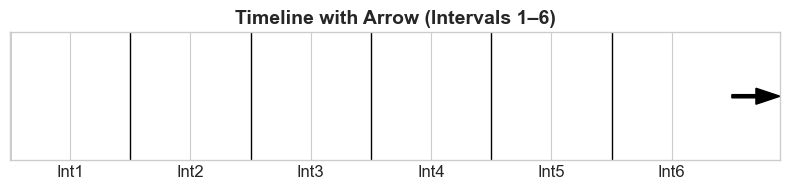

In [46]:
import matplotlib.pyplot as plt
from matplotlib.patches import FancyArrow

fig, ax = plt.subplots(figsize=(8, 2))

# Setup timeline axis
ax.set_xlim(0.5, 6.9)
ax.set_ylim(-1, 1)

# Vertical separators for 6 intervals
for i in range(1, 7):
    ax.axvline(i - 0.5, color="k", lw=1)

# Arrow at the end (time direction)
arrow = FancyArrow(6.5, 0, 0.4, 0, 
                   width=0.05, length_includes_head=True, 
                   head_width=0.25, head_length=0.2, 
                   color="black")
ax.add_patch(arrow)

# Labels for intervals
ax.set_xticks(range(1, 7))
ax.set_xticklabels([f"Int{i}" for i in range(1, 7)], fontsize=12)

# Hide y-axis (only timeline matters)
ax.get_yaxis().set_visible(False)

# Title
ax.set_title("Timeline with Arrow (Intervals 1–6)", fontsize=14, fontweight="bold")

plt.tight_layout()
plt.show()

In [30]:
df.to_csv("Streamlit.csv", index=False)

# Similarity Method

In [31]:
# Similarity-based mapping of 'unidentified' matches to a suspicion type
# Approach: Prototype (class centroid) similarity on standardized features + optional kNN check
# Output: df['MatchSuspicionType_Pred'], df['Pred_Confidence'], per-class similarity columns

import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import f1_score, accuracy_score
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances
from sklearn.neighbors import NearestNeighbors

# ---------------------------
# CONFIG
# ---------------------------
LABEL_COL = 'MatchSuspicionType'
CAT_COLS = ['Relative quality']  # will be one-hot encoded
# Columns to drop (IDs, text, data leakage, etc.). Add as needed.
DROP_COLS = ['xG_A_ChangePct', 'xG_H_ChangePct', 'StrongerTeam_xG_Diff', 'StrongerTeam_xG' ]

# choose metric: 'cosine' or 'euclidean'
SIMILARITY_METRIC = 'cosine'
# optional kNN post-check (set to 0 to disable)
KNN_K = 11

# ---------------------------
# FEATURE MATRIX
# ---------------------------
def make_features(df: pd.DataFrame) -> (pd.DataFrame, pd.Series, pd.Index):
    X = df.copy()

    # One-hot encode categorical cols (minimal set)
    if CAT_COLS:
        X = pd.get_dummies(X, columns=[c for c in CAT_COLS if c in X.columns], drop_first=False)

    # Drop non-feature columns if present
    for c in DROP_COLS:
        if c in X.columns:
            X = X.drop(columns=c)

    # Keep numeric only (after dummies they are numeric)
    X = X.select_dtypes(include=[np.number]).copy()

    # y labels (from original df)
    y = df[LABEL_COL].astype(str) if LABEL_COL in df.columns else pd.Series(index=df.index, dtype=str)

    return X, y, X.columns

X_all, y_all, feat_cols = make_features(df)

# Identify labeled vs unidentified
mask_unidentified = (y_all.str.lower().str.strip() == 'unidentified')
mask_labeled = ~mask_unidentified

X_labeled = X_all.loc[mask_labeled].copy()
y_labeled = y_all.loc[mask_labeled].copy()
X_unlabeled = X_all.loc[mask_unidentified].copy()

# ---------------------------
# SCALING
# ---------------------------
scaler = StandardScaler()
X_labeled_std = pd.DataFrame(scaler.fit_transform(X_labeled), index=X_labeled.index, columns=feat_cols)
X_unlabeled_std = pd.DataFrame(scaler.transform(X_unlabeled), index=X_unlabeled.index, columns=feat_cols)

# ---------------------------
# CLASS PROTOTYPES (CENTROIDS)
# ---------------------------
classes = y_labeled.unique()
classes = [c for c in classes if c != 'unidentified']  # safety
centroids = {}
for c in classes:
    centroids[c] = X_labeled_std[y_labeled == c].mean(axis=0).values  # 1D np array

centroid_matrix = np.vstack([centroids[c] for c in classes])  # shape: (num_classes, num_features)

# ---------------------------
# SIMILARITY / DISTANCE TO PROTOTYPES
# ---------------------------
def prototype_scores(X_std: pd.DataFrame, centroid_matrix: np.ndarray, classes: list, metric: str = 'cosine'):
    # Returns: scores DataFrame (higher is better for similarity), best class, confidence
    if metric == 'cosine':
        # cosine_similarity returns (n_samples x n_classes) when comparing to centroid matrix
        sims = cosine_similarity(X_std.values, centroid_matrix)  # higher is better
        scores = pd.DataFrame(sims, index=X_std.index, columns=[f'sim_{c}' for c in classes])
        # confidence via softmax over similarities
        exp_s = np.exp(sims - sims.max(axis=1, keepdims=True))
        conf = (exp_s / exp_s.sum(axis=1, keepdims=True)).max(axis=1)
        best_idx = sims.argmax(axis=1)
    elif metric == 'euclidean':
        dists = euclidean_distances(X_std.values, centroid_matrix)  # lower is better
        # convert to similarity via inverse (avoid div by 0)
        sims = 1.0 / (1.0 + dists)
        scores = pd.DataFrame(sims, index=X_std.index, columns=[f'sim_{c}' for c in classes])
        exp_s = np.exp(sims - sims.max(axis=1, keepdims=True))
        conf = (exp_s / exp_s.sum(axis=1, keepdims=True)).max(axis=1)
        best_idx = sims.argmax(axis=1)
    else:
        raise ValueError("metric must be 'cosine' or 'euclidean'")
    best_classes = [classes[i] for i in best_idx]
    return scores, pd.Series(best_classes, index=X_std.index, name='PredClass'), pd.Series(conf, index=X_std.index, name='PredConfidence')

scores_proto, pred_proto, conf_proto = prototype_scores(X_unlabeled_std, centroid_matrix, classes, SIMILARITY_METRIC)

# ---------------------------
# OPTIONAL: kNN sanity check (on labeled set)
# ---------------------------
def knn_predict_labels(X_train, y_train, X_query, k=11, metric='cosine'):
    if k <= 0:
        return pd.Series(index=X_query.index, dtype=object), pd.Series(index=X_query.index, dtype=float)
    # Fit kNN
    nn = NearestNeighbors(n_neighbors=min(k, len(X_train)), metric=('cosine' if metric=='cosine' else 'minkowski'))
    nn.fit(X_train.values)
    dists, idxs = nn.kneighbors(X_query.values)
    # For cosine metric, distances are cosine distance (1 - cosine sim). Convert to weights ~ similarity
    if metric == 'cosine':
        sims = 1.0 - dists
        sims[sims < 0] = 0
        weights = sims
    else:
        # for euclidean, weight by inverse distance
        weights = 1.0 / (1.0 + dists)
    preds = []
    confs = []
    y_train_arr = y_train.values
    for i in range(len(X_query)):
        neigh_idx = idxs[i]
        neigh_labels = y_train_arr[neigh_idx]
        neigh_w = weights[i]
        # aggregate weights per class
        class_w = {}
        for lab, w in zip(neigh_labels, neigh_w):
            class_w[lab] = class_w.get(lab, 0.0) + w
        # best class and confidence
        best_lab = max(class_w, key=class_w.get)
        total = sum(class_w.values())
        conf = (class_w[best_lab] / total) if total > 0 else 0.0
        preds.append(best_lab)
        confs.append(conf)
    return pd.Series(preds, index=X_query.index, name='kNN_Pred'), pd.Series(confs, index=X_query.index, name='kNN_Confidence')

knn_pred, knn_conf = knn_predict_labels(X_labeled_std, y_labeled, X_unlabeled_std, k=KNN_K, metric=SIMILARITY_METRIC)

# ---------------------------
# FUSE PROTOTYPE + KNN (simple rule)
# ---------------------------
# If kNN agrees with prototype → take it and average confidence
# Else keep prototype (or choose the one with higher confidence)
if KNN_K > 0 and len(knn_pred) == len(pred_proto):
    fused_pred = pred_proto.copy()
    fused_conf = conf_proto.copy()
    agree_mask = (pred_proto == knn_pred)
    fused_pred[agree_mask] = pred_proto[agree_mask]
    fused_conf[agree_mask] = (conf_proto[agree_mask] + knn_conf[agree_mask]) / 2.0
    # where disagree, keep higher-confidence between proto vs knn
    disagree_idx = fused_pred.index[~agree_mask]
    for i in disagree_idx:
        if knn_conf.loc[i] > conf_proto.loc[i]:
            fused_pred.loc[i] = knn_pred.loc[i]
            fused_conf.loc[i] = knn_conf.loc[i]
else:
    fused_pred, fused_conf = pred_proto, conf_proto

# ---------------------------
# ATTACH PREDICTIONS BACK TO DF
# ---------------------------
df.loc[mask_unidentified, 'MatchSuspicionType_Pred'] = fused_pred
df.loc[mask_unidentified, 'Pred_Confidence'] = fused_conf.round(3)

# Add per-class prototype similarity columns for transparency
for col in scores_proto.columns:
    df.loc[mask_unidentified, col] = scores_proto[col].round(4)

# ---------------------------
# OPTIONAL: QUICK CV EVALUATION ON LABELED DATA (how good nearest-prototype is)
# ---------------------------
def eval_nearest_prototype_cv(X, y, n_splits=5, metric='cosine'):
    skf = StratifiedKFold(n_splits=n_splits, shuffle=True, random_state=42)
    accs, f1s = [], []
    for tr, te in skf.split(X, y):
        Xtr, Xte = X.iloc[tr], X.iloc[te]
        ytr, yte = y.iloc[tr], y.iloc[te]
        # scale inside each fold to avoid leakage
        sc = StandardScaler()
        Xtr_s = pd.DataFrame(sc.fit_transform(Xtr), index=Xtr.index, columns=X.columns)
        Xte_s = pd.DataFrame(sc.transform(Xte), index=Xte.index, columns=X.columns)
        # centroids
        clz = sorted(ytr.unique())
        C = np.vstack([Xtr_s[ytr==c].mean(axis=0).values for c in clz])
        # predict
        scores, pred, _ = prototype_scores(Xte_s, C, clz, metric)
        accs.append(accuracy_score(yte, pred))
        f1s.append(f1_score(yte, pred, average='macro'))
    return np.mean(accs), np.mean(f1s)

# Uncomment to run evaluation on labeled subset:
# acc, f1 = eval_nearest_prototype_cv(X_labeled, y_labeled, n_splits=5, metric=SIMILARITY_METRIC)
# print(f"[CV] Nearest-Prototype ({SIMILARITY_METRIC})  Acc={acc:.3f}  MacroF1={f1:.3f}")

# ---------------------------
# OUTPUT PREVIEW
# ---------------------------
# Preview top-10 newly mapped unidentified matches with similarities
preview_cols = ['MatchSuspicionType_Pred','Pred_Confidence'] + [c for c in df.columns if c.startswith('sim_')]
print(df.loc[mask_unidentified, preview_cols].head(10))

  MatchSuspicionType_Pred  Pred_Confidence  sim_both not suspicious  \
0     both not suspicious            0.617                   0.1198   
1     both not suspicious            0.761                   0.1266   
2     both not suspicious            0.556                  -0.1045   
3     both not suspicious            0.646                   0.1638   
4     both not suspicious            0.516                   0.5242   
5     both not suspicious            0.610                  -0.1733   
6     both not suspicious            0.545                   0.1567   
7     both not suspicious            0.488                   0.5241   
8     both not suspicious            0.750                   0.1205   
9     both not suspicious            0.622                   0.4162   

   sim_home suspicious  sim_both suspicious  sim_away suspicious  
0              -0.2981              -0.0991               0.2105  
1              -0.1431               0.4432              -0.1452  
2               0

In [111]:
# ---------------------------
# SUMMARY REPORT
# ---------------------------

# Filter only mapped unidentified rows
mapped_df = df.loc[mask_unidentified, ['MatchSuspicionType_Pred', 'Pred_Confidence']]

total_mapped = len(mapped_df)
print(f"\n===== Similarity Mapping Summary =====")
print(f"Total unidentified matches mapped: {total_mapped}\n")

# Counts per predicted type
counts_per_type = mapped_df['MatchSuspicionType_Pred'].value_counts().sort_values(ascending=False)
print("Counts per predicted MatchSuspicionType:")
print(counts_per_type)

# Percentage breakdown
print("\nPercentage breakdown:")
print((counts_per_type / total_mapped * 100).round(2).astype(str) + "%")

# Average confidence per predicted type
avg_conf_per_type = mapped_df.groupby('MatchSuspicionType_Pred')['Pred_Confidence'].mean().round(3)
print("\nAverage prediction confidence per type:")
print(avg_conf_per_type)

# Overall average confidence
print(f"\nOverall average confidence: {mapped_df['Pred_Confidence'].mean():.3f}")

# Top 10 most confident predictions
print("\nTop 10 most confident mapped matches:")
print(mapped_df.sort_values('Pred_Confidence', ascending=False).head(10))


===== Similarity Mapping Summary =====
Total unidentified matches mapped: 5082

Counts per predicted MatchSuspicionType:
MatchSuspicionType_Pred
both not suspicious    3826
away suspicious         705
home suspicious         495
both suspicious          56
Name: count, dtype: int64

Percentage breakdown:
MatchSuspicionType_Pred
both not suspicious    75.29%
away suspicious        13.87%
home suspicious         9.74%
both suspicious          1.1%
Name: count, dtype: object

Average prediction confidence per type:
MatchSuspicionType_Pred
away suspicious        0.428
both not suspicious    0.554
both suspicious        0.345
home suspicious        0.418
Name: Pred_Confidence, dtype: float64

Overall average confidence: 0.521

Top 10 most confident mapped matches:
     MatchSuspicionType_Pred  Pred_Confidence
3519     both not suspicious            0.928
41       both not suspicious            0.927
2773     both not suspicious            0.899
3820     both not suspicious            0.868

In [112]:
# Random Forest classifier for MatchSuspicionType with robust preprocessing and reporting
# - Trains on labeled rows (excluding 'unidentified')
# - OneHot-encodes categorical features (e.g., Relative quality)
# - Imputes missing values
# - Evaluates on a holdout set + 5-fold CV
# - Predicts labels + confidences for unidentified rows
# - Prints distribution summaries and feature importances
# NOTE: Assumes `df` is already defined in the environment.

import numpy as np
import pandas as pd

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.inspection import permutation_importance

# -------------------------------
# 0) CONFIG
# -------------------------------
TARGET = 'MatchSuspicionType'
# Columns to exclude from features (IDs, raw text, label, and leakage-prone flags)
EXCLUDE_BASE = {
    TARGET, 'home team', 'away team',
    'HomeTeamSuspicious', 'AwayTeamSuspicious',
    'HomeTeamNotSuspicious', 'AwayTeamNotSuspicious',
    'MatchSuspicionType_Pred', 'Pred_Confidence',
    'MatchSuspicionType_RF_Pred', 'MatchSuspicionType_RF_Conf'
}

# If your df has similarity columns like 'sim_*', we'll exclude them automatically below.

RANDOM_STATE = 42
TEST_SIZE = 0.2
N_ESTIMATORS = 400
CV_FOLDS = 5

# -------------------------------
# 1) CLEAN TARGET + SPLIT KNOWN/UNKNOWN
# -------------------------------
df[TARGET] = df[TARGET].astype(str).str.strip().str.lower()
known_df  = df[df[TARGET] != 'unidentified'].copy()
unknown_df = df[df[TARGET] == 'unidentified'].copy()

# Determine features to use
all_cols = set(df.columns)
sim_cols = {c for c in all_cols if c.startswith('sim_')}
EXCLUDE = EXCLUDE_BASE.union(sim_cols)

feature_cols = [c for c in df.columns if c not in EXCLUDE]
X_known = known_df[feature_cols].copy()
y_known = known_df[TARGET].copy()
X_unknown = unknown_df[feature_cols].copy() if not unknown_df.empty else pd.DataFrame(columns=feature_cols)

# Identify dtypes
cat_cols = X_known.select_dtypes(include=['object', 'category']).columns.tolist()
num_cols = [c for c in X_known.columns if c not in cat_cols]

# -------------------------------
# 2) PREPROCESSOR + MODEL PIPELINE
# -------------------------------
numeric_pre = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
])

# Handle OneHotEncoder sparse kwarg across sklearn versions
try:
    ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
except TypeError:
    # for older sklearn, fallback to 'sparse=False'
    ohe = OneHotEncoder(handle_unknown='ignore', sparse=False)

categorical_pre = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('onehot', ohe)
])

preprocess = ColumnTransformer(
    transformers=[
        ('num', numeric_pre, num_cols),
        ('cat', categorical_pre, cat_cols),
    ],
    remainder='drop',
    verbose_feature_names_out=False
)

rf = RandomForestClassifier(
    n_estimators=N_ESTIMATORS,
    max_depth=None,
    min_samples_split=2,
    min_samples_leaf=1,
    max_features='sqrt',
    class_weight='balanced',
    n_jobs=-1,
    random_state=RANDOM_STATE
)

pipe = Pipeline(steps=[
    ('prep', preprocess),
    ('rf', rf)
])

# -------------------------------
# 3) TRAIN/TEST SPLIT + TRAIN
# -------------------------------
X_tr, X_te, y_tr, y_te = train_test_split(
    X_known, y_known, test_size=TEST_SIZE, stratify=y_known, random_state=RANDOM_STATE
)

pipe.fit(X_tr, y_tr)

# -------------------------------
# 4) EVALUATION (HOLDOUT + CV)
# -------------------------------
y_pred = pipe.predict(X_te)
print("\n=== Classification Report (Holdout) ===")
print(classification_report(y_te, y_pred, digits=3))

print("\n=== Confusion Matrix (Holdout) ===")
print(confusion_matrix(y_te, y_pred))

cv_acc = cross_val_score(pipe, X_known, y_known, cv=CV_FOLDS, scoring='accuracy', n_jobs=-1)
print(f"\n{CV_FOLDS}-Fold CV Accuracy: {cv_acc.mean():.4f} (+/- {cv_acc.std():.4f})")

# -------------------------------
# 5) FIT ON ALL KNOWN + PREDICT UNKNOWN
# -------------------------------
pipe.fit(X_known, y_known)

if not X_unknown.empty:
    unk_pred  = pipe.predict(X_unknown)
    unk_proba = pipe.predict_proba(X_unknown)
    unk_conf  = unk_proba.max(axis=1)

    unknown_df['Predicted_MatchSuspicionType'] = unk_pred
    unknown_df['Prediction_Confidence'] = unk_conf

    # Attach back to df
    df.loc[unknown_df.index, 'MatchSuspicionType_RF_Pred'] = unknown_df['Predicted_MatchSuspicionType']
    df.loc[unknown_df.index, 'MatchSuspicionType_RF_Conf'] = unknown_df['Prediction_Confidence'].round(3)

    # Summary
    print("\n=== Predicted Distribution for Unidentified Matches ===")
    pred_counts = unknown_df['Predicted_MatchSuspicionType'].value_counts().sort_values(ascending=False)
    pred_pct = (pred_counts / len(unknown_df) * 100).round(2)
    print(pd.DataFrame({'Count': pred_counts, 'Percentage': pred_pct.map(lambda x: f"{x}%")}))

    print(f"\nOverall mean prediction confidence: {unknown_df['Prediction_Confidence'].mean():.3f}")

    print("\nTop 10 Most Confident Predictions (unidentified):")
    print(unknown_df.sort_values('Prediction_Confidence', ascending=False)
          [['Predicted_MatchSuspicionType', 'Prediction_Confidence']].head(10))
else:
    print("\nNo unidentified rows to predict.")

# -------------------------------
# 6) FEATURE NAMES (ROBUST) + IMPORTANCES
# -------------------------------
def safe_feature_names_from_ct(column_transformer):
    """
    Returns output feature names after ColumnTransformer.
    Tries .get_feature_names_out(); falls back to inspecting transformers_.
    """
    try:
        return column_transformer.get_feature_names_out().tolist()
    except Exception:
        names = []
        for name, trans, cols in column_transformer.transformers_:
            if name == 'remainder' and trans == 'drop':
                continue
            if hasattr(trans, 'get_feature_names_out'):
                try:
                    out = trans.get_feature_names_out(cols)
                except Exception:
                    if hasattr(trans, 'named_steps') and 'onehot' in trans.named_steps:
                        ohe = trans.named_steps['onehot']
                        out = ohe.get_feature_names_out(cols)
                    else:
                        out = np.array(cols, dtype=object)
            else:
                out = np.array(cols, dtype=object)
            names.extend([f"{name}__{c}" for c in out])
        return names

prep = pipe.named_steps['prep']
rf_model = pipe.named_steps['rf']

feat_names = safe_feature_names_from_ct(prep)
importances = rf_model.feature_importances_
min_len = min(len(feat_names), len(importances))
feat_imp = (pd.DataFrame({
    'feature': feat_names[:min_len],
    'importance': importances[:min_len]
})
.sort_values('importance', ascending=False))

print("\n=== Top 25 Feature Importances (RandomForest) ===")
print(feat_imp.head(25).to_string(index=False))

# -------------------------------
# 7) PERMUTATION IMPORTANCE (HOLDOUT) — OPTIONAL
# -------------------------------
try:
    pi = permutation_importance(pipe, X_te, y_te, n_repeats=10, random_state=RANDOM_STATE, n_jobs=-1)
    pi_names = safe_feature_names_from_ct(prep)
    min_len_pi = min(len(pi_names), pi.importances_mean.shape[0])
    pi_imp = (pd.DataFrame({
        'feature': pi_names[:min_len_pi],
        'perm_importance_mean': pi.importances_mean[:min_len_pi],
        'perm_importance_std':  pi.importances_std[:min_len_pi]
    })
    .sort_values('perm_importance_mean', ascending=False))
    print("\n=== Top 25 Permutation Importances (Holdout) ===")
    print(pi_imp.head(25).to_string(index=False))
except Exception as e:
    print(f"\nPermutation importance skipped: {e}")

# -------------------------------
# 8) OPTIONAL: SAVE OUTPUTS
# -------------------------------
# feat_imp.head(100).to_csv("rf_feature_importances.csv", index=False)
# if not X_unknown.empty:
#     unknown_df[['Predicted_MatchSuspicionType','Prediction_Confidence']].to_csv("rf_unidentified_predictions.csv", index=True)


=== Classification Report (Holdout) ===
                     precision    recall  f1-score   support

    away suspicious      0.000     0.000     0.000         4
both not suspicious      0.588     1.000     0.741        10
    both suspicious      0.000     0.000     0.000         1
    home suspicious      0.000     0.000     0.000         3

           accuracy                          0.556        18
          macro avg      0.147     0.250     0.185        18
       weighted avg      0.327     0.556     0.412        18


=== Confusion Matrix (Holdout) ===
[[ 0  4  0  0]
 [ 0 10  0  0]
 [ 0  0  0  1]
 [ 0  3  0  0]]


/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/opt/anaconda3/lib/python3.11/site-pa


5-Fold CV Accuracy: 0.5778 (+/- 0.0852)

=== Predicted Distribution for Unidentified Matches ===
                              Count Percentage
Predicted_MatchSuspicionType                  
both not suspicious            4701      92.5%
away suspicious                 298      5.86%
home suspicious                  83      1.63%

Overall mean prediction confidence: 0.647

Top 10 Most Confident Predictions (unidentified):
     Predicted_MatchSuspicionType  Prediction_Confidence
621           both not suspicious                 0.9250
3892          both not suspicious                 0.9225
323           both not suspicious                 0.9150
1347          both not suspicious                 0.9125
3364          both not suspicious                 0.9125
2610          both not suspicious                 0.9100
3641          both not suspicious                 0.9050
3423          both not suspicious                 0.9000
4839          both not suspicious                 0.9000
455

- Pattern discovery, When a team is flagged?
- Stronger but, they are playing away, Fans are contributed as well.
- Machine Learning Supervised Task


- After Coach Talk and after having distance from the time coach have talked to teams.|